In [ ]:
!pip install kagglehub

In [ ]:
import kagglehub

path = kagglehub.dataset_download("paultimothymooney/chest-xray-pneumonia")

print("Path to dataset files:", path)

In [24]:
import os

data_dir = 'ch8_data/chest_xray/test/NORMAL'
image_files = os.listdir(data_dir)

print(f"Number of images found: {len(image_files)}")
print(image_files[:10])  # Show the first 10 images


Number of images found: 234
['IM-0019-0001.jpeg', 'NORMAL2-IM-0059-0001.jpeg', 'NORMAL2-IM-0130-0001.jpeg', 'NORMAL2-IM-0233-0001.jpeg', 'IM-0069-0001.jpeg', 'IM-0083-0001.jpeg', 'NORMAL2-IM-0283-0001.jpeg', 'NORMAL2-IM-0219-0001.jpeg', 'NORMAL2-IM-0374-0001-0002.jpeg', 'NORMAL2-IM-0098-0001.jpeg']


(234, 64, 64, 3)


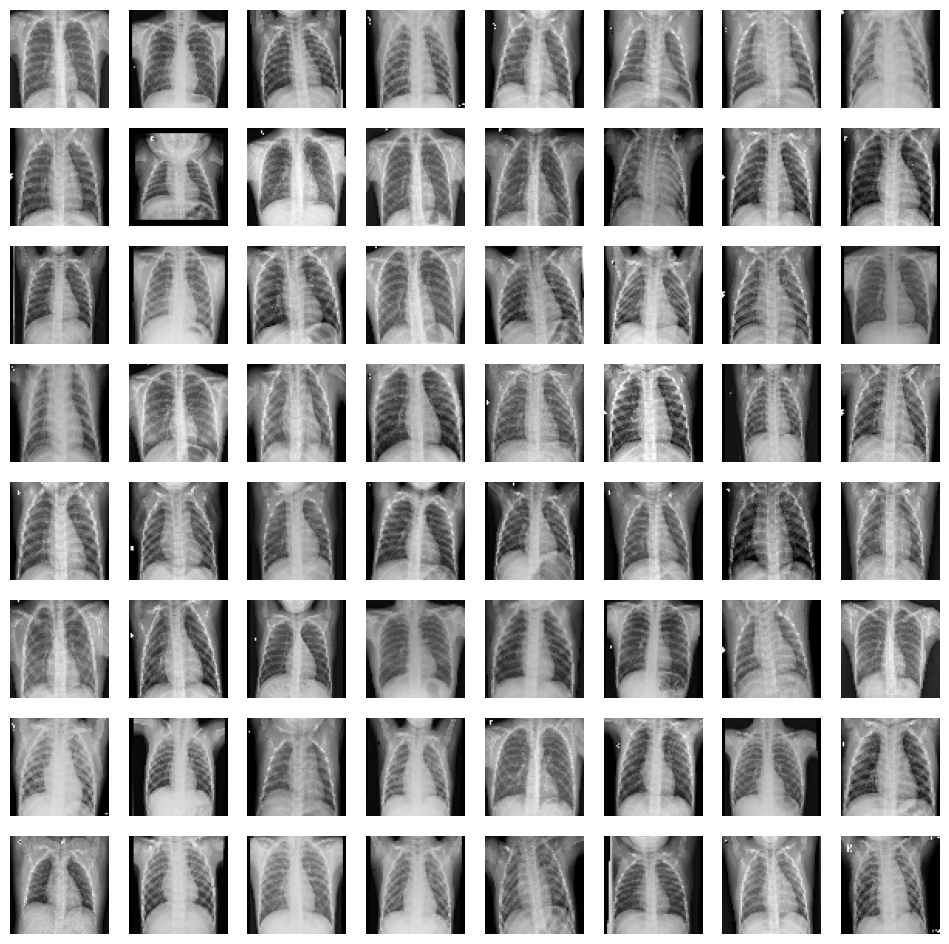

In [82]:
import os
import cv2
import numpy as np
import pathlib
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LayerNormalization, LeakyReLU, Dropout, Dense

class ReadDataset:
    def __init__(self, data_dir, image_shape):
        self.data_dir = data_dir
        self.image_shape = image_shape

    def readImages(self):
        # List all images in the directory
        image_paths = list(pathlib.Path(self.data_dir).glob('*.*'))
        images = []
        for img_path in image_paths:
            img = cv2.imread(str(img_path))
            img = cv2.resize(img, self.image_shape)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = img / 255.0  # Normalize to [0, 1]
            images.append(img)
        images = np.array(images)
        return images

# Use the modified dataset loader
readDatasetObject = ReadDataset('ch8_data/chest_xray/test/NORMAL', (64, 64))
images = readDatasetObject.readImages()
print(images.shape)

# Verify by plotting some sample images
plt.figure(figsize=(12, 12))
for i in range(64):
    plt.subplot(8, 8, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
plt.show()


In [95]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
import matplotlib.pyplot as plt

# Reset TensorFlow to clear any session or state-related issues
tf.keras.backend.clear_session()

class DebugGAN:
    def __init__(self, batch_size, latent_space, image_shape, kernel_size):
        self.batch_size = batch_size
        self.latent_space = latent_space
        self.image_shape = image_shape
        self.kernel_size = kernel_size

    def data(self, images):
        # Store the images for training
        self.images = images

    def build_discriminator(self):
        # Build the discriminator model
        inputs = layers.Input(shape=self.image_shape)
        x = layers.Conv2D(64, kernel_size=self.kernel_size, strides=2, padding='same')(inputs)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Conv2D(128, kernel_size=self.kernel_size, strides=2, padding='same')(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Flatten()(x)
        outputs = layers.Dense(1, activation='sigmoid')(x)  # Sigmoid for binary classification

        # Create the model
        self.discriminator = models.Model(inputs, outputs)
        # Compile it
        self.discriminator.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
        return self.discriminator

    def train_discriminator(self):
        # Loop through one epoch of training for the discriminator
        for epoch in range(1):
            # Randomly select a batch of real images
            indices = np.random.randint(0, len(self.images), size=self.batch_size)
            real_images = self.images[indices]
            real_labels = np.ones((self.batch_size, 1))

            # Generate random noise for the generator
            noise = np.random.normal(0, 1, (self.batch_size, self.latent_space))
            # For now, let's fake some random "fake" images to debug
            fake_images = np.random.rand(self.batch_size, *self.image_shape)  # Random fake images
            fake_labels = np.zeros((self.batch_size, 1))

            # Print shapes for debugging
            print(f"Real images shape: {real_images.shape}, Fake images shape: {fake_images.shape}")
            print(f"Real labels shape: {real_labels.shape}, Fake labels shape: {fake_labels.shape}")

            # Combine real and fake images
            combined_images = np.vstack([real_images, fake_images])
            combined_labels = np.vstack([real_labels, fake_labels])

            # Print combined shapes for further debugging
            print(f"Combined images shape: {combined_images.shape}, Combined labels shape: {combined_labels.shape}")

            # Train the discriminator on the combined images
            d_loss, d_acc = self.discriminator.train_on_batch(combined_images, combined_labels)

            # Output the loss and accuracy for debugging
            print(f"Discriminator loss: {d_loss}, accuracy: {d_acc}")

# Instantiate the debug GAN class
debug_gan = DebugGAN(batch_size=32, latent_space=100, image_shape=(64, 64, 3), kernel_size=5)

# Load some dummy data for debugging (assuming 'images' is your dataset)
images = np.random.rand(1000, 64, 64, 3)  # Dummy images, replace with actual dataset

# Pass the data to the GAN class
debug_gan.data(images)

# Build the discriminator and print the summary
discriminator = debug_gan.build_discriminator()
discriminator.summary()

# Train the discriminator for one epoch (debugging phase)
debug_gan.train_discriminator()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 64, 64, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │        32,769 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 242,561 (947.50 KB)

 Trainable params: 242,561 (947.50 KB)

 Non-trainable params: 0 (0.00 B)

Real images shape: (32, 64, 64, 3), Fake images shape: (32, 64, 64, 3)
Real labels shape: (32, 1), Fake labels shape: (32, 1)
Combined images shape: (64, 64, 64, 3), Combined labels shape: (64, 1)
Discriminator loss: 0.6942064762115479, accuracy: 0.515625


Epoch 1, Generator Loss: 0.6789, Discriminator Loss: 1.3978
Epoch 2, Generator Loss: 0.7182, Discriminator Loss: 1.3706
Epoch 3, Generator Loss: 0.7325, Discriminator Loss: 1.3534
Epoch 4, Generator Loss: 0.7355, Discriminator Loss: 1.3285
Epoch 5, Generator Loss: 0.7356, Discriminator Loss: 1.3076
Epoch 6, Generator Loss: 0.7377, Discriminator Loss: 1.2868
Epoch 7, Generator Loss: 0.7408, Discriminator Loss: 1.2649
Epoch 8, Generator Loss: 0.7502, Discriminator Loss: 1.2528
Epoch 9, Generator Loss: 0.7634, Discriminator Loss: 1.2292
Epoch 10, Generator Loss: 0.7817, Discriminator Loss: 1.1970


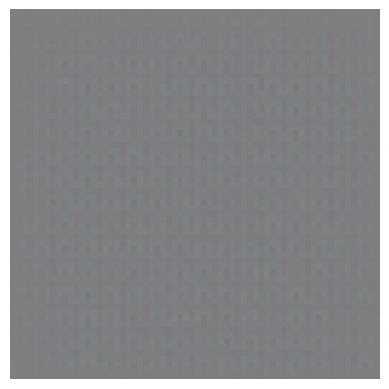

Epoch 11, Generator Loss: 0.8046, Discriminator Loss: 1.1714
Epoch 12, Generator Loss: 0.8298, Discriminator Loss: 1.1401
Epoch 13, Generator Loss: 0.8561, Discriminator Loss: 1.1084
Epoch 14, Generator Loss: 0.8774, Discriminator Loss: 1.0808
Epoch 15, Generator Loss: 0.8931, Discriminator Loss: 1.0423
Epoch 16, Generator Loss: 0.9101, Discriminator Loss: 1.0007
Epoch 17, Generator Loss: 0.9354, Discriminator Loss: 0.9571
Epoch 18, Generator Loss: 0.9734, Discriminator Loss: 0.9225
Epoch 19, Generator Loss: 1.0150, Discriminator Loss: 0.8744
Epoch 20, Generator Loss: 1.0627, Discriminator Loss: 0.8334


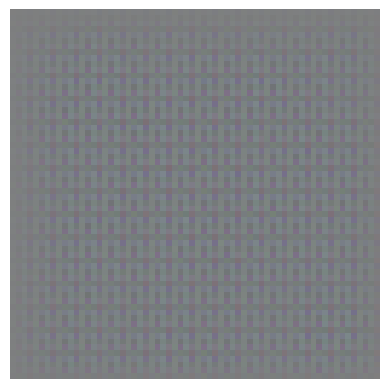

Epoch 21, Generator Loss: 1.1040, Discriminator Loss: 0.7816
Epoch 22, Generator Loss: 1.1607, Discriminator Loss: 0.7433
Epoch 23, Generator Loss: 1.2081, Discriminator Loss: 0.6878
Epoch 24, Generator Loss: 1.2674, Discriminator Loss: 0.6404
Epoch 25, Generator Loss: 1.3261, Discriminator Loss: 0.5965
Epoch 26, Generator Loss: 1.3929, Discriminator Loss: 0.5512
Epoch 27, Generator Loss: 1.4677, Discriminator Loss: 0.5131
Epoch 28, Generator Loss: 1.5244, Discriminator Loss: 0.4663
Epoch 29, Generator Loss: 1.6160, Discriminator Loss: 0.4184
Epoch 30, Generator Loss: 1.6835, Discriminator Loss: 0.3841


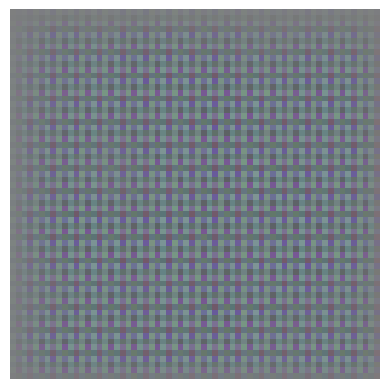

Epoch 31, Generator Loss: 1.7849, Discriminator Loss: 0.3522
Epoch 32, Generator Loss: 1.8612, Discriminator Loss: 0.3168
Epoch 33, Generator Loss: 1.9602, Discriminator Loss: 0.2810
Epoch 34, Generator Loss: 2.0578, Discriminator Loss: 0.2471
Epoch 35, Generator Loss: 2.1932, Discriminator Loss: 0.2186
Epoch 36, Generator Loss: 2.3049, Discriminator Loss: 0.1948
Epoch 37, Generator Loss: 2.4088, Discriminator Loss: 0.1692
Epoch 38, Generator Loss: 2.5134, Discriminator Loss: 0.1514
Epoch 39, Generator Loss: 2.6771, Discriminator Loss: 0.1284
Epoch 40, Generator Loss: 2.8896, Discriminator Loss: 0.1080


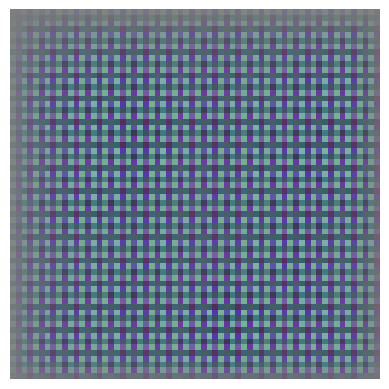

Epoch 41, Generator Loss: 3.0118, Discriminator Loss: 0.0905
Epoch 42, Generator Loss: 3.0770, Discriminator Loss: 0.0786
Epoch 43, Generator Loss: 3.2543, Discriminator Loss: 0.0651
Epoch 44, Generator Loss: 3.4888, Discriminator Loss: 0.0524
Epoch 45, Generator Loss: 3.6064, Discriminator Loss: 0.0454
Epoch 46, Generator Loss: 3.8605, Discriminator Loss: 0.0354
Epoch 47, Generator Loss: 3.9940, Discriminator Loss: 0.0302
Epoch 48, Generator Loss: 4.2594, Discriminator Loss: 0.0231
Epoch 49, Generator Loss: 4.4859, Discriminator Loss: 0.0183
Epoch 50, Generator Loss: 4.6663, Discriminator Loss: 0.0148


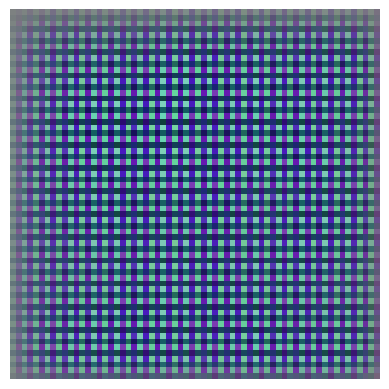

Epoch 51, Generator Loss: 4.8201, Discriminator Loss: 0.0125
Epoch 52, Generator Loss: 4.8572, Discriminator Loss: 0.0114
Epoch 53, Generator Loss: 4.9982, Discriminator Loss: 0.0099
Epoch 54, Generator Loss: 5.0586, Discriminator Loss: 0.0091
Epoch 55, Generator Loss: 5.0109, Discriminator Loss: 0.0089
Epoch 56, Generator Loss: 5.0532, Discriminator Loss: 0.0087
Epoch 57, Generator Loss: 5.0463, Discriminator Loss: 0.0087
Epoch 58, Generator Loss: 4.8970, Discriminator Loss: 0.0101
Epoch 59, Generator Loss: 4.9052, Discriminator Loss: 0.0099
Epoch 60, Generator Loss: 4.7370, Discriminator Loss: 0.0119


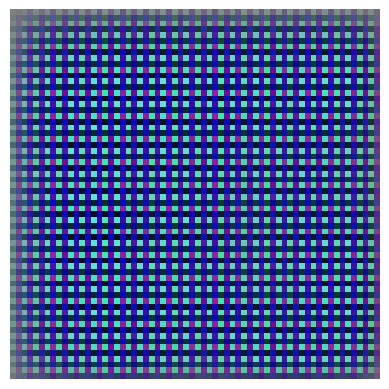

Epoch 61, Generator Loss: 4.8228, Discriminator Loss: 0.0115
Epoch 62, Generator Loss: 4.8411, Discriminator Loss: 0.0122
Epoch 63, Generator Loss: 4.7289, Discriminator Loss: 0.0153
Epoch 64, Generator Loss: 4.9176, Discriminator Loss: 0.0152
Epoch 65, Generator Loss: 4.9578, Discriminator Loss: 0.0150
Epoch 66, Generator Loss: 5.0146, Discriminator Loss: 0.0149
Epoch 67, Generator Loss: 4.9983, Discriminator Loss: 0.0146
Epoch 68, Generator Loss: 4.9381, Discriminator Loss: 0.0155
Epoch 69, Generator Loss: 4.9014, Discriminator Loss: 0.0129
Epoch 70, Generator Loss: 4.9371, Discriminator Loss: 0.0125


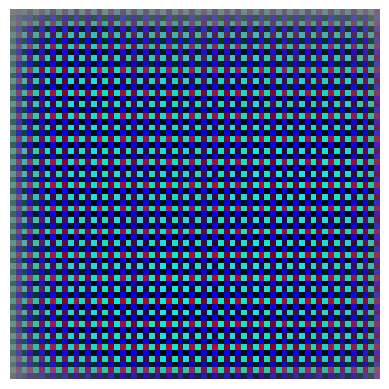

Epoch 71, Generator Loss: 5.0678, Discriminator Loss: 0.0097
Epoch 72, Generator Loss: 5.6279, Discriminator Loss: 0.0061
Epoch 73, Generator Loss: 6.0678, Discriminator Loss: 0.0041
Epoch 74, Generator Loss: 6.6940, Discriminator Loss: 0.0026
Epoch 75, Generator Loss: 7.1419, Discriminator Loss: 0.0019
Epoch 76, Generator Loss: 7.5640, Discriminator Loss: 0.0014
Epoch 77, Generator Loss: 7.9231, Discriminator Loss: 0.0010
Epoch 78, Generator Loss: 8.2492, Discriminator Loss: 0.0007
Epoch 79, Generator Loss: 8.4429, Discriminator Loss: 0.0006
Epoch 80, Generator Loss: 8.4784, Discriminator Loss: 0.0005


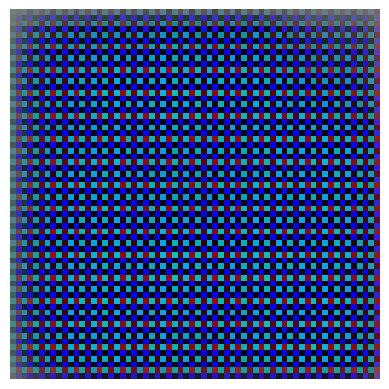

Epoch 81, Generator Loss: 8.4893, Discriminator Loss: 0.0004
Epoch 82, Generator Loss: 8.1754, Discriminator Loss: 0.0005
Epoch 83, Generator Loss: 7.5765, Discriminator Loss: 0.0007
Epoch 84, Generator Loss: 6.9499, Discriminator Loss: 0.0011
Epoch 85, Generator Loss: 6.2642, Discriminator Loss: 0.0021
Epoch 86, Generator Loss: 5.5038, Discriminator Loss: 0.0042
Epoch 87, Generator Loss: 4.7871, Discriminator Loss: 0.0085
Epoch 88, Generator Loss: 4.3300, Discriminator Loss: 0.0134
Epoch 89, Generator Loss: 4.1995, Discriminator Loss: 0.0153
Epoch 90, Generator Loss: 4.3609, Discriminator Loss: 0.0131


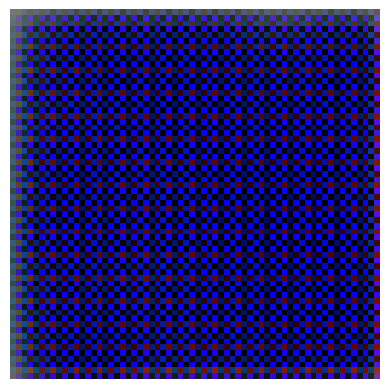

Epoch 91, Generator Loss: 4.7236, Discriminator Loss: 0.0094
Epoch 92, Generator Loss: 5.1908, Discriminator Loss: 0.0065
Epoch 93, Generator Loss: 5.5870, Discriminator Loss: 0.0059
Epoch 94, Generator Loss: 5.8316, Discriminator Loss: 0.0073
Epoch 95, Generator Loss: 6.0454, Discriminator Loss: 0.0088
Epoch 96, Generator Loss: 5.9729, Discriminator Loss: 0.0092
Epoch 97, Generator Loss: 5.6970, Discriminator Loss: 0.0071
Epoch 98, Generator Loss: 4.9725, Discriminator Loss: 0.0110
Epoch 99, Generator Loss: 4.2178, Discriminator Loss: 0.0196
Epoch 100, Generator Loss: 3.2817, Discriminator Loss: 0.0463


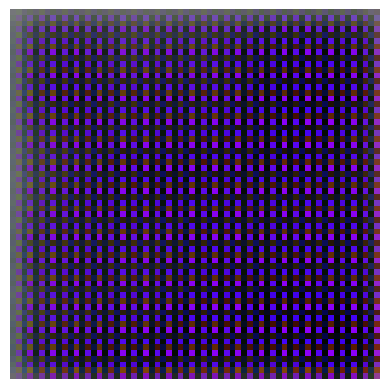

Epoch 101, Generator Loss: 2.6141, Discriminator Loss: 0.0910
Epoch 102, Generator Loss: 2.1344, Discriminator Loss: 0.1393
Epoch 103, Generator Loss: 1.6672, Discriminator Loss: 0.2853
Epoch 104, Generator Loss: 1.3589, Discriminator Loss: 0.5389
Epoch 105, Generator Loss: 1.1307, Discriminator Loss: 0.7920
Epoch 106, Generator Loss: 1.1274, Discriminator Loss: 0.6903
Epoch 107, Generator Loss: 1.9780, Discriminator Loss: 0.3131
Epoch 108, Generator Loss: 3.5897, Discriminator Loss: 0.0931
Epoch 109, Generator Loss: 4.8008, Discriminator Loss: 0.0240
Epoch 110, Generator Loss: 6.1069, Discriminator Loss: 0.0067


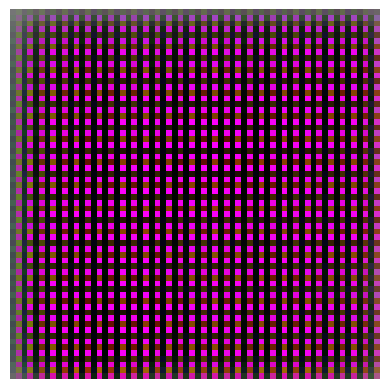

Epoch 111, Generator Loss: 7.1544, Discriminator Loss: 0.0021
Epoch 112, Generator Loss: 7.9521, Discriminator Loss: 0.0011
Epoch 113, Generator Loss: 9.0211, Discriminator Loss: 0.0004
Epoch 114, Generator Loss: 9.3582, Discriminator Loss: 0.0003
Epoch 115, Generator Loss: 9.8734, Discriminator Loss: 0.0004
Epoch 116, Generator Loss: 10.1098, Discriminator Loss: 0.0002
Epoch 117, Generator Loss: 8.2692, Discriminator Loss: 0.0034
Epoch 118, Generator Loss: 8.1612, Discriminator Loss: 0.0219
Epoch 119, Generator Loss: 6.4824, Discriminator Loss: 0.0140
Epoch 120, Generator Loss: 5.1953, Discriminator Loss: 0.1719


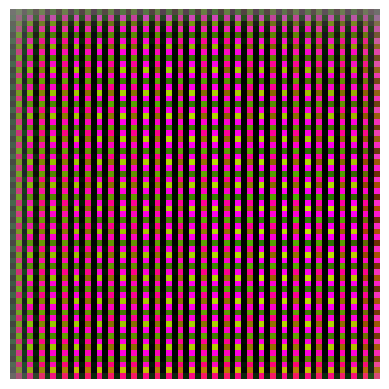

Epoch 121, Generator Loss: 4.2065, Discriminator Loss: 0.1462
Epoch 122, Generator Loss: 2.3009, Discriminator Loss: 0.3823
Epoch 123, Generator Loss: 2.6577, Discriminator Loss: 0.1271
Epoch 124, Generator Loss: 2.3284, Discriminator Loss: 0.1218
Epoch 125, Generator Loss: 2.5267, Discriminator Loss: 0.5767
Epoch 126, Generator Loss: 0.8164, Discriminator Loss: 1.1559
Epoch 127, Generator Loss: 0.3452, Discriminator Loss: 1.8496
Epoch 128, Generator Loss: 0.7316, Discriminator Loss: 1.2141
Epoch 129, Generator Loss: 1.1195, Discriminator Loss: 1.0914
Epoch 130, Generator Loss: 2.1957, Discriminator Loss: 0.4628


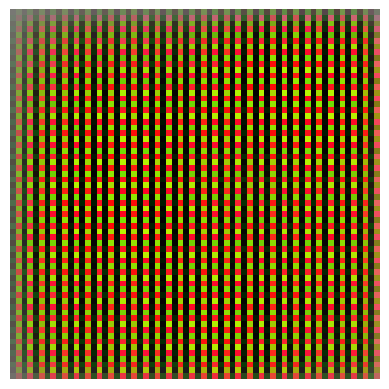

Epoch 131, Generator Loss: 3.3797, Discriminator Loss: 0.1424
Epoch 132, Generator Loss: 3.7336, Discriminator Loss: 0.0460
Epoch 133, Generator Loss: 4.3158, Discriminator Loss: 0.0175
Epoch 134, Generator Loss: 4.7393, Discriminator Loss: 0.0102
Epoch 135, Generator Loss: 5.1302, Discriminator Loss: 0.0073
Epoch 136, Generator Loss: 5.3683, Discriminator Loss: 0.0068
Epoch 137, Generator Loss: 5.5561, Discriminator Loss: 0.0074
Epoch 138, Generator Loss: 5.3070, Discriminator Loss: 0.0103
Epoch 139, Generator Loss: 4.4918, Discriminator Loss: 0.0238
Epoch 140, Generator Loss: 4.2672, Discriminator Loss: 0.0200


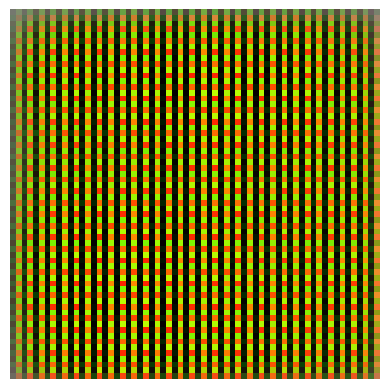

Epoch 141, Generator Loss: 3.1689, Discriminator Loss: 0.0642
Epoch 142, Generator Loss: 2.2236, Discriminator Loss: 0.1353
Epoch 143, Generator Loss: 1.9810, Discriminator Loss: 0.1923
Epoch 144, Generator Loss: 2.5005, Discriminator Loss: 0.0931
Epoch 145, Generator Loss: 3.2092, Discriminator Loss: 0.0428
Epoch 146, Generator Loss: 4.0106, Discriminator Loss: 0.0188
Epoch 147, Generator Loss: 4.9031, Discriminator Loss: 0.0086
Epoch 148, Generator Loss: 5.7654, Discriminator Loss: 0.0067
Epoch 149, Generator Loss: 6.5213, Discriminator Loss: 0.0181
Epoch 150, Generator Loss: 7.1955, Discriminator Loss: 0.0427


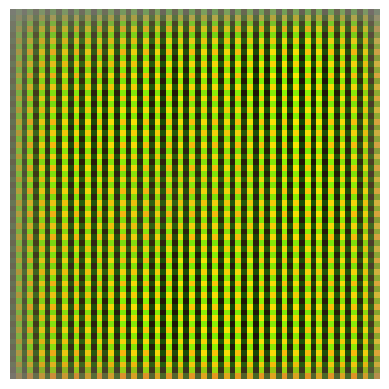

Epoch 151, Generator Loss: 7.4296, Discriminator Loss: 0.0770
Epoch 152, Generator Loss: 7.3833, Discriminator Loss: 0.0697
Epoch 153, Generator Loss: 6.6919, Discriminator Loss: 0.0385
Epoch 154, Generator Loss: 5.4003, Discriminator Loss: 0.0239
Epoch 155, Generator Loss: 4.7563, Discriminator Loss: 0.0207
Epoch 156, Generator Loss: 3.3204, Discriminator Loss: 0.0734
Epoch 157, Generator Loss: 2.7781, Discriminator Loss: 0.1307
Epoch 158, Generator Loss: 3.7256, Discriminator Loss: 0.0615
Epoch 159, Generator Loss: 4.7260, Discriminator Loss: 0.0389
Epoch 160, Generator Loss: 4.7991, Discriminator Loss: 0.0353


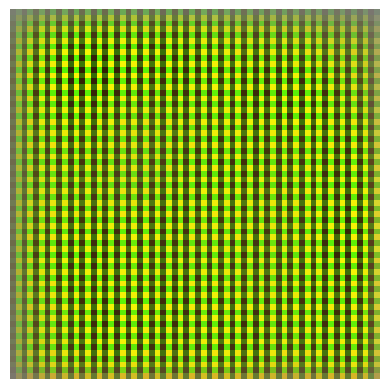

Epoch 161, Generator Loss: 5.5508, Discriminator Loss: 0.0613
Epoch 162, Generator Loss: 5.6322, Discriminator Loss: 0.0687
Epoch 163, Generator Loss: 5.0224, Discriminator Loss: 0.0541
Epoch 164, Generator Loss: 3.7680, Discriminator Loss: 0.0873
Epoch 165, Generator Loss: 3.5593, Discriminator Loss: 0.0678
Epoch 166, Generator Loss: 2.7396, Discriminator Loss: 0.1250
Epoch 167, Generator Loss: 2.9010, Discriminator Loss: 0.1149
Epoch 168, Generator Loss: 3.5503, Discriminator Loss: 0.1495
Epoch 169, Generator Loss: 3.8518, Discriminator Loss: 0.1052
Epoch 170, Generator Loss: 3.9435, Discriminator Loss: 0.0803


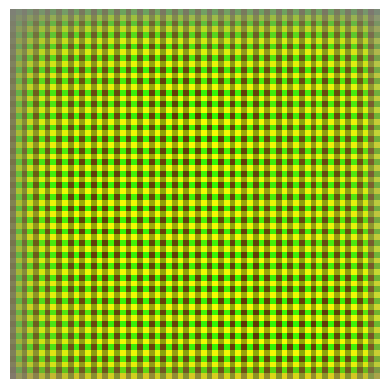

Epoch 171, Generator Loss: 3.3156, Discriminator Loss: 0.0716
Epoch 172, Generator Loss: 2.8898, Discriminator Loss: 0.0874
Epoch 173, Generator Loss: 3.1242, Discriminator Loss: 0.0702
Epoch 174, Generator Loss: 3.7479, Discriminator Loss: 0.0451
Epoch 175, Generator Loss: 4.4739, Discriminator Loss: 0.0350
Epoch 176, Generator Loss: 5.0214, Discriminator Loss: 0.0383
Epoch 177, Generator Loss: 5.0622, Discriminator Loss: 0.0353
Epoch 178, Generator Loss: 4.6778, Discriminator Loss: 0.0255
Epoch 179, Generator Loss: 4.5915, Discriminator Loss: 0.0253
Epoch 180, Generator Loss: 4.3128, Discriminator Loss: 0.0232


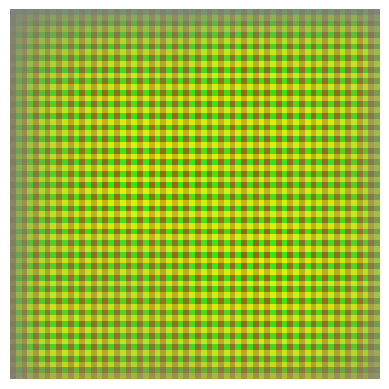

Epoch 181, Generator Loss: 3.7405, Discriminator Loss: 0.0386
Epoch 182, Generator Loss: 4.1077, Discriminator Loss: 0.0308
Epoch 183, Generator Loss: 4.0385, Discriminator Loss: 0.0351
Epoch 184, Generator Loss: 4.4540, Discriminator Loss: 0.0340
Epoch 185, Generator Loss: 4.9851, Discriminator Loss: 0.0367
Epoch 186, Generator Loss: 4.6460, Discriminator Loss: 0.0522
Epoch 187, Generator Loss: 4.5135, Discriminator Loss: 0.0529
Epoch 188, Generator Loss: 3.9785, Discriminator Loss: 0.0567
Epoch 189, Generator Loss: 3.1562, Discriminator Loss: 0.0814
Epoch 190, Generator Loss: 3.2309, Discriminator Loss: 0.0836


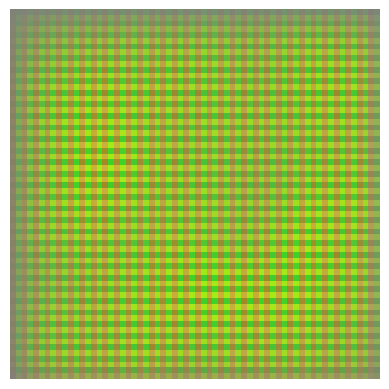

Epoch 191, Generator Loss: 3.8416, Discriminator Loss: 0.0912
Epoch 192, Generator Loss: 3.6605, Discriminator Loss: 0.1128
Epoch 193, Generator Loss: 3.2000, Discriminator Loss: 0.1198
Epoch 194, Generator Loss: 2.3717, Discriminator Loss: 0.1466
Epoch 195, Generator Loss: 2.6928, Discriminator Loss: 0.1386
Epoch 196, Generator Loss: 3.2946, Discriminator Loss: 0.1092
Epoch 197, Generator Loss: 3.6161, Discriminator Loss: 0.1018
Epoch 198, Generator Loss: 3.1437, Discriminator Loss: 0.0750
Epoch 199, Generator Loss: 2.8876, Discriminator Loss: 0.0833
Epoch 200, Generator Loss: 3.1810, Discriminator Loss: 0.0781


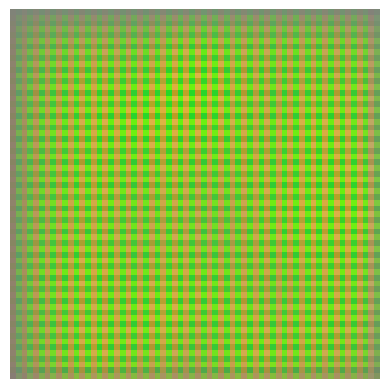

Epoch 201, Generator Loss: 3.4730, Discriminator Loss: 0.0712
Epoch 202, Generator Loss: 3.5498, Discriminator Loss: 0.0593
Epoch 203, Generator Loss: 3.4736, Discriminator Loss: 0.0591
Epoch 204, Generator Loss: 3.2884, Discriminator Loss: 0.0877
Epoch 205, Generator Loss: 2.8697, Discriminator Loss: 0.1071
Epoch 206, Generator Loss: 2.6965, Discriminator Loss: 0.1182
Epoch 207, Generator Loss: 3.4419, Discriminator Loss: 0.1077
Epoch 208, Generator Loss: 3.5768, Discriminator Loss: 0.1206
Epoch 209, Generator Loss: 2.7399, Discriminator Loss: 0.1395
Epoch 210, Generator Loss: 2.4909, Discriminator Loss: 0.1439


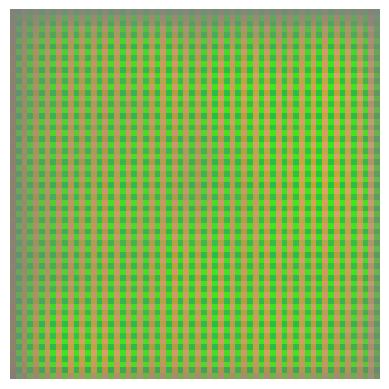

Epoch 211, Generator Loss: 3.2193, Discriminator Loss: 0.1247
Epoch 212, Generator Loss: 3.3714, Discriminator Loss: 0.1292
Epoch 213, Generator Loss: 2.6424, Discriminator Loss: 0.1241
Epoch 214, Generator Loss: 2.6477, Discriminator Loss: 0.1092
Epoch 215, Generator Loss: 3.4018, Discriminator Loss: 0.0993
Epoch 216, Generator Loss: 3.6381, Discriminator Loss: 0.1287
Epoch 217, Generator Loss: 2.6839, Discriminator Loss: 0.1013
Epoch 218, Generator Loss: 2.5735, Discriminator Loss: 0.1023
Epoch 219, Generator Loss: 3.5351, Discriminator Loss: 0.0962
Epoch 220, Generator Loss: 3.8084, Discriminator Loss: 0.1151


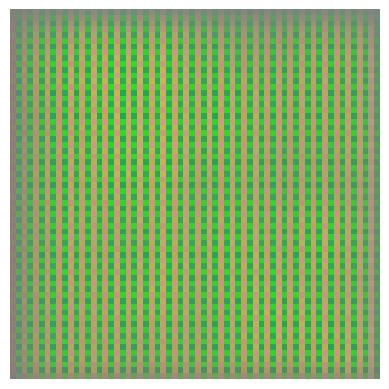

Epoch 221, Generator Loss: 2.8064, Discriminator Loss: 0.1023
Epoch 222, Generator Loss: 2.4340, Discriminator Loss: 0.1129
Epoch 223, Generator Loss: 3.3328, Discriminator Loss: 0.0942
Epoch 224, Generator Loss: 3.8851, Discriminator Loss: 0.1674
Epoch 225, Generator Loss: 2.3709, Discriminator Loss: 0.1266
Epoch 226, Generator Loss: 2.3487, Discriminator Loss: 0.1231
Epoch 227, Generator Loss: 3.6424, Discriminator Loss: 0.1028
Epoch 228, Generator Loss: 4.0241, Discriminator Loss: 0.1437
Epoch 229, Generator Loss: 2.7046, Discriminator Loss: 0.1282
Epoch 230, Generator Loss: 1.8719, Discriminator Loss: 0.1928


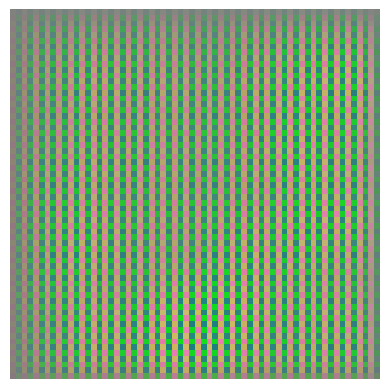

Epoch 231, Generator Loss: 3.4098, Discriminator Loss: 0.1134
Epoch 232, Generator Loss: 4.2013, Discriminator Loss: 0.1293
Epoch 233, Generator Loss: 3.3320, Discriminator Loss: 0.0902
Epoch 234, Generator Loss: 2.4546, Discriminator Loss: 0.1305
Epoch 235, Generator Loss: 2.4339, Discriminator Loss: 0.1209
Epoch 236, Generator Loss: 3.6947, Discriminator Loss: 0.1172
Epoch 237, Generator Loss: 3.7605, Discriminator Loss: 0.0941
Epoch 238, Generator Loss: 3.1685, Discriminator Loss: 0.0762
Epoch 239, Generator Loss: 2.7330, Discriminator Loss: 0.0930
Epoch 240, Generator Loss: 3.2063, Discriminator Loss: 0.0857


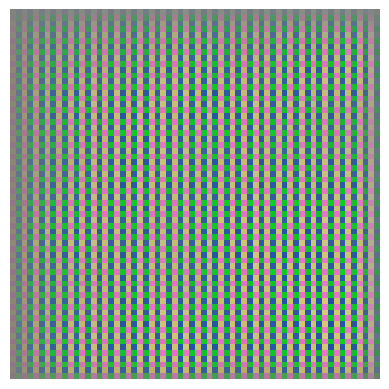

Epoch 241, Generator Loss: 3.5998, Discriminator Loss: 0.0904
Epoch 242, Generator Loss: 3.4337, Discriminator Loss: 0.0658
Epoch 243, Generator Loss: 3.2747, Discriminator Loss: 0.0776
Epoch 244, Generator Loss: 3.1754, Discriminator Loss: 0.0667
Epoch 245, Generator Loss: 3.5649, Discriminator Loss: 0.0598
Epoch 246, Generator Loss: 3.7253, Discriminator Loss: 0.1254
Epoch 247, Generator Loss: 2.6642, Discriminator Loss: 0.1014
Epoch 248, Generator Loss: 2.7053, Discriminator Loss: 0.1006
Epoch 249, Generator Loss: 3.3674, Discriminator Loss: 0.1046
Epoch 250, Generator Loss: 3.6809, Discriminator Loss: 0.1087


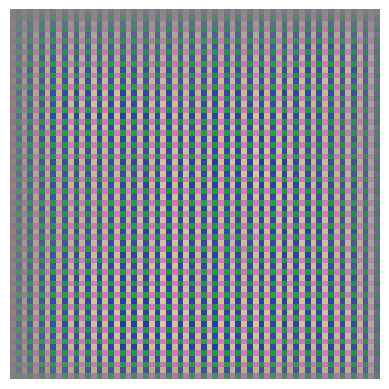

Epoch 251, Generator Loss: 2.9500, Discriminator Loss: 0.1215
Epoch 252, Generator Loss: 2.4436, Discriminator Loss: 0.1561
Epoch 253, Generator Loss: 2.8554, Discriminator Loss: 0.1553
Epoch 254, Generator Loss: 2.8506, Discriminator Loss: 0.1686
Epoch 255, Generator Loss: 2.7119, Discriminator Loss: 0.1557
Epoch 256, Generator Loss: 2.4360, Discriminator Loss: 0.1879
Epoch 257, Generator Loss: 3.0153, Discriminator Loss: 0.1598
Epoch 258, Generator Loss: 2.7094, Discriminator Loss: 0.1228
Epoch 259, Generator Loss: 3.0621, Discriminator Loss: 0.1369
Epoch 260, Generator Loss: 2.6247, Discriminator Loss: 0.2108


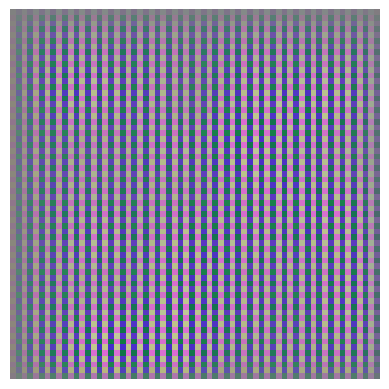

Epoch 261, Generator Loss: 2.3543, Discriminator Loss: 0.2247
Epoch 262, Generator Loss: 2.8018, Discriminator Loss: 0.1526
Epoch 263, Generator Loss: 2.8055, Discriminator Loss: 0.1286
Epoch 264, Generator Loss: 3.0831, Discriminator Loss: 0.1529
Epoch 265, Generator Loss: 2.5752, Discriminator Loss: 0.1748
Epoch 266, Generator Loss: 2.1612, Discriminator Loss: 0.1899
Epoch 267, Generator Loss: 3.0408, Discriminator Loss: 0.1812
Epoch 268, Generator Loss: 2.7416, Discriminator Loss: 0.1869
Epoch 269, Generator Loss: 1.9833, Discriminator Loss: 0.2687
Epoch 270, Generator Loss: 2.5285, Discriminator Loss: 0.1657


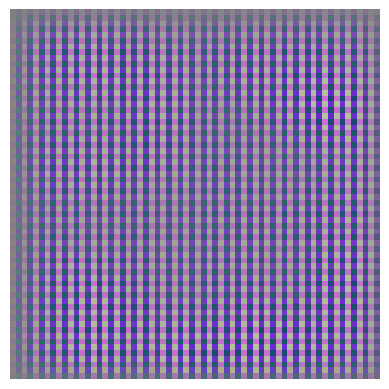

Epoch 271, Generator Loss: 3.2295, Discriminator Loss: 0.1874
Epoch 272, Generator Loss: 2.5290, Discriminator Loss: 0.1898
Epoch 273, Generator Loss: 1.9138, Discriminator Loss: 0.1951
Epoch 274, Generator Loss: 3.3861, Discriminator Loss: 0.1405
Epoch 275, Generator Loss: 3.6451, Discriminator Loss: 0.1963
Epoch 276, Generator Loss: 2.3500, Discriminator Loss: 0.1560
Epoch 277, Generator Loss: 2.3699, Discriminator Loss: 0.1312
Epoch 278, Generator Loss: 3.2254, Discriminator Loss: 0.1052
Epoch 279, Generator Loss: 3.9691, Discriminator Loss: 0.1290
Epoch 280, Generator Loss: 3.6930, Discriminator Loss: 0.1154


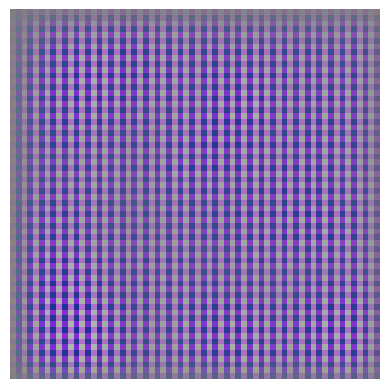

Epoch 281, Generator Loss: 2.6598, Discriminator Loss: 0.1262
Epoch 282, Generator Loss: 2.7851, Discriminator Loss: 0.1227
Epoch 283, Generator Loss: 3.4783, Discriminator Loss: 0.0943
Epoch 284, Generator Loss: 4.0031, Discriminator Loss: 0.1065
Epoch 285, Generator Loss: 3.9114, Discriminator Loss: 0.0931
Epoch 286, Generator Loss: 2.8568, Discriminator Loss: 0.1314
Epoch 287, Generator Loss: 3.2789, Discriminator Loss: 0.1554
Epoch 288, Generator Loss: 3.3095, Discriminator Loss: 0.1101
Epoch 289, Generator Loss: 4.7845, Discriminator Loss: 0.0914
Epoch 290, Generator Loss: 4.3899, Discriminator Loss: 0.1227


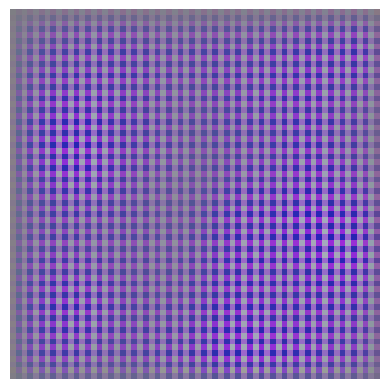

Epoch 291, Generator Loss: 3.8366, Discriminator Loss: 0.1000
Epoch 292, Generator Loss: 3.0211, Discriminator Loss: 0.1930
Epoch 293, Generator Loss: 4.1211, Discriminator Loss: 0.0656
Epoch 294, Generator Loss: 4.9205, Discriminator Loss: 0.1156
Epoch 295, Generator Loss: 5.2682, Discriminator Loss: 0.1576
Epoch 296, Generator Loss: 4.7219, Discriminator Loss: 0.0975
Epoch 297, Generator Loss: 3.7036, Discriminator Loss: 0.1114
Epoch 298, Generator Loss: 3.5537, Discriminator Loss: 0.1359
Epoch 299, Generator Loss: 4.3704, Discriminator Loss: 0.1171
Epoch 300, Generator Loss: 6.5734, Discriminator Loss: 0.1318


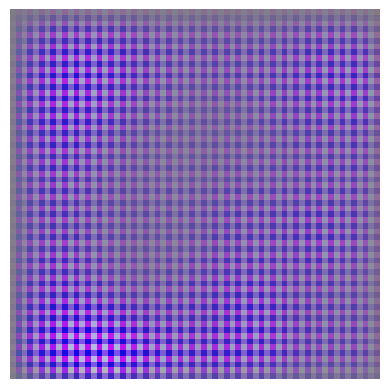

Epoch 301, Generator Loss: 6.4098, Discriminator Loss: 0.0896
Epoch 302, Generator Loss: 5.8400, Discriminator Loss: 0.0984
Epoch 303, Generator Loss: 4.0505, Discriminator Loss: 0.1386
Epoch 304, Generator Loss: 4.5040, Discriminator Loss: 0.1502
Epoch 305, Generator Loss: 6.1517, Discriminator Loss: 0.1197
Epoch 306, Generator Loss: 6.7161, Discriminator Loss: 0.1421
Epoch 307, Generator Loss: 4.3430, Discriminator Loss: 0.1969
Epoch 308, Generator Loss: 4.6234, Discriminator Loss: 0.1345
Epoch 309, Generator Loss: 5.5478, Discriminator Loss: 0.1557
Epoch 310, Generator Loss: 5.9204, Discriminator Loss: 0.0832


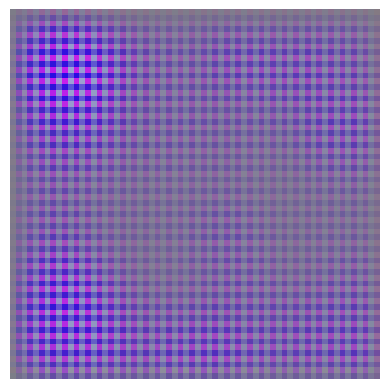

Epoch 311, Generator Loss: 6.0249, Discriminator Loss: 0.1029
Epoch 312, Generator Loss: 4.7882, Discriminator Loss: 0.1200
Epoch 313, Generator Loss: 6.1054, Discriminator Loss: 0.0787
Epoch 314, Generator Loss: 4.4972, Discriminator Loss: 0.1004
Epoch 315, Generator Loss: 5.2272, Discriminator Loss: 0.0887
Epoch 316, Generator Loss: 6.4361, Discriminator Loss: 0.0936
Epoch 317, Generator Loss: 4.7273, Discriminator Loss: 0.0771
Epoch 318, Generator Loss: 4.4872, Discriminator Loss: 0.0933
Epoch 319, Generator Loss: 3.4317, Discriminator Loss: 0.0955
Epoch 320, Generator Loss: 5.4009, Discriminator Loss: 0.0875


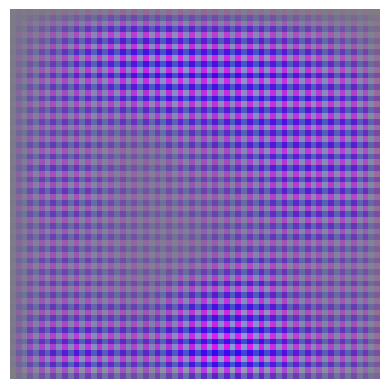

Epoch 321, Generator Loss: 5.0947, Discriminator Loss: 0.0764
Epoch 322, Generator Loss: 4.2790, Discriminator Loss: 0.0790
Epoch 323, Generator Loss: 3.5334, Discriminator Loss: 0.0828
Epoch 324, Generator Loss: 4.2945, Discriminator Loss: 0.0697
Epoch 325, Generator Loss: 4.0966, Discriminator Loss: 0.0759
Epoch 326, Generator Loss: 4.3048, Discriminator Loss: 0.0755
Epoch 327, Generator Loss: 3.7030, Discriminator Loss: 0.0777
Epoch 328, Generator Loss: 3.8077, Discriminator Loss: 0.0822
Epoch 329, Generator Loss: 3.8156, Discriminator Loss: 0.0740
Epoch 330, Generator Loss: 3.2335, Discriminator Loss: 0.0830


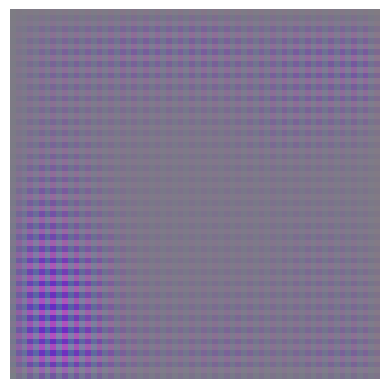

Epoch 331, Generator Loss: 3.2257, Discriminator Loss: 0.0726
Epoch 332, Generator Loss: 3.9887, Discriminator Loss: 0.0810
Epoch 333, Generator Loss: 3.9149, Discriminator Loss: 0.0756
Epoch 334, Generator Loss: 3.2670, Discriminator Loss: 0.0791
Epoch 335, Generator Loss: 2.8788, Discriminator Loss: 0.0908
Epoch 336, Generator Loss: 3.2262, Discriminator Loss: 0.0856
Epoch 337, Generator Loss: 3.5683, Discriminator Loss: 0.0804
Epoch 338, Generator Loss: 3.7475, Discriminator Loss: 0.1026
Epoch 339, Generator Loss: 2.9475, Discriminator Loss: 0.0848
Epoch 340, Generator Loss: 2.7934, Discriminator Loss: 0.0937


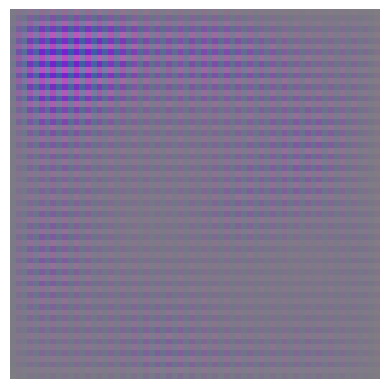

Epoch 341, Generator Loss: 3.1488, Discriminator Loss: 0.0952
Epoch 342, Generator Loss: 3.6394, Discriminator Loss: 0.0863
Epoch 343, Generator Loss: 3.4337, Discriminator Loss: 0.1263
Epoch 344, Generator Loss: 2.3858, Discriminator Loss: 0.1459
Epoch 345, Generator Loss: 2.6045, Discriminator Loss: 0.1350
Epoch 346, Generator Loss: 3.1056, Discriminator Loss: 0.1909
Epoch 347, Generator Loss: 2.6129, Discriminator Loss: 0.1886
Epoch 348, Generator Loss: 2.2613, Discriminator Loss: 0.2156
Epoch 349, Generator Loss: 3.1236, Discriminator Loss: 0.2497
Epoch 350, Generator Loss: 2.1823, Discriminator Loss: 0.2802


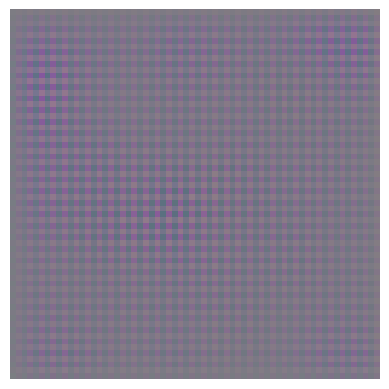

Epoch 351, Generator Loss: 2.5780, Discriminator Loss: 0.2565
Epoch 352, Generator Loss: 2.4066, Discriminator Loss: 0.4108
Epoch 353, Generator Loss: 1.8069, Discriminator Loss: 0.4201
Epoch 354, Generator Loss: 2.3821, Discriminator Loss: 0.3828
Epoch 355, Generator Loss: 2.3601, Discriminator Loss: 0.5297
Epoch 356, Generator Loss: 2.0971, Discriminator Loss: 0.5533
Epoch 357, Generator Loss: 1.7559, Discriminator Loss: 0.7967
Epoch 358, Generator Loss: 3.2908, Discriminator Loss: 0.8360
Epoch 359, Generator Loss: 0.5462, Discriminator Loss: 1.7339
Epoch 360, Generator Loss: 1.8574, Discriminator Loss: 0.9933


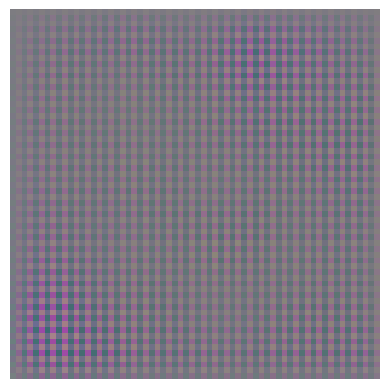

Epoch 361, Generator Loss: 2.6286, Discriminator Loss: 1.8643
Epoch 362, Generator Loss: 0.8106, Discriminator Loss: 2.3231
Epoch 363, Generator Loss: 1.4219, Discriminator Loss: 1.9085
Epoch 364, Generator Loss: 2.1451, Discriminator Loss: 2.5439
Epoch 365, Generator Loss: 0.8715, Discriminator Loss: 2.2359
Epoch 366, Generator Loss: 0.4259, Discriminator Loss: 2.9165
Epoch 367, Generator Loss: 1.6548, Discriminator Loss: 3.2246
Epoch 368, Generator Loss: 1.1130, Discriminator Loss: 3.6310
Epoch 369, Generator Loss: 0.1826, Discriminator Loss: 4.1551
Epoch 370, Generator Loss: 0.2463, Discriminator Loss: 4.6235


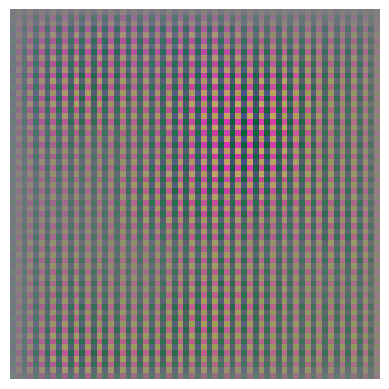

Epoch 371, Generator Loss: 0.8691, Discriminator Loss: 3.7729
Epoch 372, Generator Loss: 0.5867, Discriminator Loss: 3.9601
Epoch 373, Generator Loss: 0.1926, Discriminator Loss: 4.1652
Epoch 374, Generator Loss: 0.4902, Discriminator Loss: 3.3647
Epoch 375, Generator Loss: 0.4570, Discriminator Loss: 3.8118
Epoch 376, Generator Loss: 0.8803, Discriminator Loss: 4.5008
Epoch 377, Generator Loss: 0.3754, Discriminator Loss: 3.5587
Epoch 378, Generator Loss: 0.3345, Discriminator Loss: 3.2115
Epoch 379, Generator Loss: 0.3964, Discriminator Loss: 3.1191
Epoch 380, Generator Loss: 1.1755, Discriminator Loss: 2.7632


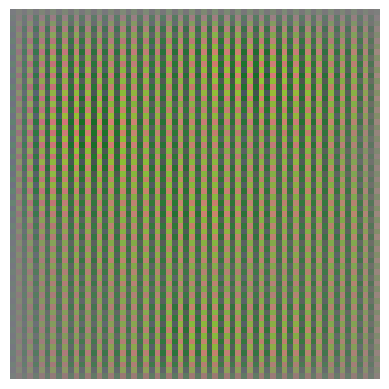

Epoch 381, Generator Loss: 0.7471, Discriminator Loss: 2.0436
Epoch 382, Generator Loss: 0.3552, Discriminator Loss: 2.3134
Epoch 383, Generator Loss: 0.9097, Discriminator Loss: 1.7718
Epoch 384, Generator Loss: 1.5060, Discriminator Loss: 1.8202
Epoch 385, Generator Loss: 0.5184, Discriminator Loss: 2.0231
Epoch 386, Generator Loss: 1.0403, Discriminator Loss: 1.5098
Epoch 387, Generator Loss: 1.5849, Discriminator Loss: 0.9431
Epoch 388, Generator Loss: 2.5193, Discriminator Loss: 0.8897
Epoch 389, Generator Loss: 1.4419, Discriminator Loss: 0.7590
Epoch 390, Generator Loss: 1.3409, Discriminator Loss: 0.6638


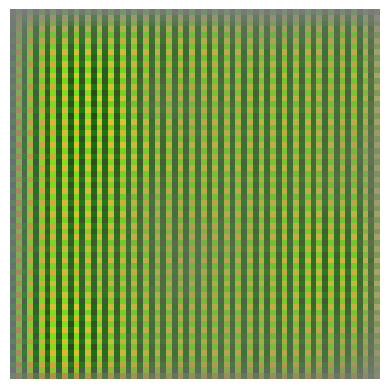

Epoch 391, Generator Loss: 2.9214, Discriminator Loss: 0.3729
Epoch 392, Generator Loss: 3.8923, Discriminator Loss: 0.3220
Epoch 393, Generator Loss: 4.0436, Discriminator Loss: 0.1822
Epoch 394, Generator Loss: 3.7232, Discriminator Loss: 0.1173
Epoch 395, Generator Loss: 3.1252, Discriminator Loss: 0.0920
Epoch 396, Generator Loss: 3.2065, Discriminator Loss: 0.0847
Epoch 397, Generator Loss: 3.2988, Discriminator Loss: 0.0504
Epoch 398, Generator Loss: 3.9149, Discriminator Loss: 0.0287
Epoch 399, Generator Loss: 4.4878, Discriminator Loss: 0.0232
Epoch 400, Generator Loss: 4.8660, Discriminator Loss: 0.0157


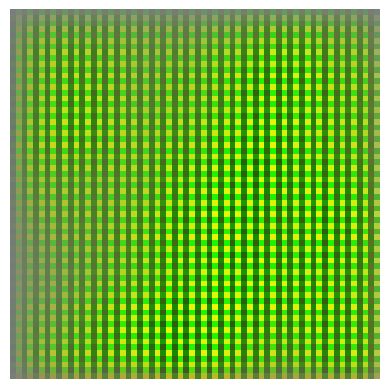

Epoch 401, Generator Loss: 5.2775, Discriminator Loss: 0.0143
Epoch 402, Generator Loss: 5.3983, Discriminator Loss: 0.0233
Epoch 403, Generator Loss: 5.4537, Discriminator Loss: 0.0426
Epoch 404, Generator Loss: 6.1015, Discriminator Loss: 0.0246
Epoch 405, Generator Loss: 5.0403, Discriminator Loss: 0.0578
Epoch 406, Generator Loss: 5.6490, Discriminator Loss: 0.0600
Epoch 407, Generator Loss: 4.8670, Discriminator Loss: 0.1988
Epoch 408, Generator Loss: 4.3755, Discriminator Loss: 0.2089
Epoch 409, Generator Loss: 4.7266, Discriminator Loss: 0.2072
Epoch 410, Generator Loss: 5.1540, Discriminator Loss: 0.2218


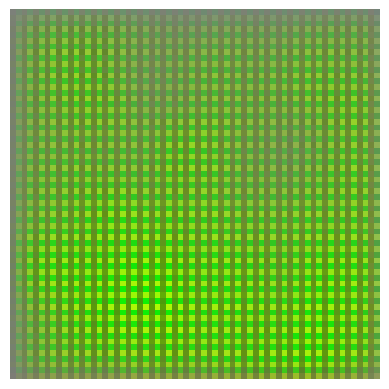

Epoch 411, Generator Loss: 3.7901, Discriminator Loss: 0.3734
Epoch 412, Generator Loss: 3.0499, Discriminator Loss: 0.4749
Epoch 413, Generator Loss: 3.2674, Discriminator Loss: 0.2810
Epoch 414, Generator Loss: 4.6953, Discriminator Loss: 0.1102
Epoch 415, Generator Loss: 5.9405, Discriminator Loss: 0.0490
Epoch 416, Generator Loss: 6.1817, Discriminator Loss: 0.0342
Epoch 417, Generator Loss: 6.4552, Discriminator Loss: 0.0999
Epoch 418, Generator Loss: 7.3417, Discriminator Loss: 0.0145
Epoch 419, Generator Loss: 7.4870, Discriminator Loss: 0.0238
Epoch 420, Generator Loss: 8.2484, Discriminator Loss: 0.0055


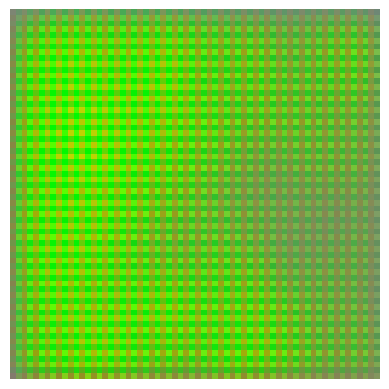

Epoch 421, Generator Loss: 7.9737, Discriminator Loss: 0.0055
Epoch 422, Generator Loss: 7.8255, Discriminator Loss: 0.0154
Epoch 423, Generator Loss: 7.6780, Discriminator Loss: 0.0424
Epoch 424, Generator Loss: 8.0540, Discriminator Loss: 0.0056
Epoch 425, Generator Loss: 8.1801, Discriminator Loss: 0.0047
Epoch 426, Generator Loss: 8.0478, Discriminator Loss: 0.0315
Epoch 427, Generator Loss: 8.6251, Discriminator Loss: 0.0223
Epoch 428, Generator Loss: 8.8653, Discriminator Loss: 0.0387
Epoch 429, Generator Loss: 9.1901, Discriminator Loss: 0.0119
Epoch 430, Generator Loss: 9.8254, Discriminator Loss: 0.0068


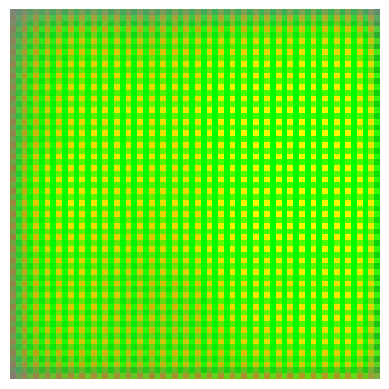

Epoch 431, Generator Loss: 10.1584, Discriminator Loss: 0.0332
Epoch 432, Generator Loss: 9.8452, Discriminator Loss: 0.0242
Epoch 433, Generator Loss: 10.7305, Discriminator Loss: 0.0214
Epoch 434, Generator Loss: 11.7498, Discriminator Loss: 0.0198
Epoch 435, Generator Loss: 10.8162, Discriminator Loss: 0.0322
Epoch 436, Generator Loss: 10.5680, Discriminator Loss: 0.0212
Epoch 437, Generator Loss: 12.7290, Discriminator Loss: 0.0194
Epoch 438, Generator Loss: 11.4672, Discriminator Loss: 0.0547
Epoch 439, Generator Loss: 11.2348, Discriminator Loss: 0.0366
Epoch 440, Generator Loss: 11.6270, Discriminator Loss: 0.0196


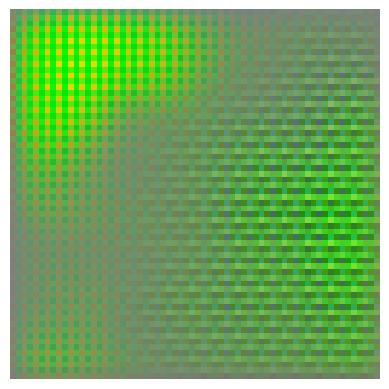

Epoch 441, Generator Loss: 10.5469, Discriminator Loss: 0.0920
Epoch 442, Generator Loss: 11.2541, Discriminator Loss: 0.0638
Epoch 443, Generator Loss: 12.7077, Discriminator Loss: 0.0789
Epoch 444, Generator Loss: 14.6699, Discriminator Loss: 0.0911
Epoch 445, Generator Loss: 14.3954, Discriminator Loss: 0.1353
Epoch 446, Generator Loss: 14.9768, Discriminator Loss: 0.1420
Epoch 447, Generator Loss: 16.0487, Discriminator Loss: 0.0737
Epoch 448, Generator Loss: 15.3024, Discriminator Loss: 0.1160
Epoch 449, Generator Loss: 14.9503, Discriminator Loss: 0.4817
Epoch 450, Generator Loss: 17.4754, Discriminator Loss: 0.0745


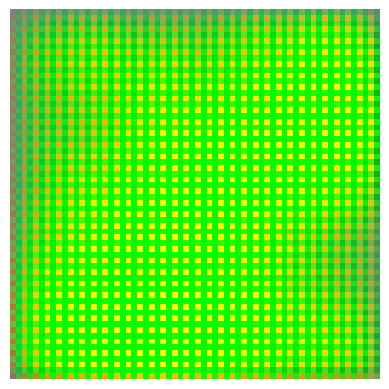

Epoch 451, Generator Loss: 15.7995, Discriminator Loss: 0.3174
Epoch 452, Generator Loss: 14.4748, Discriminator Loss: 0.4024
Epoch 453, Generator Loss: 17.0843, Discriminator Loss: 0.4220
Epoch 454, Generator Loss: 17.2698, Discriminator Loss: 0.1758
Epoch 455, Generator Loss: 19.2061, Discriminator Loss: 0.2647
Epoch 456, Generator Loss: 16.0687, Discriminator Loss: 0.4200
Epoch 457, Generator Loss: 17.9857, Discriminator Loss: 1.4711
Epoch 458, Generator Loss: 17.4098, Discriminator Loss: 0.8230
Epoch 459, Generator Loss: 19.2848, Discriminator Loss: 1.5118
Epoch 460, Generator Loss: 18.1278, Discriminator Loss: 1.6369


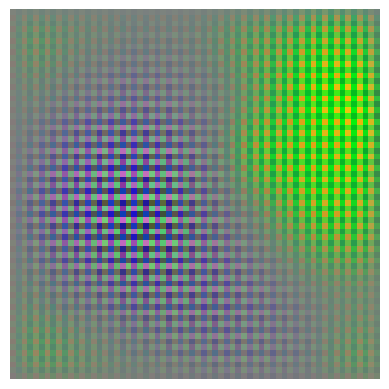

Epoch 461, Generator Loss: 18.7133, Discriminator Loss: 1.0585
Epoch 462, Generator Loss: 21.0707, Discriminator Loss: 1.8430
Epoch 463, Generator Loss: 14.8742, Discriminator Loss: 4.0728
Epoch 464, Generator Loss: 21.0278, Discriminator Loss: 2.1033
Epoch 465, Generator Loss: 19.6971, Discriminator Loss: 3.4372
Epoch 466, Generator Loss: 14.7307, Discriminator Loss: 3.7065
Epoch 467, Generator Loss: 22.4645, Discriminator Loss: 1.3526
Epoch 468, Generator Loss: 18.1141, Discriminator Loss: 4.7188
Epoch 469, Generator Loss: 15.5172, Discriminator Loss: 2.9850
Epoch 470, Generator Loss: 19.0252, Discriminator Loss: 1.9871


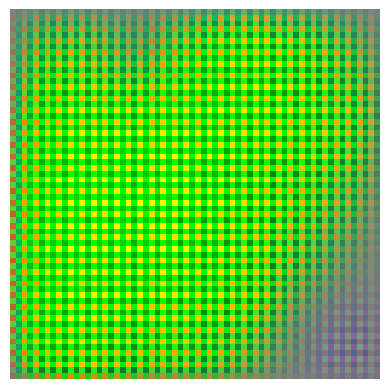

Epoch 471, Generator Loss: 17.4797, Discriminator Loss: 6.2911
Epoch 472, Generator Loss: 19.3038, Discriminator Loss: 2.3119
Epoch 473, Generator Loss: 18.9558, Discriminator Loss: 4.2433
Epoch 474, Generator Loss: 19.8808, Discriminator Loss: 4.4651
Epoch 475, Generator Loss: 14.2157, Discriminator Loss: 2.6880
Epoch 476, Generator Loss: 12.4561, Discriminator Loss: 4.8913
Epoch 477, Generator Loss: 10.7915, Discriminator Loss: 4.1804
Epoch 478, Generator Loss: 13.4501, Discriminator Loss: 1.4570
Epoch 479, Generator Loss: 13.3107, Discriminator Loss: 2.0348
Epoch 480, Generator Loss: 15.1226, Discriminator Loss: 1.8300


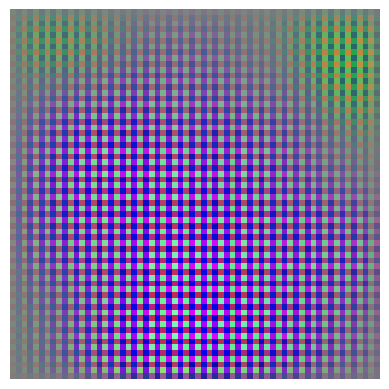

Epoch 481, Generator Loss: 13.4234, Discriminator Loss: 4.1937
Epoch 482, Generator Loss: 10.8959, Discriminator Loss: 3.3914
Epoch 483, Generator Loss: 11.9537, Discriminator Loss: 2.0592
Epoch 484, Generator Loss: 10.0823, Discriminator Loss: 2.1270
Epoch 485, Generator Loss: 9.1807, Discriminator Loss: 2.1173
Epoch 486, Generator Loss: 9.9449, Discriminator Loss: 1.0823
Epoch 487, Generator Loss: 12.4503, Discriminator Loss: 1.1324
Epoch 488, Generator Loss: 11.5451, Discriminator Loss: 0.5716
Epoch 489, Generator Loss: 9.6480, Discriminator Loss: 0.2906
Epoch 490, Generator Loss: 11.0913, Discriminator Loss: 0.0844


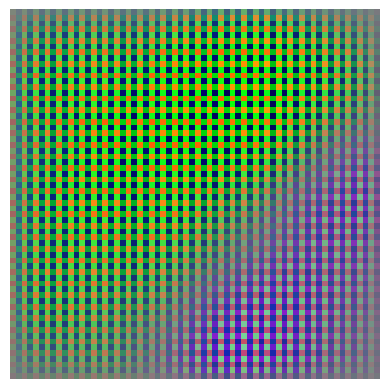

Epoch 491, Generator Loss: 9.8170, Discriminator Loss: 0.0299
Epoch 492, Generator Loss: 9.8336, Discriminator Loss: 0.0264
Epoch 493, Generator Loss: 7.7662, Discriminator Loss: 0.0193
Epoch 494, Generator Loss: 8.2211, Discriminator Loss: 0.0074
Epoch 495, Generator Loss: 6.7581, Discriminator Loss: 0.0156
Epoch 496, Generator Loss: 6.7550, Discriminator Loss: 0.0221
Epoch 497, Generator Loss: 7.2821, Discriminator Loss: 0.0144
Epoch 498, Generator Loss: 6.5119, Discriminator Loss: 0.0119
Epoch 499, Generator Loss: 6.2246, Discriminator Loss: 0.0116
Epoch 500, Generator Loss: 5.9910, Discriminator Loss: 0.0141


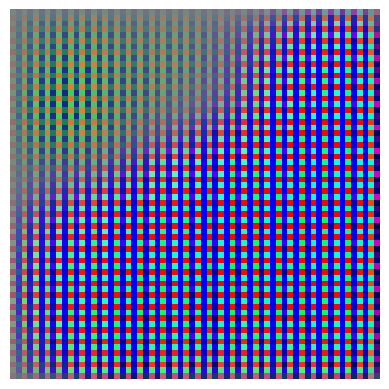

Epoch 501, Generator Loss: 5.8027, Discriminator Loss: 0.0146
Epoch 502, Generator Loss: 5.6915, Discriminator Loss: 0.0128
Epoch 503, Generator Loss: 5.7076, Discriminator Loss: 0.0106
Epoch 504, Generator Loss: 5.0632, Discriminator Loss: 0.0209
Epoch 505, Generator Loss: 5.0384, Discriminator Loss: 0.0263
Epoch 506, Generator Loss: 5.4655, Discriminator Loss: 0.0257
Epoch 507, Generator Loss: 5.2836, Discriminator Loss: 0.0362
Epoch 508, Generator Loss: 4.7859, Discriminator Loss: 0.0344
Epoch 509, Generator Loss: 4.8868, Discriminator Loss: 0.0259
Epoch 510, Generator Loss: 4.7604, Discriminator Loss: 0.0236


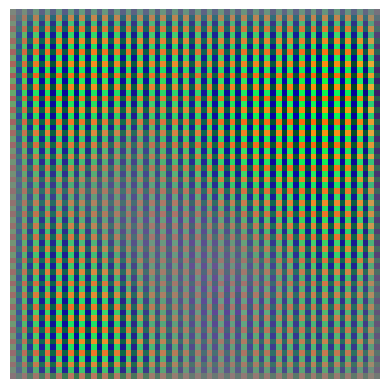

Epoch 511, Generator Loss: 4.9852, Discriminator Loss: 0.0206
Epoch 512, Generator Loss: 5.2550, Discriminator Loss: 0.0155
Epoch 513, Generator Loss: 5.9319, Discriminator Loss: 0.0091
Epoch 514, Generator Loss: 5.4685, Discriminator Loss: 0.0088
Epoch 515, Generator Loss: 6.1284, Discriminator Loss: 0.0061
Epoch 516, Generator Loss: 6.0232, Discriminator Loss: 0.0043
Epoch 517, Generator Loss: 6.7045, Discriminator Loss: 0.0036
Epoch 518, Generator Loss: 6.6681, Discriminator Loss: 0.0035
Epoch 519, Generator Loss: 6.6430, Discriminator Loss: 0.0039
Epoch 520, Generator Loss: 6.6353, Discriminator Loss: 0.0039


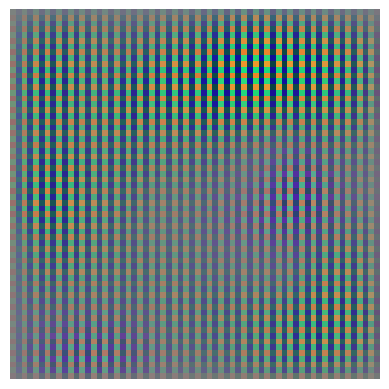

Epoch 521, Generator Loss: 6.5275, Discriminator Loss: 0.0044
Epoch 522, Generator Loss: 6.6631, Discriminator Loss: 0.0043
Epoch 523, Generator Loss: 6.4858, Discriminator Loss: 0.0052
Epoch 524, Generator Loss: 6.1147, Discriminator Loss: 0.0057
Epoch 525, Generator Loss: 6.1458, Discriminator Loss: 0.0064
Epoch 526, Generator Loss: 6.1497, Discriminator Loss: 0.0065
Epoch 527, Generator Loss: 5.8520, Discriminator Loss: 0.0083
Epoch 528, Generator Loss: 5.8995, Discriminator Loss: 0.0078
Epoch 529, Generator Loss: 6.1781, Discriminator Loss: 0.0071
Epoch 530, Generator Loss: 5.6488, Discriminator Loss: 0.0082


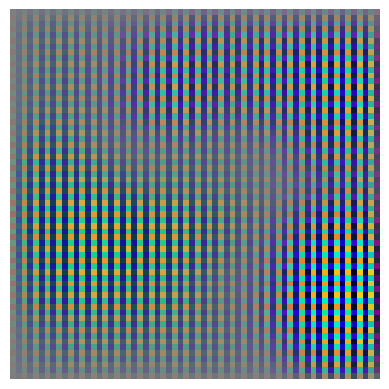

Epoch 531, Generator Loss: 5.8474, Discriminator Loss: 0.0086
Epoch 532, Generator Loss: 5.5422, Discriminator Loss: 0.0092
Epoch 533, Generator Loss: 5.7151, Discriminator Loss: 0.0088
Epoch 534, Generator Loss: 5.7899, Discriminator Loss: 0.0086
Epoch 535, Generator Loss: 5.4358, Discriminator Loss: 0.0101
Epoch 536, Generator Loss: 5.3264, Discriminator Loss: 0.0107
Epoch 537, Generator Loss: 5.4417, Discriminator Loss: 0.0104
Epoch 538, Generator Loss: 5.3596, Discriminator Loss: 0.0108
Epoch 539, Generator Loss: 5.1378, Discriminator Loss: 0.0118
Epoch 540, Generator Loss: 5.0172, Discriminator Loss: 0.0131


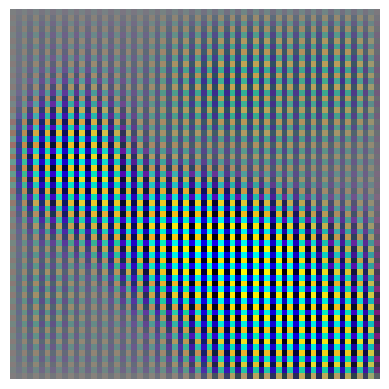

Epoch 541, Generator Loss: 5.1452, Discriminator Loss: 0.0117
Epoch 542, Generator Loss: 5.2074, Discriminator Loss: 0.0118
Epoch 543, Generator Loss: 4.9882, Discriminator Loss: 0.0138
Epoch 544, Generator Loss: 4.9873, Discriminator Loss: 0.0132
Epoch 545, Generator Loss: 4.8662, Discriminator Loss: 0.0143
Epoch 546, Generator Loss: 5.1836, Discriminator Loss: 0.0121
Epoch 547, Generator Loss: 5.0577, Discriminator Loss: 0.0144
Epoch 548, Generator Loss: 4.9424, Discriminator Loss: 0.0139
Epoch 549, Generator Loss: 4.8104, Discriminator Loss: 0.0167
Epoch 550, Generator Loss: 4.7363, Discriminator Loss: 0.0171


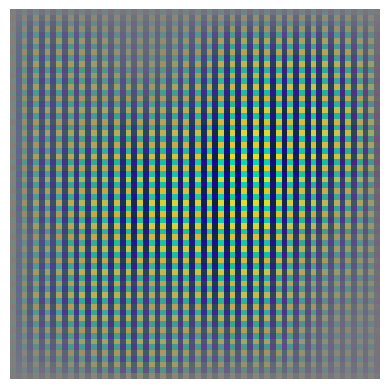

Epoch 551, Generator Loss: 4.9405, Discriminator Loss: 0.0157
Epoch 552, Generator Loss: 4.6780, Discriminator Loss: 0.0179
Epoch 553, Generator Loss: 4.8250, Discriminator Loss: 0.0163
Epoch 554, Generator Loss: 5.0651, Discriminator Loss: 0.0167
Epoch 555, Generator Loss: 4.6111, Discriminator Loss: 0.0200
Epoch 556, Generator Loss: 4.6900, Discriminator Loss: 0.0197
Epoch 557, Generator Loss: 4.6560, Discriminator Loss: 0.0210
Epoch 558, Generator Loss: 4.7167, Discriminator Loss: 0.0199
Epoch 559, Generator Loss: 4.7228, Discriminator Loss: 0.0205
Epoch 560, Generator Loss: 4.6669, Discriminator Loss: 0.0221


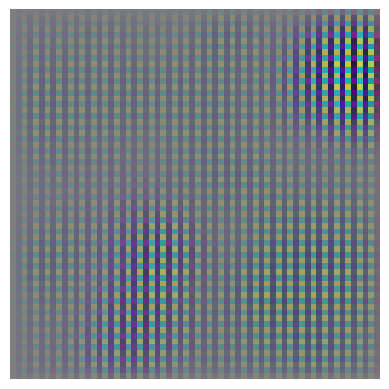

Epoch 561, Generator Loss: 4.3907, Discriminator Loss: 0.0256
Epoch 562, Generator Loss: 4.7637, Discriminator Loss: 0.0224
Epoch 563, Generator Loss: 4.5585, Discriminator Loss: 0.0242
Epoch 564, Generator Loss: 4.7295, Discriminator Loss: 0.0225
Epoch 565, Generator Loss: 4.4427, Discriminator Loss: 0.0261
Epoch 566, Generator Loss: 4.6704, Discriminator Loss: 0.0242
Epoch 567, Generator Loss: 4.6778, Discriminator Loss: 0.0262
Epoch 568, Generator Loss: 4.3980, Discriminator Loss: 0.0271
Epoch 569, Generator Loss: 4.2563, Discriminator Loss: 0.0298
Epoch 570, Generator Loss: 4.3324, Discriminator Loss: 0.0292


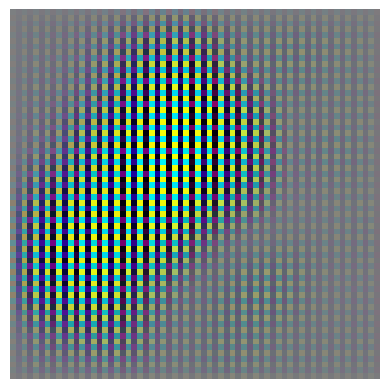

Epoch 571, Generator Loss: 4.1290, Discriminator Loss: 0.0326
Epoch 572, Generator Loss: 4.1911, Discriminator Loss: 0.0319
Epoch 573, Generator Loss: 3.9615, Discriminator Loss: 0.0348
Epoch 574, Generator Loss: 3.9556, Discriminator Loss: 0.0352
Epoch 575, Generator Loss: 3.8968, Discriminator Loss: 0.0359
Epoch 576, Generator Loss: 3.8758, Discriminator Loss: 0.0370
Epoch 577, Generator Loss: 3.7977, Discriminator Loss: 0.0405
Epoch 578, Generator Loss: 3.7758, Discriminator Loss: 0.0431
Epoch 579, Generator Loss: 3.8445, Discriminator Loss: 0.0435
Epoch 580, Generator Loss: 3.5143, Discriminator Loss: 0.0556


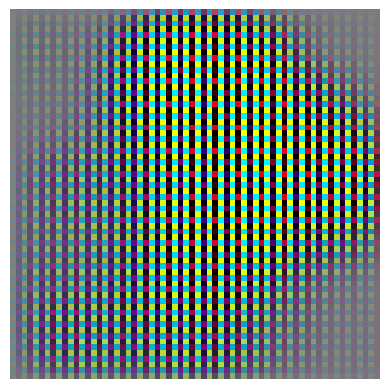

Epoch 581, Generator Loss: 3.4032, Discriminator Loss: 0.0630
Epoch 582, Generator Loss: 3.5612, Discriminator Loss: 0.0625
Epoch 583, Generator Loss: 3.5418, Discriminator Loss: 0.0670
Epoch 584, Generator Loss: 3.2254, Discriminator Loss: 0.0969
Epoch 585, Generator Loss: 3.7319, Discriminator Loss: 0.0776
Epoch 586, Generator Loss: 3.8118, Discriminator Loss: 0.0781
Epoch 587, Generator Loss: 3.6607, Discriminator Loss: 0.0948
Epoch 588, Generator Loss: 4.2601, Discriminator Loss: 0.0691
Epoch 589, Generator Loss: 3.7548, Discriminator Loss: 0.0855
Epoch 590, Generator Loss: 4.1883, Discriminator Loss: 0.0650


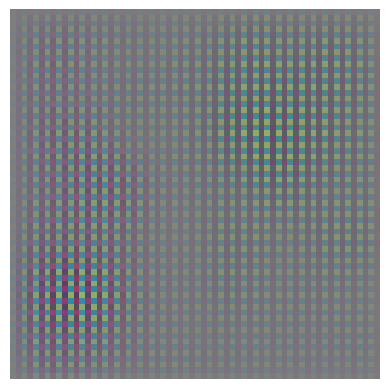

Epoch 591, Generator Loss: 4.1668, Discriminator Loss: 0.0556
Epoch 592, Generator Loss: 4.0542, Discriminator Loss: 0.0462
Epoch 593, Generator Loss: 3.9705, Discriminator Loss: 0.0419
Epoch 594, Generator Loss: 3.7260, Discriminator Loss: 0.0446
Epoch 595, Generator Loss: 3.6743, Discriminator Loss: 0.0411
Epoch 596, Generator Loss: 3.6158, Discriminator Loss: 0.0407
Epoch 597, Generator Loss: 3.5532, Discriminator Loss: 0.0419
Epoch 598, Generator Loss: 3.5996, Discriminator Loss: 0.0416
Epoch 599, Generator Loss: 3.5177, Discriminator Loss: 0.0449
Epoch 600, Generator Loss: 3.6211, Discriminator Loss: 0.0428


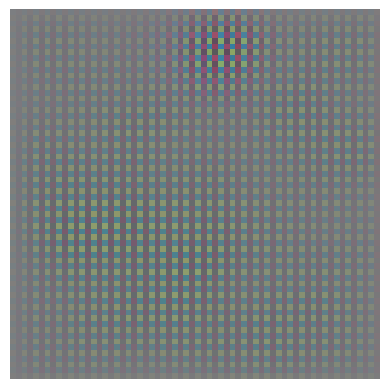

Epoch 601, Generator Loss: 3.6811, Discriminator Loss: 0.0444
Epoch 602, Generator Loss: 3.7294, Discriminator Loss: 0.0451
Epoch 603, Generator Loss: 3.7895, Discriminator Loss: 0.0453
Epoch 604, Generator Loss: 3.2227, Discriminator Loss: 0.0951
Epoch 605, Generator Loss: 3.4220, Discriminator Loss: 0.1177
Epoch 606, Generator Loss: 3.7727, Discriminator Loss: 0.0800
Epoch 607, Generator Loss: 3.6069, Discriminator Loss: 0.1257
Epoch 608, Generator Loss: 3.8312, Discriminator Loss: 0.1000
Epoch 609, Generator Loss: 3.8596, Discriminator Loss: 0.1364
Epoch 610, Generator Loss: 3.6434, Discriminator Loss: 0.1128


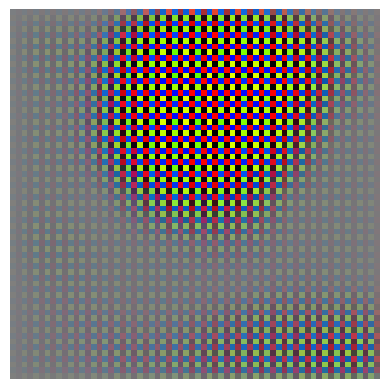

Epoch 611, Generator Loss: 4.0820, Discriminator Loss: 0.0876
Epoch 612, Generator Loss: 4.0207, Discriminator Loss: 0.0675
Epoch 613, Generator Loss: 4.1041, Discriminator Loss: 0.0610
Epoch 614, Generator Loss: 3.8534, Discriminator Loss: 0.0500
Epoch 615, Generator Loss: 3.5363, Discriminator Loss: 0.0532
Epoch 616, Generator Loss: 3.6838, Discriminator Loss: 0.0416
Epoch 617, Generator Loss: 3.6526, Discriminator Loss: 0.0406
Epoch 618, Generator Loss: 4.0292, Discriminator Loss: 0.0318
Epoch 619, Generator Loss: 3.9604, Discriminator Loss: 0.0343
Epoch 620, Generator Loss: 4.4095, Discriminator Loss: 0.0276


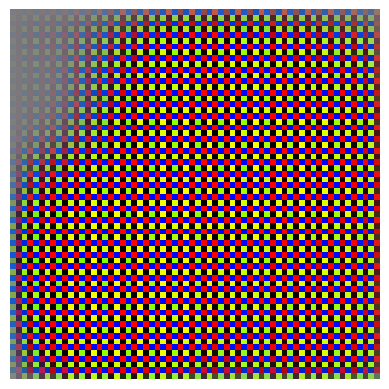

Epoch 621, Generator Loss: 4.6359, Discriminator Loss: 0.0280
Epoch 622, Generator Loss: 4.6578, Discriminator Loss: 0.0300
Epoch 623, Generator Loss: 4.7695, Discriminator Loss: 0.0271
Epoch 624, Generator Loss: 4.9095, Discriminator Loss: 0.0276
Epoch 625, Generator Loss: 5.1092, Discriminator Loss: 0.0272
Epoch 626, Generator Loss: 4.9934, Discriminator Loss: 0.0297
Epoch 627, Generator Loss: 5.6123, Discriminator Loss: 0.0278
Epoch 628, Generator Loss: 5.4557, Discriminator Loss: 0.0309
Epoch 629, Generator Loss: 5.9717, Discriminator Loss: 0.0262
Epoch 630, Generator Loss: 5.4359, Discriminator Loss: 0.0332


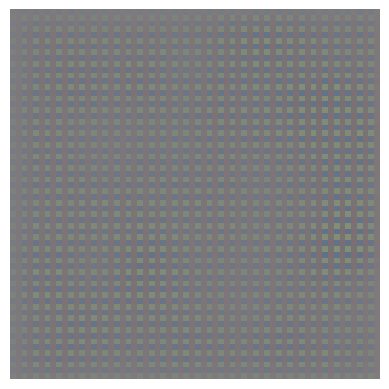

Epoch 631, Generator Loss: 5.1123, Discriminator Loss: 0.0356
Epoch 632, Generator Loss: 5.2260, Discriminator Loss: 0.0353
Epoch 633, Generator Loss: 5.1856, Discriminator Loss: 0.0362
Epoch 634, Generator Loss: 4.7355, Discriminator Loss: 0.0375
Epoch 635, Generator Loss: 5.3882, Discriminator Loss: 0.0293
Epoch 636, Generator Loss: 4.2953, Discriminator Loss: 0.0466
Epoch 637, Generator Loss: 4.4770, Discriminator Loss: 0.0474
Epoch 638, Generator Loss: 3.9626, Discriminator Loss: 0.0499
Epoch 639, Generator Loss: 4.0215, Discriminator Loss: 0.0486
Epoch 640, Generator Loss: 4.1360, Discriminator Loss: 0.0489


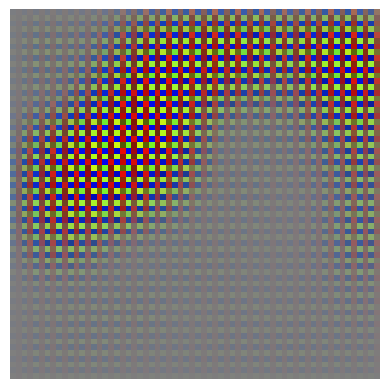

Epoch 641, Generator Loss: 3.3632, Discriminator Loss: 0.0778
Epoch 642, Generator Loss: 2.9926, Discriminator Loss: 0.1088
Epoch 643, Generator Loss: 2.9631, Discriminator Loss: 0.1354
Epoch 644, Generator Loss: 2.8057, Discriminator Loss: 0.2210
Epoch 645, Generator Loss: 2.6800, Discriminator Loss: 0.4071
Epoch 646, Generator Loss: 3.1180, Discriminator Loss: 0.4037
Epoch 647, Generator Loss: 3.4530, Discriminator Loss: 0.5703
Epoch 648, Generator Loss: 3.1986, Discriminator Loss: 0.4352
Epoch 649, Generator Loss: 3.4192, Discriminator Loss: 0.3031
Epoch 650, Generator Loss: 3.1874, Discriminator Loss: 0.2201


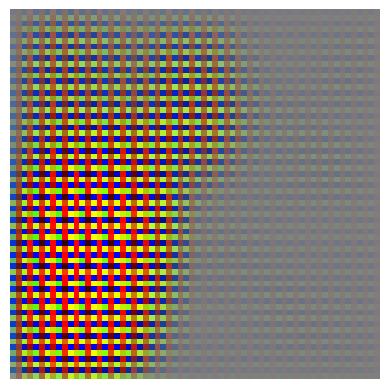

Epoch 651, Generator Loss: 3.2215, Discriminator Loss: 0.1193
Epoch 652, Generator Loss: 3.5951, Discriminator Loss: 0.0623
Epoch 653, Generator Loss: 3.6569, Discriminator Loss: 0.0463
Epoch 654, Generator Loss: 3.7356, Discriminator Loss: 0.0407
Epoch 655, Generator Loss: 3.7115, Discriminator Loss: 0.0393
Epoch 656, Generator Loss: 4.4048, Discriminator Loss: 0.0271
Epoch 657, Generator Loss: 4.2417, Discriminator Loss: 0.0329
Epoch 658, Generator Loss: 4.9526, Discriminator Loss: 0.0249
Epoch 659, Generator Loss: 5.1122, Discriminator Loss: 0.0296
Epoch 660, Generator Loss: 5.1020, Discriminator Loss: 0.0284


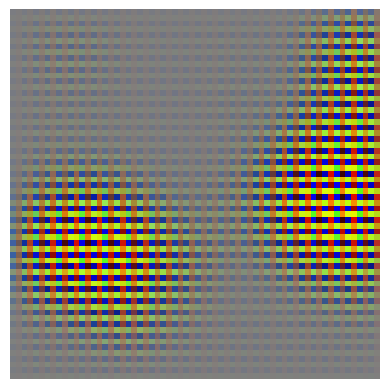

Epoch 661, Generator Loss: 4.9419, Discriminator Loss: 0.0361
Epoch 662, Generator Loss: 5.3239, Discriminator Loss: 0.0298
Epoch 663, Generator Loss: 5.6568, Discriminator Loss: 0.0266
Epoch 664, Generator Loss: 6.5426, Discriminator Loss: 0.0273
Epoch 665, Generator Loss: 6.6246, Discriminator Loss: 0.0251
Epoch 666, Generator Loss: 6.4037, Discriminator Loss: 0.0265
Epoch 667, Generator Loss: 6.0111, Discriminator Loss: 0.0302
Epoch 668, Generator Loss: 6.1146, Discriminator Loss: 0.0252
Epoch 669, Generator Loss: 5.3716, Discriminator Loss: 0.0260
Epoch 670, Generator Loss: 4.8808, Discriminator Loss: 0.0353


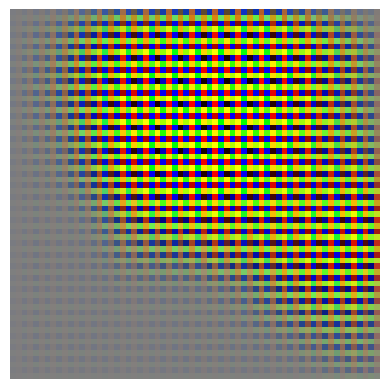

Epoch 671, Generator Loss: 5.0423, Discriminator Loss: 0.0261
Epoch 672, Generator Loss: 4.5942, Discriminator Loss: 0.0333
Epoch 673, Generator Loss: 4.2673, Discriminator Loss: 0.0364
Epoch 674, Generator Loss: 4.5182, Discriminator Loss: 0.0334
Epoch 675, Generator Loss: 4.4761, Discriminator Loss: 0.0357
Epoch 676, Generator Loss: 4.3736, Discriminator Loss: 0.0343
Epoch 677, Generator Loss: 4.3581, Discriminator Loss: 0.0401
Epoch 678, Generator Loss: 4.5906, Discriminator Loss: 0.0420
Epoch 679, Generator Loss: 4.7651, Discriminator Loss: 0.0364
Epoch 680, Generator Loss: 4.7653, Discriminator Loss: 0.0377


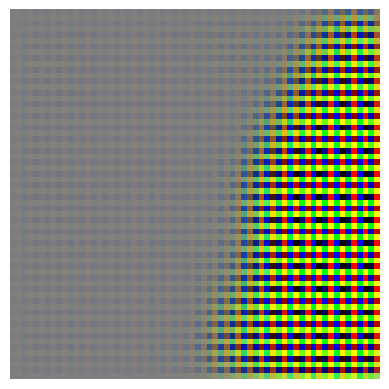

Epoch 681, Generator Loss: 4.9118, Discriminator Loss: 0.0372
Epoch 682, Generator Loss: 5.0070, Discriminator Loss: 0.0365
Epoch 683, Generator Loss: 4.7035, Discriminator Loss: 0.0409
Epoch 684, Generator Loss: 4.3433, Discriminator Loss: 0.0430
Epoch 685, Generator Loss: 4.2681, Discriminator Loss: 0.0384
Epoch 686, Generator Loss: 4.6837, Discriminator Loss: 0.0342
Epoch 687, Generator Loss: 4.1820, Discriminator Loss: 0.0409
Epoch 688, Generator Loss: 4.0795, Discriminator Loss: 0.0401
Epoch 689, Generator Loss: 4.0103, Discriminator Loss: 0.0402
Epoch 690, Generator Loss: 3.9724, Discriminator Loss: 0.0474


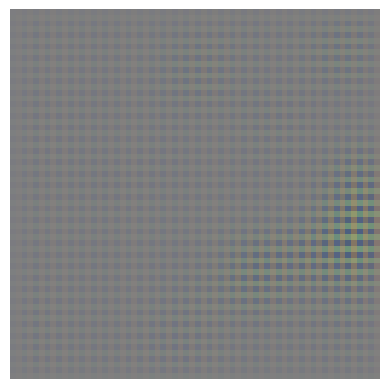

Epoch 691, Generator Loss: 4.1305, Discriminator Loss: 0.0389
Epoch 692, Generator Loss: 3.8869, Discriminator Loss: 0.0463
Epoch 693, Generator Loss: 4.1286, Discriminator Loss: 0.0435
Epoch 694, Generator Loss: 4.1013, Discriminator Loss: 0.0469
Epoch 695, Generator Loss: 3.8587, Discriminator Loss: 0.0533
Epoch 696, Generator Loss: 3.6931, Discriminator Loss: 0.0573
Epoch 697, Generator Loss: 3.4811, Discriminator Loss: 0.0574
Epoch 698, Generator Loss: 3.3564, Discriminator Loss: 0.0623
Epoch 699, Generator Loss: 3.2970, Discriminator Loss: 0.0641
Epoch 700, Generator Loss: 3.3306, Discriminator Loss: 0.0699


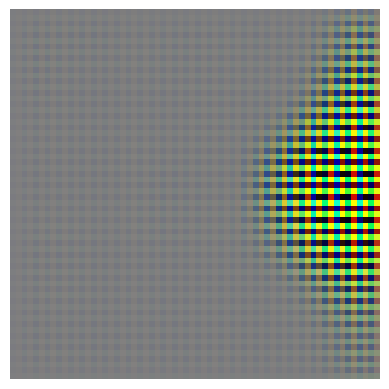

Epoch 701, Generator Loss: 2.9805, Discriminator Loss: 0.1113
Epoch 702, Generator Loss: 3.5302, Discriminator Loss: 0.0859
Epoch 703, Generator Loss: 3.7317, Discriminator Loss: 0.0959
Epoch 704, Generator Loss: 4.1477, Discriminator Loss: 0.0862
Epoch 705, Generator Loss: 4.3179, Discriminator Loss: 0.0653
Epoch 706, Generator Loss: 3.4883, Discriminator Loss: 0.1377
Epoch 707, Generator Loss: 3.6276, Discriminator Loss: 0.0836
Epoch 708, Generator Loss: 3.9970, Discriminator Loss: 0.0556
Epoch 709, Generator Loss: 3.9707, Discriminator Loss: 0.0542
Epoch 710, Generator Loss: 3.9908, Discriminator Loss: 0.0484


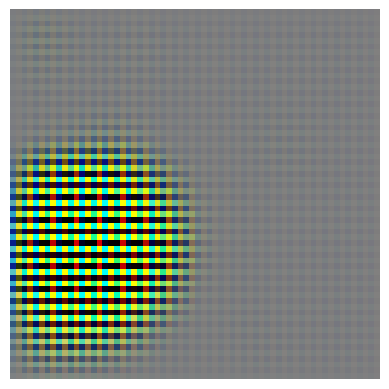

Epoch 711, Generator Loss: 3.8016, Discriminator Loss: 0.0448
Epoch 712, Generator Loss: 4.2913, Discriminator Loss: 0.0369
Epoch 713, Generator Loss: 4.3566, Discriminator Loss: 0.0320
Epoch 714, Generator Loss: 4.5428, Discriminator Loss: 0.0281
Epoch 715, Generator Loss: 4.9592, Discriminator Loss: 0.0243
Epoch 716, Generator Loss: 4.8549, Discriminator Loss: 0.0285
Epoch 717, Generator Loss: 5.0456, Discriminator Loss: 0.0232
Epoch 718, Generator Loss: 5.2467, Discriminator Loss: 0.0230
Epoch 719, Generator Loss: 5.2156, Discriminator Loss: 0.0232
Epoch 720, Generator Loss: 5.1297, Discriminator Loss: 0.0236


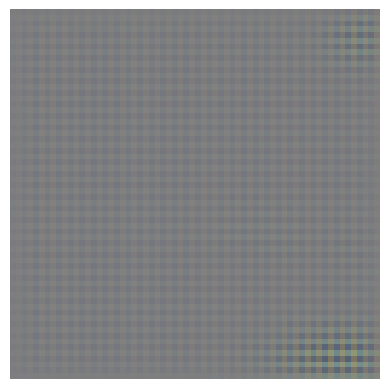

Epoch 721, Generator Loss: 5.2641, Discriminator Loss: 0.0220
Epoch 722, Generator Loss: 5.8793, Discriminator Loss: 0.0193
Epoch 723, Generator Loss: 6.0946, Discriminator Loss: 0.0197
Epoch 724, Generator Loss: 5.8354, Discriminator Loss: 0.0182
Epoch 725, Generator Loss: 6.2868, Discriminator Loss: 0.0170
Epoch 726, Generator Loss: 6.2421, Discriminator Loss: 0.0178
Epoch 727, Generator Loss: 6.0850, Discriminator Loss: 0.0197
Epoch 728, Generator Loss: 6.2156, Discriminator Loss: 0.0183
Epoch 729, Generator Loss: 5.4923, Discriminator Loss: 0.0215
Epoch 730, Generator Loss: 5.5174, Discriminator Loss: 0.0232


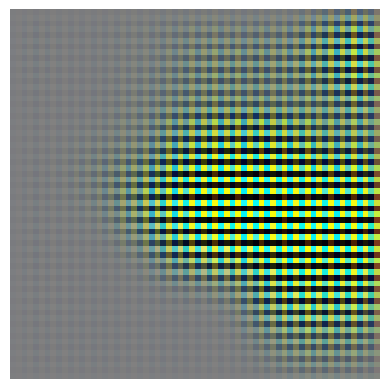

Epoch 731, Generator Loss: 6.4730, Discriminator Loss: 0.0178
Epoch 732, Generator Loss: 5.8052, Discriminator Loss: 0.0170
Epoch 733, Generator Loss: 6.3266, Discriminator Loss: 0.0184
Epoch 734, Generator Loss: 6.6180, Discriminator Loss: 0.0155
Epoch 735, Generator Loss: 5.9449, Discriminator Loss: 0.0188
Epoch 736, Generator Loss: 5.7488, Discriminator Loss: 0.0203
Epoch 737, Generator Loss: 6.1614, Discriminator Loss: 0.0166
Epoch 738, Generator Loss: 5.7970, Discriminator Loss: 0.0207
Epoch 739, Generator Loss: 6.2677, Discriminator Loss: 0.0182
Epoch 740, Generator Loss: 5.9348, Discriminator Loss: 0.0220


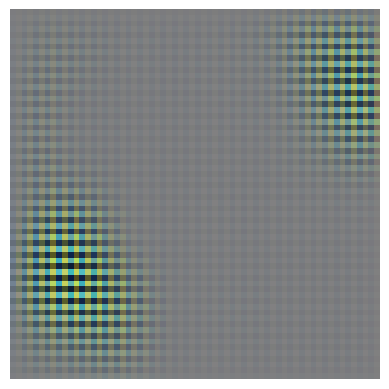

Epoch 741, Generator Loss: 6.3382, Discriminator Loss: 0.0182
Epoch 742, Generator Loss: 6.6794, Discriminator Loss: 0.0153
Epoch 743, Generator Loss: 5.4414, Discriminator Loss: 0.0219
Epoch 744, Generator Loss: 5.9983, Discriminator Loss: 0.0173
Epoch 745, Generator Loss: 5.6494, Discriminator Loss: 0.0192
Epoch 746, Generator Loss: 5.2008, Discriminator Loss: 0.0224
Epoch 747, Generator Loss: 5.3698, Discriminator Loss: 0.0215
Epoch 748, Generator Loss: 5.1492, Discriminator Loss: 0.0219
Epoch 749, Generator Loss: 4.9848, Discriminator Loss: 0.0222
Epoch 750, Generator Loss: 4.5878, Discriminator Loss: 0.0247


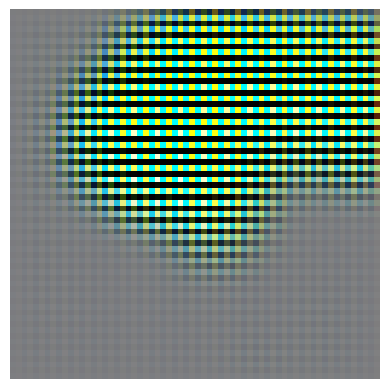

Epoch 751, Generator Loss: 4.5724, Discriminator Loss: 0.0255
Epoch 752, Generator Loss: 4.4791, Discriminator Loss: 0.0252
Epoch 753, Generator Loss: 4.2148, Discriminator Loss: 0.0299
Epoch 754, Generator Loss: 4.0347, Discriminator Loss: 0.0315
Epoch 755, Generator Loss: 4.0540, Discriminator Loss: 0.0321
Epoch 756, Generator Loss: 4.0423, Discriminator Loss: 0.0351
Epoch 757, Generator Loss: 4.0297, Discriminator Loss: 0.0364
Epoch 758, Generator Loss: 4.3172, Discriminator Loss: 0.0373
Epoch 759, Generator Loss: 4.4957, Discriminator Loss: 0.0352
Epoch 760, Generator Loss: 4.4238, Discriminator Loss: 0.0386


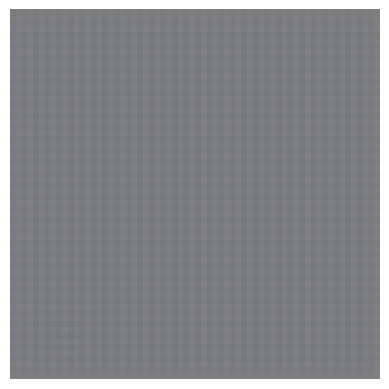

Epoch 761, Generator Loss: 4.7724, Discriminator Loss: 0.0302
Epoch 762, Generator Loss: 4.4808, Discriminator Loss: 0.0307
Epoch 763, Generator Loss: 4.3820, Discriminator Loss: 0.0291
Epoch 764, Generator Loss: 4.0893, Discriminator Loss: 0.0329
Epoch 765, Generator Loss: 4.1446, Discriminator Loss: 0.0336
Epoch 766, Generator Loss: 4.1771, Discriminator Loss: 0.0311
Epoch 767, Generator Loss: 4.5520, Discriminator Loss: 0.0260
Epoch 768, Generator Loss: 4.4766, Discriminator Loss: 0.0322
Epoch 769, Generator Loss: 4.5179, Discriminator Loss: 0.0316
Epoch 770, Generator Loss: 4.8281, Discriminator Loss: 0.0267


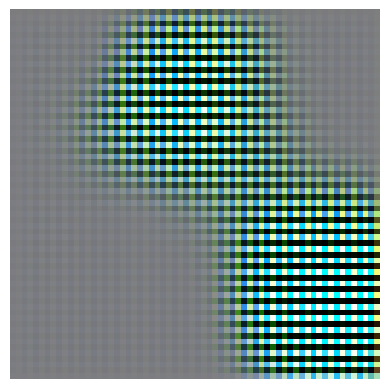

Epoch 771, Generator Loss: 4.9386, Discriminator Loss: 0.0290
Epoch 772, Generator Loss: 5.1336, Discriminator Loss: 0.0309
Epoch 773, Generator Loss: 4.9611, Discriminator Loss: 0.0298
Epoch 774, Generator Loss: 4.6339, Discriminator Loss: 0.0330
Epoch 775, Generator Loss: 4.4814, Discriminator Loss: 0.0312
Epoch 776, Generator Loss: 4.5635, Discriminator Loss: 0.0335
Epoch 777, Generator Loss: 4.6394, Discriminator Loss: 0.0311
Epoch 778, Generator Loss: 4.4944, Discriminator Loss: 0.0306
Epoch 779, Generator Loss: 4.1689, Discriminator Loss: 0.0389
Epoch 780, Generator Loss: 4.0934, Discriminator Loss: 0.0399


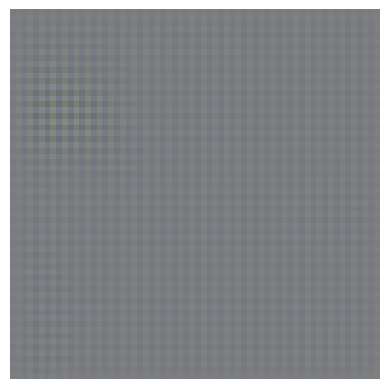

Epoch 781, Generator Loss: 4.1832, Discriminator Loss: 0.0383
Epoch 782, Generator Loss: 3.8828, Discriminator Loss: 0.0504
Epoch 783, Generator Loss: 3.8017, Discriminator Loss: 0.0548
Epoch 784, Generator Loss: 4.1825, Discriminator Loss: 0.0551
Epoch 785, Generator Loss: 4.1349, Discriminator Loss: 0.0745
Epoch 786, Generator Loss: 3.7791, Discriminator Loss: 0.1136
Epoch 787, Generator Loss: 4.0925, Discriminator Loss: 0.1243
Epoch 788, Generator Loss: 4.9055, Discriminator Loss: 0.0972
Epoch 789, Generator Loss: 4.0733, Discriminator Loss: 0.1044
Epoch 790, Generator Loss: 4.2684, Discriminator Loss: 0.1179


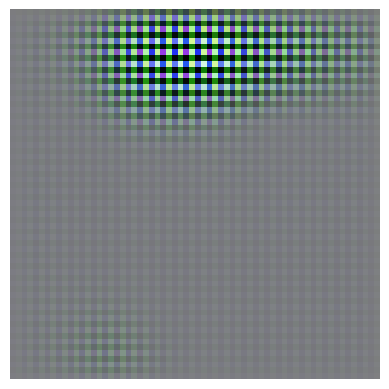

Epoch 791, Generator Loss: 4.8427, Discriminator Loss: 0.0644
Epoch 792, Generator Loss: 4.1720, Discriminator Loss: 0.0756
Epoch 793, Generator Loss: 4.1666, Discriminator Loss: 0.0628
Epoch 794, Generator Loss: 3.9216, Discriminator Loss: 0.0573
Epoch 795, Generator Loss: 4.1276, Discriminator Loss: 0.0452
Epoch 796, Generator Loss: 3.9734, Discriminator Loss: 0.0450
Epoch 797, Generator Loss: 4.1874, Discriminator Loss: 0.0455
Epoch 798, Generator Loss: 4.2480, Discriminator Loss: 0.0389
Epoch 799, Generator Loss: 4.2808, Discriminator Loss: 0.0399
Epoch 800, Generator Loss: 4.0995, Discriminator Loss: 0.0413


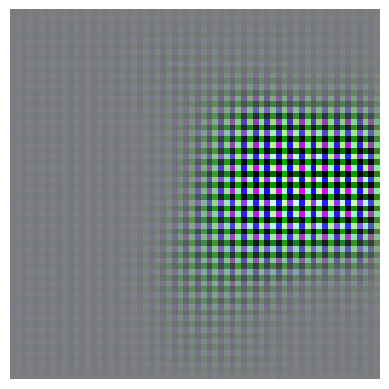

Epoch 801, Generator Loss: 4.0872, Discriminator Loss: 0.0404
Epoch 802, Generator Loss: 4.0971, Discriminator Loss: 0.0362
Epoch 803, Generator Loss: 4.2029, Discriminator Loss: 0.0334
Epoch 804, Generator Loss: 4.0636, Discriminator Loss: 0.0369
Epoch 805, Generator Loss: 4.1362, Discriminator Loss: 0.0334
Epoch 806, Generator Loss: 4.0057, Discriminator Loss: 0.0418
Epoch 807, Generator Loss: 3.9958, Discriminator Loss: 0.0435
Epoch 808, Generator Loss: 3.8681, Discriminator Loss: 0.0509
Epoch 809, Generator Loss: 3.7657, Discriminator Loss: 0.0572
Epoch 810, Generator Loss: 3.8544, Discriminator Loss: 0.0547


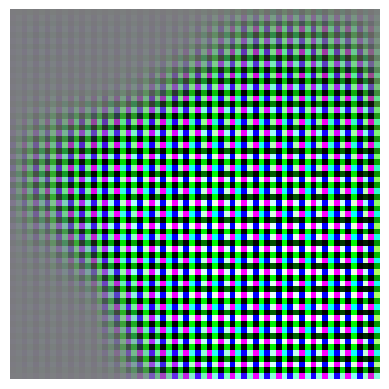

Epoch 811, Generator Loss: 3.3311, Discriminator Loss: 0.1032
Epoch 812, Generator Loss: 3.9589, Discriminator Loss: 0.1106
Epoch 813, Generator Loss: 4.1368, Discriminator Loss: 0.1582
Epoch 814, Generator Loss: 4.4346, Discriminator Loss: 0.2687
Epoch 815, Generator Loss: 5.1991, Discriminator Loss: 0.1379
Epoch 816, Generator Loss: 4.1476, Discriminator Loss: 0.3159
Epoch 817, Generator Loss: 4.8103, Discriminator Loss: 0.1419
Epoch 818, Generator Loss: 6.0050, Discriminator Loss: 0.0685
Epoch 819, Generator Loss: 5.7105, Discriminator Loss: 0.0508
Epoch 820, Generator Loss: 5.4001, Discriminator Loss: 0.0294


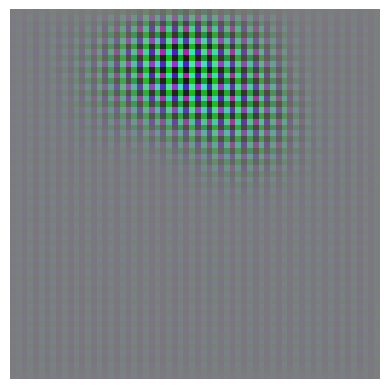

Epoch 821, Generator Loss: 4.9796, Discriminator Loss: 0.0279
Epoch 822, Generator Loss: 5.2874, Discriminator Loss: 0.0203
Epoch 823, Generator Loss: 5.4474, Discriminator Loss: 0.0344
Epoch 824, Generator Loss: 5.9897, Discriminator Loss: 0.0309
Epoch 825, Generator Loss: 6.5309, Discriminator Loss: 0.0157
Epoch 826, Generator Loss: 6.8928, Discriminator Loss: 0.0312
Epoch 827, Generator Loss: 7.3960, Discriminator Loss: 0.0238
Epoch 828, Generator Loss: 8.2325, Discriminator Loss: 0.0159
Epoch 829, Generator Loss: 8.6598, Discriminator Loss: 0.0219
Epoch 830, Generator Loss: 8.6061, Discriminator Loss: 0.0257


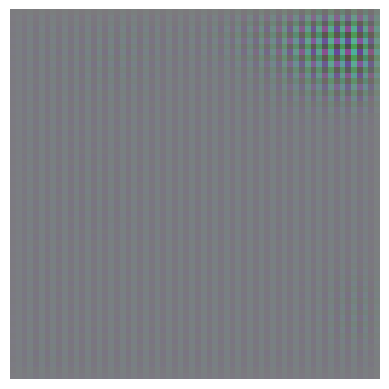

Epoch 831, Generator Loss: 8.7897, Discriminator Loss: 0.0225
Epoch 832, Generator Loss: 7.8536, Discriminator Loss: 0.0241
Epoch 833, Generator Loss: 9.1364, Discriminator Loss: 0.0248
Epoch 834, Generator Loss: 8.3086, Discriminator Loss: 0.0215
Epoch 835, Generator Loss: 9.8766, Discriminator Loss: 0.0174
Epoch 836, Generator Loss: 8.5443, Discriminator Loss: 0.0242
Epoch 837, Generator Loss: 7.8907, Discriminator Loss: 0.0375
Epoch 838, Generator Loss: 8.1871, Discriminator Loss: 0.0307
Epoch 839, Generator Loss: 7.1511, Discriminator Loss: 0.0254
Epoch 840, Generator Loss: 8.8429, Discriminator Loss: 0.0202


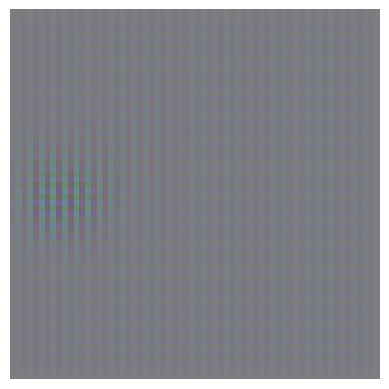

Epoch 841, Generator Loss: 8.4280, Discriminator Loss: 0.0206
Epoch 842, Generator Loss: 9.2423, Discriminator Loss: 0.0189
Epoch 843, Generator Loss: 7.5988, Discriminator Loss: 0.0314
Epoch 844, Generator Loss: 7.7333, Discriminator Loss: 0.0281
Epoch 845, Generator Loss: 7.4273, Discriminator Loss: 0.0320
Epoch 846, Generator Loss: 8.6336, Discriminator Loss: 0.0230
Epoch 847, Generator Loss: 7.1734, Discriminator Loss: 0.0290
Epoch 848, Generator Loss: 7.5712, Discriminator Loss: 0.0261
Epoch 849, Generator Loss: 9.6127, Discriminator Loss: 0.0221
Epoch 850, Generator Loss: 6.7660, Discriminator Loss: 0.0335


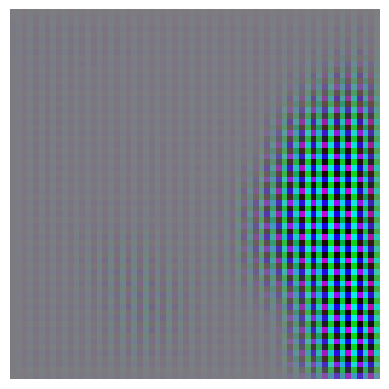

Epoch 851, Generator Loss: 7.3120, Discriminator Loss: 0.0264
Epoch 852, Generator Loss: 8.0651, Discriminator Loss: 0.0222
Epoch 853, Generator Loss: 7.7617, Discriminator Loss: 0.0253
Epoch 854, Generator Loss: 7.1120, Discriminator Loss: 0.0327
Epoch 855, Generator Loss: 6.1362, Discriminator Loss: 0.0356
Epoch 856, Generator Loss: 5.5833, Discriminator Loss: 0.0288
Epoch 857, Generator Loss: 5.1098, Discriminator Loss: 0.0335
Epoch 858, Generator Loss: 5.2427, Discriminator Loss: 0.0353
Epoch 859, Generator Loss: 5.2477, Discriminator Loss: 0.0371
Epoch 860, Generator Loss: 5.2604, Discriminator Loss: 0.0356


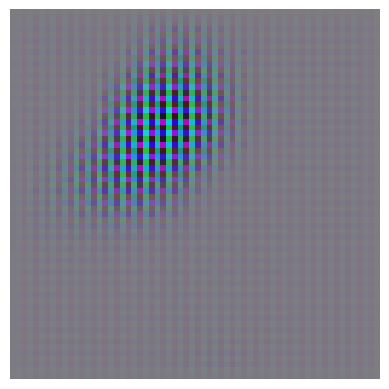

Epoch 861, Generator Loss: 5.5382, Discriminator Loss: 0.0365
Epoch 862, Generator Loss: 4.2957, Discriminator Loss: 0.0434
Epoch 863, Generator Loss: 4.9365, Discriminator Loss: 0.0417
Epoch 864, Generator Loss: 4.2026, Discriminator Loss: 0.0570
Epoch 865, Generator Loss: 3.5471, Discriminator Loss: 0.0732
Epoch 866, Generator Loss: 4.0932, Discriminator Loss: 0.0904
Epoch 867, Generator Loss: 4.0428, Discriminator Loss: 0.1066
Epoch 868, Generator Loss: 4.2253, Discriminator Loss: 0.1022
Epoch 869, Generator Loss: 3.2877, Discriminator Loss: 0.1342
Epoch 870, Generator Loss: 2.9048, Discriminator Loss: 0.2564


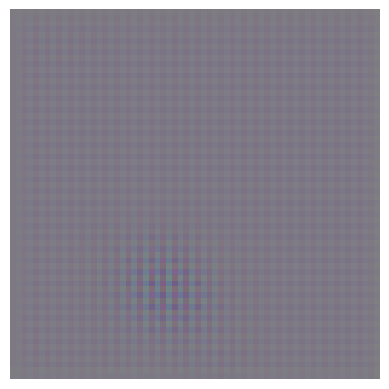

Epoch 871, Generator Loss: 3.3355, Discriminator Loss: 0.3070
Epoch 872, Generator Loss: 4.5050, Discriminator Loss: 0.4447
Epoch 873, Generator Loss: 3.6669, Discriminator Loss: 0.5748
Epoch 874, Generator Loss: 3.7524, Discriminator Loss: 0.4258
Epoch 875, Generator Loss: 3.5645, Discriminator Loss: 0.6172
Epoch 876, Generator Loss: 5.1500, Discriminator Loss: 0.6597
Epoch 877, Generator Loss: 4.4866, Discriminator Loss: 0.3532
Epoch 878, Generator Loss: 3.5938, Discriminator Loss: 0.3415
Epoch 879, Generator Loss: 3.6935, Discriminator Loss: 0.3145
Epoch 880, Generator Loss: 4.1878, Discriminator Loss: 0.2428


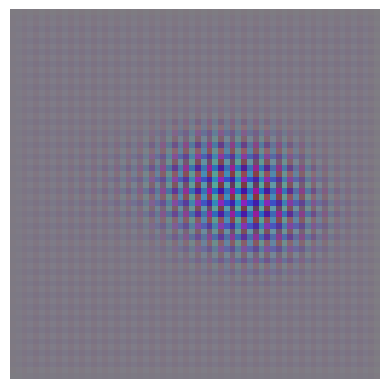

Epoch 881, Generator Loss: 5.3523, Discriminator Loss: 0.2114
Epoch 882, Generator Loss: 4.8921, Discriminator Loss: 0.1997
Epoch 883, Generator Loss: 4.8895, Discriminator Loss: 0.0907
Epoch 884, Generator Loss: 4.0731, Discriminator Loss: 0.0674
Epoch 885, Generator Loss: 3.0795, Discriminator Loss: 0.2483
Epoch 886, Generator Loss: 3.5745, Discriminator Loss: 0.1386
Epoch 887, Generator Loss: 5.6735, Discriminator Loss: 0.0696
Epoch 888, Generator Loss: 6.0361, Discriminator Loss: 0.0918
Epoch 889, Generator Loss: 6.4170, Discriminator Loss: 0.0994
Epoch 890, Generator Loss: 6.0029, Discriminator Loss: 0.0569


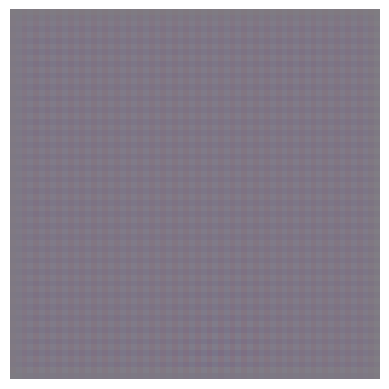

Epoch 891, Generator Loss: 5.2964, Discriminator Loss: 0.0259
Epoch 892, Generator Loss: 3.8920, Discriminator Loss: 0.0441
Epoch 893, Generator Loss: 3.4475, Discriminator Loss: 0.0660
Epoch 894, Generator Loss: 3.5149, Discriminator Loss: 0.0573
Epoch 895, Generator Loss: 3.7068, Discriminator Loss: 0.0504
Epoch 896, Generator Loss: 4.4793, Discriminator Loss: 0.0349
Epoch 897, Generator Loss: 4.8566, Discriminator Loss: 0.0476
Epoch 898, Generator Loss: 5.5744, Discriminator Loss: 0.0633
Epoch 899, Generator Loss: 5.9545, Discriminator Loss: 0.0864
Epoch 900, Generator Loss: 5.1386, Discriminator Loss: 0.0795


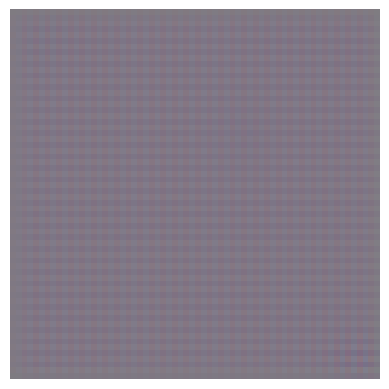

Epoch 901, Generator Loss: 3.8497, Discriminator Loss: 0.1158
Epoch 902, Generator Loss: 3.6874, Discriminator Loss: 0.2039
Epoch 903, Generator Loss: 4.4900, Discriminator Loss: 0.1230
Epoch 904, Generator Loss: 4.6954, Discriminator Loss: 0.1574
Epoch 905, Generator Loss: 5.6465, Discriminator Loss: 0.1899
Epoch 906, Generator Loss: 4.2715, Discriminator Loss: 0.2216
Epoch 907, Generator Loss: 3.9601, Discriminator Loss: 0.3650
Epoch 908, Generator Loss: 4.2016, Discriminator Loss: 0.3982
Epoch 909, Generator Loss: 4.4049, Discriminator Loss: 0.5580
Epoch 910, Generator Loss: 3.9406, Discriminator Loss: 0.5459


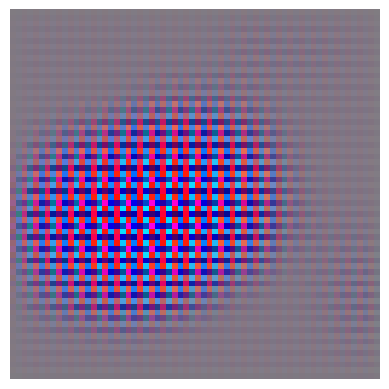

Epoch 911, Generator Loss: 4.6599, Discriminator Loss: 0.6739
Epoch 912, Generator Loss: 5.3738, Discriminator Loss: 0.4744
Epoch 913, Generator Loss: 3.7466, Discriminator Loss: 0.4992
Epoch 914, Generator Loss: 3.6720, Discriminator Loss: 0.4843
Epoch 915, Generator Loss: 4.7157, Discriminator Loss: 0.4649
Epoch 916, Generator Loss: 4.8029, Discriminator Loss: 0.3814
Epoch 917, Generator Loss: 4.0808, Discriminator Loss: 0.2490
Epoch 918, Generator Loss: 4.1833, Discriminator Loss: 0.2080
Epoch 919, Generator Loss: 3.2466, Discriminator Loss: 0.2362
Epoch 920, Generator Loss: 4.8470, Discriminator Loss: 0.1135


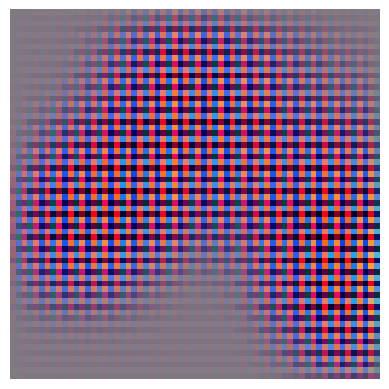

Epoch 921, Generator Loss: 5.4960, Discriminator Loss: 0.0688
Epoch 922, Generator Loss: 5.7643, Discriminator Loss: 0.0854
Epoch 923, Generator Loss: 5.2637, Discriminator Loss: 0.0518
Epoch 924, Generator Loss: 4.7167, Discriminator Loss: 0.0490
Epoch 925, Generator Loss: 4.0519, Discriminator Loss: 0.0632
Epoch 926, Generator Loss: 4.4679, Discriminator Loss: 0.0393
Epoch 927, Generator Loss: 3.5475, Discriminator Loss: 0.1024
Epoch 928, Generator Loss: 3.7453, Discriminator Loss: 0.1250
Epoch 929, Generator Loss: 3.5785, Discriminator Loss: 0.1677
Epoch 930, Generator Loss: 5.9324, Discriminator Loss: 0.1517


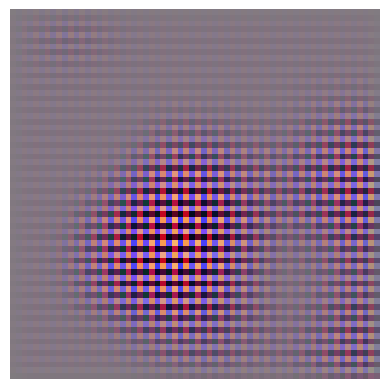

Epoch 931, Generator Loss: 4.9520, Discriminator Loss: 0.2564
Epoch 932, Generator Loss: 4.3022, Discriminator Loss: 0.2683
Epoch 933, Generator Loss: 3.7392, Discriminator Loss: 0.5460
Epoch 934, Generator Loss: 3.8906, Discriminator Loss: 0.3267
Epoch 935, Generator Loss: 4.5496, Discriminator Loss: 0.5255
Epoch 936, Generator Loss: 5.5375, Discriminator Loss: 0.4120
Epoch 937, Generator Loss: 5.8786, Discriminator Loss: 0.2570
Epoch 938, Generator Loss: 4.5798, Discriminator Loss: 0.2051
Epoch 939, Generator Loss: 4.3958, Discriminator Loss: 0.0931
Epoch 940, Generator Loss: 4.9220, Discriminator Loss: 0.0437


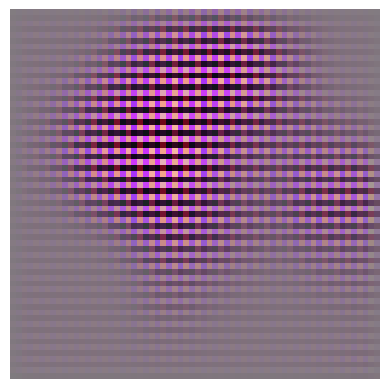

Epoch 941, Generator Loss: 4.9493, Discriminator Loss: 0.0281
Epoch 942, Generator Loss: 4.8991, Discriminator Loss: 0.0183
Epoch 943, Generator Loss: 6.1846, Discriminator Loss: 0.0061
Epoch 944, Generator Loss: 6.4362, Discriminator Loss: 0.0063
Epoch 945, Generator Loss: 6.9018, Discriminator Loss: 0.0038
Epoch 946, Generator Loss: 7.4393, Discriminator Loss: 0.0029
Epoch 947, Generator Loss: 7.8297, Discriminator Loss: 0.0025
Epoch 948, Generator Loss: 7.9425, Discriminator Loss: 0.0026
Epoch 949, Generator Loss: 8.2206, Discriminator Loss: 0.0024
Epoch 950, Generator Loss: 8.8998, Discriminator Loss: 0.0019


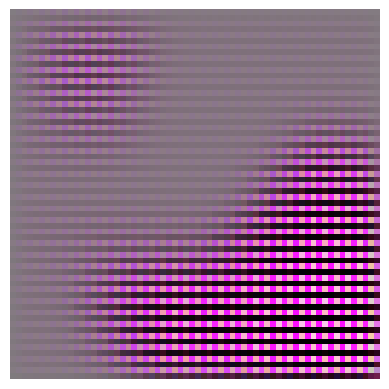

Epoch 951, Generator Loss: 9.5376, Discriminator Loss: 0.0021
Epoch 952, Generator Loss: 8.6857, Discriminator Loss: 0.0019
Epoch 953, Generator Loss: 8.9598, Discriminator Loss: 0.0025
Epoch 954, Generator Loss: 9.3353, Discriminator Loss: 0.0019
Epoch 955, Generator Loss: 9.3631, Discriminator Loss: 0.0025
Epoch 956, Generator Loss: 9.9165, Discriminator Loss: 0.0019
Epoch 957, Generator Loss: 9.0298, Discriminator Loss: 0.0025
Epoch 958, Generator Loss: 8.6279, Discriminator Loss: 0.0033
Epoch 959, Generator Loss: 8.3309, Discriminator Loss: 0.0027
Epoch 960, Generator Loss: 9.2504, Discriminator Loss: 0.0030


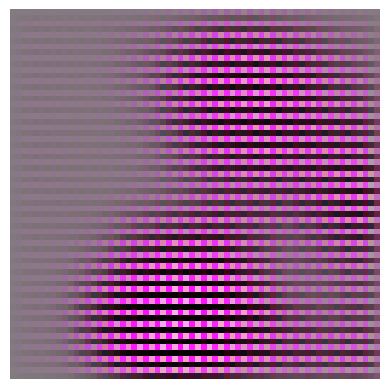

Epoch 961, Generator Loss: 7.6012, Discriminator Loss: 0.0033
Epoch 962, Generator Loss: 8.8999, Discriminator Loss: 0.0034
Epoch 963, Generator Loss: 9.6290, Discriminator Loss: 0.0026
Epoch 964, Generator Loss: 8.4634, Discriminator Loss: 0.0036
Epoch 965, Generator Loss: 7.9813, Discriminator Loss: 0.0038
Epoch 966, Generator Loss: 8.3333, Discriminator Loss: 0.0034
Epoch 967, Generator Loss: 7.0118, Discriminator Loss: 0.0059
Epoch 968, Generator Loss: 8.2509, Discriminator Loss: 0.0047
Epoch 969, Generator Loss: 7.2459, Discriminator Loss: 0.0049
Epoch 970, Generator Loss: 6.8284, Discriminator Loss: 0.0063


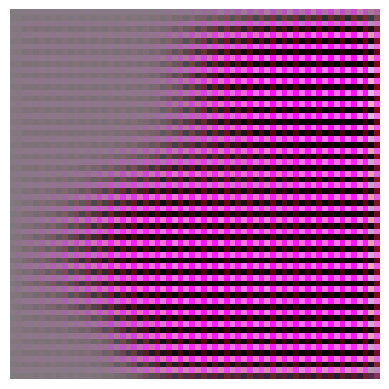

Epoch 971, Generator Loss: 6.5869, Discriminator Loss: 0.0067
Epoch 972, Generator Loss: 5.9076, Discriminator Loss: 0.0072
Epoch 973, Generator Loss: 6.2540, Discriminator Loss: 0.0082
Epoch 974, Generator Loss: 5.7520, Discriminator Loss: 0.0107
Epoch 975, Generator Loss: 5.2127, Discriminator Loss: 0.0126
Epoch 976, Generator Loss: 5.1579, Discriminator Loss: 0.0144
Epoch 977, Generator Loss: 4.4730, Discriminator Loss: 0.0229
Epoch 978, Generator Loss: 3.8181, Discriminator Loss: 0.0345
Epoch 979, Generator Loss: 3.4488, Discriminator Loss: 0.0531
Epoch 980, Generator Loss: 3.8495, Discriminator Loss: 0.0508


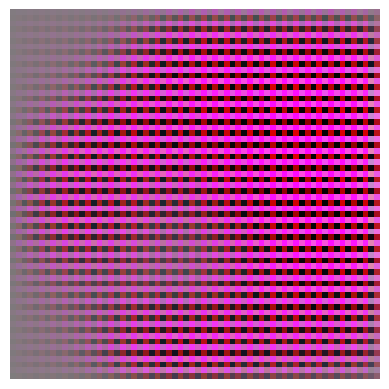

Epoch 981, Generator Loss: 3.7180, Discriminator Loss: 0.0965
Epoch 982, Generator Loss: 4.4533, Discriminator Loss: 0.0748
Epoch 983, Generator Loss: 4.6926, Discriminator Loss: 0.0843
Epoch 984, Generator Loss: 4.4839, Discriminator Loss: 0.0748
Epoch 985, Generator Loss: 4.8141, Discriminator Loss: 0.0392
Epoch 986, Generator Loss: 4.9027, Discriminator Loss: 0.0255
Epoch 987, Generator Loss: 4.7042, Discriminator Loss: 0.0202
Epoch 988, Generator Loss: 4.5239, Discriminator Loss: 0.0179
Epoch 989, Generator Loss: 4.4830, Discriminator Loss: 0.0160
Epoch 990, Generator Loss: 4.7143, Discriminator Loss: 0.0142


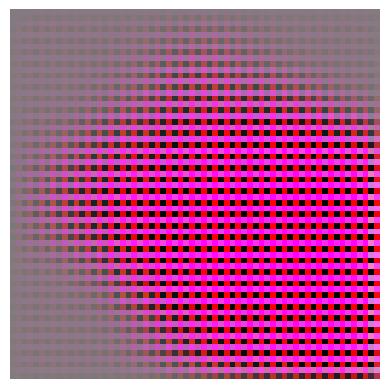

Epoch 991, Generator Loss: 4.9584, Discriminator Loss: 0.0116
Epoch 992, Generator Loss: 5.1584, Discriminator Loss: 0.0119
Epoch 993, Generator Loss: 5.5816, Discriminator Loss: 0.0083
Epoch 994, Generator Loss: 5.3868, Discriminator Loss: 0.0108
Epoch 995, Generator Loss: 5.7317, Discriminator Loss: 0.0096
Epoch 996, Generator Loss: 6.0862, Discriminator Loss: 0.0082
Epoch 997, Generator Loss: 5.8402, Discriminator Loss: 0.0100
Epoch 998, Generator Loss: 6.3698, Discriminator Loss: 0.0093
Epoch 999, Generator Loss: 6.5085, Discriminator Loss: 0.0076
Epoch 1000, Generator Loss: 6.3121, Discriminator Loss: 0.0118


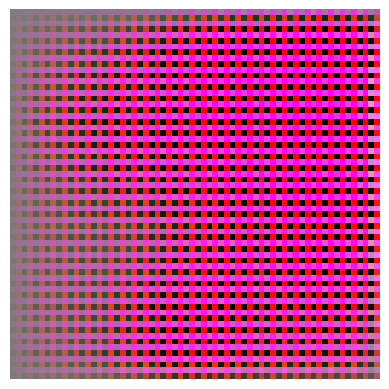

Epoch 1001, Generator Loss: 6.2826, Discriminator Loss: 0.0111
Epoch 1002, Generator Loss: 6.4131, Discriminator Loss: 0.0102
Epoch 1003, Generator Loss: 6.3008, Discriminator Loss: 0.0149
Epoch 1004, Generator Loss: 5.9463, Discriminator Loss: 0.0167
Epoch 1005, Generator Loss: 5.6724, Discriminator Loss: 0.0190
Epoch 1006, Generator Loss: 5.3287, Discriminator Loss: 0.0319
Epoch 1007, Generator Loss: 5.3255, Discriminator Loss: 0.0346
Epoch 1008, Generator Loss: 4.9443, Discriminator Loss: 0.0629
Epoch 1009, Generator Loss: 5.1223, Discriminator Loss: 0.0630
Epoch 1010, Generator Loss: 4.2059, Discriminator Loss: 0.0757


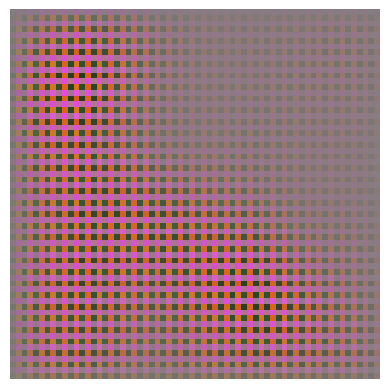

Epoch 1011, Generator Loss: 4.7299, Discriminator Loss: 0.0915
Epoch 1012, Generator Loss: 3.5049, Discriminator Loss: 0.1341
Epoch 1013, Generator Loss: 3.3290, Discriminator Loss: 0.1734
Epoch 1014, Generator Loss: 2.6391, Discriminator Loss: 0.2827
Epoch 1015, Generator Loss: 2.5400, Discriminator Loss: 0.2886
Epoch 1016, Generator Loss: 2.7998, Discriminator Loss: 0.3139
Epoch 1017, Generator Loss: 2.4948, Discriminator Loss: 0.3125
Epoch 1018, Generator Loss: 2.9374, Discriminator Loss: 0.3504
Epoch 1019, Generator Loss: 3.1214, Discriminator Loss: 0.3016
Epoch 1020, Generator Loss: 3.8580, Discriminator Loss: 0.1827


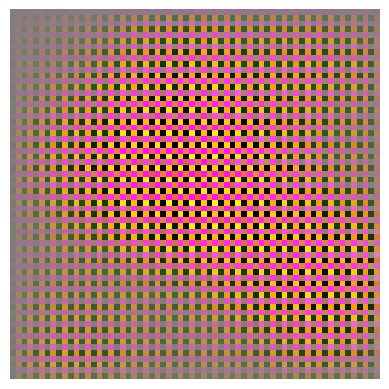

Epoch 1021, Generator Loss: 3.0216, Discriminator Loss: 0.2347
Epoch 1022, Generator Loss: 3.2117, Discriminator Loss: 0.1333
Epoch 1023, Generator Loss: 3.6938, Discriminator Loss: 0.1230
Epoch 1024, Generator Loss: 4.9836, Discriminator Loss: 0.0780
Epoch 1025, Generator Loss: 5.2440, Discriminator Loss: 0.0886
Epoch 1026, Generator Loss: 4.6599, Discriminator Loss: 0.0426
Epoch 1027, Generator Loss: 3.9645, Discriminator Loss: 0.0332
Epoch 1028, Generator Loss: 3.3254, Discriminator Loss: 0.0514
Epoch 1029, Generator Loss: 2.9401, Discriminator Loss: 0.0950
Epoch 1030, Generator Loss: 3.1339, Discriminator Loss: 0.0865


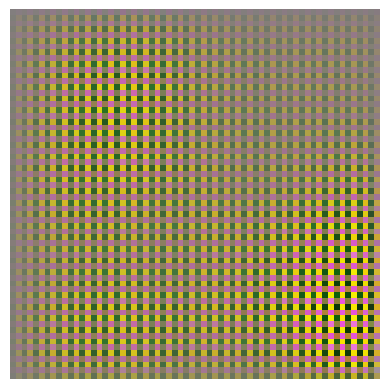

Epoch 1031, Generator Loss: 3.8257, Discriminator Loss: 0.0755
Epoch 1032, Generator Loss: 4.5779, Discriminator Loss: 0.0816
Epoch 1033, Generator Loss: 5.5084, Discriminator Loss: 0.1193
Epoch 1034, Generator Loss: 4.3020, Discriminator Loss: 0.2002
Epoch 1035, Generator Loss: 3.5511, Discriminator Loss: 0.2427
Epoch 1036, Generator Loss: 2.9998, Discriminator Loss: 0.5030
Epoch 1037, Generator Loss: 4.2913, Discriminator Loss: 0.4922
Epoch 1038, Generator Loss: 3.3350, Discriminator Loss: 0.5878
Epoch 1039, Generator Loss: 4.3192, Discriminator Loss: 0.6595
Epoch 1040, Generator Loss: 3.7075, Discriminator Loss: 0.7232


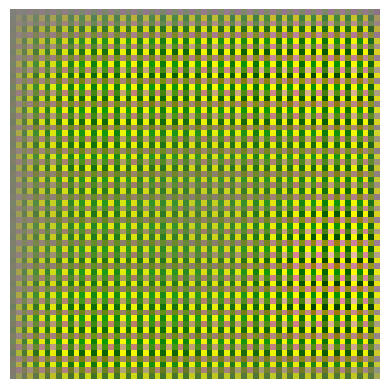

Epoch 1041, Generator Loss: 3.1055, Discriminator Loss: 0.8472
Epoch 1042, Generator Loss: 2.9628, Discriminator Loss: 0.4798
Epoch 1043, Generator Loss: 2.5336, Discriminator Loss: 0.5087
Epoch 1044, Generator Loss: 3.5998, Discriminator Loss: 0.2188
Epoch 1045, Generator Loss: 4.4542, Discriminator Loss: 0.1163
Epoch 1046, Generator Loss: 5.2743, Discriminator Loss: 0.0935
Epoch 1047, Generator Loss: 4.9791, Discriminator Loss: 0.0332
Epoch 1048, Generator Loss: 5.1136, Discriminator Loss: 0.0148
Epoch 1049, Generator Loss: 5.3303, Discriminator Loss: 0.0093
Epoch 1050, Generator Loss: 5.4673, Discriminator Loss: 0.0088


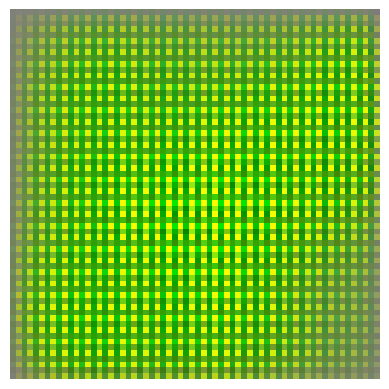

Epoch 1051, Generator Loss: 5.7994, Discriminator Loss: 0.0065
Epoch 1052, Generator Loss: 5.8190, Discriminator Loss: 0.0056
Epoch 1053, Generator Loss: 6.0537, Discriminator Loss: 0.0037
Epoch 1054, Generator Loss: 5.9249, Discriminator Loss: 0.0051
Epoch 1055, Generator Loss: 6.1938, Discriminator Loss: 0.0032
Epoch 1056, Generator Loss: 6.3657, Discriminator Loss: 0.0024
Epoch 1057, Generator Loss: 6.3060, Discriminator Loss: 0.0023
Epoch 1058, Generator Loss: 6.0594, Discriminator Loss: 0.0032
Epoch 1059, Generator Loss: 5.8427, Discriminator Loss: 0.0035
Epoch 1060, Generator Loss: 5.5243, Discriminator Loss: 0.0055


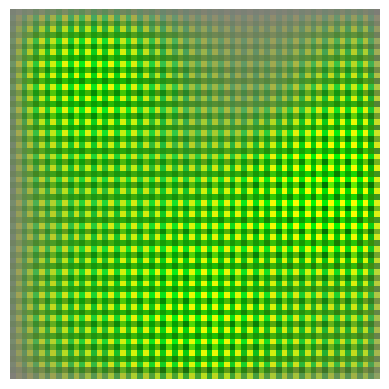

Epoch 1061, Generator Loss: 5.0621, Discriminator Loss: 0.0096
Epoch 1062, Generator Loss: 4.6037, Discriminator Loss: 0.0144
Epoch 1063, Generator Loss: 4.1472, Discriminator Loss: 0.0347
Epoch 1064, Generator Loss: 3.8282, Discriminator Loss: 0.0426
Epoch 1065, Generator Loss: 3.9856, Discriminator Loss: 0.0479
Epoch 1066, Generator Loss: 4.9029, Discriminator Loss: 0.0396
Epoch 1067, Generator Loss: 4.3960, Discriminator Loss: 0.0548
Epoch 1068, Generator Loss: 6.1166, Discriminator Loss: 0.0743
Epoch 1069, Generator Loss: 4.4479, Discriminator Loss: 0.1492
Epoch 1070, Generator Loss: 6.1759, Discriminator Loss: 0.3659


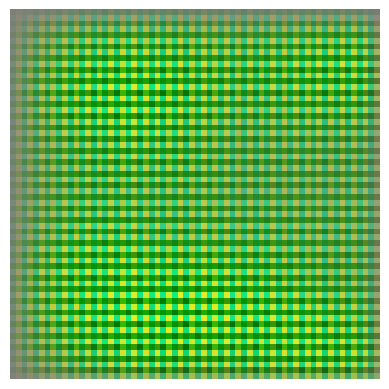

Epoch 1071, Generator Loss: 3.3960, Discriminator Loss: 0.7921
Epoch 1072, Generator Loss: 3.3026, Discriminator Loss: 0.6858
Epoch 1073, Generator Loss: 3.7547, Discriminator Loss: 0.9030
Epoch 1074, Generator Loss: 2.8389, Discriminator Loss: 1.3160
Epoch 1075, Generator Loss: 4.8468, Discriminator Loss: 0.8830
Epoch 1076, Generator Loss: 3.5417, Discriminator Loss: 0.5215
Epoch 1077, Generator Loss: 4.5097, Discriminator Loss: 0.2207
Epoch 1078, Generator Loss: 5.8653, Discriminator Loss: 0.1365
Epoch 1079, Generator Loss: 6.3828, Discriminator Loss: 0.0627
Epoch 1080, Generator Loss: 7.0019, Discriminator Loss: 0.0427


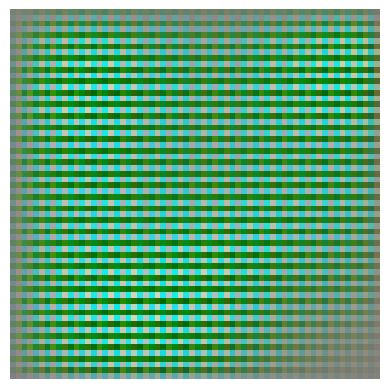

Epoch 1081, Generator Loss: 7.5651, Discriminator Loss: 0.0333
Epoch 1082, Generator Loss: 8.3745, Discriminator Loss: 0.0209
Epoch 1083, Generator Loss: 7.4632, Discriminator Loss: 0.0172
Epoch 1084, Generator Loss: 7.4209, Discriminator Loss: 0.0116
Epoch 1085, Generator Loss: 7.5336, Discriminator Loss: 0.0125
Epoch 1086, Generator Loss: 6.3965, Discriminator Loss: 0.0183
Epoch 1087, Generator Loss: 5.8817, Discriminator Loss: 0.0349
Epoch 1088, Generator Loss: 3.9834, Discriminator Loss: 0.0958
Epoch 1089, Generator Loss: 2.8738, Discriminator Loss: 0.1498
Epoch 1090, Generator Loss: 3.9290, Discriminator Loss: 0.1236


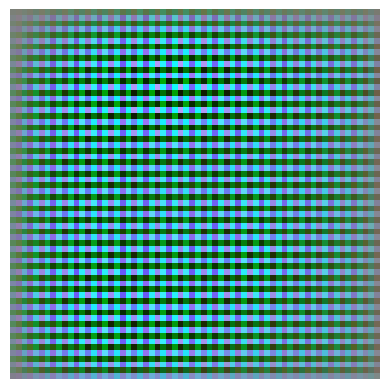

Epoch 1091, Generator Loss: 4.9953, Discriminator Loss: 0.2011
Epoch 1092, Generator Loss: 5.2540, Discriminator Loss: 0.2355
Epoch 1093, Generator Loss: 2.3370, Discriminator Loss: 0.3029
Epoch 1094, Generator Loss: 1.9800, Discriminator Loss: 0.4555
Epoch 1095, Generator Loss: 3.8732, Discriminator Loss: 0.1980
Epoch 1096, Generator Loss: 5.1484, Discriminator Loss: 0.1999
Epoch 1097, Generator Loss: 5.0150, Discriminator Loss: 0.1254
Epoch 1098, Generator Loss: 3.8982, Discriminator Loss: 0.0931
Epoch 1099, Generator Loss: 2.8741, Discriminator Loss: 0.2385
Epoch 1100, Generator Loss: 3.8228, Discriminator Loss: 0.1328


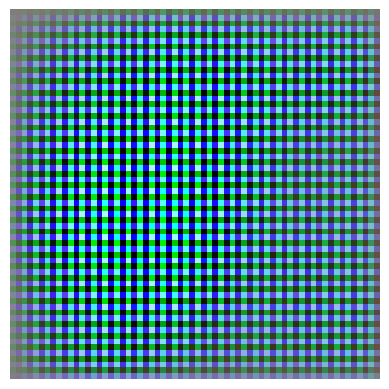

Epoch 1101, Generator Loss: 4.2701, Discriminator Loss: 0.1018
Epoch 1102, Generator Loss: 5.0521, Discriminator Loss: 0.1234
Epoch 1103, Generator Loss: 5.5584, Discriminator Loss: 0.1591
Epoch 1104, Generator Loss: 5.1268, Discriminator Loss: 0.1198
Epoch 1105, Generator Loss: 5.5727, Discriminator Loss: 0.0375
Epoch 1106, Generator Loss: 4.9362, Discriminator Loss: 0.0476
Epoch 1107, Generator Loss: 4.1766, Discriminator Loss: 0.0504
Epoch 1108, Generator Loss: 4.6963, Discriminator Loss: 0.0187
Epoch 1109, Generator Loss: 5.6565, Discriminator Loss: 0.0078
Epoch 1110, Generator Loss: 6.4622, Discriminator Loss: 0.0035


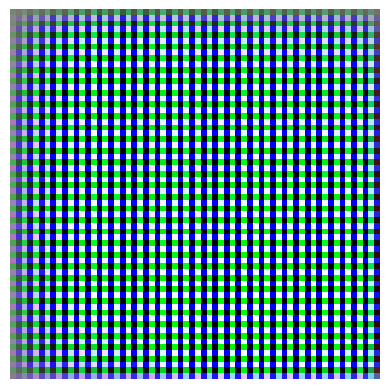

Epoch 1111, Generator Loss: 7.6086, Discriminator Loss: 0.0017
Epoch 1112, Generator Loss: 8.4437, Discriminator Loss: 0.0011
Epoch 1113, Generator Loss: 9.3158, Discriminator Loss: 0.0010
Epoch 1114, Generator Loss: 10.0250, Discriminator Loss: 0.0007
Epoch 1115, Generator Loss: 10.6376, Discriminator Loss: 0.0005
Epoch 1116, Generator Loss: 11.0570, Discriminator Loss: 0.0005
Epoch 1117, Generator Loss: 10.9577, Discriminator Loss: 0.0005
Epoch 1118, Generator Loss: 10.4966, Discriminator Loss: 0.0004
Epoch 1119, Generator Loss: 10.1317, Discriminator Loss: 0.0004
Epoch 1120, Generator Loss: 8.6903, Discriminator Loss: 0.0005


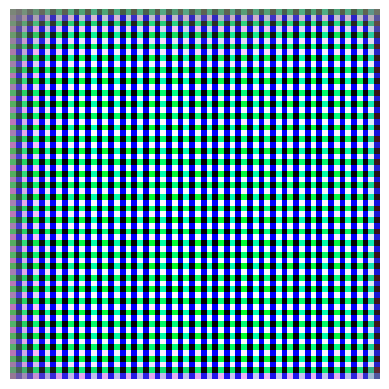

Epoch 1121, Generator Loss: 6.8692, Discriminator Loss: 0.0015
Epoch 1122, Generator Loss: 4.7361, Discriminator Loss: 0.0097
Epoch 1123, Generator Loss: 2.7091, Discriminator Loss: 0.0815
Epoch 1124, Generator Loss: 1.9190, Discriminator Loss: 0.2137
Epoch 1125, Generator Loss: 4.1604, Discriminator Loss: 0.0281
Epoch 1126, Generator Loss: 7.1245, Discriminator Loss: 0.0760
Epoch 1127, Generator Loss: 9.4389, Discriminator Loss: 0.2127
Epoch 1128, Generator Loss: 9.6309, Discriminator Loss: 0.1716
Epoch 1129, Generator Loss: 8.1933, Discriminator Loss: 0.0073
Epoch 1130, Generator Loss: 7.0079, Discriminator Loss: 0.0017


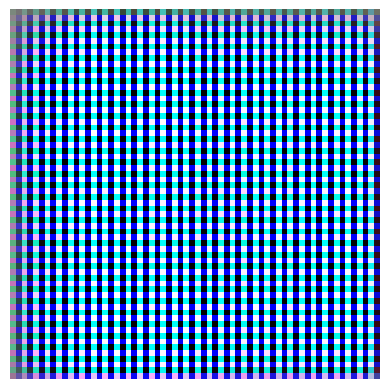

Epoch 1131, Generator Loss: 6.0748, Discriminator Loss: 0.0026
Epoch 1132, Generator Loss: 5.3524, Discriminator Loss: 0.0057
Epoch 1133, Generator Loss: 4.8502, Discriminator Loss: 0.0204
Epoch 1134, Generator Loss: 5.0774, Discriminator Loss: 0.0083
Epoch 1135, Generator Loss: 4.9845, Discriminator Loss: 0.0120
Epoch 1136, Generator Loss: 5.6784, Discriminator Loss: 0.0051
Epoch 1137, Generator Loss: 6.2624, Discriminator Loss: 0.0055
Epoch 1138, Generator Loss: 6.1518, Discriminator Loss: 0.0091
Epoch 1139, Generator Loss: 6.6405, Discriminator Loss: 0.0066
Epoch 1140, Generator Loss: 6.8126, Discriminator Loss: 0.0340


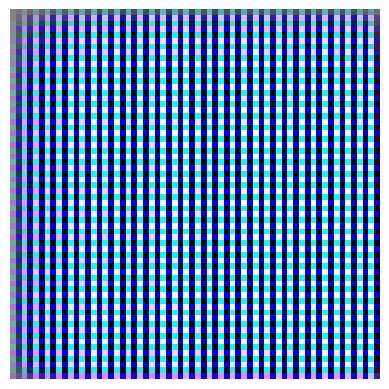

Epoch 1141, Generator Loss: 8.6016, Discriminator Loss: 0.0006
Epoch 1142, Generator Loss: 8.4851, Discriminator Loss: 0.0021
Epoch 1143, Generator Loss: 8.7367, Discriminator Loss: 0.0365
Epoch 1144, Generator Loss: 8.8412, Discriminator Loss: 0.0019
Epoch 1145, Generator Loss: 9.2006, Discriminator Loss: 0.0014
Epoch 1146, Generator Loss: 7.9073, Discriminator Loss: 0.0017
Epoch 1147, Generator Loss: 6.8555, Discriminator Loss: 0.0058
Epoch 1148, Generator Loss: 6.0662, Discriminator Loss: 0.0277
Epoch 1149, Generator Loss: 5.0589, Discriminator Loss: 0.0508
Epoch 1150, Generator Loss: 4.9732, Discriminator Loss: 0.0298


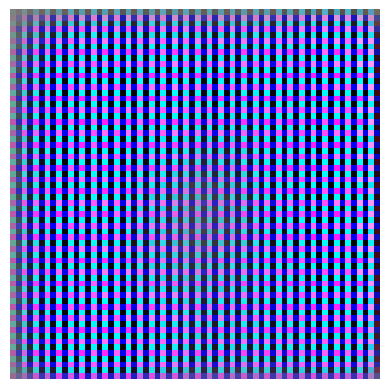

Epoch 1151, Generator Loss: 5.5802, Discriminator Loss: 0.0090
Epoch 1152, Generator Loss: 6.1188, Discriminator Loss: 0.0072
Epoch 1153, Generator Loss: 6.6317, Discriminator Loss: 0.0210
Epoch 1154, Generator Loss: 7.4986, Discriminator Loss: 0.0040
Epoch 1155, Generator Loss: 8.2296, Discriminator Loss: 0.0022
Epoch 1156, Generator Loss: 9.5807, Discriminator Loss: 0.0006
Epoch 1157, Generator Loss: 10.9841, Discriminator Loss: 0.0006
Epoch 1158, Generator Loss: 11.5294, Discriminator Loss: 0.0018
Epoch 1159, Generator Loss: 11.6792, Discriminator Loss: 0.0019
Epoch 1160, Generator Loss: 13.3337, Discriminator Loss: 0.0041


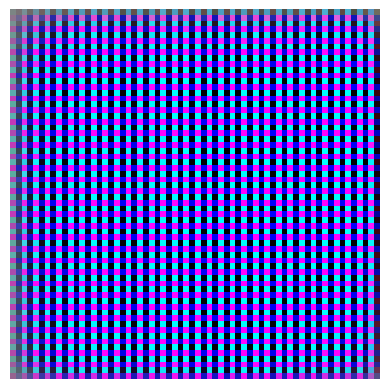

Epoch 1161, Generator Loss: 14.0538, Discriminator Loss: 0.0063
Epoch 1162, Generator Loss: 13.1716, Discriminator Loss: 0.0116
Epoch 1163, Generator Loss: 12.3903, Discriminator Loss: 0.0147
Epoch 1164, Generator Loss: 13.7235, Discriminator Loss: 0.0154
Epoch 1165, Generator Loss: 12.2419, Discriminator Loss: 0.0211
Epoch 1166, Generator Loss: 12.3737, Discriminator Loss: 0.0141
Epoch 1167, Generator Loss: 9.6490, Discriminator Loss: 0.0321
Epoch 1168, Generator Loss: 11.8453, Discriminator Loss: 0.0061
Epoch 1169, Generator Loss: 7.4421, Discriminator Loss: 0.1444
Epoch 1170, Generator Loss: 5.7701, Discriminator Loss: 0.1000


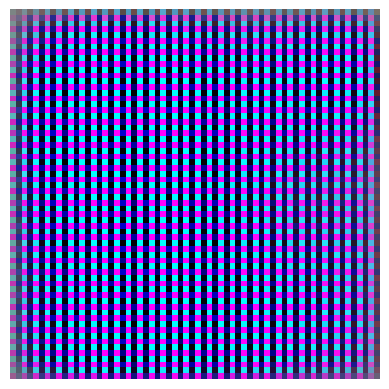

Epoch 1171, Generator Loss: 3.0710, Discriminator Loss: 0.2296
Epoch 1172, Generator Loss: 2.8828, Discriminator Loss: 0.4202
Epoch 1173, Generator Loss: 2.7408, Discriminator Loss: 0.2257
Epoch 1174, Generator Loss: 3.6453, Discriminator Loss: 0.1632
Epoch 1175, Generator Loss: 6.2662, Discriminator Loss: 0.0335
Epoch 1176, Generator Loss: 7.6483, Discriminator Loss: 0.0170
Epoch 1177, Generator Loss: 9.1449, Discriminator Loss: 0.0257
Epoch 1178, Generator Loss: 10.8692, Discriminator Loss: 0.0110
Epoch 1179, Generator Loss: 12.4257, Discriminator Loss: 0.0019
Epoch 1180, Generator Loss: 13.9177, Discriminator Loss: 0.0194


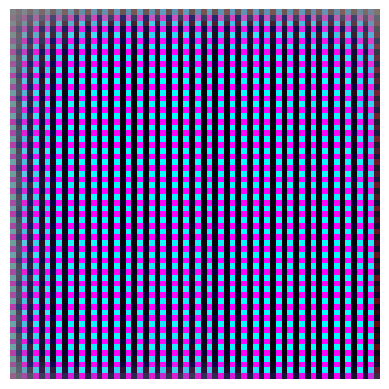

Epoch 1181, Generator Loss: 14.6293, Discriminator Loss: 0.0083
Epoch 1182, Generator Loss: 14.1309, Discriminator Loss: 0.0259
Epoch 1183, Generator Loss: 17.1591, Discriminator Loss: 0.0022
Epoch 1184, Generator Loss: 17.4533, Discriminator Loss: 0.0012
Epoch 1185, Generator Loss: 18.1171, Discriminator Loss: 0.0044
Epoch 1186, Generator Loss: 18.0089, Discriminator Loss: 0.0012
Epoch 1187, Generator Loss: 19.6369, Discriminator Loss: 0.0016
Epoch 1188, Generator Loss: 18.7812, Discriminator Loss: 0.0035
Epoch 1189, Generator Loss: 17.9895, Discriminator Loss: 0.0020
Epoch 1190, Generator Loss: 17.6615, Discriminator Loss: 0.0079


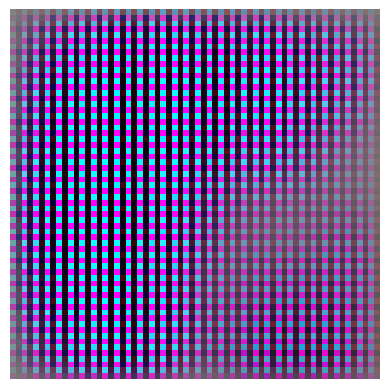

Epoch 1191, Generator Loss: 18.7110, Discriminator Loss: 0.0014
Epoch 1192, Generator Loss: 20.1583, Discriminator Loss: 0.0321
Epoch 1193, Generator Loss: 16.2151, Discriminator Loss: 0.0126
Epoch 1194, Generator Loss: 16.3834, Discriminator Loss: 0.0677
Epoch 1195, Generator Loss: 13.6493, Discriminator Loss: 0.0124
Epoch 1196, Generator Loss: 13.6827, Discriminator Loss: 0.0278
Epoch 1197, Generator Loss: 13.9046, Discriminator Loss: 0.0617
Epoch 1198, Generator Loss: 12.8146, Discriminator Loss: 0.1509
Epoch 1199, Generator Loss: 11.9550, Discriminator Loss: 0.1797
Epoch 1200, Generator Loss: 11.9317, Discriminator Loss: 0.1564


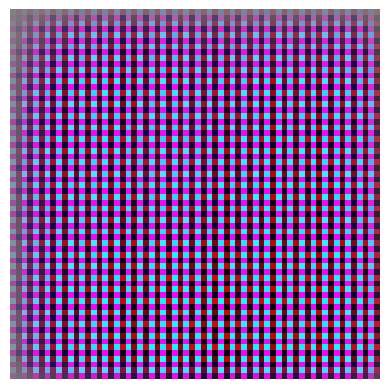

Epoch 1201, Generator Loss: 6.8248, Discriminator Loss: 0.4199
Epoch 1202, Generator Loss: 8.3294, Discriminator Loss: 0.2575
Epoch 1203, Generator Loss: 6.7269, Discriminator Loss: 0.1803
Epoch 1204, Generator Loss: 4.6374, Discriminator Loss: 0.3710
Epoch 1205, Generator Loss: 7.5487, Discriminator Loss: 0.2109
Epoch 1206, Generator Loss: 6.4103, Discriminator Loss: 0.3096
Epoch 1207, Generator Loss: 8.4062, Discriminator Loss: 0.3006
Epoch 1208, Generator Loss: 6.6787, Discriminator Loss: 0.5457
Epoch 1209, Generator Loss: 9.2465, Discriminator Loss: 0.4219
Epoch 1210, Generator Loss: 11.1734, Discriminator Loss: 0.3299


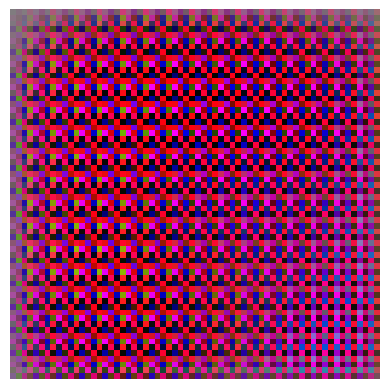

Epoch 1211, Generator Loss: 11.0787, Discriminator Loss: 0.4762
Epoch 1212, Generator Loss: 12.1768, Discriminator Loss: 0.3628
Epoch 1213, Generator Loss: 14.5497, Discriminator Loss: 0.3026
Epoch 1214, Generator Loss: 13.9862, Discriminator Loss: 0.5318
Epoch 1215, Generator Loss: 16.8957, Discriminator Loss: 0.2723
Epoch 1216, Generator Loss: 17.1054, Discriminator Loss: 0.3011
Epoch 1217, Generator Loss: 19.3541, Discriminator Loss: 0.2498
Epoch 1218, Generator Loss: 16.8339, Discriminator Loss: 0.4709
Epoch 1219, Generator Loss: 20.3998, Discriminator Loss: 0.2094
Epoch 1220, Generator Loss: 17.3950, Discriminator Loss: 0.1606


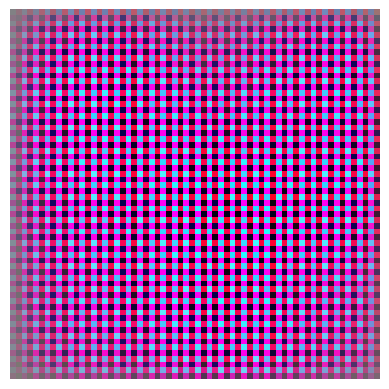

Epoch 1221, Generator Loss: 20.7931, Discriminator Loss: 0.6520
Epoch 1222, Generator Loss: 20.4301, Discriminator Loss: 0.4380
Epoch 1223, Generator Loss: 21.4740, Discriminator Loss: 0.4763
Epoch 1224, Generator Loss: 17.4008, Discriminator Loss: 0.8548
Epoch 1225, Generator Loss: 25.7412, Discriminator Loss: 0.2578
Epoch 1226, Generator Loss: 21.3962, Discriminator Loss: 0.2745
Epoch 1227, Generator Loss: 21.1525, Discriminator Loss: 0.3802
Epoch 1228, Generator Loss: 22.0335, Discriminator Loss: 0.4648
Epoch 1229, Generator Loss: 22.3492, Discriminator Loss: 0.2165
Epoch 1230, Generator Loss: 21.6440, Discriminator Loss: 0.1759


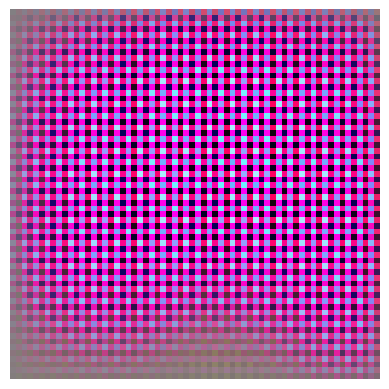

Epoch 1231, Generator Loss: 22.5662, Discriminator Loss: 0.1228
Epoch 1232, Generator Loss: 17.5626, Discriminator Loss: 0.1247
Epoch 1233, Generator Loss: 20.8514, Discriminator Loss: 0.3294
Epoch 1234, Generator Loss: 21.6181, Discriminator Loss: 0.1173
Epoch 1235, Generator Loss: 23.9281, Discriminator Loss: 0.1121
Epoch 1236, Generator Loss: 16.5282, Discriminator Loss: 0.1430
Epoch 1237, Generator Loss: 20.5140, Discriminator Loss: 0.0885
Epoch 1238, Generator Loss: 15.5666, Discriminator Loss: 0.0995
Epoch 1239, Generator Loss: 16.0596, Discriminator Loss: 0.1973
Epoch 1240, Generator Loss: 15.0169, Discriminator Loss: 0.1171


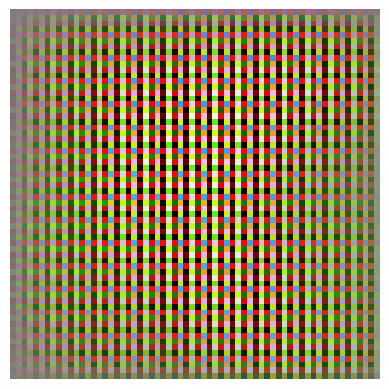

Epoch 1241, Generator Loss: 14.2567, Discriminator Loss: 0.1362
Epoch 1242, Generator Loss: 14.0893, Discriminator Loss: 0.1675
Epoch 1243, Generator Loss: 19.8790, Discriminator Loss: 0.1791
Epoch 1244, Generator Loss: 14.0657, Discriminator Loss: 0.1695
Epoch 1245, Generator Loss: 12.9128, Discriminator Loss: 0.1926
Epoch 1246, Generator Loss: 9.7947, Discriminator Loss: 0.2662
Epoch 1247, Generator Loss: 6.4881, Discriminator Loss: 0.4644
Epoch 1248, Generator Loss: 8.4236, Discriminator Loss: 0.3028
Epoch 1249, Generator Loss: 7.5093, Discriminator Loss: 0.4608
Epoch 1250, Generator Loss: 7.9241, Discriminator Loss: 0.2738


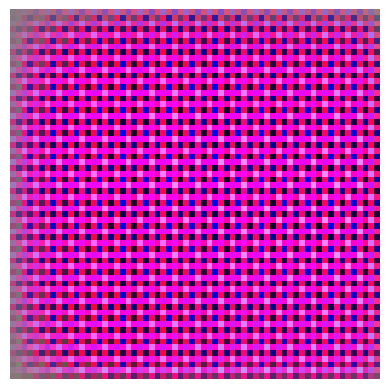

Epoch 1251, Generator Loss: 6.3611, Discriminator Loss: 0.2696
Epoch 1252, Generator Loss: 4.8659, Discriminator Loss: 0.2082
Epoch 1253, Generator Loss: 4.5083, Discriminator Loss: 0.1187
Epoch 1254, Generator Loss: 4.1270, Discriminator Loss: 0.1380
Epoch 1255, Generator Loss: 3.5214, Discriminator Loss: 0.2504
Epoch 1256, Generator Loss: 3.0924, Discriminator Loss: 0.5011
Epoch 1257, Generator Loss: 1.9802, Discriminator Loss: 0.6072
Epoch 1258, Generator Loss: 1.7796, Discriminator Loss: 1.0249
Epoch 1259, Generator Loss: 2.1262, Discriminator Loss: 1.4468
Epoch 1260, Generator Loss: 1.2207, Discriminator Loss: 1.5538


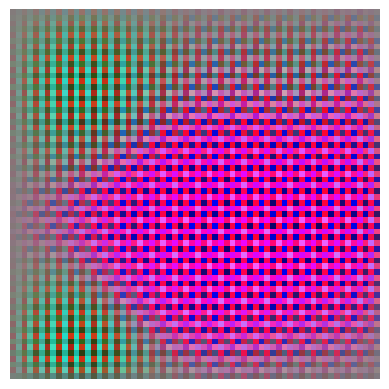

Epoch 1261, Generator Loss: 2.1052, Discriminator Loss: 0.9122
Epoch 1262, Generator Loss: 2.4442, Discriminator Loss: 1.1532
Epoch 1263, Generator Loss: 4.0970, Discriminator Loss: 0.7439
Epoch 1264, Generator Loss: 4.4309, Discriminator Loss: 0.7414
Epoch 1265, Generator Loss: 7.4442, Discriminator Loss: 0.5476
Epoch 1266, Generator Loss: 9.0686, Discriminator Loss: 0.2390
Epoch 1267, Generator Loss: 10.3571, Discriminator Loss: 0.1315
Epoch 1268, Generator Loss: 9.3697, Discriminator Loss: 0.0594
Epoch 1269, Generator Loss: 10.8035, Discriminator Loss: 0.1009
Epoch 1270, Generator Loss: 11.1578, Discriminator Loss: 0.0731


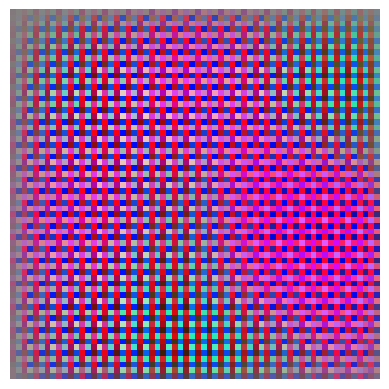

Epoch 1271, Generator Loss: 12.7178, Discriminator Loss: 0.0270
Epoch 1272, Generator Loss: 13.5076, Discriminator Loss: 0.0104
Epoch 1273, Generator Loss: 10.4072, Discriminator Loss: 0.0130
Epoch 1274, Generator Loss: 13.9705, Discriminator Loss: 0.0184
Epoch 1275, Generator Loss: 11.4643, Discriminator Loss: 0.0219
Epoch 1276, Generator Loss: 12.9425, Discriminator Loss: 0.0216
Epoch 1277, Generator Loss: 10.9920, Discriminator Loss: 0.0192
Epoch 1278, Generator Loss: 9.8559, Discriminator Loss: 0.0189
Epoch 1279, Generator Loss: 7.7958, Discriminator Loss: 0.0329
Epoch 1280, Generator Loss: 7.5056, Discriminator Loss: 0.0475


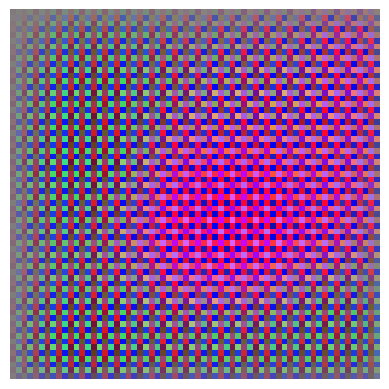

Epoch 1281, Generator Loss: 6.8300, Discriminator Loss: 0.0953
Epoch 1282, Generator Loss: 4.1274, Discriminator Loss: 0.1667
Epoch 1283, Generator Loss: 5.9582, Discriminator Loss: 0.1432
Epoch 1284, Generator Loss: 7.6132, Discriminator Loss: 0.1724
Epoch 1285, Generator Loss: 5.2878, Discriminator Loss: 0.2771
Epoch 1286, Generator Loss: 4.4735, Discriminator Loss: 0.2181
Epoch 1287, Generator Loss: 5.1829, Discriminator Loss: 0.1131
Epoch 1288, Generator Loss: 5.2074, Discriminator Loss: 0.1317
Epoch 1289, Generator Loss: 5.3136, Discriminator Loss: 0.0717
Epoch 1290, Generator Loss: 6.8993, Discriminator Loss: 0.0513


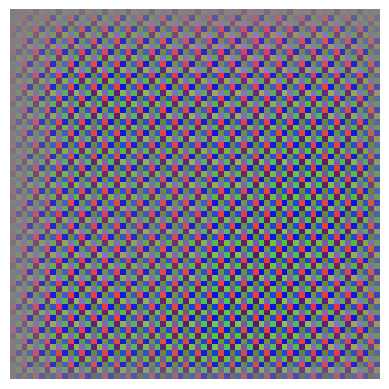

Epoch 1291, Generator Loss: 6.4835, Discriminator Loss: 0.0472
Epoch 1292, Generator Loss: 6.1726, Discriminator Loss: 0.0363
Epoch 1293, Generator Loss: 6.2894, Discriminator Loss: 0.0334
Epoch 1294, Generator Loss: 5.2605, Discriminator Loss: 0.0524
Epoch 1295, Generator Loss: 6.1061, Discriminator Loss: 0.0448
Epoch 1296, Generator Loss: 5.1925, Discriminator Loss: 0.0628
Epoch 1297, Generator Loss: 5.6621, Discriminator Loss: 0.0565
Epoch 1298, Generator Loss: 6.4984, Discriminator Loss: 0.0626
Epoch 1299, Generator Loss: 5.8300, Discriminator Loss: 0.0732
Epoch 1300, Generator Loss: 5.3721, Discriminator Loss: 0.0986


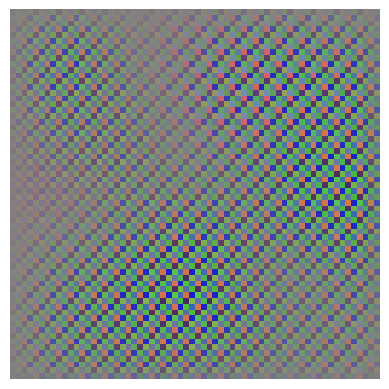

Epoch 1301, Generator Loss: 5.6037, Discriminator Loss: 0.1324
Epoch 1302, Generator Loss: 4.5154, Discriminator Loss: 0.1055
Epoch 1303, Generator Loss: 3.7366, Discriminator Loss: 0.1663
Epoch 1304, Generator Loss: 4.1324, Discriminator Loss: 0.1348
Epoch 1305, Generator Loss: 4.5772, Discriminator Loss: 0.1401
Epoch 1306, Generator Loss: 4.6036, Discriminator Loss: 0.1619
Epoch 1307, Generator Loss: 4.2875, Discriminator Loss: 0.1409
Epoch 1308, Generator Loss: 2.1904, Discriminator Loss: 0.3794
Epoch 1309, Generator Loss: 3.3681, Discriminator Loss: 0.2402
Epoch 1310, Generator Loss: 5.2573, Discriminator Loss: 0.3886


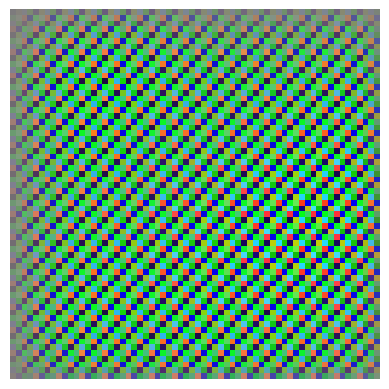

Epoch 1311, Generator Loss: 2.9737, Discriminator Loss: 0.1777
Epoch 1312, Generator Loss: 2.1739, Discriminator Loss: 0.3574
Epoch 1313, Generator Loss: 2.6531, Discriminator Loss: 0.1526
Epoch 1314, Generator Loss: 3.5818, Discriminator Loss: 0.2048
Epoch 1315, Generator Loss: 3.4838, Discriminator Loss: 0.2032
Epoch 1316, Generator Loss: 2.0978, Discriminator Loss: 0.2556
Epoch 1317, Generator Loss: 1.5168, Discriminator Loss: 0.3313
Epoch 1318, Generator Loss: 2.9244, Discriminator Loss: 0.4092
Epoch 1319, Generator Loss: 2.3438, Discriminator Loss: 0.3569
Epoch 1320, Generator Loss: 1.2107, Discriminator Loss: 0.4611


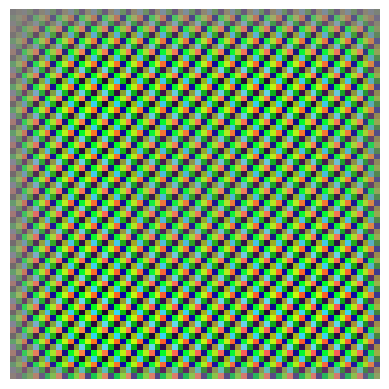

Epoch 1321, Generator Loss: 2.1661, Discriminator Loss: 0.2967
Epoch 1322, Generator Loss: 3.0537, Discriminator Loss: 0.4078
Epoch 1323, Generator Loss: 1.7677, Discriminator Loss: 0.2911
Epoch 1324, Generator Loss: 1.4543, Discriminator Loss: 0.3269
Epoch 1325, Generator Loss: 2.9509, Discriminator Loss: 0.1540
Epoch 1326, Generator Loss: 3.7715, Discriminator Loss: 0.1609
Epoch 1327, Generator Loss: 3.2703, Discriminator Loss: 0.1316
Epoch 1328, Generator Loss: 2.4259, Discriminator Loss: 0.1301
Epoch 1329, Generator Loss: 1.8617, Discriminator Loss: 0.2172
Epoch 1330, Generator Loss: 2.4423, Discriminator Loss: 0.1459


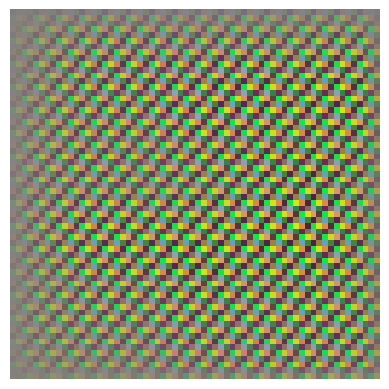

Epoch 1331, Generator Loss: 3.4864, Discriminator Loss: 0.1950
Epoch 1332, Generator Loss: 3.0781, Discriminator Loss: 0.1141
Epoch 1333, Generator Loss: 2.5445, Discriminator Loss: 0.1659
Epoch 1334, Generator Loss: 2.2001, Discriminator Loss: 0.1896
Epoch 1335, Generator Loss: 2.5272, Discriminator Loss: 0.1886
Epoch 1336, Generator Loss: 2.8617, Discriminator Loss: 0.2109
Epoch 1337, Generator Loss: 2.7909, Discriminator Loss: 0.1851
Epoch 1338, Generator Loss: 2.6855, Discriminator Loss: 0.2107
Epoch 1339, Generator Loss: 2.6502, Discriminator Loss: 0.2040
Epoch 1340, Generator Loss: 2.8768, Discriminator Loss: 0.1410


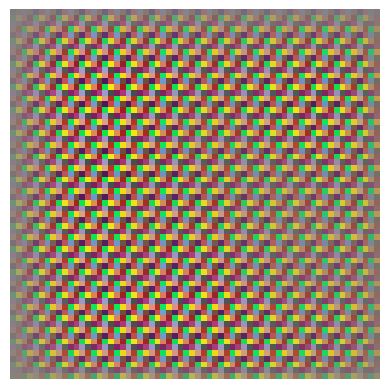

Epoch 1341, Generator Loss: 3.1376, Discriminator Loss: 0.1352
Epoch 1342, Generator Loss: 3.5746, Discriminator Loss: 0.0959
Epoch 1343, Generator Loss: 3.6093, Discriminator Loss: 0.1031
Epoch 1344, Generator Loss: 3.7845, Discriminator Loss: 0.1031
Epoch 1345, Generator Loss: 4.1230, Discriminator Loss: 0.0758
Epoch 1346, Generator Loss: 3.9472, Discriminator Loss: 0.0885
Epoch 1347, Generator Loss: 4.6810, Discriminator Loss: 0.1209
Epoch 1348, Generator Loss: 5.7302, Discriminator Loss: 0.0558
Epoch 1349, Generator Loss: 6.4026, Discriminator Loss: 0.0867
Epoch 1350, Generator Loss: 5.6754, Discriminator Loss: 0.0954


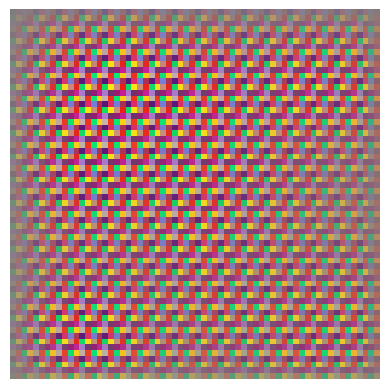

Epoch 1351, Generator Loss: 7.2050, Discriminator Loss: 0.1050
Epoch 1352, Generator Loss: 7.8460, Discriminator Loss: 0.0521
Epoch 1353, Generator Loss: 6.3476, Discriminator Loss: 0.1923
Epoch 1354, Generator Loss: 6.3801, Discriminator Loss: 0.2014
Epoch 1355, Generator Loss: 8.5282, Discriminator Loss: 0.1502
Epoch 1356, Generator Loss: 9.7072, Discriminator Loss: 0.1084
Epoch 1357, Generator Loss: 7.7241, Discriminator Loss: 0.1930
Epoch 1358, Generator Loss: 8.6683, Discriminator Loss: 0.1096
Epoch 1359, Generator Loss: 8.1207, Discriminator Loss: 0.2599
Epoch 1360, Generator Loss: 8.8080, Discriminator Loss: 0.1623


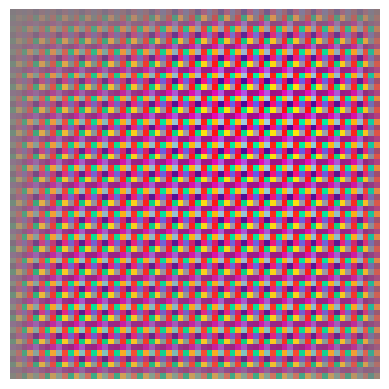

Epoch 1361, Generator Loss: 8.1192, Discriminator Loss: 0.2538
Epoch 1362, Generator Loss: 6.7630, Discriminator Loss: 0.3446
Epoch 1363, Generator Loss: 7.4882, Discriminator Loss: 0.3683
Epoch 1364, Generator Loss: 8.8974, Discriminator Loss: 0.2443
Epoch 1365, Generator Loss: 8.8468, Discriminator Loss: 0.1935
Epoch 1366, Generator Loss: 9.3122, Discriminator Loss: 0.1706
Epoch 1367, Generator Loss: 9.3122, Discriminator Loss: 0.1812
Epoch 1368, Generator Loss: 7.1836, Discriminator Loss: 0.2267
Epoch 1369, Generator Loss: 9.3050, Discriminator Loss: 0.0672
Epoch 1370, Generator Loss: 9.9739, Discriminator Loss: 0.1798


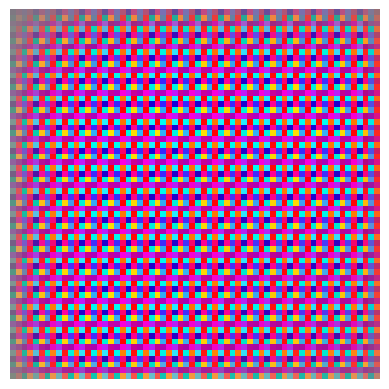

Epoch 1371, Generator Loss: 9.7381, Discriminator Loss: 0.1412
Epoch 1372, Generator Loss: 12.7087, Discriminator Loss: 0.1335
Epoch 1373, Generator Loss: 11.1137, Discriminator Loss: 0.2235
Epoch 1374, Generator Loss: 11.7211, Discriminator Loss: 0.1403
Epoch 1375, Generator Loss: 9.6377, Discriminator Loss: 0.1011
Epoch 1376, Generator Loss: 10.1752, Discriminator Loss: 0.2634
Epoch 1377, Generator Loss: 13.0679, Discriminator Loss: 0.0253
Epoch 1378, Generator Loss: 13.6791, Discriminator Loss: 0.0463
Epoch 1379, Generator Loss: 13.4518, Discriminator Loss: 0.0328
Epoch 1380, Generator Loss: 12.1902, Discriminator Loss: 0.0372


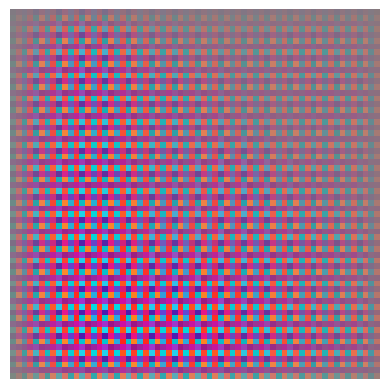

Epoch 1381, Generator Loss: 14.0962, Discriminator Loss: 0.0395
Epoch 1382, Generator Loss: 14.6244, Discriminator Loss: 0.0531
Epoch 1383, Generator Loss: 12.3674, Discriminator Loss: 0.0281
Epoch 1384, Generator Loss: 14.1457, Discriminator Loss: 0.0252
Epoch 1385, Generator Loss: 11.4968, Discriminator Loss: 0.0229
Epoch 1386, Generator Loss: 13.5183, Discriminator Loss: 0.0134
Epoch 1387, Generator Loss: 11.3713, Discriminator Loss: 0.0086
Epoch 1388, Generator Loss: 9.1872, Discriminator Loss: 0.0153
Epoch 1389, Generator Loss: 10.3335, Discriminator Loss: 0.0193
Epoch 1390, Generator Loss: 9.4236, Discriminator Loss: 0.0294


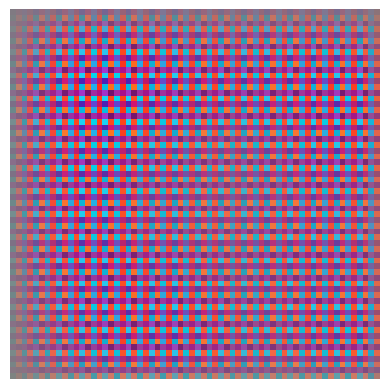

Epoch 1391, Generator Loss: 8.2992, Discriminator Loss: 0.0398
Epoch 1392, Generator Loss: 8.0428, Discriminator Loss: 0.0308
Epoch 1393, Generator Loss: 8.3195, Discriminator Loss: 0.0183
Epoch 1394, Generator Loss: 8.5128, Discriminator Loss: 0.0210
Epoch 1395, Generator Loss: 7.3286, Discriminator Loss: 0.0300
Epoch 1396, Generator Loss: 7.5377, Discriminator Loss: 0.0474
Epoch 1397, Generator Loss: 7.0608, Discriminator Loss: 0.0438
Epoch 1398, Generator Loss: 5.7651, Discriminator Loss: 0.0305
Epoch 1399, Generator Loss: 5.5761, Discriminator Loss: 0.0340
Epoch 1400, Generator Loss: 4.2919, Discriminator Loss: 0.0456


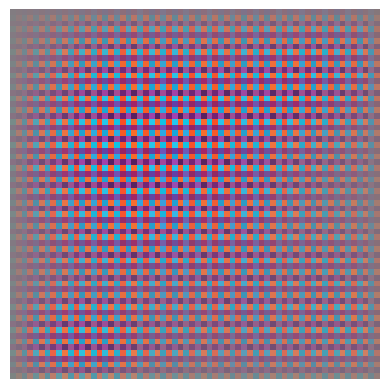

Epoch 1401, Generator Loss: 3.6336, Discriminator Loss: 0.0594
Epoch 1402, Generator Loss: 3.5682, Discriminator Loss: 0.0704
Epoch 1403, Generator Loss: 3.4125, Discriminator Loss: 0.0912
Epoch 1404, Generator Loss: 3.5225, Discriminator Loss: 0.0943
Epoch 1405, Generator Loss: 3.4316, Discriminator Loss: 0.0957
Epoch 1406, Generator Loss: 2.9581, Discriminator Loss: 0.1410
Epoch 1407, Generator Loss: 2.9432, Discriminator Loss: 0.1231
Epoch 1408, Generator Loss: 2.8318, Discriminator Loss: 0.1610
Epoch 1409, Generator Loss: 3.0472, Discriminator Loss: 0.1591
Epoch 1410, Generator Loss: 3.0148, Discriminator Loss: 0.1454


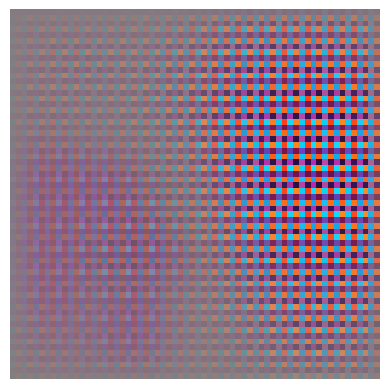

Epoch 1411, Generator Loss: 2.9509, Discriminator Loss: 0.1394
Epoch 1412, Generator Loss: 2.7206, Discriminator Loss: 0.1184
Epoch 1413, Generator Loss: 2.8880, Discriminator Loss: 0.1063
Epoch 1414, Generator Loss: 3.4019, Discriminator Loss: 0.0897
Epoch 1415, Generator Loss: 3.7561, Discriminator Loss: 0.0908
Epoch 1416, Generator Loss: 3.8832, Discriminator Loss: 0.0700
Epoch 1417, Generator Loss: 3.8851, Discriminator Loss: 0.0457
Epoch 1418, Generator Loss: 3.5843, Discriminator Loss: 0.0548
Epoch 1419, Generator Loss: 3.5928, Discriminator Loss: 0.0600
Epoch 1420, Generator Loss: 3.5140, Discriminator Loss: 0.0582


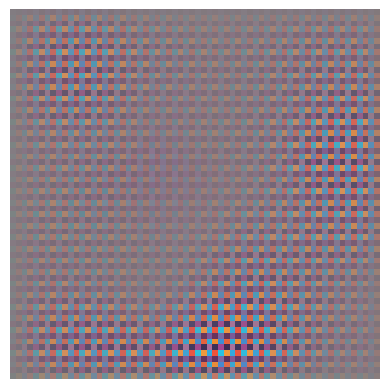

Epoch 1421, Generator Loss: 3.8449, Discriminator Loss: 0.0535
Epoch 1422, Generator Loss: 3.4002, Discriminator Loss: 0.0659
Epoch 1423, Generator Loss: 3.9015, Discriminator Loss: 0.0849
Epoch 1424, Generator Loss: 3.6632, Discriminator Loss: 0.1044
Epoch 1425, Generator Loss: 3.3098, Discriminator Loss: 0.1328
Epoch 1426, Generator Loss: 3.7217, Discriminator Loss: 0.0803
Epoch 1427, Generator Loss: 3.9126, Discriminator Loss: 0.0799
Epoch 1428, Generator Loss: 3.4332, Discriminator Loss: 0.1261
Epoch 1429, Generator Loss: 3.3136, Discriminator Loss: 0.1089
Epoch 1430, Generator Loss: 3.8200, Discriminator Loss: 0.0787


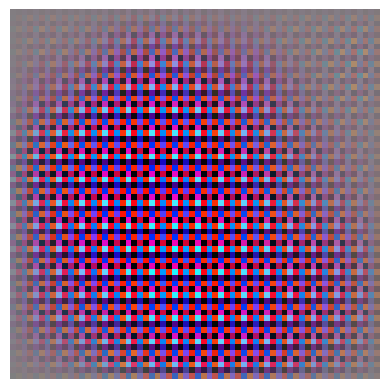

Epoch 1431, Generator Loss: 3.5445, Discriminator Loss: 0.1144
Epoch 1432, Generator Loss: 3.3973, Discriminator Loss: 0.1041
Epoch 1433, Generator Loss: 2.8282, Discriminator Loss: 0.1450
Epoch 1434, Generator Loss: 3.0117, Discriminator Loss: 0.0926
Epoch 1435, Generator Loss: 3.5175, Discriminator Loss: 0.1221
Epoch 1436, Generator Loss: 3.2606, Discriminator Loss: 0.1464
Epoch 1437, Generator Loss: 2.7122, Discriminator Loss: 0.1262
Epoch 1438, Generator Loss: 2.6829, Discriminator Loss: 0.1325
Epoch 1439, Generator Loss: 2.8610, Discriminator Loss: 0.2105
Epoch 1440, Generator Loss: 3.5953, Discriminator Loss: 0.1576


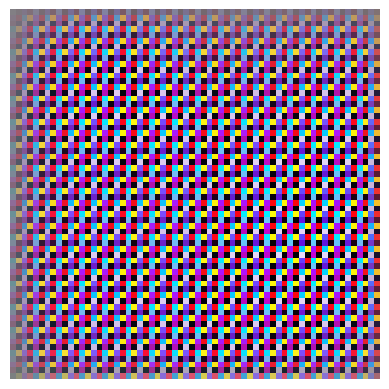

Epoch 1441, Generator Loss: 3.1950, Discriminator Loss: 0.1822
Epoch 1442, Generator Loss: 3.5034, Discriminator Loss: 0.1929
Epoch 1443, Generator Loss: 2.8584, Discriminator Loss: 0.1841
Epoch 1444, Generator Loss: 2.9619, Discriminator Loss: 0.2287
Epoch 1445, Generator Loss: 2.9780, Discriminator Loss: 0.3411
Epoch 1446, Generator Loss: 4.8762, Discriminator Loss: 0.4259
Epoch 1447, Generator Loss: 6.7209, Discriminator Loss: 0.5081
Epoch 1448, Generator Loss: 3.6826, Discriminator Loss: 0.4644
Epoch 1449, Generator Loss: 4.1020, Discriminator Loss: 0.3792
Epoch 1450, Generator Loss: 6.0313, Discriminator Loss: 0.1108


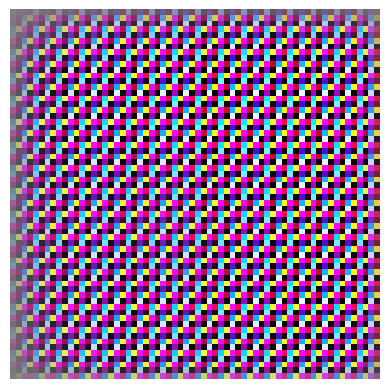

Epoch 1451, Generator Loss: 5.2005, Discriminator Loss: 0.4069
Epoch 1452, Generator Loss: 6.7096, Discriminator Loss: 0.4004
Epoch 1453, Generator Loss: 3.5571, Discriminator Loss: 0.4637
Epoch 1454, Generator Loss: 3.1054, Discriminator Loss: 0.2599
Epoch 1455, Generator Loss: 2.0033, Discriminator Loss: 0.6016
Epoch 1456, Generator Loss: 3.1507, Discriminator Loss: 0.7020
Epoch 1457, Generator Loss: 0.8090, Discriminator Loss: 0.9703
Epoch 1458, Generator Loss: 3.6656, Discriminator Loss: 0.6796
Epoch 1459, Generator Loss: 1.9964, Discriminator Loss: 0.3161
Epoch 1460, Generator Loss: 1.6232, Discriminator Loss: 0.4741


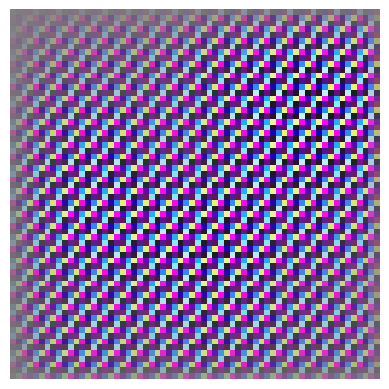

Epoch 1461, Generator Loss: 4.0887, Discriminator Loss: 0.1584
Epoch 1462, Generator Loss: 7.0522, Discriminator Loss: 0.1293
Epoch 1463, Generator Loss: 8.3740, Discriminator Loss: 0.1137
Epoch 1464, Generator Loss: 7.9292, Discriminator Loss: 0.0502
Epoch 1465, Generator Loss: 8.8250, Discriminator Loss: 0.0287
Epoch 1466, Generator Loss: 7.2451, Discriminator Loss: 0.0840
Epoch 1467, Generator Loss: 6.7211, Discriminator Loss: 0.0744
Epoch 1468, Generator Loss: 8.4336, Discriminator Loss: 0.1167
Epoch 1469, Generator Loss: 7.8881, Discriminator Loss: 0.1163
Epoch 1470, Generator Loss: 9.9192, Discriminator Loss: 0.1065


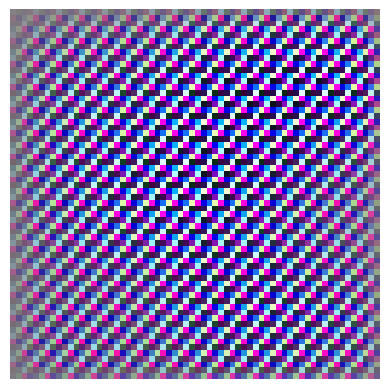

Epoch 1471, Generator Loss: 9.6240, Discriminator Loss: 0.1941
Epoch 1472, Generator Loss: 8.2086, Discriminator Loss: 0.1790
Epoch 1473, Generator Loss: 7.2114, Discriminator Loss: 0.2011
Epoch 1474, Generator Loss: 6.2948, Discriminator Loss: 0.3073
Epoch 1475, Generator Loss: 6.4934, Discriminator Loss: 0.3664
Epoch 1476, Generator Loss: 6.1999, Discriminator Loss: 0.3983
Epoch 1477, Generator Loss: 5.8733, Discriminator Loss: 0.3521
Epoch 1478, Generator Loss: 2.5250, Discriminator Loss: 0.6885
Epoch 1479, Generator Loss: 5.8234, Discriminator Loss: 0.3404
Epoch 1480, Generator Loss: 6.5540, Discriminator Loss: 0.5037


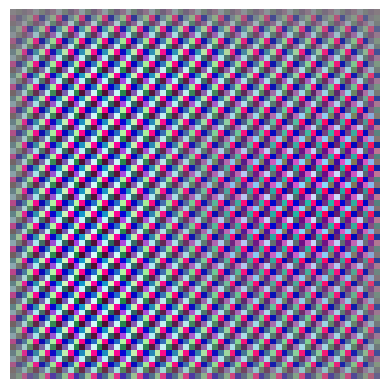

Epoch 1481, Generator Loss: 3.9711, Discriminator Loss: 0.4935
Epoch 1482, Generator Loss: 2.6333, Discriminator Loss: 0.4971
Epoch 1483, Generator Loss: 3.5773, Discriminator Loss: 0.2465
Epoch 1484, Generator Loss: 4.1906, Discriminator Loss: 0.5239
Epoch 1485, Generator Loss: 3.1183, Discriminator Loss: 0.2563
Epoch 1486, Generator Loss: 2.1141, Discriminator Loss: 0.5363
Epoch 1487, Generator Loss: 2.6501, Discriminator Loss: 0.2884
Epoch 1488, Generator Loss: 3.9602, Discriminator Loss: 0.5103
Epoch 1489, Generator Loss: 2.0904, Discriminator Loss: 0.3761
Epoch 1490, Generator Loss: 1.1897, Discriminator Loss: 0.6313


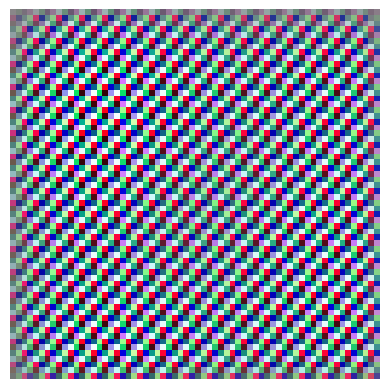

Epoch 1491, Generator Loss: 3.0059, Discriminator Loss: 0.5050
Epoch 1492, Generator Loss: 3.0985, Discriminator Loss: 0.5290
Epoch 1493, Generator Loss: 1.5354, Discriminator Loss: 0.5671
Epoch 1494, Generator Loss: 2.1140, Discriminator Loss: 0.2987
Epoch 1495, Generator Loss: 3.2481, Discriminator Loss: 0.3790
Epoch 1496, Generator Loss: 4.9363, Discriminator Loss: 0.3918
Epoch 1497, Generator Loss: 3.2909, Discriminator Loss: 0.2256
Epoch 1498, Generator Loss: 3.8969, Discriminator Loss: 0.1162
Epoch 1499, Generator Loss: 3.6349, Discriminator Loss: 0.3257
Epoch 1500, Generator Loss: 5.1736, Discriminator Loss: 0.2413


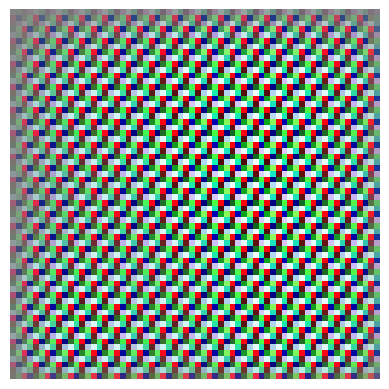

Epoch 1501, Generator Loss: 6.5633, Discriminator Loss: 0.1422
Epoch 1502, Generator Loss: 8.6420, Discriminator Loss: 0.2222
Epoch 1503, Generator Loss: 8.8704, Discriminator Loss: 0.0566
Epoch 1504, Generator Loss: 8.2398, Discriminator Loss: 0.0159
Epoch 1505, Generator Loss: 8.4919, Discriminator Loss: 0.0045
Epoch 1506, Generator Loss: 7.7882, Discriminator Loss: 0.0016
Epoch 1507, Generator Loss: 8.4437, Discriminator Loss: 0.0006
Epoch 1508, Generator Loss: 8.5950, Discriminator Loss: 0.0005
Epoch 1509, Generator Loss: 9.1775, Discriminator Loss: 0.0002
Epoch 1510, Generator Loss: 9.4887, Discriminator Loss: 0.0002


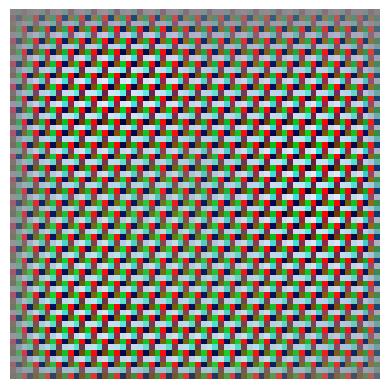

Epoch 1511, Generator Loss: 9.9859, Discriminator Loss: 0.0001
Epoch 1512, Generator Loss: 10.5089, Discriminator Loss: 0.0001
Epoch 1513, Generator Loss: 10.8798, Discriminator Loss: 0.0001
Epoch 1514, Generator Loss: 11.0155, Discriminator Loss: 0.0000
Epoch 1515, Generator Loss: 11.3252, Discriminator Loss: 0.0000
Epoch 1516, Generator Loss: 11.8398, Discriminator Loss: 0.0000
Epoch 1517, Generator Loss: 11.8663, Discriminator Loss: 0.0000
Epoch 1518, Generator Loss: 11.9393, Discriminator Loss: 0.0000
Epoch 1519, Generator Loss: 11.5511, Discriminator Loss: 0.0000
Epoch 1520, Generator Loss: 11.5582, Discriminator Loss: 0.0001


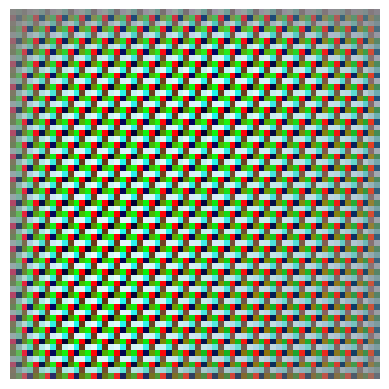

Epoch 1521, Generator Loss: 11.7353, Discriminator Loss: 0.0000
Epoch 1522, Generator Loss: 10.9378, Discriminator Loss: 0.0001
Epoch 1523, Generator Loss: 10.7957, Discriminator Loss: 0.0003
Epoch 1524, Generator Loss: 10.8115, Discriminator Loss: 0.0001
Epoch 1525, Generator Loss: 9.9543, Discriminator Loss: 0.0011
Epoch 1526, Generator Loss: 10.1877, Discriminator Loss: 0.0003
Epoch 1527, Generator Loss: 8.8628, Discriminator Loss: 0.0022
Epoch 1528, Generator Loss: 8.2473, Discriminator Loss: 0.0060
Epoch 1529, Generator Loss: 8.8815, Discriminator Loss: 0.0011
Epoch 1530, Generator Loss: 7.6391, Discriminator Loss: 0.0042


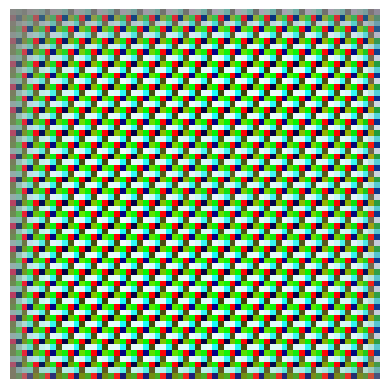

Epoch 1531, Generator Loss: 7.4237, Discriminator Loss: 0.0034
Epoch 1532, Generator Loss: 5.9127, Discriminator Loss: 0.0306
Epoch 1533, Generator Loss: 5.9625, Discriminator Loss: 0.0216
Epoch 1534, Generator Loss: 6.8667, Discriminator Loss: 0.0157
Epoch 1535, Generator Loss: 6.6964, Discriminator Loss: 0.0128
Epoch 1536, Generator Loss: 7.4264, Discriminator Loss: 0.0027
Epoch 1537, Generator Loss: 8.1509, Discriminator Loss: 0.0045
Epoch 1538, Generator Loss: 7.7514, Discriminator Loss: 0.0395
Epoch 1539, Generator Loss: 8.3512, Discriminator Loss: 0.0223
Epoch 1540, Generator Loss: 9.3197, Discriminator Loss: 0.0007


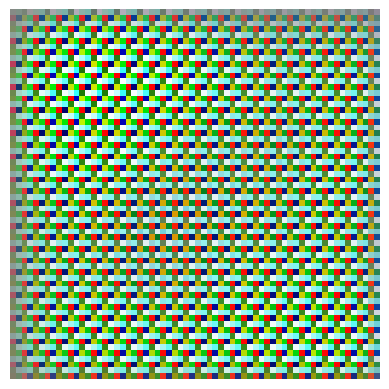

Epoch 1541, Generator Loss: 8.4618, Discriminator Loss: 0.0023
Epoch 1542, Generator Loss: 9.8200, Discriminator Loss: 0.0045
Epoch 1543, Generator Loss: 9.6714, Discriminator Loss: 0.0044
Epoch 1544, Generator Loss: 10.4812, Discriminator Loss: 0.0004
Epoch 1545, Generator Loss: 10.7962, Discriminator Loss: 0.0006
Epoch 1546, Generator Loss: 10.7201, Discriminator Loss: 0.0024
Epoch 1547, Generator Loss: 11.0366, Discriminator Loss: 0.0004
Epoch 1548, Generator Loss: 10.8593, Discriminator Loss: 0.0004
Epoch 1549, Generator Loss: 10.4131, Discriminator Loss: 0.0048
Epoch 1550, Generator Loss: 10.3832, Discriminator Loss: 0.0033


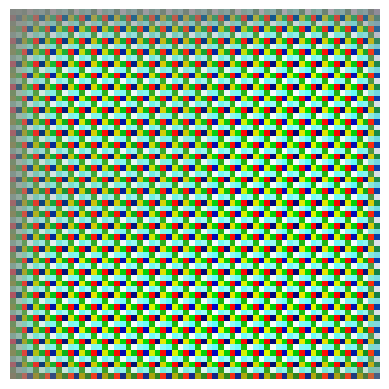

Epoch 1551, Generator Loss: 10.0432, Discriminator Loss: 0.0031
Epoch 1552, Generator Loss: 10.3082, Discriminator Loss: 0.0021
Epoch 1553, Generator Loss: 10.1083, Discriminator Loss: 0.0030
Epoch 1554, Generator Loss: 9.7347, Discriminator Loss: 0.0031
Epoch 1555, Generator Loss: 9.7084, Discriminator Loss: 0.0034
Epoch 1556, Generator Loss: 9.3355, Discriminator Loss: 0.0237
Epoch 1557, Generator Loss: 9.4731, Discriminator Loss: 0.0068
Epoch 1558, Generator Loss: 9.5504, Discriminator Loss: 0.0064
Epoch 1559, Generator Loss: 8.7128, Discriminator Loss: 0.0484
Epoch 1560, Generator Loss: 11.3668, Discriminator Loss: 0.0195


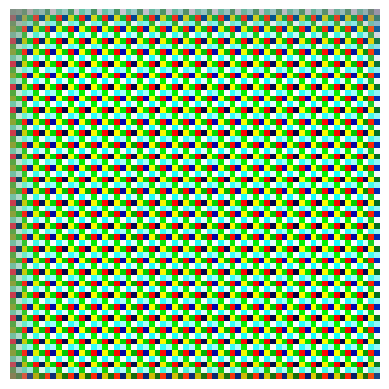

Epoch 1561, Generator Loss: 9.3331, Discriminator Loss: 0.0456
Epoch 1562, Generator Loss: 9.6735, Discriminator Loss: 0.0644
Epoch 1563, Generator Loss: 11.3679, Discriminator Loss: 0.0117
Epoch 1564, Generator Loss: 11.0354, Discriminator Loss: 0.0691
Epoch 1565, Generator Loss: 12.1826, Discriminator Loss: 0.0871
Epoch 1566, Generator Loss: 14.2291, Discriminator Loss: 0.0530
Epoch 1567, Generator Loss: 14.7392, Discriminator Loss: 0.0450
Epoch 1568, Generator Loss: 12.8681, Discriminator Loss: 0.0890
Epoch 1569, Generator Loss: 13.2924, Discriminator Loss: 0.0181
Epoch 1570, Generator Loss: 12.5706, Discriminator Loss: 0.0922


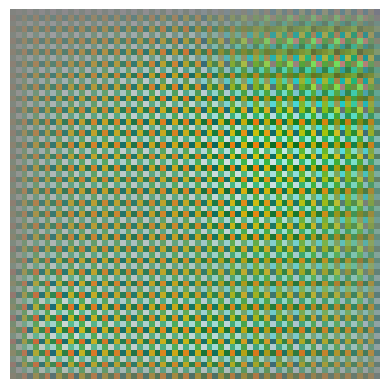

Epoch 1571, Generator Loss: 15.4868, Discriminator Loss: 0.0172
Epoch 1572, Generator Loss: 12.3652, Discriminator Loss: 0.1056
Epoch 1573, Generator Loss: 13.4507, Discriminator Loss: 0.0717
Epoch 1574, Generator Loss: 13.7087, Discriminator Loss: 0.0550
Epoch 1575, Generator Loss: 14.8851, Discriminator Loss: 0.0173
Epoch 1576, Generator Loss: 15.0919, Discriminator Loss: 0.2078
Epoch 1577, Generator Loss: 14.1946, Discriminator Loss: 0.2766
Epoch 1578, Generator Loss: 17.0027, Discriminator Loss: 0.0317
Epoch 1579, Generator Loss: 17.6320, Discriminator Loss: 0.0537
Epoch 1580, Generator Loss: 17.7296, Discriminator Loss: 0.0590


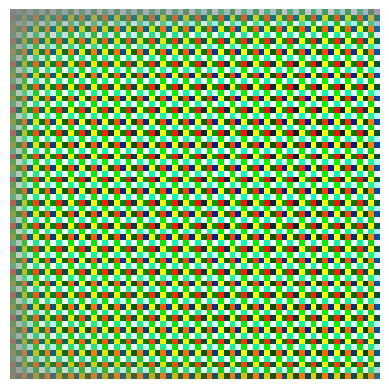

Epoch 1581, Generator Loss: 16.3140, Discriminator Loss: 0.0900
Epoch 1582, Generator Loss: 15.4544, Discriminator Loss: 0.1312
Epoch 1583, Generator Loss: 17.7855, Discriminator Loss: 0.1762
Epoch 1584, Generator Loss: 15.2018, Discriminator Loss: 0.0376
Epoch 1585, Generator Loss: 15.7888, Discriminator Loss: 0.2663
Epoch 1586, Generator Loss: 16.3868, Discriminator Loss: 0.0512
Epoch 1587, Generator Loss: 17.8291, Discriminator Loss: 0.0399
Epoch 1588, Generator Loss: 17.7591, Discriminator Loss: 0.0276
Epoch 1589, Generator Loss: 14.7864, Discriminator Loss: 0.1628
Epoch 1590, Generator Loss: 16.2840, Discriminator Loss: 0.0313


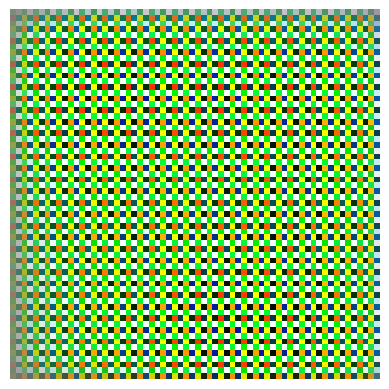

Epoch 1591, Generator Loss: 15.7545, Discriminator Loss: 0.2029
Epoch 1592, Generator Loss: 14.2743, Discriminator Loss: 0.3541
Epoch 1593, Generator Loss: 17.1757, Discriminator Loss: 0.0794
Epoch 1594, Generator Loss: 13.0753, Discriminator Loss: 0.2355
Epoch 1595, Generator Loss: 13.1676, Discriminator Loss: 0.4436
Epoch 1596, Generator Loss: 14.2423, Discriminator Loss: 0.3336
Epoch 1597, Generator Loss: 13.7560, Discriminator Loss: 0.1746
Epoch 1598, Generator Loss: 10.9485, Discriminator Loss: 0.6835
Epoch 1599, Generator Loss: 11.6492, Discriminator Loss: 0.5960
Epoch 1600, Generator Loss: 10.5344, Discriminator Loss: 0.3411


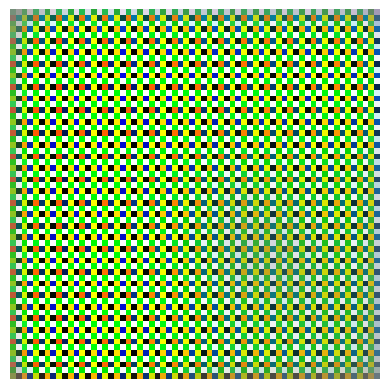

Epoch 1601, Generator Loss: 8.4764, Discriminator Loss: 0.4492
Epoch 1602, Generator Loss: 8.5559, Discriminator Loss: 1.0483
Epoch 1603, Generator Loss: 9.9407, Discriminator Loss: 0.3223
Epoch 1604, Generator Loss: 8.3052, Discriminator Loss: 0.1874
Epoch 1605, Generator Loss: 6.1566, Discriminator Loss: 0.3333
Epoch 1606, Generator Loss: 6.3112, Discriminator Loss: 0.1454
Epoch 1607, Generator Loss: 4.8747, Discriminator Loss: 0.2464
Epoch 1608, Generator Loss: 5.1635, Discriminator Loss: 0.2593
Epoch 1609, Generator Loss: 5.3157, Discriminator Loss: 0.1061
Epoch 1610, Generator Loss: 4.2747, Discriminator Loss: 0.1685


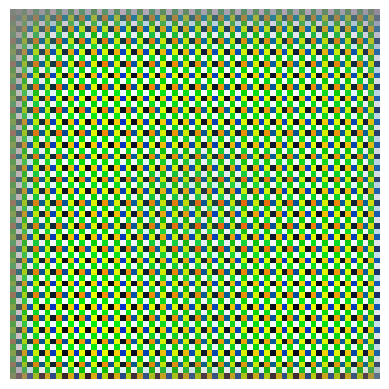

Epoch 1611, Generator Loss: 4.0825, Discriminator Loss: 0.1524
Epoch 1612, Generator Loss: 3.6952, Discriminator Loss: 0.1234
Epoch 1613, Generator Loss: 3.7080, Discriminator Loss: 0.1221
Epoch 1614, Generator Loss: 3.3948, Discriminator Loss: 0.1748
Epoch 1615, Generator Loss: 3.8843, Discriminator Loss: 0.1624
Epoch 1616, Generator Loss: 4.8832, Discriminator Loss: 0.1021
Epoch 1617, Generator Loss: 4.4773, Discriminator Loss: 0.1067
Epoch 1618, Generator Loss: 4.1187, Discriminator Loss: 0.1130
Epoch 1619, Generator Loss: 4.1579, Discriminator Loss: 0.1121
Epoch 1620, Generator Loss: 4.0972, Discriminator Loss: 0.0917


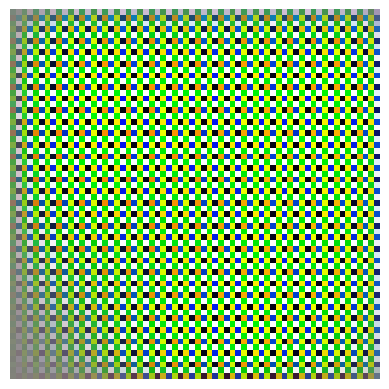

Epoch 1621, Generator Loss: 4.6044, Discriminator Loss: 0.0904
Epoch 1622, Generator Loss: 5.5929, Discriminator Loss: 0.0798
Epoch 1623, Generator Loss: 5.4722, Discriminator Loss: 0.0931
Epoch 1624, Generator Loss: 5.6476, Discriminator Loss: 0.1015
Epoch 1625, Generator Loss: 7.0652, Discriminator Loss: 0.0642
Epoch 1626, Generator Loss: 6.5844, Discriminator Loss: 0.0751
Epoch 1627, Generator Loss: 5.4872, Discriminator Loss: 0.0857
Epoch 1628, Generator Loss: 7.1947, Discriminator Loss: 0.0482
Epoch 1629, Generator Loss: 6.9210, Discriminator Loss: 0.0505
Epoch 1630, Generator Loss: 7.6009, Discriminator Loss: 0.0411


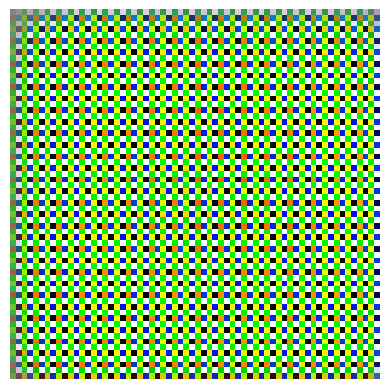

Epoch 1631, Generator Loss: 8.2856, Discriminator Loss: 0.0406
Epoch 1632, Generator Loss: 7.8562, Discriminator Loss: 0.0231
Epoch 1633, Generator Loss: 7.6505, Discriminator Loss: 0.0322
Epoch 1634, Generator Loss: 7.5674, Discriminator Loss: 0.0180
Epoch 1635, Generator Loss: 8.5797, Discriminator Loss: 0.0168
Epoch 1636, Generator Loss: 8.3803, Discriminator Loss: 0.0202
Epoch 1637, Generator Loss: 7.4217, Discriminator Loss: 0.0227
Epoch 1638, Generator Loss: 7.1979, Discriminator Loss: 0.0187
Epoch 1639, Generator Loss: 7.1892, Discriminator Loss: 0.0151
Epoch 1640, Generator Loss: 8.5081, Discriminator Loss: 0.0110


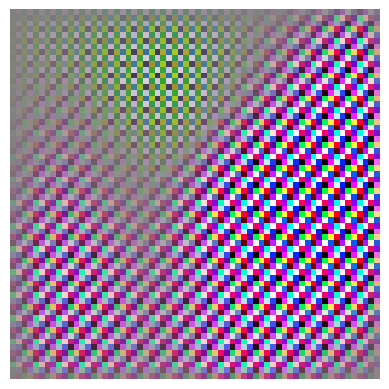

Epoch 1641, Generator Loss: 8.5786, Discriminator Loss: 0.0117
Epoch 1642, Generator Loss: 7.5465, Discriminator Loss: 0.0165
Epoch 1643, Generator Loss: 7.6286, Discriminator Loss: 0.0225
Epoch 1644, Generator Loss: 7.2719, Discriminator Loss: 0.0196
Epoch 1645, Generator Loss: 8.6916, Discriminator Loss: 0.0177
Epoch 1646, Generator Loss: 8.0939, Discriminator Loss: 0.0207
Epoch 1647, Generator Loss: 7.1877, Discriminator Loss: 0.0218
Epoch 1648, Generator Loss: 7.9709, Discriminator Loss: 0.0219
Epoch 1649, Generator Loss: 8.5459, Discriminator Loss: 0.0193
Epoch 1650, Generator Loss: 7.9395, Discriminator Loss: 0.0297


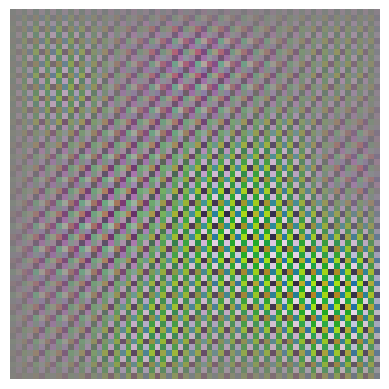

Epoch 1651, Generator Loss: 8.1777, Discriminator Loss: 0.0441
Epoch 1652, Generator Loss: 8.8648, Discriminator Loss: 0.0372
Epoch 1653, Generator Loss: 8.7548, Discriminator Loss: 0.0359
Epoch 1654, Generator Loss: 7.6246, Discriminator Loss: 0.0395
Epoch 1655, Generator Loss: 7.8802, Discriminator Loss: 0.0580
Epoch 1656, Generator Loss: 8.0338, Discriminator Loss: 0.0504
Epoch 1657, Generator Loss: 7.6161, Discriminator Loss: 0.0499
Epoch 1658, Generator Loss: 8.4168, Discriminator Loss: 0.0449
Epoch 1659, Generator Loss: 6.5978, Discriminator Loss: 0.0634
Epoch 1660, Generator Loss: 8.1551, Discriminator Loss: 0.0700


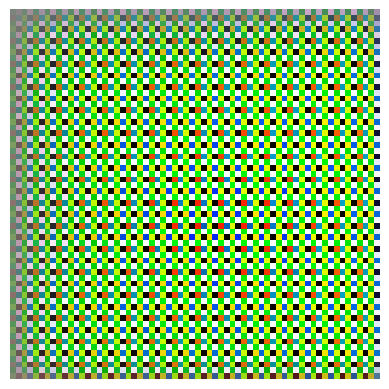

Epoch 1661, Generator Loss: 7.0775, Discriminator Loss: 0.0566
Epoch 1662, Generator Loss: 8.0252, Discriminator Loss: 0.0576
Epoch 1663, Generator Loss: 6.5875, Discriminator Loss: 0.0914
Epoch 1664, Generator Loss: 7.6626, Discriminator Loss: 0.1427
Epoch 1665, Generator Loss: 6.8601, Discriminator Loss: 0.1573
Epoch 1666, Generator Loss: 9.8452, Discriminator Loss: 0.1236
Epoch 1667, Generator Loss: 8.7780, Discriminator Loss: 0.1277
Epoch 1668, Generator Loss: 7.7798, Discriminator Loss: 0.1678
Epoch 1669, Generator Loss: 6.9832, Discriminator Loss: 0.2346
Epoch 1670, Generator Loss: 8.0485, Discriminator Loss: 0.2035


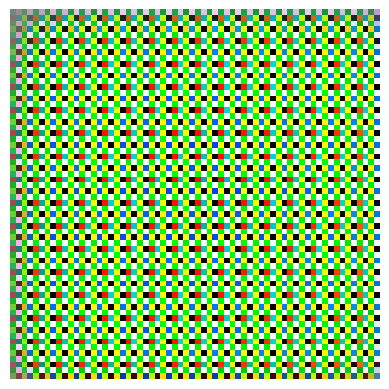

Epoch 1671, Generator Loss: 6.2245, Discriminator Loss: 0.3216
Epoch 1672, Generator Loss: 10.3031, Discriminator Loss: 0.2549
Epoch 1673, Generator Loss: 10.4637, Discriminator Loss: 0.2564
Epoch 1674, Generator Loss: 9.7465, Discriminator Loss: 0.1557
Epoch 1675, Generator Loss: 7.9854, Discriminator Loss: 0.1906
Epoch 1676, Generator Loss: 7.5684, Discriminator Loss: 0.2680
Epoch 1677, Generator Loss: 8.1245, Discriminator Loss: 0.0800
Epoch 1678, Generator Loss: 9.3607, Discriminator Loss: 0.0820
Epoch 1679, Generator Loss: 8.5207, Discriminator Loss: 0.0842
Epoch 1680, Generator Loss: 11.6499, Discriminator Loss: 0.0610


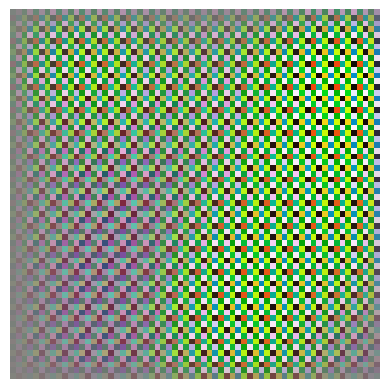

Epoch 1681, Generator Loss: 11.4340, Discriminator Loss: 0.0597
Epoch 1682, Generator Loss: 10.7735, Discriminator Loss: 0.0375
Epoch 1683, Generator Loss: 10.3184, Discriminator Loss: 0.0344
Epoch 1684, Generator Loss: 8.4675, Discriminator Loss: 0.0661
Epoch 1685, Generator Loss: 8.2337, Discriminator Loss: 0.0601
Epoch 1686, Generator Loss: 8.7427, Discriminator Loss: 0.1084
Epoch 1687, Generator Loss: 8.4004, Discriminator Loss: 0.0728
Epoch 1688, Generator Loss: 9.8460, Discriminator Loss: 0.0551
Epoch 1689, Generator Loss: 10.9401, Discriminator Loss: 0.1077
Epoch 1690, Generator Loss: 12.9153, Discriminator Loss: 0.0883


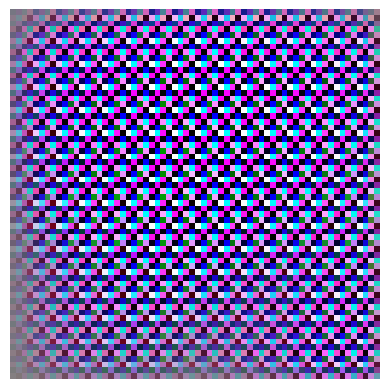

Epoch 1691, Generator Loss: 9.9783, Discriminator Loss: 0.1392
Epoch 1692, Generator Loss: 9.6739, Discriminator Loss: 0.0912
Epoch 1693, Generator Loss: 10.5064, Discriminator Loss: 0.2176
Epoch 1694, Generator Loss: 8.2414, Discriminator Loss: 0.2440
Epoch 1695, Generator Loss: 9.3938, Discriminator Loss: 0.0945
Epoch 1696, Generator Loss: 6.9064, Discriminator Loss: 0.2186
Epoch 1697, Generator Loss: 6.5079, Discriminator Loss: 0.3736
Epoch 1698, Generator Loss: 6.4982, Discriminator Loss: 0.3105
Epoch 1699, Generator Loss: 6.4638, Discriminator Loss: 0.2821
Epoch 1700, Generator Loss: 4.5789, Discriminator Loss: 0.3707


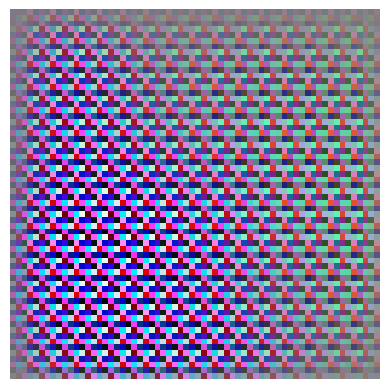

Epoch 1701, Generator Loss: 6.4068, Discriminator Loss: 0.2297
Epoch 1702, Generator Loss: 6.3766, Discriminator Loss: 0.3140
Epoch 1703, Generator Loss: 6.9015, Discriminator Loss: 0.1675
Epoch 1704, Generator Loss: 8.4859, Discriminator Loss: 0.1046
Epoch 1705, Generator Loss: 8.1978, Discriminator Loss: 0.0632
Epoch 1706, Generator Loss: 8.6974, Discriminator Loss: 0.0409
Epoch 1707, Generator Loss: 7.9414, Discriminator Loss: 0.0280
Epoch 1708, Generator Loss: 8.8637, Discriminator Loss: 0.0119
Epoch 1709, Generator Loss: 8.4515, Discriminator Loss: 0.0112
Epoch 1710, Generator Loss: 7.9650, Discriminator Loss: 0.0094


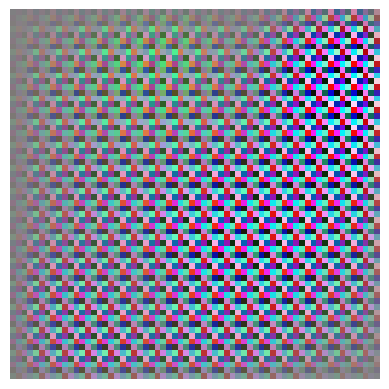

Epoch 1711, Generator Loss: 8.0162, Discriminator Loss: 0.0064
Epoch 1712, Generator Loss: 9.2854, Discriminator Loss: 0.0069
Epoch 1713, Generator Loss: 7.3465, Discriminator Loss: 0.0079
Epoch 1714, Generator Loss: 6.3367, Discriminator Loss: 0.0181
Epoch 1715, Generator Loss: 6.5883, Discriminator Loss: 0.0158
Epoch 1716, Generator Loss: 4.9735, Discriminator Loss: 0.0217
Epoch 1717, Generator Loss: 5.7058, Discriminator Loss: 0.0124
Epoch 1718, Generator Loss: 5.4224, Discriminator Loss: 0.0173
Epoch 1719, Generator Loss: 6.1916, Discriminator Loss: 0.0164
Epoch 1720, Generator Loss: 5.9693, Discriminator Loss: 0.0146


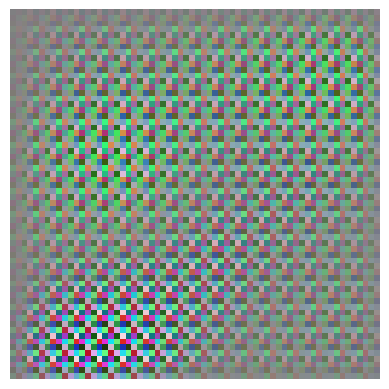

Epoch 1721, Generator Loss: 5.8237, Discriminator Loss: 0.0143
Epoch 1722, Generator Loss: 6.0202, Discriminator Loss: 0.0151
Epoch 1723, Generator Loss: 6.0305, Discriminator Loss: 0.0184
Epoch 1724, Generator Loss: 6.2021, Discriminator Loss: 0.0215
Epoch 1725, Generator Loss: 6.4727, Discriminator Loss: 0.0295
Epoch 1726, Generator Loss: 5.7142, Discriminator Loss: 0.0315
Epoch 1727, Generator Loss: 5.8737, Discriminator Loss: 0.0390
Epoch 1728, Generator Loss: 4.5430, Discriminator Loss: 0.0522
Epoch 1729, Generator Loss: 5.6381, Discriminator Loss: 0.0654
Epoch 1730, Generator Loss: 4.7615, Discriminator Loss: 0.0831


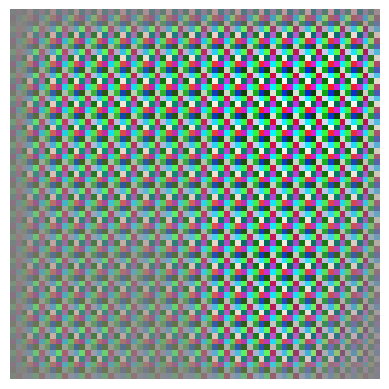

Epoch 1731, Generator Loss: 4.0568, Discriminator Loss: 0.1066
Epoch 1732, Generator Loss: 4.9859, Discriminator Loss: 0.1222
Epoch 1733, Generator Loss: 4.5827, Discriminator Loss: 0.1711
Epoch 1734, Generator Loss: 4.7040, Discriminator Loss: 0.1215
Epoch 1735, Generator Loss: 3.7961, Discriminator Loss: 0.2462
Epoch 1736, Generator Loss: 4.9492, Discriminator Loss: 0.1823
Epoch 1737, Generator Loss: 4.5969, Discriminator Loss: 0.1485
Epoch 1738, Generator Loss: 4.8839, Discriminator Loss: 0.1322
Epoch 1739, Generator Loss: 4.6195, Discriminator Loss: 0.2903
Epoch 1740, Generator Loss: 5.6413, Discriminator Loss: 0.1012


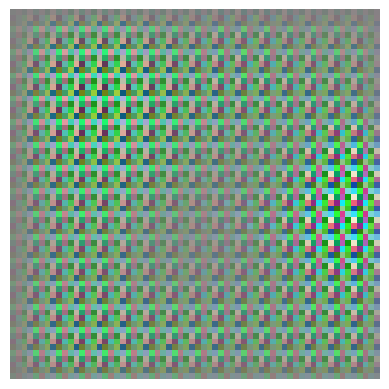

Epoch 1741, Generator Loss: 6.9479, Discriminator Loss: 0.0932
Epoch 1742, Generator Loss: 5.9176, Discriminator Loss: 0.0622
Epoch 1743, Generator Loss: 5.7394, Discriminator Loss: 0.0408
Epoch 1744, Generator Loss: 4.8273, Discriminator Loss: 0.0702
Epoch 1745, Generator Loss: 4.3966, Discriminator Loss: 0.0539
Epoch 1746, Generator Loss: 5.8882, Discriminator Loss: 0.0224
Epoch 1747, Generator Loss: 5.0520, Discriminator Loss: 0.0370
Epoch 1748, Generator Loss: 5.6801, Discriminator Loss: 0.0287
Epoch 1749, Generator Loss: 5.6551, Discriminator Loss: 0.0275
Epoch 1750, Generator Loss: 5.9154, Discriminator Loss: 0.0261


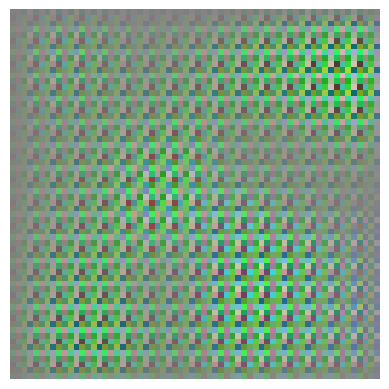

Epoch 1751, Generator Loss: 5.6631, Discriminator Loss: 0.0252
Epoch 1752, Generator Loss: 5.5822, Discriminator Loss: 0.0480
Epoch 1753, Generator Loss: 4.8370, Discriminator Loss: 0.0654
Epoch 1754, Generator Loss: 5.2238, Discriminator Loss: 0.0564
Epoch 1755, Generator Loss: 4.8597, Discriminator Loss: 0.0462
Epoch 1756, Generator Loss: 4.6742, Discriminator Loss: 0.0644
Epoch 1757, Generator Loss: 4.4296, Discriminator Loss: 0.0892
Epoch 1758, Generator Loss: 3.8080, Discriminator Loss: 0.0901
Epoch 1759, Generator Loss: 3.8696, Discriminator Loss: 0.1091
Epoch 1760, Generator Loss: 3.7616, Discriminator Loss: 0.1106


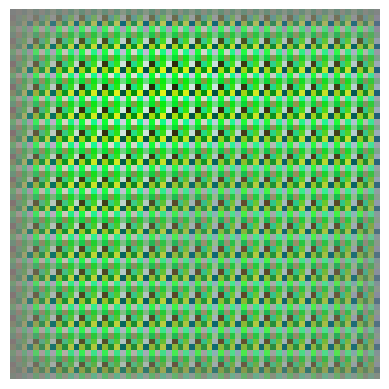

Epoch 1761, Generator Loss: 4.3457, Discriminator Loss: 0.1123
Epoch 1762, Generator Loss: 4.4207, Discriminator Loss: 0.0927
Epoch 1763, Generator Loss: 3.5723, Discriminator Loss: 0.1038
Epoch 1764, Generator Loss: 3.4295, Discriminator Loss: 0.0968
Epoch 1765, Generator Loss: 3.5174, Discriminator Loss: 0.0748
Epoch 1766, Generator Loss: 3.2530, Discriminator Loss: 0.0956
Epoch 1767, Generator Loss: 3.4842, Discriminator Loss: 0.1102
Epoch 1768, Generator Loss: 4.3494, Discriminator Loss: 0.0813
Epoch 1769, Generator Loss: 4.2623, Discriminator Loss: 0.0987
Epoch 1770, Generator Loss: 3.4628, Discriminator Loss: 0.1077


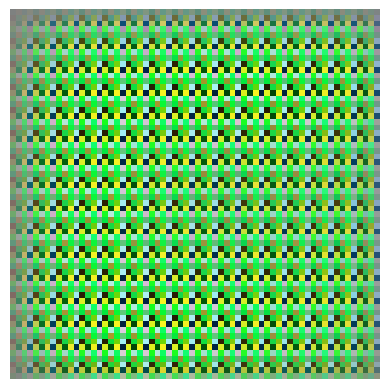

Epoch 1771, Generator Loss: 3.4004, Discriminator Loss: 0.0996
Epoch 1772, Generator Loss: 2.6899, Discriminator Loss: 0.2181
Epoch 1773, Generator Loss: 3.4037, Discriminator Loss: 0.1625
Epoch 1774, Generator Loss: 4.6809, Discriminator Loss: 0.1987
Epoch 1775, Generator Loss: 3.5354, Discriminator Loss: 0.2840
Epoch 1776, Generator Loss: 2.5350, Discriminator Loss: 0.3914
Epoch 1777, Generator Loss: 3.4432, Discriminator Loss: 0.3226
Epoch 1778, Generator Loss: 3.4624, Discriminator Loss: 0.3024
Epoch 1779, Generator Loss: 3.0993, Discriminator Loss: 0.4512
Epoch 1780, Generator Loss: 2.7801, Discriminator Loss: 0.3868


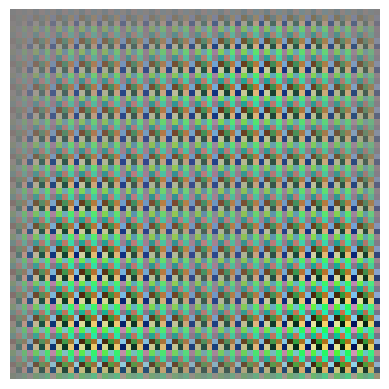

Epoch 1781, Generator Loss: 2.3911, Discriminator Loss: 0.9212
Epoch 1782, Generator Loss: 3.6586, Discriminator Loss: 0.6258
Epoch 1783, Generator Loss: 2.6993, Discriminator Loss: 0.4890
Epoch 1784, Generator Loss: 2.3343, Discriminator Loss: 0.6974
Epoch 1785, Generator Loss: 2.3697, Discriminator Loss: 0.7168
Epoch 1786, Generator Loss: 4.5556, Discriminator Loss: 0.7969
Epoch 1787, Generator Loss: 4.1170, Discriminator Loss: 0.2128
Epoch 1788, Generator Loss: 3.3866, Discriminator Loss: 0.1044
Epoch 1789, Generator Loss: 2.3739, Discriminator Loss: 0.3469
Epoch 1790, Generator Loss: 3.9549, Discriminator Loss: 0.0953


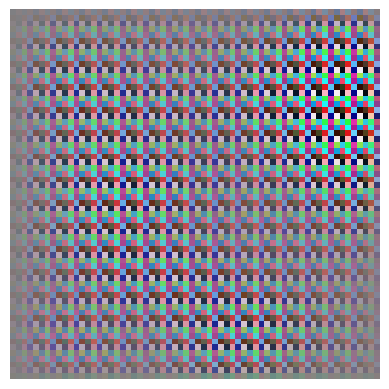

Epoch 1791, Generator Loss: 5.3960, Discriminator Loss: 0.0846
Epoch 1792, Generator Loss: 7.0940, Discriminator Loss: 0.0627
Epoch 1793, Generator Loss: 7.5262, Discriminator Loss: 0.1142
Epoch 1794, Generator Loss: 7.3777, Discriminator Loss: 0.1081
Epoch 1795, Generator Loss: 6.9892, Discriminator Loss: 0.0480
Epoch 1796, Generator Loss: 5.4252, Discriminator Loss: 0.0987
Epoch 1797, Generator Loss: 3.4345, Discriminator Loss: 0.2627
Epoch 1798, Generator Loss: 4.5330, Discriminator Loss: 0.0866
Epoch 1799, Generator Loss: 3.9834, Discriminator Loss: 0.1292
Epoch 1800, Generator Loss: 3.9346, Discriminator Loss: 0.1585


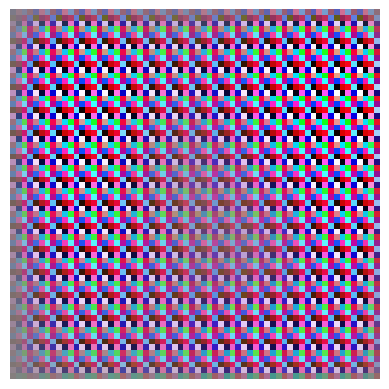

Epoch 1801, Generator Loss: 4.0550, Discriminator Loss: 0.2097
Epoch 1802, Generator Loss: 2.4363, Discriminator Loss: 0.2285
Epoch 1803, Generator Loss: 1.7047, Discriminator Loss: 0.2938
Epoch 1804, Generator Loss: 2.0878, Discriminator Loss: 0.2745
Epoch 1805, Generator Loss: 3.5864, Discriminator Loss: 0.3092
Epoch 1806, Generator Loss: 3.3876, Discriminator Loss: 0.1376
Epoch 1807, Generator Loss: 3.4762, Discriminator Loss: 0.1146
Epoch 1808, Generator Loss: 3.6212, Discriminator Loss: 0.0648
Epoch 1809, Generator Loss: 3.5152, Discriminator Loss: 0.0852
Epoch 1810, Generator Loss: 4.7302, Discriminator Loss: 0.0303


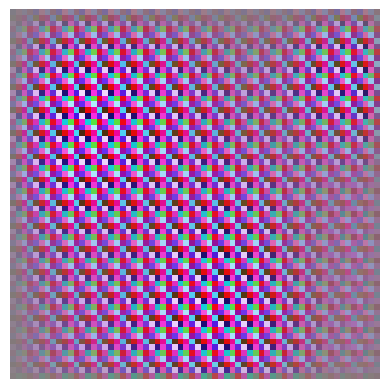

Epoch 1811, Generator Loss: 4.3834, Discriminator Loss: 0.0558
Epoch 1812, Generator Loss: 5.3163, Discriminator Loss: 0.0409
Epoch 1813, Generator Loss: 6.0506, Discriminator Loss: 0.0419
Epoch 1814, Generator Loss: 6.2928, Discriminator Loss: 0.0440
Epoch 1815, Generator Loss: 6.7546, Discriminator Loss: 0.0608
Epoch 1816, Generator Loss: 6.1785, Discriminator Loss: 0.0453
Epoch 1817, Generator Loss: 5.3165, Discriminator Loss: 0.0472
Epoch 1818, Generator Loss: 4.7142, Discriminator Loss: 0.0524
Epoch 1819, Generator Loss: 4.7954, Discriminator Loss: 0.0415
Epoch 1820, Generator Loss: 3.3732, Discriminator Loss: 0.0927


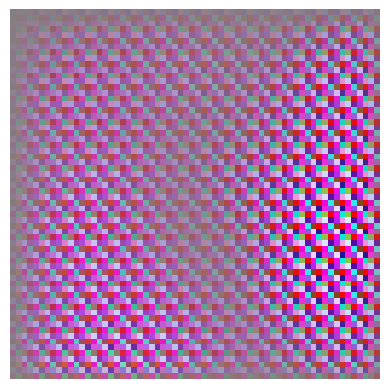

Epoch 1821, Generator Loss: 3.5771, Discriminator Loss: 0.0862
Epoch 1822, Generator Loss: 3.9202, Discriminator Loss: 0.1010
Epoch 1823, Generator Loss: 3.4549, Discriminator Loss: 0.1466
Epoch 1824, Generator Loss: 3.4899, Discriminator Loss: 0.1245
Epoch 1825, Generator Loss: 2.8185, Discriminator Loss: 0.1459
Epoch 1826, Generator Loss: 2.4055, Discriminator Loss: 0.1536
Epoch 1827, Generator Loss: 3.0078, Discriminator Loss: 0.1454
Epoch 1828, Generator Loss: 3.5641, Discriminator Loss: 0.1096
Epoch 1829, Generator Loss: 3.5771, Discriminator Loss: 0.1257
Epoch 1830, Generator Loss: 3.3465, Discriminator Loss: 0.1179


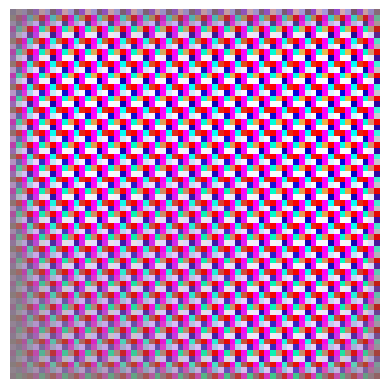

Epoch 1831, Generator Loss: 3.1698, Discriminator Loss: 0.0906
Epoch 1832, Generator Loss: 3.4978, Discriminator Loss: 0.0829
Epoch 1833, Generator Loss: 4.8153, Discriminator Loss: 0.0711
Epoch 1834, Generator Loss: 5.4618, Discriminator Loss: 0.0561
Epoch 1835, Generator Loss: 5.1754, Discriminator Loss: 0.0642
Epoch 1836, Generator Loss: 5.1897, Discriminator Loss: 0.0602
Epoch 1837, Generator Loss: 4.0678, Discriminator Loss: 0.0904
Epoch 1838, Generator Loss: 3.7833, Discriminator Loss: 0.0834
Epoch 1839, Generator Loss: 4.7874, Discriminator Loss: 0.0840
Epoch 1840, Generator Loss: 4.2744, Discriminator Loss: 0.1138


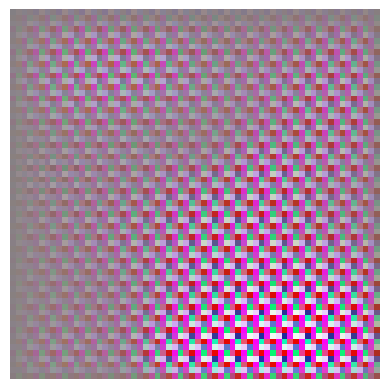

Epoch 1841, Generator Loss: 3.6370, Discriminator Loss: 0.1149
Epoch 1842, Generator Loss: 2.3180, Discriminator Loss: 0.1654
Epoch 1843, Generator Loss: 2.1273, Discriminator Loss: 0.2805
Epoch 1844, Generator Loss: 2.9845, Discriminator Loss: 0.4103
Epoch 1845, Generator Loss: 2.6529, Discriminator Loss: 0.3937
Epoch 1846, Generator Loss: 2.6328, Discriminator Loss: 0.2564
Epoch 1847, Generator Loss: 3.8867, Discriminator Loss: 0.1060
Epoch 1848, Generator Loss: 5.0349, Discriminator Loss: 0.0901
Epoch 1849, Generator Loss: 5.5895, Discriminator Loss: 0.0321
Epoch 1850, Generator Loss: 5.8224, Discriminator Loss: 0.0174


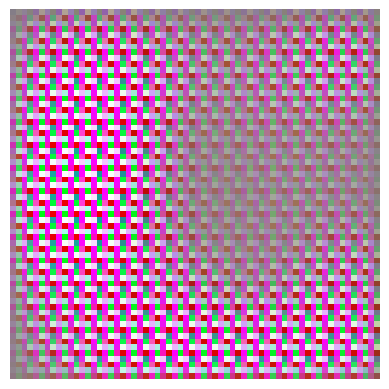

Epoch 1851, Generator Loss: 5.8474, Discriminator Loss: 0.0090
Epoch 1852, Generator Loss: 5.7110, Discriminator Loss: 0.0108
Epoch 1853, Generator Loss: 6.0577, Discriminator Loss: 0.0072
Epoch 1854, Generator Loss: 6.4989, Discriminator Loss: 0.0065
Epoch 1855, Generator Loss: 6.8491, Discriminator Loss: 0.0059
Epoch 1856, Generator Loss: 6.5721, Discriminator Loss: 0.0095
Epoch 1857, Generator Loss: 6.8156, Discriminator Loss: 0.0145
Epoch 1858, Generator Loss: 6.6386, Discriminator Loss: 0.0106
Epoch 1859, Generator Loss: 7.4084, Discriminator Loss: 0.0437
Epoch 1860, Generator Loss: 7.5099, Discriminator Loss: 0.0127


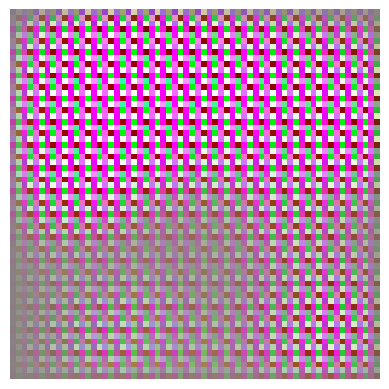

Epoch 1861, Generator Loss: 7.9362, Discriminator Loss: 0.0036
Epoch 1862, Generator Loss: 8.2929, Discriminator Loss: 0.0040
Epoch 1863, Generator Loss: 8.8082, Discriminator Loss: 0.0037
Epoch 1864, Generator Loss: 7.9339, Discriminator Loss: 0.0189
Epoch 1865, Generator Loss: 7.7772, Discriminator Loss: 0.0176
Epoch 1866, Generator Loss: 8.4394, Discriminator Loss: 0.0119
Epoch 1867, Generator Loss: 7.8253, Discriminator Loss: 0.0154
Epoch 1868, Generator Loss: 7.7308, Discriminator Loss: 0.0637
Epoch 1869, Generator Loss: 8.3594, Discriminator Loss: 0.0205
Epoch 1870, Generator Loss: 8.0554, Discriminator Loss: 0.0204


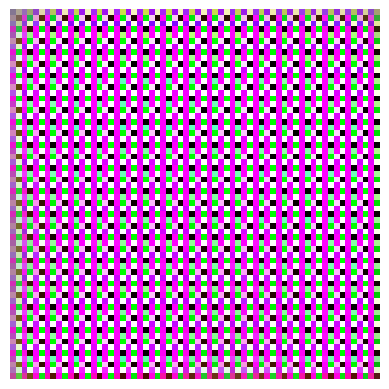

Epoch 1871, Generator Loss: 7.3522, Discriminator Loss: 0.0166
Epoch 1872, Generator Loss: 6.7063, Discriminator Loss: 0.0934
Epoch 1873, Generator Loss: 7.2470, Discriminator Loss: 0.0523
Epoch 1874, Generator Loss: 8.2754, Discriminator Loss: 0.0312
Epoch 1875, Generator Loss: 7.7741, Discriminator Loss: 0.0674
Epoch 1876, Generator Loss: 6.6789, Discriminator Loss: 0.2558
Epoch 1877, Generator Loss: 9.5816, Discriminator Loss: 0.0889
Epoch 1878, Generator Loss: 9.1351, Discriminator Loss: 0.2407
Epoch 1879, Generator Loss: 11.1221, Discriminator Loss: 0.1350
Epoch 1880, Generator Loss: 9.3423, Discriminator Loss: 0.1926


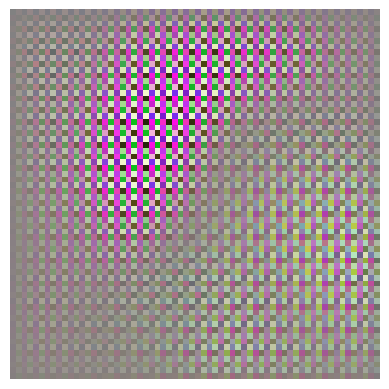

Epoch 1881, Generator Loss: 8.6378, Discriminator Loss: 0.6299
Epoch 1882, Generator Loss: 8.9494, Discriminator Loss: 0.7680
Epoch 1883, Generator Loss: 13.8029, Discriminator Loss: 0.8447
Epoch 1884, Generator Loss: 14.4711, Discriminator Loss: 0.4027
Epoch 1885, Generator Loss: 10.8366, Discriminator Loss: 0.2690
Epoch 1886, Generator Loss: 9.8539, Discriminator Loss: 1.2419
Epoch 1887, Generator Loss: 11.4198, Discriminator Loss: 0.7337
Epoch 1888, Generator Loss: 16.8246, Discriminator Loss: 0.6938
Epoch 1889, Generator Loss: 19.1430, Discriminator Loss: 0.1900
Epoch 1890, Generator Loss: 24.3728, Discriminator Loss: 0.6903


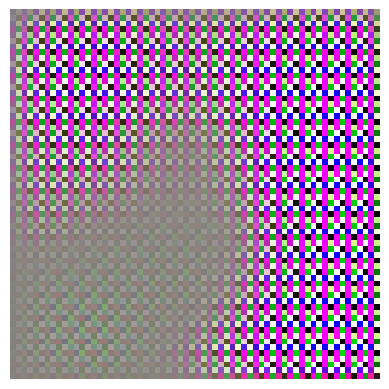

Epoch 1891, Generator Loss: 20.8756, Discriminator Loss: 0.6895
Epoch 1892, Generator Loss: 20.1029, Discriminator Loss: 0.3553
Epoch 1893, Generator Loss: 21.0236, Discriminator Loss: 0.4976
Epoch 1894, Generator Loss: 23.8251, Discriminator Loss: 0.5859
Epoch 1895, Generator Loss: 21.1348, Discriminator Loss: 0.3605
Epoch 1896, Generator Loss: 21.7829, Discriminator Loss: 0.4773
Epoch 1897, Generator Loss: 22.8136, Discriminator Loss: 0.8730
Epoch 1898, Generator Loss: 25.3496, Discriminator Loss: 1.1451
Epoch 1899, Generator Loss: 26.3877, Discriminator Loss: 0.5468
Epoch 1900, Generator Loss: 26.1269, Discriminator Loss: 0.3821


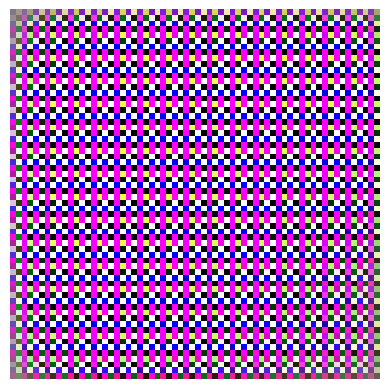

Epoch 1901, Generator Loss: 23.4009, Discriminator Loss: 1.0257
Epoch 1902, Generator Loss: 21.1583, Discriminator Loss: 0.4856
Epoch 1903, Generator Loss: 21.4288, Discriminator Loss: 0.4474
Epoch 1904, Generator Loss: 20.4326, Discriminator Loss: 0.9634
Epoch 1905, Generator Loss: 19.6035, Discriminator Loss: 1.7401
Epoch 1906, Generator Loss: 20.5134, Discriminator Loss: 1.0769
Epoch 1907, Generator Loss: 24.6784, Discriminator Loss: 1.4900
Epoch 1908, Generator Loss: 23.1287, Discriminator Loss: 1.0428
Epoch 1909, Generator Loss: 17.2740, Discriminator Loss: 1.6523
Epoch 1910, Generator Loss: 14.4673, Discriminator Loss: 1.1179


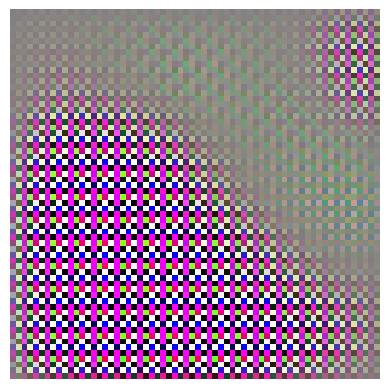

Epoch 1911, Generator Loss: 12.1043, Discriminator Loss: 2.0372
Epoch 1912, Generator Loss: 11.9543, Discriminator Loss: 1.7882
Epoch 1913, Generator Loss: 12.7695, Discriminator Loss: 1.1289
Epoch 1914, Generator Loss: 14.0020, Discriminator Loss: 1.7948
Epoch 1915, Generator Loss: 9.1023, Discriminator Loss: 1.7507
Epoch 1916, Generator Loss: 6.9092, Discriminator Loss: 2.4252
Epoch 1917, Generator Loss: 5.6688, Discriminator Loss: 1.6852
Epoch 1918, Generator Loss: 5.5991, Discriminator Loss: 1.0845
Epoch 1919, Generator Loss: 6.3144, Discriminator Loss: 0.8581
Epoch 1920, Generator Loss: 4.6714, Discriminator Loss: 0.7390


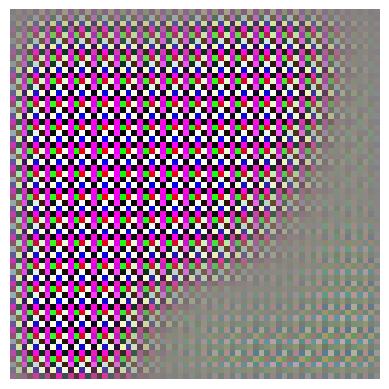

Epoch 1921, Generator Loss: 3.1224, Discriminator Loss: 0.4813
Epoch 1922, Generator Loss: 3.2847, Discriminator Loss: 0.1189
Epoch 1923, Generator Loss: 3.0219, Discriminator Loss: 0.1307
Epoch 1924, Generator Loss: 3.2434, Discriminator Loss: 0.0891
Epoch 1925, Generator Loss: 4.3251, Discriminator Loss: 0.0629
Epoch 1926, Generator Loss: 4.3337, Discriminator Loss: 0.0612
Epoch 1927, Generator Loss: 4.5187, Discriminator Loss: 0.0650
Epoch 1928, Generator Loss: 4.7798, Discriminator Loss: 0.0533
Epoch 1929, Generator Loss: 4.5110, Discriminator Loss: 0.0736
Epoch 1930, Generator Loss: 3.9595, Discriminator Loss: 0.0624


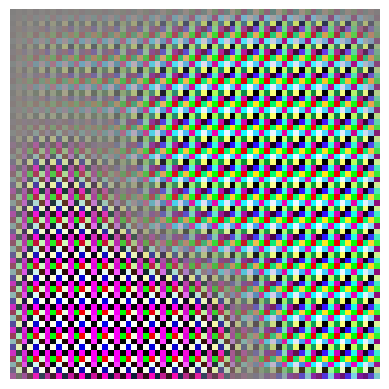

Epoch 1931, Generator Loss: 3.6084, Discriminator Loss: 0.1863
Epoch 1932, Generator Loss: 4.9081, Discriminator Loss: 0.0825
Epoch 1933, Generator Loss: 5.1823, Discriminator Loss: 0.1587
Epoch 1934, Generator Loss: 6.4391, Discriminator Loss: 0.1108
Epoch 1935, Generator Loss: 7.1096, Discriminator Loss: 0.1155
Epoch 1936, Generator Loss: 7.6672, Discriminator Loss: 0.0709
Epoch 1937, Generator Loss: 9.0405, Discriminator Loss: 0.0514
Epoch 1938, Generator Loss: 8.9627, Discriminator Loss: 0.0165
Epoch 1939, Generator Loss: 8.5995, Discriminator Loss: 0.0119
Epoch 1940, Generator Loss: 8.6194, Discriminator Loss: 0.0073


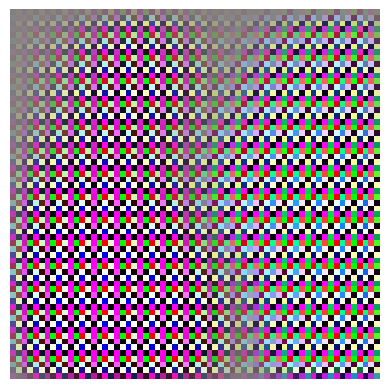

Epoch 1941, Generator Loss: 9.6673, Discriminator Loss: 0.0044
Epoch 1942, Generator Loss: 9.6176, Discriminator Loss: 0.0049
Epoch 1943, Generator Loss: 10.2390, Discriminator Loss: 0.0080
Epoch 1944, Generator Loss: 7.9759, Discriminator Loss: 0.0213
Epoch 1945, Generator Loss: 7.9804, Discriminator Loss: 0.0312
Epoch 1946, Generator Loss: 8.6341, Discriminator Loss: 0.0292
Epoch 1947, Generator Loss: 9.7329, Discriminator Loss: 0.0143
Epoch 1948, Generator Loss: 9.2038, Discriminator Loss: 0.0112
Epoch 1949, Generator Loss: 11.7899, Discriminator Loss: 0.0037
Epoch 1950, Generator Loss: 12.2708, Discriminator Loss: 0.0030


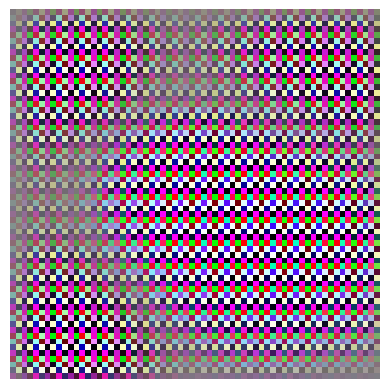

Epoch 1951, Generator Loss: 11.8193, Discriminator Loss: 0.0022
Epoch 1952, Generator Loss: 11.2518, Discriminator Loss: 0.0051
Epoch 1953, Generator Loss: 10.6143, Discriminator Loss: 0.0082
Epoch 1954, Generator Loss: 11.1521, Discriminator Loss: 0.0055
Epoch 1955, Generator Loss: 13.2625, Discriminator Loss: 0.0037
Epoch 1956, Generator Loss: 11.4789, Discriminator Loss: 0.0035
Epoch 1957, Generator Loss: 13.8689, Discriminator Loss: 0.0025
Epoch 1958, Generator Loss: 11.8889, Discriminator Loss: 0.0023
Epoch 1959, Generator Loss: 12.3468, Discriminator Loss: 0.0024
Epoch 1960, Generator Loss: 12.4531, Discriminator Loss: 0.0030


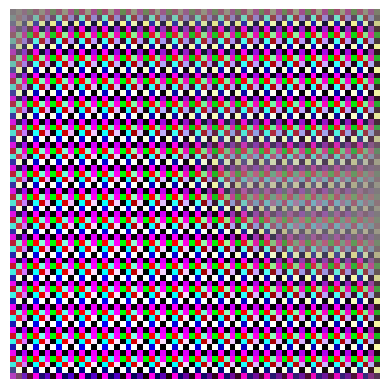

Epoch 1961, Generator Loss: 13.1511, Discriminator Loss: 0.0031
Epoch 1962, Generator Loss: 12.9836, Discriminator Loss: 0.0030
Epoch 1963, Generator Loss: 12.3053, Discriminator Loss: 0.0029
Epoch 1964, Generator Loss: 12.3683, Discriminator Loss: 0.0028
Epoch 1965, Generator Loss: 11.9144, Discriminator Loss: 0.0031
Epoch 1966, Generator Loss: 10.4089, Discriminator Loss: 0.0034
Epoch 1967, Generator Loss: 11.0428, Discriminator Loss: 0.0033
Epoch 1968, Generator Loss: 10.4254, Discriminator Loss: 0.0034
Epoch 1969, Generator Loss: 9.7008, Discriminator Loss: 0.0027
Epoch 1970, Generator Loss: 8.5293, Discriminator Loss: 0.0031


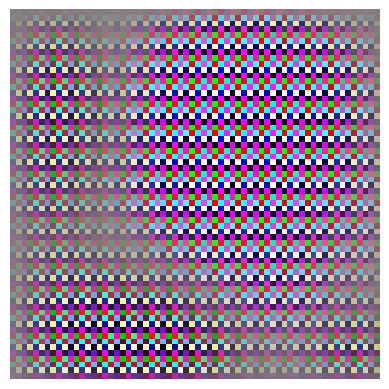

Epoch 1971, Generator Loss: 8.8896, Discriminator Loss: 0.0030
Epoch 1972, Generator Loss: 7.8954, Discriminator Loss: 0.0034
Epoch 1973, Generator Loss: 7.7415, Discriminator Loss: 0.0032
Epoch 1974, Generator Loss: 7.8239, Discriminator Loss: 0.0028
Epoch 1975, Generator Loss: 7.0614, Discriminator Loss: 0.0038
Epoch 1976, Generator Loss: 7.3620, Discriminator Loss: 0.0039
Epoch 1977, Generator Loss: 7.0988, Discriminator Loss: 0.0042
Epoch 1978, Generator Loss: 6.6766, Discriminator Loss: 0.0042
Epoch 1979, Generator Loss: 6.8238, Discriminator Loss: 0.0040
Epoch 1980, Generator Loss: 6.3146, Discriminator Loss: 0.0073


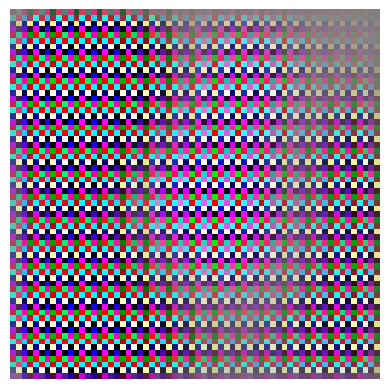

Epoch 1981, Generator Loss: 6.0176, Discriminator Loss: 0.0095
Epoch 1982, Generator Loss: 6.1465, Discriminator Loss: 0.0071
Epoch 1983, Generator Loss: 5.5676, Discriminator Loss: 0.0108
Epoch 1984, Generator Loss: 6.0521, Discriminator Loss: 0.0078
Epoch 1985, Generator Loss: 5.6874, Discriminator Loss: 0.0104
Epoch 1986, Generator Loss: 5.2466, Discriminator Loss: 0.0144
Epoch 1987, Generator Loss: 5.3617, Discriminator Loss: 0.0141
Epoch 1988, Generator Loss: 5.1403, Discriminator Loss: 0.0222
Epoch 1989, Generator Loss: 5.0091, Discriminator Loss: 0.0288
Epoch 1990, Generator Loss: 5.0476, Discriminator Loss: 0.0227


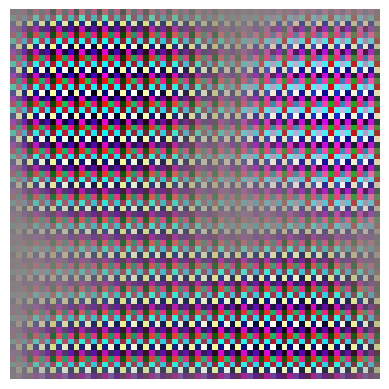

Epoch 1991, Generator Loss: 5.8333, Discriminator Loss: 0.0218
Epoch 1992, Generator Loss: 6.1264, Discriminator Loss: 0.0248
Epoch 1993, Generator Loss: 6.1330, Discriminator Loss: 0.0252
Epoch 1994, Generator Loss: 6.3877, Discriminator Loss: 0.0248
Epoch 1995, Generator Loss: 7.2774, Discriminator Loss: 0.0263
Epoch 1996, Generator Loss: 6.5234, Discriminator Loss: 0.0244
Epoch 1997, Generator Loss: 7.0197, Discriminator Loss: 0.0240
Epoch 1998, Generator Loss: 5.8315, Discriminator Loss: 0.0256
Epoch 1999, Generator Loss: 5.9460, Discriminator Loss: 0.0211
Epoch 2000, Generator Loss: 5.5265, Discriminator Loss: 0.0183


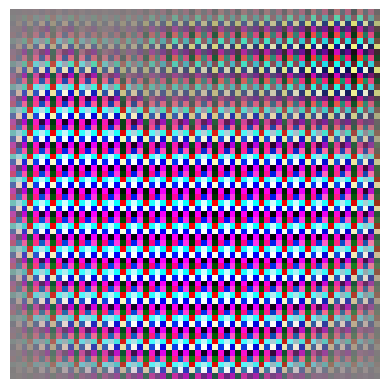

Epoch 2001, Generator Loss: 5.5451, Discriminator Loss: 0.0189
Epoch 2002, Generator Loss: 4.8063, Discriminator Loss: 0.0305
Epoch 2003, Generator Loss: 5.0447, Discriminator Loss: 0.0235
Epoch 2004, Generator Loss: 4.6240, Discriminator Loss: 0.0301
Epoch 2005, Generator Loss: 5.5853, Discriminator Loss: 0.0168
Epoch 2006, Generator Loss: 4.7493, Discriminator Loss: 0.0415
Epoch 2007, Generator Loss: 5.0496, Discriminator Loss: 0.0304
Epoch 2008, Generator Loss: 5.1839, Discriminator Loss: 0.0333
Epoch 2009, Generator Loss: 5.5545, Discriminator Loss: 0.0286
Epoch 2010, Generator Loss: 5.3609, Discriminator Loss: 0.0420


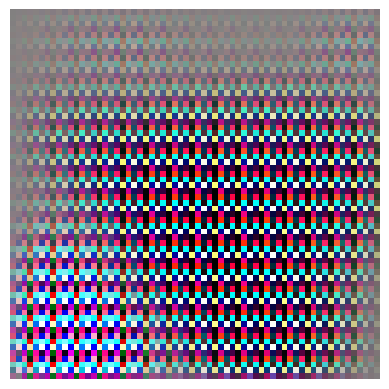

Epoch 2011, Generator Loss: 5.2954, Discriminator Loss: 0.0410
Epoch 2012, Generator Loss: 4.6113, Discriminator Loss: 0.0511
Epoch 2013, Generator Loss: 4.0444, Discriminator Loss: 0.1051
Epoch 2014, Generator Loss: 4.3824, Discriminator Loss: 0.1260
Epoch 2015, Generator Loss: 4.8899, Discriminator Loss: 0.1914
Epoch 2016, Generator Loss: 4.9583, Discriminator Loss: 0.2933
Epoch 2017, Generator Loss: 5.7231, Discriminator Loss: 0.3402
Epoch 2018, Generator Loss: 5.7833, Discriminator Loss: 0.2458
Epoch 2019, Generator Loss: 5.2324, Discriminator Loss: 0.1886
Epoch 2020, Generator Loss: 6.4011, Discriminator Loss: 0.1337


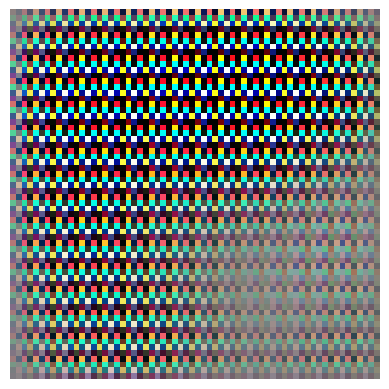

Epoch 2021, Generator Loss: 7.5229, Discriminator Loss: 0.0805
Epoch 2022, Generator Loss: 6.5984, Discriminator Loss: 0.0863
Epoch 2023, Generator Loss: 7.0988, Discriminator Loss: 0.0921
Epoch 2024, Generator Loss: 6.7263, Discriminator Loss: 0.0957
Epoch 2025, Generator Loss: 5.8757, Discriminator Loss: 0.1632
Epoch 2026, Generator Loss: 5.5007, Discriminator Loss: 0.2459
Epoch 2027, Generator Loss: 5.7447, Discriminator Loss: 0.2633
Epoch 2028, Generator Loss: 4.9795, Discriminator Loss: 0.3133
Epoch 2029, Generator Loss: 3.9949, Discriminator Loss: 0.3458
Epoch 2030, Generator Loss: 2.8830, Discriminator Loss: 0.5376


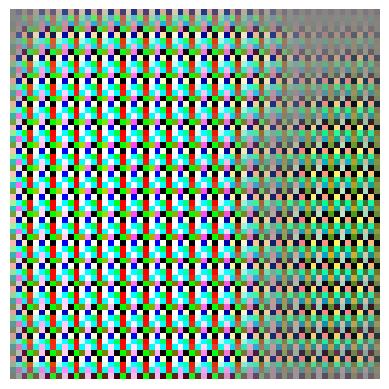

Epoch 2031, Generator Loss: 3.0355, Discriminator Loss: 0.6459
Epoch 2032, Generator Loss: 2.2444, Discriminator Loss: 0.4844
Epoch 2033, Generator Loss: 2.3265, Discriminator Loss: 0.7839
Epoch 2034, Generator Loss: 3.6684, Discriminator Loss: 0.6156
Epoch 2035, Generator Loss: 5.5613, Discriminator Loss: 0.3731
Epoch 2036, Generator Loss: 5.8479, Discriminator Loss: 0.2487
Epoch 2037, Generator Loss: 6.5231, Discriminator Loss: 0.1619
Epoch 2038, Generator Loss: 7.3519, Discriminator Loss: 0.3232
Epoch 2039, Generator Loss: 9.5481, Discriminator Loss: 0.0329
Epoch 2040, Generator Loss: 10.6889, Discriminator Loss: 0.0163


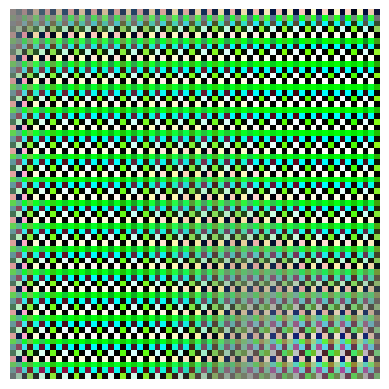

Epoch 2041, Generator Loss: 9.8634, Discriminator Loss: 0.0184
Epoch 2042, Generator Loss: 12.5274, Discriminator Loss: 0.0148
Epoch 2043, Generator Loss: 11.4867, Discriminator Loss: 0.0153
Epoch 2044, Generator Loss: 10.5275, Discriminator Loss: 0.0094
Epoch 2045, Generator Loss: 8.8300, Discriminator Loss: 0.0107
Epoch 2046, Generator Loss: 7.4368, Discriminator Loss: 0.0085
Epoch 2047, Generator Loss: 5.8805, Discriminator Loss: 0.0126
Epoch 2048, Generator Loss: 5.1419, Discriminator Loss: 0.0203
Epoch 2049, Generator Loss: 4.8504, Discriminator Loss: 0.0147
Epoch 2050, Generator Loss: 4.3846, Discriminator Loss: 0.0221


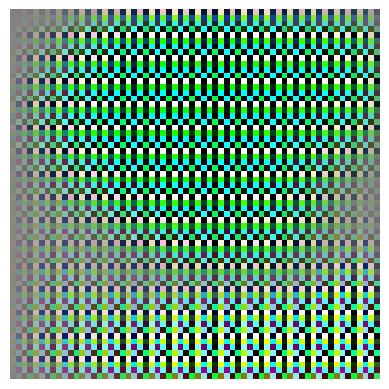

Epoch 2051, Generator Loss: 4.0855, Discriminator Loss: 0.0243
Epoch 2052, Generator Loss: 4.6480, Discriminator Loss: 0.0183
Epoch 2053, Generator Loss: 5.0406, Discriminator Loss: 0.0176
Epoch 2054, Generator Loss: 5.2410, Discriminator Loss: 0.0216
Epoch 2055, Generator Loss: 5.2426, Discriminator Loss: 0.0251
Epoch 2056, Generator Loss: 5.1662, Discriminator Loss: 0.0231
Epoch 2057, Generator Loss: 4.8297, Discriminator Loss: 0.0340
Epoch 2058, Generator Loss: 5.6016, Discriminator Loss: 0.0225
Epoch 2059, Generator Loss: 5.5544, Discriminator Loss: 0.0350
Epoch 2060, Generator Loss: 5.5965, Discriminator Loss: 0.0276


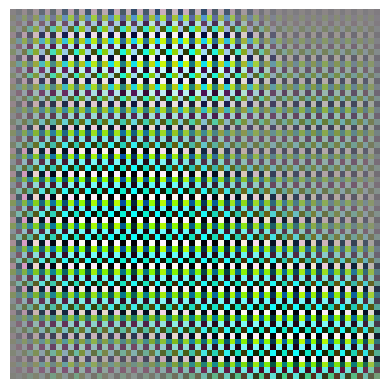

Epoch 2061, Generator Loss: 5.1821, Discriminator Loss: 0.0398
Epoch 2062, Generator Loss: 5.1654, Discriminator Loss: 0.0296
Epoch 2063, Generator Loss: 5.2049, Discriminator Loss: 0.0333
Epoch 2064, Generator Loss: 4.6406, Discriminator Loss: 0.0299
Epoch 2065, Generator Loss: 4.9228, Discriminator Loss: 0.0220
Epoch 2066, Generator Loss: 4.7922, Discriminator Loss: 0.0410
Epoch 2067, Generator Loss: 6.2466, Discriminator Loss: 0.0259
Epoch 2068, Generator Loss: 6.3328, Discriminator Loss: 0.0186
Epoch 2069, Generator Loss: 6.9898, Discriminator Loss: 0.0129
Epoch 2070, Generator Loss: 8.7868, Discriminator Loss: 0.0093


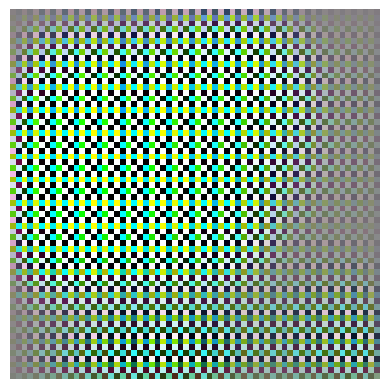

Epoch 2071, Generator Loss: 8.1641, Discriminator Loss: 0.0105
Epoch 2072, Generator Loss: 9.8767, Discriminator Loss: 0.0092
Epoch 2073, Generator Loss: 9.8472, Discriminator Loss: 0.0064
Epoch 2074, Generator Loss: 10.4718, Discriminator Loss: 0.0062
Epoch 2075, Generator Loss: 9.1702, Discriminator Loss: 0.0054
Epoch 2076, Generator Loss: 8.1625, Discriminator Loss: 0.0067
Epoch 2077, Generator Loss: 7.6527, Discriminator Loss: 0.0096
Epoch 2078, Generator Loss: 8.6184, Discriminator Loss: 0.0116
Epoch 2079, Generator Loss: 7.2662, Discriminator Loss: 0.0220
Epoch 2080, Generator Loss: 8.4255, Discriminator Loss: 0.0185


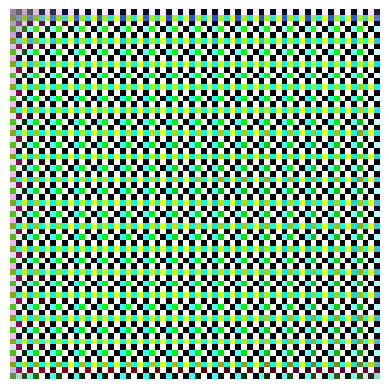

Epoch 2081, Generator Loss: 6.9199, Discriminator Loss: 0.0579
Epoch 2082, Generator Loss: 6.4565, Discriminator Loss: 0.0288
Epoch 2083, Generator Loss: 8.7118, Discriminator Loss: 0.0105
Epoch 2084, Generator Loss: 7.0397, Discriminator Loss: 0.0426
Epoch 2085, Generator Loss: 6.3546, Discriminator Loss: 0.0490
Epoch 2086, Generator Loss: 6.2082, Discriminator Loss: 0.0632
Epoch 2087, Generator Loss: 7.0649, Discriminator Loss: 0.0689
Epoch 2088, Generator Loss: 5.4909, Discriminator Loss: 0.1266
Epoch 2089, Generator Loss: 4.6511, Discriminator Loss: 0.1702
Epoch 2090, Generator Loss: 3.9336, Discriminator Loss: 0.1335


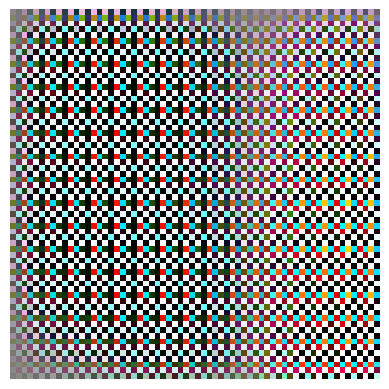

Epoch 2091, Generator Loss: 3.8320, Discriminator Loss: 0.1528
Epoch 2092, Generator Loss: 3.9026, Discriminator Loss: 0.1300
Epoch 2093, Generator Loss: 5.5422, Discriminator Loss: 0.1129
Epoch 2094, Generator Loss: 5.0241, Discriminator Loss: 0.1430
Epoch 2095, Generator Loss: 5.5906, Discriminator Loss: 0.0763
Epoch 2096, Generator Loss: 6.9206, Discriminator Loss: 0.0585
Epoch 2097, Generator Loss: 7.5798, Discriminator Loss: 0.0327
Epoch 2098, Generator Loss: 7.8448, Discriminator Loss: 0.0284
Epoch 2099, Generator Loss: 8.7866, Discriminator Loss: 0.0142
Epoch 2100, Generator Loss: 7.6175, Discriminator Loss: 0.0191


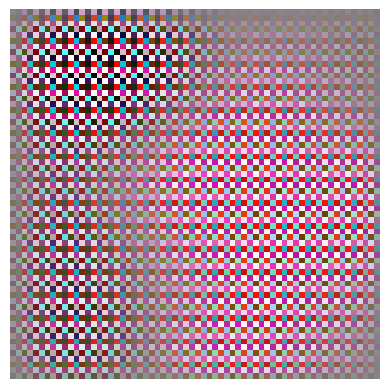

Epoch 2101, Generator Loss: 7.9308, Discriminator Loss: 0.0499
Epoch 2102, Generator Loss: 8.4074, Discriminator Loss: 0.0241
Epoch 2103, Generator Loss: 7.8919, Discriminator Loss: 0.1537
Epoch 2104, Generator Loss: 8.0703, Discriminator Loss: 0.0558
Epoch 2105, Generator Loss: 8.4614, Discriminator Loss: 0.0348
Epoch 2106, Generator Loss: 8.6504, Discriminator Loss: 0.0454
Epoch 2107, Generator Loss: 10.9144, Discriminator Loss: 0.0687
Epoch 2108, Generator Loss: 11.8181, Discriminator Loss: 0.0775
Epoch 2109, Generator Loss: 11.1631, Discriminator Loss: 0.0908
Epoch 2110, Generator Loss: 9.6311, Discriminator Loss: 0.1121


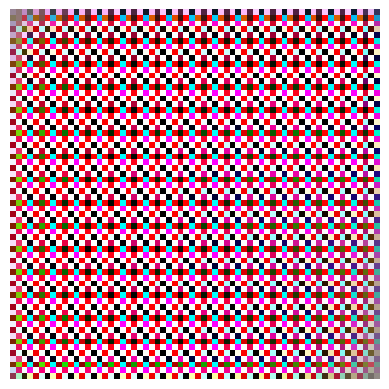

Epoch 2111, Generator Loss: 10.4080, Discriminator Loss: 0.0795
Epoch 2112, Generator Loss: 10.4211, Discriminator Loss: 0.0797
Epoch 2113, Generator Loss: 8.3903, Discriminator Loss: 0.0807
Epoch 2114, Generator Loss: 10.0773, Discriminator Loss: 0.0634
Epoch 2115, Generator Loss: 7.4819, Discriminator Loss: 0.0592
Epoch 2116, Generator Loss: 10.2664, Discriminator Loss: 0.0345
Epoch 2117, Generator Loss: 9.0613, Discriminator Loss: 0.0495
Epoch 2118, Generator Loss: 7.2797, Discriminator Loss: 0.0435
Epoch 2119, Generator Loss: 8.7560, Discriminator Loss: 0.0919
Epoch 2120, Generator Loss: 9.7358, Discriminator Loss: 0.0349


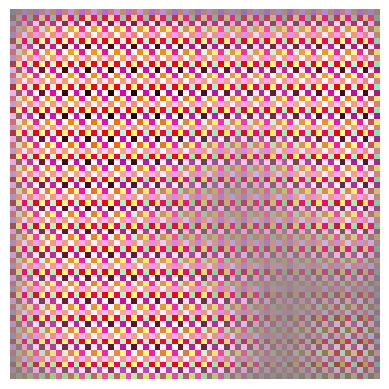

Epoch 2121, Generator Loss: 10.3374, Discriminator Loss: 0.0444
Epoch 2122, Generator Loss: 9.1486, Discriminator Loss: 0.0635
Epoch 2123, Generator Loss: 9.6122, Discriminator Loss: 0.0523
Epoch 2124, Generator Loss: 11.2168, Discriminator Loss: 0.0601
Epoch 2125, Generator Loss: 9.6441, Discriminator Loss: 0.1728
Epoch 2126, Generator Loss: 11.9565, Discriminator Loss: 0.0666
Epoch 2127, Generator Loss: 10.5242, Discriminator Loss: 0.1540
Epoch 2128, Generator Loss: 9.0037, Discriminator Loss: 0.1714
Epoch 2129, Generator Loss: 11.0150, Discriminator Loss: 0.1752
Epoch 2130, Generator Loss: 10.3832, Discriminator Loss: 0.2052


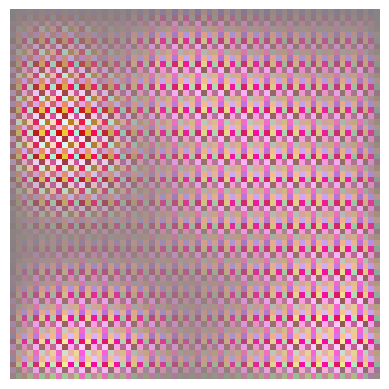

Epoch 2131, Generator Loss: 9.6579, Discriminator Loss: 0.1684
Epoch 2132, Generator Loss: 10.4007, Discriminator Loss: 0.2015
Epoch 2133, Generator Loss: 10.4950, Discriminator Loss: 0.1803
Epoch 2134, Generator Loss: 9.8779, Discriminator Loss: 0.1614
Epoch 2135, Generator Loss: 9.3793, Discriminator Loss: 0.1832
Epoch 2136, Generator Loss: 9.9929, Discriminator Loss: 0.1966
Epoch 2137, Generator Loss: 10.5378, Discriminator Loss: 0.1909
Epoch 2138, Generator Loss: 11.8370, Discriminator Loss: 0.1280
Epoch 2139, Generator Loss: 9.1032, Discriminator Loss: 0.1794
Epoch 2140, Generator Loss: 9.5761, Discriminator Loss: 0.2040


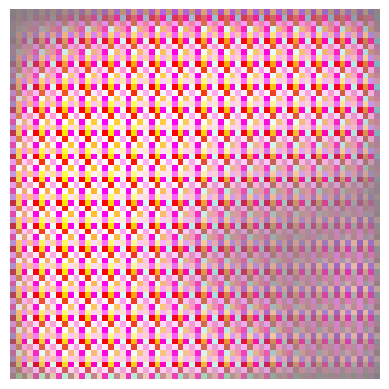

Epoch 2141, Generator Loss: 10.1397, Discriminator Loss: 0.3395
Epoch 2142, Generator Loss: 7.2723, Discriminator Loss: 0.4572
Epoch 2143, Generator Loss: 7.8239, Discriminator Loss: 0.4948
Epoch 2144, Generator Loss: 6.0008, Discriminator Loss: 0.4535
Epoch 2145, Generator Loss: 3.8399, Discriminator Loss: 0.7672
Epoch 2146, Generator Loss: 7.4770, Discriminator Loss: 0.3980
Epoch 2147, Generator Loss: 7.6286, Discriminator Loss: 0.2354
Epoch 2148, Generator Loss: 4.8455, Discriminator Loss: 0.9533
Epoch 2149, Generator Loss: 5.9476, Discriminator Loss: 0.3072
Epoch 2150, Generator Loss: 8.0941, Discriminator Loss: 0.3415


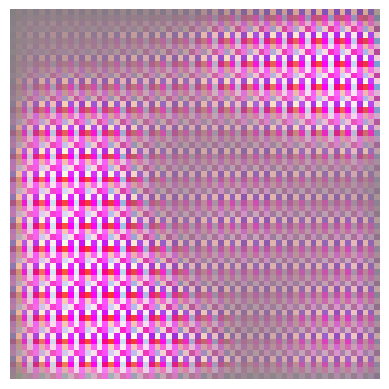

Epoch 2151, Generator Loss: 9.4108, Discriminator Loss: 0.3050
Epoch 2152, Generator Loss: 11.5538, Discriminator Loss: 0.1973
Epoch 2153, Generator Loss: 10.8491, Discriminator Loss: 0.0651
Epoch 2154, Generator Loss: 9.3012, Discriminator Loss: 0.0307
Epoch 2155, Generator Loss: 9.0590, Discriminator Loss: 0.0098
Epoch 2156, Generator Loss: 8.3251, Discriminator Loss: 0.0206
Epoch 2157, Generator Loss: 6.7309, Discriminator Loss: 0.0223
Epoch 2158, Generator Loss: 6.1801, Discriminator Loss: 0.0582
Epoch 2159, Generator Loss: 6.9298, Discriminator Loss: 0.0275
Epoch 2160, Generator Loss: 6.9960, Discriminator Loss: 0.0104


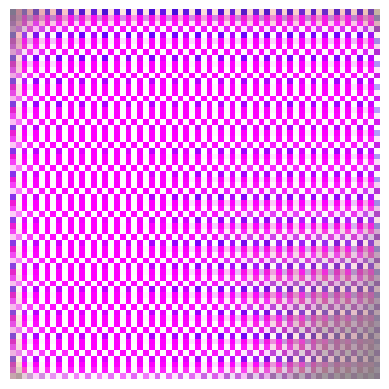

Epoch 2161, Generator Loss: 9.1265, Discriminator Loss: 0.0025
Epoch 2162, Generator Loss: 9.0129, Discriminator Loss: 0.0032
Epoch 2163, Generator Loss: 11.4049, Discriminator Loss: 0.0036
Epoch 2164, Generator Loss: 10.6097, Discriminator Loss: 0.0050
Epoch 2165, Generator Loss: 10.0228, Discriminator Loss: 0.0057
Epoch 2166, Generator Loss: 10.6139, Discriminator Loss: 0.0072
Epoch 2167, Generator Loss: 9.9190, Discriminator Loss: 0.0114
Epoch 2168, Generator Loss: 9.1386, Discriminator Loss: 0.0107
Epoch 2169, Generator Loss: 7.6124, Discriminator Loss: 0.0199
Epoch 2170, Generator Loss: 7.2955, Discriminator Loss: 0.0209


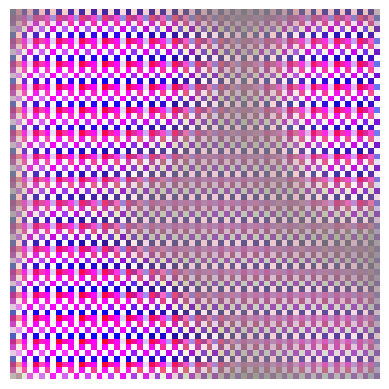

Epoch 2171, Generator Loss: 7.8491, Discriminator Loss: 0.0234
Epoch 2172, Generator Loss: 5.9450, Discriminator Loss: 0.0632
Epoch 2173, Generator Loss: 4.0895, Discriminator Loss: 0.1586
Epoch 2174, Generator Loss: 5.8061, Discriminator Loss: 0.1324
Epoch 2175, Generator Loss: 6.6657, Discriminator Loss: 0.2058
Epoch 2176, Generator Loss: 4.7869, Discriminator Loss: 0.3071
Epoch 2177, Generator Loss: 2.3154, Discriminator Loss: 0.5931
Epoch 2178, Generator Loss: 3.6580, Discriminator Loss: 0.8006
Epoch 2179, Generator Loss: 3.7515, Discriminator Loss: 0.9229
Epoch 2180, Generator Loss: 1.8211, Discriminator Loss: 0.8155


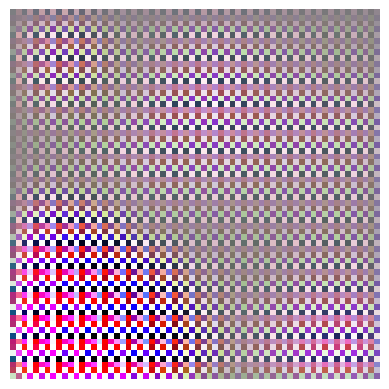

Epoch 2181, Generator Loss: 3.5557, Discriminator Loss: 0.4644
Epoch 2182, Generator Loss: 6.2329, Discriminator Loss: 0.3697
Epoch 2183, Generator Loss: 6.8407, Discriminator Loss: 0.1028
Epoch 2184, Generator Loss: 6.8052, Discriminator Loss: 0.0330
Epoch 2185, Generator Loss: 7.5891, Discriminator Loss: 0.1168
Epoch 2186, Generator Loss: 8.3517, Discriminator Loss: 0.0069
Epoch 2187, Generator Loss: 9.5723, Discriminator Loss: 0.0022
Epoch 2188, Generator Loss: 9.9145, Discriminator Loss: 0.0030
Epoch 2189, Generator Loss: 10.0297, Discriminator Loss: 0.0013
Epoch 2190, Generator Loss: 10.9014, Discriminator Loss: 0.0005


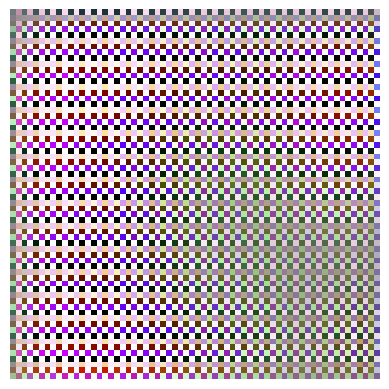

Epoch 2191, Generator Loss: 10.4820, Discriminator Loss: 0.0077
Epoch 2192, Generator Loss: 10.3639, Discriminator Loss: 0.0004
Epoch 2193, Generator Loss: 10.8031, Discriminator Loss: 0.0004
Epoch 2194, Generator Loss: 9.6604, Discriminator Loss: 0.0021
Epoch 2195, Generator Loss: 9.2760, Discriminator Loss: 0.0090
Epoch 2196, Generator Loss: 8.6677, Discriminator Loss: 0.0039
Epoch 2197, Generator Loss: 8.1751, Discriminator Loss: 0.0026
Epoch 2198, Generator Loss: 6.2751, Discriminator Loss: 0.0336
Epoch 2199, Generator Loss: 5.8394, Discriminator Loss: 0.0360
Epoch 2200, Generator Loss: 5.0857, Discriminator Loss: 0.0596


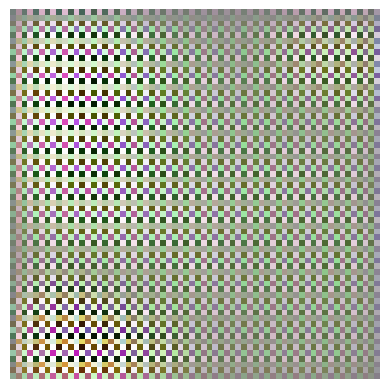

Epoch 2201, Generator Loss: 5.2753, Discriminator Loss: 0.0374
Epoch 2202, Generator Loss: 6.0664, Discriminator Loss: 0.1738
Epoch 2203, Generator Loss: 6.3378, Discriminator Loss: 0.1609
Epoch 2204, Generator Loss: 6.6552, Discriminator Loss: 0.4085
Epoch 2205, Generator Loss: 5.6427, Discriminator Loss: 0.7845
Epoch 2206, Generator Loss: 3.1297, Discriminator Loss: 0.7524
Epoch 2207, Generator Loss: 3.9473, Discriminator Loss: 0.8826
Epoch 2208, Generator Loss: 7.0306, Discriminator Loss: 1.3981
Epoch 2209, Generator Loss: 8.3423, Discriminator Loss: 0.5173
Epoch 2210, Generator Loss: 6.1549, Discriminator Loss: 0.1781


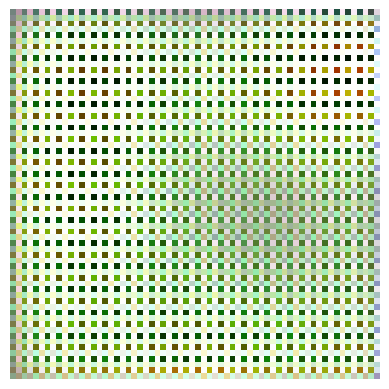

Epoch 2211, Generator Loss: 4.1105, Discriminator Loss: 0.2835
Epoch 2212, Generator Loss: 5.9000, Discriminator Loss: 0.1513
Epoch 2213, Generator Loss: 10.7458, Discriminator Loss: 0.0099
Epoch 2214, Generator Loss: 13.1291, Discriminator Loss: 0.0131
Epoch 2215, Generator Loss: 15.0606, Discriminator Loss: 0.0273
Epoch 2216, Generator Loss: 17.5218, Discriminator Loss: 0.0484
Epoch 2217, Generator Loss: 18.4905, Discriminator Loss: 0.0470
Epoch 2218, Generator Loss: 18.9272, Discriminator Loss: 0.0480
Epoch 2219, Generator Loss: 17.1321, Discriminator Loss: 0.0311
Epoch 2220, Generator Loss: 17.0016, Discriminator Loss: 0.0106


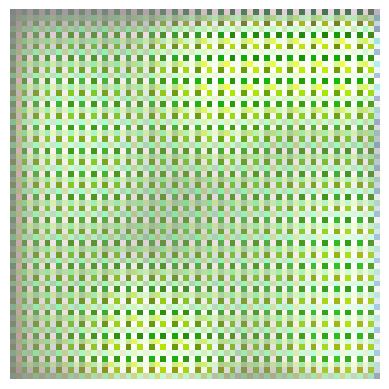

Epoch 2221, Generator Loss: 15.2533, Discriminator Loss: 0.0056
Epoch 2222, Generator Loss: 13.4665, Discriminator Loss: 0.0027
Epoch 2223, Generator Loss: 13.0311, Discriminator Loss: 0.0019
Epoch 2224, Generator Loss: 11.4498, Discriminator Loss: 0.0010
Epoch 2225, Generator Loss: 10.4566, Discriminator Loss: 0.0028
Epoch 2226, Generator Loss: 9.1681, Discriminator Loss: 0.0035
Epoch 2227, Generator Loss: 9.3810, Discriminator Loss: 0.0029
Epoch 2228, Generator Loss: 9.6487, Discriminator Loss: 0.0029
Epoch 2229, Generator Loss: 7.7134, Discriminator Loss: 0.0104
Epoch 2230, Generator Loss: 7.9616, Discriminator Loss: 0.0106


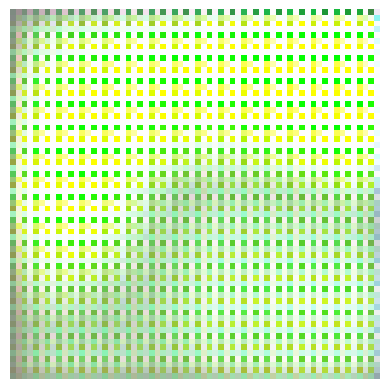

Epoch 2231, Generator Loss: 8.0202, Discriminator Loss: 0.0070
Epoch 2232, Generator Loss: 8.2972, Discriminator Loss: 0.0057
Epoch 2233, Generator Loss: 8.2535, Discriminator Loss: 0.0053
Epoch 2234, Generator Loss: 9.3033, Discriminator Loss: 0.0043
Epoch 2235, Generator Loss: 8.3797, Discriminator Loss: 0.0039
Epoch 2236, Generator Loss: 8.4380, Discriminator Loss: 0.0040
Epoch 2237, Generator Loss: 8.9019, Discriminator Loss: 0.0021
Epoch 2238, Generator Loss: 9.1412, Discriminator Loss: 0.0027
Epoch 2239, Generator Loss: 9.3304, Discriminator Loss: 0.0038
Epoch 2240, Generator Loss: 7.8946, Discriminator Loss: 0.0057


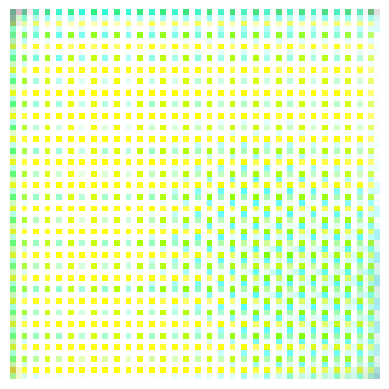

Epoch 2241, Generator Loss: 7.1738, Discriminator Loss: 0.0069
Epoch 2242, Generator Loss: 8.8170, Discriminator Loss: 0.0066
Epoch 2243, Generator Loss: 9.8736, Discriminator Loss: 0.0073
Epoch 2244, Generator Loss: 9.4132, Discriminator Loss: 0.0108
Epoch 2245, Generator Loss: 9.1104, Discriminator Loss: 0.0103
Epoch 2246, Generator Loss: 9.6357, Discriminator Loss: 0.0163
Epoch 2247, Generator Loss: 8.5003, Discriminator Loss: 0.0196
Epoch 2248, Generator Loss: 8.7267, Discriminator Loss: 0.0288
Epoch 2249, Generator Loss: 8.8533, Discriminator Loss: 0.0350
Epoch 2250, Generator Loss: 9.0555, Discriminator Loss: 0.0500


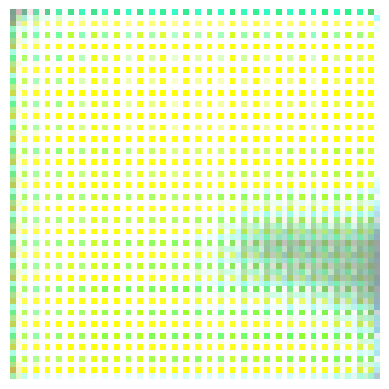

Epoch 2251, Generator Loss: 10.6940, Discriminator Loss: 0.0571
Epoch 2252, Generator Loss: 8.8961, Discriminator Loss: 0.0760
Epoch 2253, Generator Loss: 8.5666, Discriminator Loss: 0.1282
Epoch 2254, Generator Loss: 7.5194, Discriminator Loss: 0.1199
Epoch 2255, Generator Loss: 9.5137, Discriminator Loss: 0.1222
Epoch 2256, Generator Loss: 7.6266, Discriminator Loss: 0.2011
Epoch 2257, Generator Loss: 7.3680, Discriminator Loss: 0.2204
Epoch 2258, Generator Loss: 8.7698, Discriminator Loss: 0.1908
Epoch 2259, Generator Loss: 9.5800, Discriminator Loss: 0.3269
Epoch 2260, Generator Loss: 7.8799, Discriminator Loss: 0.2061


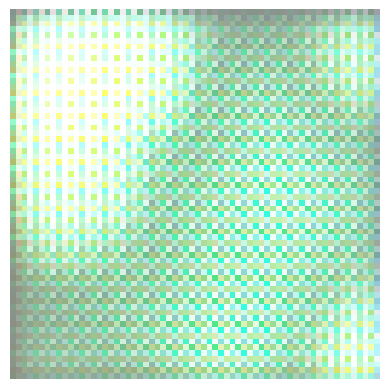

Epoch 2261, Generator Loss: 7.6248, Discriminator Loss: 0.1709
Epoch 2262, Generator Loss: 8.2272, Discriminator Loss: 0.2395
Epoch 2263, Generator Loss: 10.8964, Discriminator Loss: 0.1716
Epoch 2264, Generator Loss: 9.2539, Discriminator Loss: 0.2973
Epoch 2265, Generator Loss: 10.8518, Discriminator Loss: 0.3140
Epoch 2266, Generator Loss: 9.7831, Discriminator Loss: 0.3204
Epoch 2267, Generator Loss: 7.7772, Discriminator Loss: 0.7123
Epoch 2268, Generator Loss: 13.1637, Discriminator Loss: 0.6753
Epoch 2269, Generator Loss: 9.6552, Discriminator Loss: 0.5074
Epoch 2270, Generator Loss: 10.2875, Discriminator Loss: 0.2206


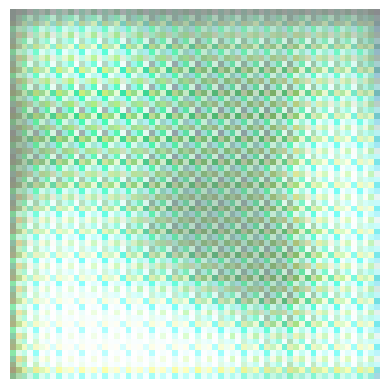

Epoch 2271, Generator Loss: 10.6651, Discriminator Loss: 0.0926
Epoch 2272, Generator Loss: 11.4025, Discriminator Loss: 0.0477
Epoch 2273, Generator Loss: 9.2465, Discriminator Loss: 0.0548
Epoch 2274, Generator Loss: 10.9330, Discriminator Loss: 0.0180
Epoch 2275, Generator Loss: 9.7477, Discriminator Loss: 0.0330
Epoch 2276, Generator Loss: 11.0113, Discriminator Loss: 0.0139
Epoch 2277, Generator Loss: 8.9526, Discriminator Loss: 0.0137
Epoch 2278, Generator Loss: 8.4613, Discriminator Loss: 0.0265
Epoch 2279, Generator Loss: 8.2503, Discriminator Loss: 0.0349
Epoch 2280, Generator Loss: 6.7675, Discriminator Loss: 0.1825


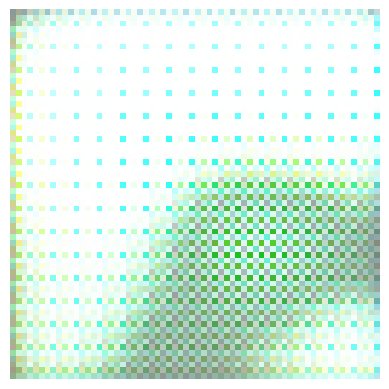

Epoch 2281, Generator Loss: 8.8841, Discriminator Loss: 0.1710
Epoch 2282, Generator Loss: 10.2303, Discriminator Loss: 0.1095
Epoch 2283, Generator Loss: 10.5091, Discriminator Loss: 0.1147
Epoch 2284, Generator Loss: 9.7714, Discriminator Loss: 0.0975
Epoch 2285, Generator Loss: 8.3669, Discriminator Loss: 0.0706
Epoch 2286, Generator Loss: 8.7378, Discriminator Loss: 0.0259
Epoch 2287, Generator Loss: 7.4381, Discriminator Loss: 0.0113
Epoch 2288, Generator Loss: 6.7989, Discriminator Loss: 0.0069
Epoch 2289, Generator Loss: 6.3745, Discriminator Loss: 0.0084
Epoch 2290, Generator Loss: 4.8574, Discriminator Loss: 0.0570


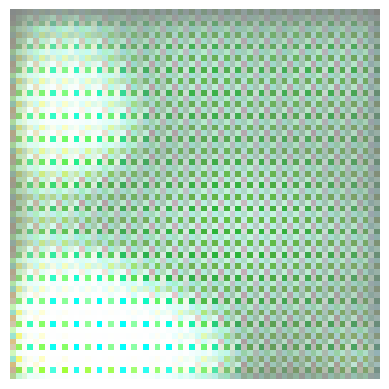

Epoch 2291, Generator Loss: 5.7799, Discriminator Loss: 0.0393
Epoch 2292, Generator Loss: 9.1926, Discriminator Loss: 0.0125
Epoch 2293, Generator Loss: 9.6872, Discriminator Loss: 0.0121
Epoch 2294, Generator Loss: 12.7006, Discriminator Loss: 0.0144
Epoch 2295, Generator Loss: 14.2449, Discriminator Loss: 0.0159
Epoch 2296, Generator Loss: 15.2089, Discriminator Loss: 0.0386
Epoch 2297, Generator Loss: 14.4967, Discriminator Loss: 0.0206
Epoch 2298, Generator Loss: 16.2743, Discriminator Loss: 0.0193
Epoch 2299, Generator Loss: 16.2888, Discriminator Loss: 0.0190
Epoch 2300, Generator Loss: 13.7551, Discriminator Loss: 0.0091


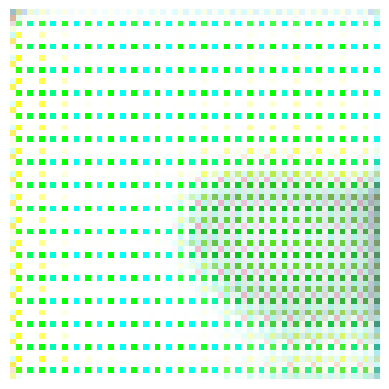

Epoch 2301, Generator Loss: 14.0890, Discriminator Loss: 0.0047
Epoch 2302, Generator Loss: 14.1558, Discriminator Loss: 0.0034
Epoch 2303, Generator Loss: 14.1203, Discriminator Loss: 0.0019
Epoch 2304, Generator Loss: 13.5294, Discriminator Loss: 0.0013
Epoch 2305, Generator Loss: 10.1273, Discriminator Loss: 0.0015
Epoch 2306, Generator Loss: 9.8340, Discriminator Loss: 0.0014
Epoch 2307, Generator Loss: 8.9499, Discriminator Loss: 0.0018
Epoch 2308, Generator Loss: 9.0571, Discriminator Loss: 0.0021
Epoch 2309, Generator Loss: 8.2977, Discriminator Loss: 0.0030
Epoch 2310, Generator Loss: 5.9261, Discriminator Loss: 0.0074


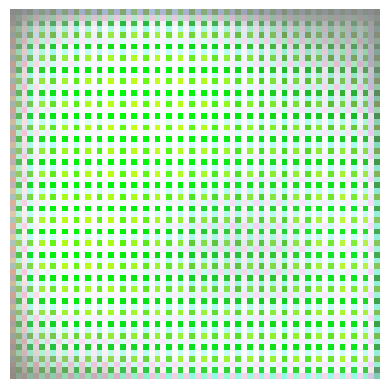

Epoch 2311, Generator Loss: 7.3607, Discriminator Loss: 0.0118
Epoch 2312, Generator Loss: 7.1059, Discriminator Loss: 0.0082
Epoch 2313, Generator Loss: 6.3986, Discriminator Loss: 0.0084
Epoch 2314, Generator Loss: 6.0329, Discriminator Loss: 0.0163
Epoch 2315, Generator Loss: 5.4090, Discriminator Loss: 0.0232
Epoch 2316, Generator Loss: 6.8058, Discriminator Loss: 0.0067
Epoch 2317, Generator Loss: 5.7856, Discriminator Loss: 0.0169
Epoch 2318, Generator Loss: 6.8614, Discriminator Loss: 0.0056
Epoch 2319, Generator Loss: 6.4685, Discriminator Loss: 0.0111
Epoch 2320, Generator Loss: 6.9064, Discriminator Loss: 0.0189


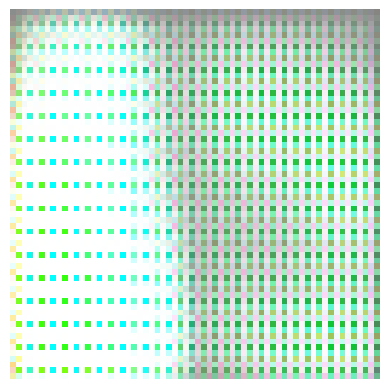

Epoch 2321, Generator Loss: 7.5049, Discriminator Loss: 0.0464
Epoch 2322, Generator Loss: 7.9307, Discriminator Loss: 0.0348
Epoch 2323, Generator Loss: 8.4487, Discriminator Loss: 0.0549
Epoch 2324, Generator Loss: 7.6613, Discriminator Loss: 0.0949
Epoch 2325, Generator Loss: 5.7086, Discriminator Loss: 0.2608
Epoch 2326, Generator Loss: 9.5685, Discriminator Loss: 0.1659
Epoch 2327, Generator Loss: 11.4479, Discriminator Loss: 0.2429
Epoch 2328, Generator Loss: 10.0811, Discriminator Loss: 0.1068
Epoch 2329, Generator Loss: 8.2566, Discriminator Loss: 0.0357
Epoch 2330, Generator Loss: 5.2773, Discriminator Loss: 0.0849


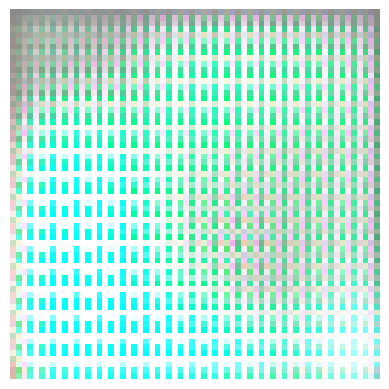

Epoch 2331, Generator Loss: 5.8502, Discriminator Loss: 0.0412
Epoch 2332, Generator Loss: 7.4023, Discriminator Loss: 0.0096
Epoch 2333, Generator Loss: 7.3952, Discriminator Loss: 0.0060
Epoch 2334, Generator Loss: 8.3314, Discriminator Loss: 0.0072
Epoch 2335, Generator Loss: 8.5550, Discriminator Loss: 0.0076
Epoch 2336, Generator Loss: 8.7294, Discriminator Loss: 0.0100
Epoch 2337, Generator Loss: 8.3916, Discriminator Loss: 0.0083
Epoch 2338, Generator Loss: 8.7799, Discriminator Loss: 0.0086
Epoch 2339, Generator Loss: 7.6750, Discriminator Loss: 0.0076
Epoch 2340, Generator Loss: 7.0747, Discriminator Loss: 0.0109


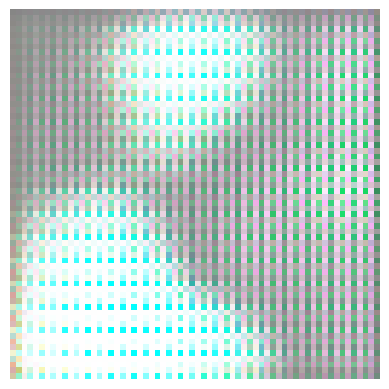

Epoch 2341, Generator Loss: 6.3122, Discriminator Loss: 0.0158
Epoch 2342, Generator Loss: 5.2760, Discriminator Loss: 0.0177
Epoch 2343, Generator Loss: 4.5442, Discriminator Loss: 0.0348
Epoch 2344, Generator Loss: 4.2718, Discriminator Loss: 0.0479
Epoch 2345, Generator Loss: 4.1202, Discriminator Loss: 0.0686
Epoch 2346, Generator Loss: 4.9424, Discriminator Loss: 0.0621
Epoch 2347, Generator Loss: 6.4065, Discriminator Loss: 0.0875
Epoch 2348, Generator Loss: 5.8755, Discriminator Loss: 0.2400
Epoch 2349, Generator Loss: 5.3340, Discriminator Loss: 0.2211
Epoch 2350, Generator Loss: 5.2472, Discriminator Loss: 0.2986


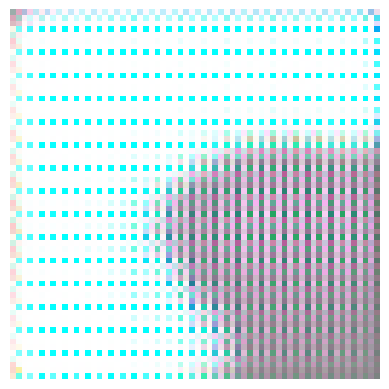

Epoch 2351, Generator Loss: 6.4500, Discriminator Loss: 0.2844
Epoch 2352, Generator Loss: 5.1431, Discriminator Loss: 0.5061
Epoch 2353, Generator Loss: 7.9194, Discriminator Loss: 0.5334
Epoch 2354, Generator Loss: 6.4270, Discriminator Loss: 0.3469
Epoch 2355, Generator Loss: 5.8338, Discriminator Loss: 0.5426
Epoch 2356, Generator Loss: 8.6636, Discriminator Loss: 0.6507
Epoch 2357, Generator Loss: 14.1254, Discriminator Loss: 0.6568
Epoch 2358, Generator Loss: 11.4225, Discriminator Loss: 0.4224
Epoch 2359, Generator Loss: 10.5927, Discriminator Loss: 0.0695
Epoch 2360, Generator Loss: 8.7805, Discriminator Loss: 0.6834


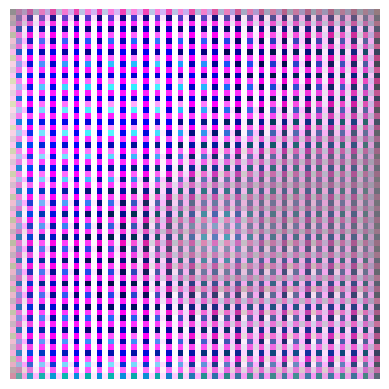

Epoch 2361, Generator Loss: 9.5009, Discriminator Loss: 0.0857
Epoch 2362, Generator Loss: 11.6697, Discriminator Loss: 0.0463
Epoch 2363, Generator Loss: 15.5128, Discriminator Loss: 0.0090
Epoch 2364, Generator Loss: 17.4178, Discriminator Loss: 0.0128
Epoch 2365, Generator Loss: 19.2776, Discriminator Loss: 0.0246
Epoch 2366, Generator Loss: 20.0087, Discriminator Loss: 0.0259
Epoch 2367, Generator Loss: 20.5152, Discriminator Loss: 0.0478
Epoch 2368, Generator Loss: 20.5894, Discriminator Loss: 0.0275
Epoch 2369, Generator Loss: 18.2920, Discriminator Loss: 0.0234
Epoch 2370, Generator Loss: 17.9498, Discriminator Loss: 0.0215


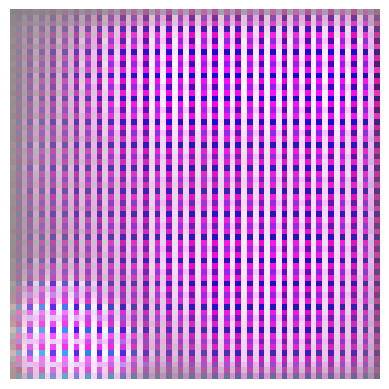

Epoch 2371, Generator Loss: 17.1552, Discriminator Loss: 0.0087
Epoch 2372, Generator Loss: 14.2237, Discriminator Loss: 0.0062
Epoch 2373, Generator Loss: 14.5390, Discriminator Loss: 0.0036
Epoch 2374, Generator Loss: 12.8537, Discriminator Loss: 0.0021
Epoch 2375, Generator Loss: 11.7841, Discriminator Loss: 0.0015
Epoch 2376, Generator Loss: 10.9032, Discriminator Loss: 0.0010
Epoch 2377, Generator Loss: 9.7976, Discriminator Loss: 0.0008
Epoch 2378, Generator Loss: 9.6541, Discriminator Loss: 0.0014
Epoch 2379, Generator Loss: 7.4524, Discriminator Loss: 0.0032
Epoch 2380, Generator Loss: 7.0299, Discriminator Loss: 0.0060


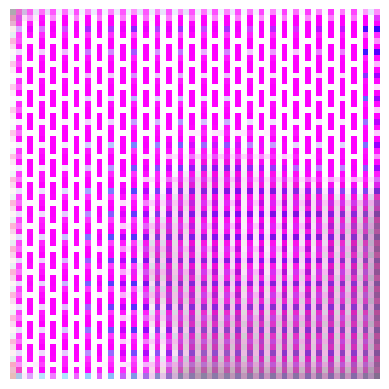

Epoch 2381, Generator Loss: 6.3734, Discriminator Loss: 0.0133
Epoch 2382, Generator Loss: 6.7568, Discriminator Loss: 0.0074
Epoch 2383, Generator Loss: 6.0672, Discriminator Loss: 0.0081
Epoch 2384, Generator Loss: 6.2750, Discriminator Loss: 0.0062
Epoch 2385, Generator Loss: 6.8892, Discriminator Loss: 0.0049
Epoch 2386, Generator Loss: 7.5421, Discriminator Loss: 0.0040
Epoch 2387, Generator Loss: 7.4774, Discriminator Loss: 0.0022
Epoch 2388, Generator Loss: 8.2258, Discriminator Loss: 0.0018
Epoch 2389, Generator Loss: 8.9094, Discriminator Loss: 0.0015
Epoch 2390, Generator Loss: 9.1495, Discriminator Loss: 0.0014


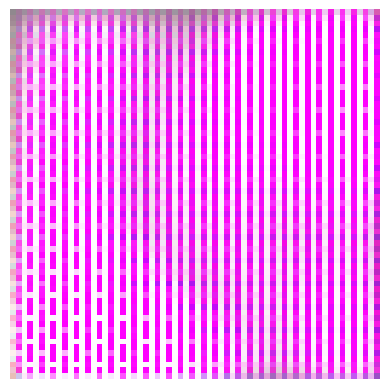

Epoch 2391, Generator Loss: 9.6033, Discriminator Loss: 0.0012
Epoch 2392, Generator Loss: 9.7086, Discriminator Loss: 0.0016
Epoch 2393, Generator Loss: 10.0342, Discriminator Loss: 0.0021
Epoch 2394, Generator Loss: 9.9351, Discriminator Loss: 0.0015
Epoch 2395, Generator Loss: 10.3414, Discriminator Loss: 0.0017
Epoch 2396, Generator Loss: 9.7047, Discriminator Loss: 0.0031
Epoch 2397, Generator Loss: 9.5414, Discriminator Loss: 0.0038
Epoch 2398, Generator Loss: 10.1682, Discriminator Loss: 0.0021
Epoch 2399, Generator Loss: 9.5793, Discriminator Loss: 0.0040
Epoch 2400, Generator Loss: 9.5430, Discriminator Loss: 0.0022


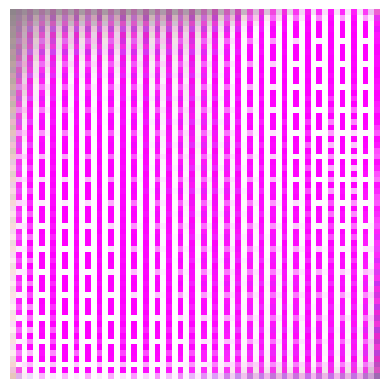

Epoch 2401, Generator Loss: 8.7799, Discriminator Loss: 0.0035
Epoch 2402, Generator Loss: 8.3549, Discriminator Loss: 0.0042
Epoch 2403, Generator Loss: 8.0803, Discriminator Loss: 0.0051
Epoch 2404, Generator Loss: 8.0306, Discriminator Loss: 0.0032
Epoch 2405, Generator Loss: 7.3095, Discriminator Loss: 0.0084
Epoch 2406, Generator Loss: 8.5503, Discriminator Loss: 0.0029
Epoch 2407, Generator Loss: 7.4839, Discriminator Loss: 0.0109
Epoch 2408, Generator Loss: 8.4354, Discriminator Loss: 0.0030
Epoch 2409, Generator Loss: 7.3361, Discriminator Loss: 0.0103
Epoch 2410, Generator Loss: 7.8682, Discriminator Loss: 0.0051


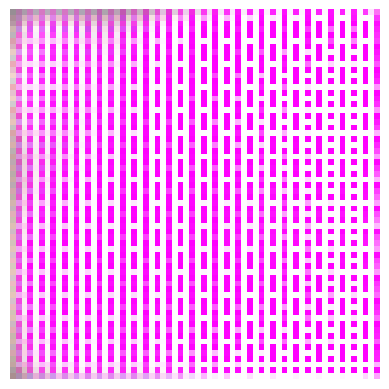

Epoch 2411, Generator Loss: 8.5211, Discriminator Loss: 0.0024
Epoch 2412, Generator Loss: 9.1276, Discriminator Loss: 0.0044
Epoch 2413, Generator Loss: 9.3453, Discriminator Loss: 0.0046
Epoch 2414, Generator Loss: 8.6920, Discriminator Loss: 0.0052
Epoch 2415, Generator Loss: 8.8897, Discriminator Loss: 0.0049
Epoch 2416, Generator Loss: 8.9499, Discriminator Loss: 0.0049
Epoch 2417, Generator Loss: 8.8444, Discriminator Loss: 0.0032
Epoch 2418, Generator Loss: 8.5474, Discriminator Loss: 0.0066
Epoch 2419, Generator Loss: 9.4446, Discriminator Loss: 0.0037
Epoch 2420, Generator Loss: 8.3592, Discriminator Loss: 0.0041


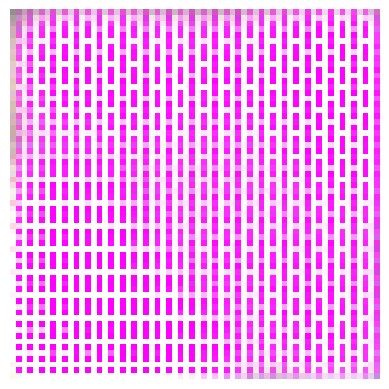

Epoch 2421, Generator Loss: 8.2485, Discriminator Loss: 0.0038
Epoch 2422, Generator Loss: 7.8743, Discriminator Loss: 0.0048
Epoch 2423, Generator Loss: 7.9958, Discriminator Loss: 0.0028
Epoch 2424, Generator Loss: 7.7997, Discriminator Loss: 0.0051
Epoch 2425, Generator Loss: 7.5660, Discriminator Loss: 0.0061
Epoch 2426, Generator Loss: 8.0872, Discriminator Loss: 0.0030
Epoch 2427, Generator Loss: 7.4613, Discriminator Loss: 0.0041
Epoch 2428, Generator Loss: 7.7646, Discriminator Loss: 0.0038
Epoch 2429, Generator Loss: 7.5379, Discriminator Loss: 0.0031
Epoch 2430, Generator Loss: 7.6264, Discriminator Loss: 0.0042


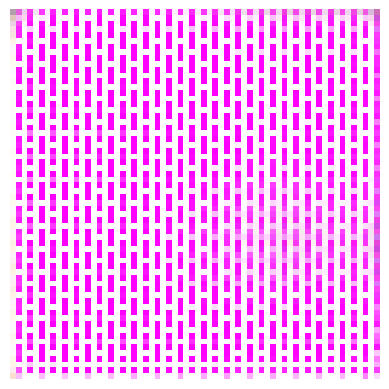

Epoch 2431, Generator Loss: 7.6718, Discriminator Loss: 0.0031
Epoch 2432, Generator Loss: 7.6024, Discriminator Loss: 0.0042
Epoch 2433, Generator Loss: 7.7650, Discriminator Loss: 0.0034
Epoch 2434, Generator Loss: 8.5513, Discriminator Loss: 0.0024
Epoch 2435, Generator Loss: 8.3334, Discriminator Loss: 0.0032
Epoch 2436, Generator Loss: 8.0996, Discriminator Loss: 0.0026
Epoch 2437, Generator Loss: 8.5984, Discriminator Loss: 0.0023
Epoch 2438, Generator Loss: 8.1757, Discriminator Loss: 0.0021
Epoch 2439, Generator Loss: 7.9903, Discriminator Loss: 0.0037
Epoch 2440, Generator Loss: 8.6020, Discriminator Loss: 0.0022


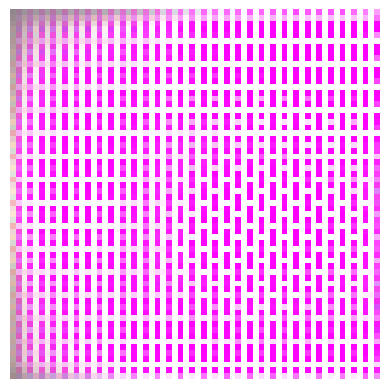

Epoch 2441, Generator Loss: 8.2805, Discriminator Loss: 0.0018
Epoch 2442, Generator Loss: 8.2844, Discriminator Loss: 0.0016
Epoch 2443, Generator Loss: 7.9487, Discriminator Loss: 0.0026
Epoch 2444, Generator Loss: 8.0112, Discriminator Loss: 0.0019
Epoch 2445, Generator Loss: 8.0046, Discriminator Loss: 0.0023
Epoch 2446, Generator Loss: 7.7659, Discriminator Loss: 0.0026
Epoch 2447, Generator Loss: 8.1891, Discriminator Loss: 0.0025
Epoch 2448, Generator Loss: 8.5880, Discriminator Loss: 0.0023
Epoch 2449, Generator Loss: 8.0732, Discriminator Loss: 0.0028
Epoch 2450, Generator Loss: 8.0836, Discriminator Loss: 0.0029


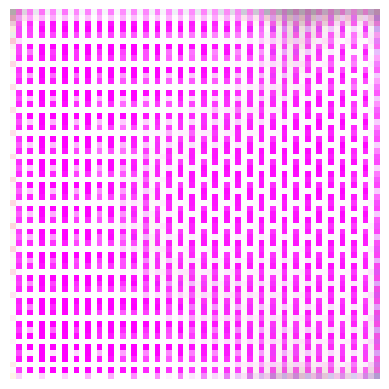

Epoch 2451, Generator Loss: 7.6523, Discriminator Loss: 0.0038
Epoch 2452, Generator Loss: 7.5227, Discriminator Loss: 0.0030
Epoch 2453, Generator Loss: 7.2378, Discriminator Loss: 0.0040
Epoch 2454, Generator Loss: 7.4859, Discriminator Loss: 0.0028
Epoch 2455, Generator Loss: 7.3867, Discriminator Loss: 0.0039
Epoch 2456, Generator Loss: 6.9399, Discriminator Loss: 0.0049
Epoch 2457, Generator Loss: 7.5859, Discriminator Loss: 0.0030
Epoch 2458, Generator Loss: 7.3377, Discriminator Loss: 0.0034
Epoch 2459, Generator Loss: 7.1221, Discriminator Loss: 0.0033
Epoch 2460, Generator Loss: 7.0997, Discriminator Loss: 0.0052


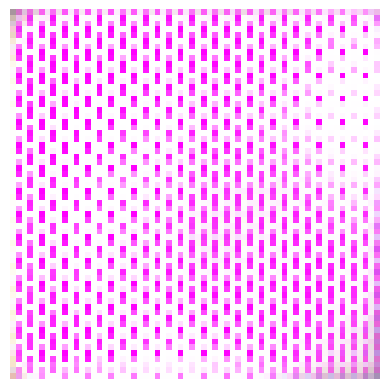

Epoch 2461, Generator Loss: 7.4754, Discriminator Loss: 0.0040
Epoch 2462, Generator Loss: 7.0926, Discriminator Loss: 0.0030
Epoch 2463, Generator Loss: 7.8977, Discriminator Loss: 0.0031
Epoch 2464, Generator Loss: 7.5721, Discriminator Loss: 0.0032
Epoch 2465, Generator Loss: 7.4377, Discriminator Loss: 0.0033
Epoch 2466, Generator Loss: 7.7571, Discriminator Loss: 0.0034
Epoch 2467, Generator Loss: 7.6084, Discriminator Loss: 0.0038
Epoch 2468, Generator Loss: 7.5673, Discriminator Loss: 0.0026
Epoch 2469, Generator Loss: 7.6394, Discriminator Loss: 0.0028
Epoch 2470, Generator Loss: 7.5143, Discriminator Loss: 0.0035


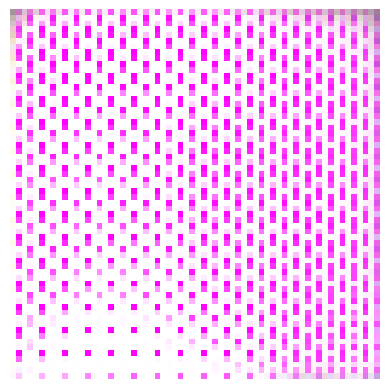

Epoch 2471, Generator Loss: 7.5201, Discriminator Loss: 0.0034
Epoch 2472, Generator Loss: 7.2455, Discriminator Loss: 0.0028
Epoch 2473, Generator Loss: 7.1278, Discriminator Loss: 0.0036
Epoch 2474, Generator Loss: 7.2284, Discriminator Loss: 0.0056
Epoch 2475, Generator Loss: 7.0662, Discriminator Loss: 0.0030
Epoch 2476, Generator Loss: 6.5226, Discriminator Loss: 0.0050
Epoch 2477, Generator Loss: 7.0576, Discriminator Loss: 0.0045
Epoch 2478, Generator Loss: 6.6263, Discriminator Loss: 0.0035
Epoch 2479, Generator Loss: 6.5428, Discriminator Loss: 0.0061
Epoch 2480, Generator Loss: 6.9879, Discriminator Loss: 0.0035


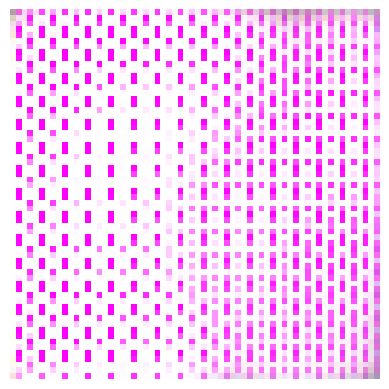

Epoch 2481, Generator Loss: 7.3202, Discriminator Loss: 0.0037
Epoch 2482, Generator Loss: 7.4057, Discriminator Loss: 0.0032
Epoch 2483, Generator Loss: 7.3855, Discriminator Loss: 0.0041
Epoch 2484, Generator Loss: 7.8597, Discriminator Loss: 0.0038
Epoch 2485, Generator Loss: 7.3843, Discriminator Loss: 0.0048
Epoch 2486, Generator Loss: 7.3530, Discriminator Loss: 0.0049
Epoch 2487, Generator Loss: 7.2022, Discriminator Loss: 0.0055
Epoch 2488, Generator Loss: 7.5645, Discriminator Loss: 0.0039
Epoch 2489, Generator Loss: 7.1785, Discriminator Loss: 0.0051
Epoch 2490, Generator Loss: 7.2516, Discriminator Loss: 0.0050


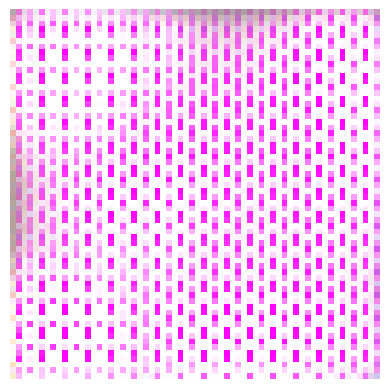

Epoch 2491, Generator Loss: 7.7144, Discriminator Loss: 0.0037
Epoch 2492, Generator Loss: 7.4988, Discriminator Loss: 0.0033
Epoch 2493, Generator Loss: 7.4928, Discriminator Loss: 0.0055
Epoch 2494, Generator Loss: 7.4221, Discriminator Loss: 0.0037
Epoch 2495, Generator Loss: 7.3418, Discriminator Loss: 0.0045
Epoch 2496, Generator Loss: 7.2296, Discriminator Loss: 0.0066
Epoch 2497, Generator Loss: 7.2147, Discriminator Loss: 0.0051
Epoch 2498, Generator Loss: 7.0977, Discriminator Loss: 0.0056
Epoch 2499, Generator Loss: 7.3062, Discriminator Loss: 0.0046
Epoch 2500, Generator Loss: 7.0441, Discriminator Loss: 0.0053


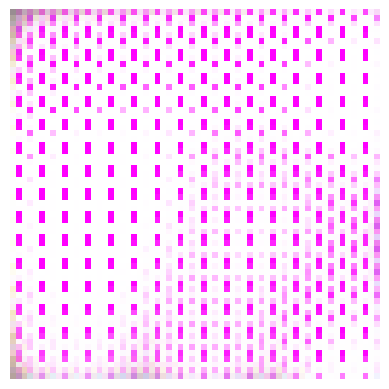

Epoch 2501, Generator Loss: 7.2834, Discriminator Loss: 0.0037
Epoch 2502, Generator Loss: 6.8606, Discriminator Loss: 0.0038
Epoch 2503, Generator Loss: 7.2113, Discriminator Loss: 0.0045
Epoch 2504, Generator Loss: 7.3816, Discriminator Loss: 0.0036
Epoch 2505, Generator Loss: 7.6247, Discriminator Loss: 0.0033
Epoch 2506, Generator Loss: 7.7084, Discriminator Loss: 0.0055
Epoch 2507, Generator Loss: 7.4230, Discriminator Loss: 0.0031
Epoch 2508, Generator Loss: 7.2389, Discriminator Loss: 0.0040
Epoch 2509, Generator Loss: 7.6200, Discriminator Loss: 0.0028
Epoch 2510, Generator Loss: 7.2512, Discriminator Loss: 0.0042


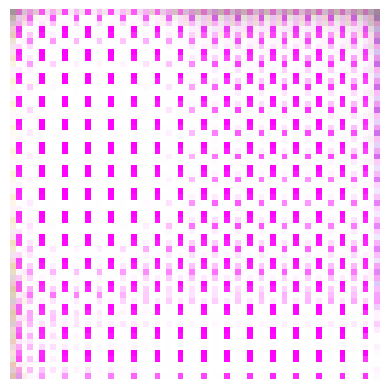

Epoch 2511, Generator Loss: 7.1610, Discriminator Loss: 0.0032
Epoch 2512, Generator Loss: 7.6228, Discriminator Loss: 0.0025
Epoch 2513, Generator Loss: 7.4029, Discriminator Loss: 0.0033
Epoch 2514, Generator Loss: 7.3809, Discriminator Loss: 0.0031
Epoch 2515, Generator Loss: 7.3509, Discriminator Loss: 0.0032
Epoch 2516, Generator Loss: 7.5532, Discriminator Loss: 0.0028
Epoch 2517, Generator Loss: 7.6910, Discriminator Loss: 0.0029
Epoch 2518, Generator Loss: 7.3632, Discriminator Loss: 0.0028
Epoch 2519, Generator Loss: 7.1713, Discriminator Loss: 0.0035
Epoch 2520, Generator Loss: 7.6401, Discriminator Loss: 0.0028


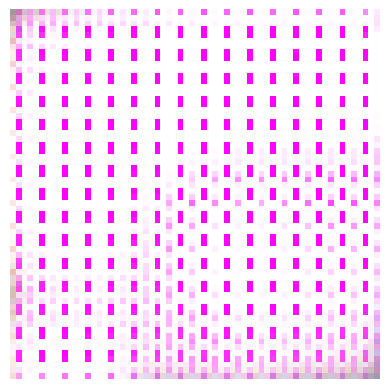

Epoch 2521, Generator Loss: 7.5647, Discriminator Loss: 0.0044
Epoch 2522, Generator Loss: 7.3349, Discriminator Loss: 0.0028
Epoch 2523, Generator Loss: 7.3932, Discriminator Loss: 0.0036
Epoch 2524, Generator Loss: 7.5583, Discriminator Loss: 0.0019
Epoch 2525, Generator Loss: 7.4247, Discriminator Loss: 0.0025
Epoch 2526, Generator Loss: 7.4789, Discriminator Loss: 0.0024
Epoch 2527, Generator Loss: 7.6299, Discriminator Loss: 0.0031
Epoch 2528, Generator Loss: 7.5146, Discriminator Loss: 0.0027
Epoch 2529, Generator Loss: 7.3630, Discriminator Loss: 0.0017
Epoch 2530, Generator Loss: 7.3349, Discriminator Loss: 0.0021


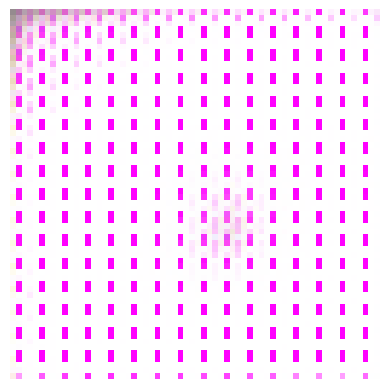

Epoch 2531, Generator Loss: 7.4454, Discriminator Loss: 0.0026
Epoch 2532, Generator Loss: 7.3452, Discriminator Loss: 0.0020
Epoch 2533, Generator Loss: 7.6127, Discriminator Loss: 0.0020
Epoch 2534, Generator Loss: 7.4484, Discriminator Loss: 0.0016
Epoch 2535, Generator Loss: 7.5975, Discriminator Loss: 0.0019
Epoch 2536, Generator Loss: 7.5358, Discriminator Loss: 0.0017
Epoch 2537, Generator Loss: 7.4235, Discriminator Loss: 0.0020
Epoch 2538, Generator Loss: 7.2830, Discriminator Loss: 0.0018
Epoch 2539, Generator Loss: 7.5397, Discriminator Loss: 0.0019
Epoch 2540, Generator Loss: 7.7738, Discriminator Loss: 0.0018


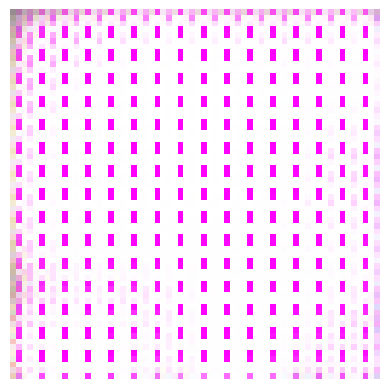

Epoch 2541, Generator Loss: 7.5599, Discriminator Loss: 0.0022
Epoch 2542, Generator Loss: 7.6582, Discriminator Loss: 0.0014
Epoch 2543, Generator Loss: 7.8083, Discriminator Loss: 0.0017
Epoch 2544, Generator Loss: 7.9374, Discriminator Loss: 0.0018
Epoch 2545, Generator Loss: 7.6391, Discriminator Loss: 0.0031
Epoch 2546, Generator Loss: 7.7000, Discriminator Loss: 0.0014
Epoch 2547, Generator Loss: 7.8240, Discriminator Loss: 0.0021
Epoch 2548, Generator Loss: 7.8362, Discriminator Loss: 0.0016
Epoch 2549, Generator Loss: 7.6150, Discriminator Loss: 0.0015
Epoch 2550, Generator Loss: 7.5855, Discriminator Loss: 0.0018


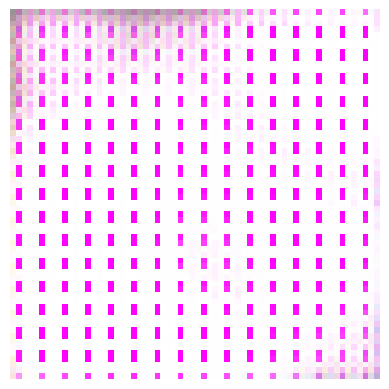

Epoch 2551, Generator Loss: 7.5373, Discriminator Loss: 0.0021
Epoch 2552, Generator Loss: 7.6512, Discriminator Loss: 0.0016
Epoch 2553, Generator Loss: 7.6757, Discriminator Loss: 0.0018
Epoch 2554, Generator Loss: 7.8045, Discriminator Loss: 0.0013
Epoch 2555, Generator Loss: 7.7278, Discriminator Loss: 0.0024
Epoch 2556, Generator Loss: 7.7455, Discriminator Loss: 0.0013
Epoch 2557, Generator Loss: 7.7056, Discriminator Loss: 0.0018
Epoch 2558, Generator Loss: 7.7871, Discriminator Loss: 0.0016
Epoch 2559, Generator Loss: 7.7145, Discriminator Loss: 0.0015
Epoch 2560, Generator Loss: 7.7674, Discriminator Loss: 0.0021


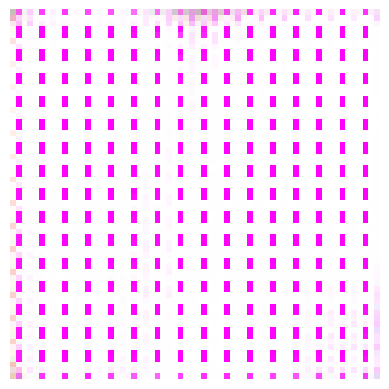

Epoch 2561, Generator Loss: 7.7144, Discriminator Loss: 0.0016
Epoch 2562, Generator Loss: 7.6090, Discriminator Loss: 0.0016
Epoch 2563, Generator Loss: 7.5692, Discriminator Loss: 0.0011
Epoch 2564, Generator Loss: 7.6514, Discriminator Loss: 0.0012
Epoch 2565, Generator Loss: 7.7106, Discriminator Loss: 0.0012
Epoch 2566, Generator Loss: 7.5982, Discriminator Loss: 0.0012
Epoch 2567, Generator Loss: 7.7026, Discriminator Loss: 0.0014
Epoch 2568, Generator Loss: 7.6908, Discriminator Loss: 0.0011
Epoch 2569, Generator Loss: 7.7822, Discriminator Loss: 0.0011
Epoch 2570, Generator Loss: 7.8327, Discriminator Loss: 0.0013


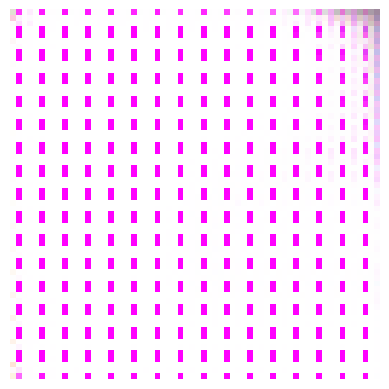

Epoch 2571, Generator Loss: 7.8335, Discriminator Loss: 0.0011
Epoch 2572, Generator Loss: 7.8051, Discriminator Loss: 0.0016
Epoch 2573, Generator Loss: 7.8014, Discriminator Loss: 0.0014
Epoch 2574, Generator Loss: 7.8429, Discriminator Loss: 0.0015
Epoch 2575, Generator Loss: 8.0099, Discriminator Loss: 0.0017
Epoch 2576, Generator Loss: 7.9602, Discriminator Loss: 0.0011
Epoch 2577, Generator Loss: 8.0368, Discriminator Loss: 0.0013
Epoch 2578, Generator Loss: 8.0808, Discriminator Loss: 0.0014
Epoch 2579, Generator Loss: 7.9408, Discriminator Loss: 0.0011
Epoch 2580, Generator Loss: 7.9478, Discriminator Loss: 0.0012


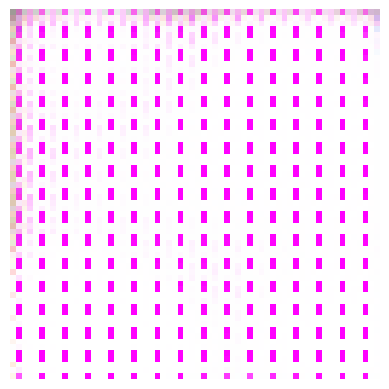

Epoch 2581, Generator Loss: 8.0013, Discriminator Loss: 0.0016
Epoch 2582, Generator Loss: 8.0161, Discriminator Loss: 0.0012
Epoch 2583, Generator Loss: 8.0104, Discriminator Loss: 0.0013
Epoch 2584, Generator Loss: 7.9867, Discriminator Loss: 0.0010
Epoch 2585, Generator Loss: 7.9434, Discriminator Loss: 0.0009
Epoch 2586, Generator Loss: 7.9853, Discriminator Loss: 0.0012
Epoch 2587, Generator Loss: 8.0303, Discriminator Loss: 0.0011
Epoch 2588, Generator Loss: 8.0041, Discriminator Loss: 0.0012
Epoch 2589, Generator Loss: 7.9360, Discriminator Loss: 0.0011
Epoch 2590, Generator Loss: 8.0691, Discriminator Loss: 0.0013


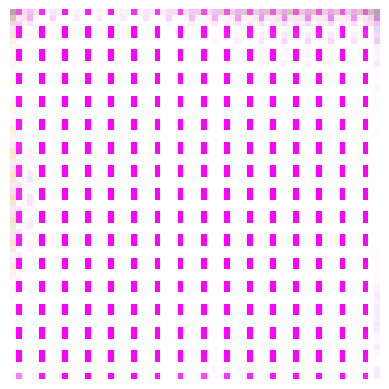

Epoch 2591, Generator Loss: 8.0105, Discriminator Loss: 0.0009
Epoch 2592, Generator Loss: 8.0507, Discriminator Loss: 0.0008
Epoch 2593, Generator Loss: 8.0110, Discriminator Loss: 0.0010
Epoch 2594, Generator Loss: 7.9851, Discriminator Loss: 0.0010
Epoch 2595, Generator Loss: 8.0528, Discriminator Loss: 0.0010
Epoch 2596, Generator Loss: 8.0862, Discriminator Loss: 0.0008
Epoch 2597, Generator Loss: 8.0965, Discriminator Loss: 0.0013
Epoch 2598, Generator Loss: 8.1161, Discriminator Loss: 0.0009
Epoch 2599, Generator Loss: 8.1616, Discriminator Loss: 0.0012
Epoch 2600, Generator Loss: 8.1182, Discriminator Loss: 0.0009


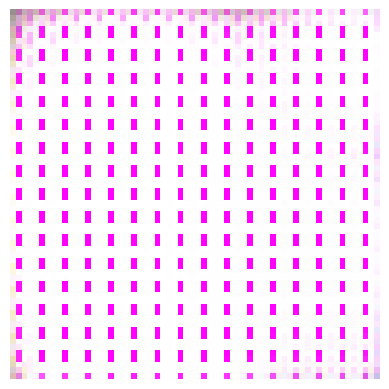

Epoch 2601, Generator Loss: 8.1816, Discriminator Loss: 0.0008
Epoch 2602, Generator Loss: 8.1265, Discriminator Loss: 0.0012
Epoch 2603, Generator Loss: 8.1387, Discriminator Loss: 0.0009
Epoch 2604, Generator Loss: 8.1964, Discriminator Loss: 0.0009
Epoch 2605, Generator Loss: 8.2283, Discriminator Loss: 0.0008
Epoch 2606, Generator Loss: 8.2408, Discriminator Loss: 0.0008
Epoch 2607, Generator Loss: 8.2405, Discriminator Loss: 0.0008
Epoch 2608, Generator Loss: 8.2312, Discriminator Loss: 0.0007
Epoch 2609, Generator Loss: 8.2816, Discriminator Loss: 0.0007
Epoch 2610, Generator Loss: 8.2502, Discriminator Loss: 0.0007


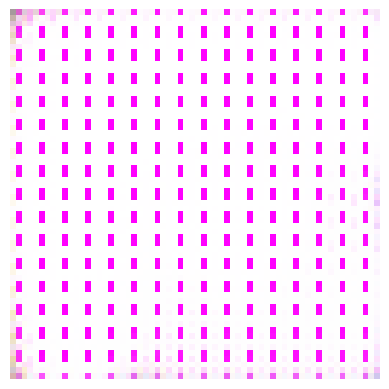

Epoch 2611, Generator Loss: 8.3285, Discriminator Loss: 0.0007
Epoch 2612, Generator Loss: 8.3155, Discriminator Loss: 0.0008
Epoch 2613, Generator Loss: 8.3863, Discriminator Loss: 0.0009
Epoch 2614, Generator Loss: 8.3639, Discriminator Loss: 0.0009
Epoch 2615, Generator Loss: 8.3215, Discriminator Loss: 0.0009
Epoch 2616, Generator Loss: 8.4266, Discriminator Loss: 0.0010
Epoch 2617, Generator Loss: 8.3353, Discriminator Loss: 0.0007
Epoch 2618, Generator Loss: 8.3902, Discriminator Loss: 0.0008
Epoch 2619, Generator Loss: 8.4684, Discriminator Loss: 0.0009
Epoch 2620, Generator Loss: 8.3900, Discriminator Loss: 0.0012


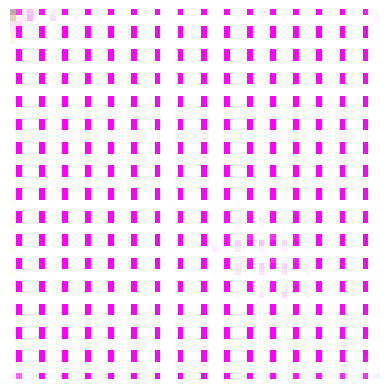

Epoch 2621, Generator Loss: 8.3708, Discriminator Loss: 0.0007
Epoch 2622, Generator Loss: 8.4381, Discriminator Loss: 0.0007
Epoch 2623, Generator Loss: 8.3608, Discriminator Loss: 0.0008
Epoch 2624, Generator Loss: 8.3256, Discriminator Loss: 0.0007
Epoch 2625, Generator Loss: 8.4017, Discriminator Loss: 0.0008
Epoch 2626, Generator Loss: 8.3929, Discriminator Loss: 0.0011
Epoch 2627, Generator Loss: 8.3633, Discriminator Loss: 0.0008
Epoch 2628, Generator Loss: 8.3380, Discriminator Loss: 0.0006
Epoch 2629, Generator Loss: 8.3485, Discriminator Loss: 0.0006
Epoch 2630, Generator Loss: 8.3854, Discriminator Loss: 0.0008


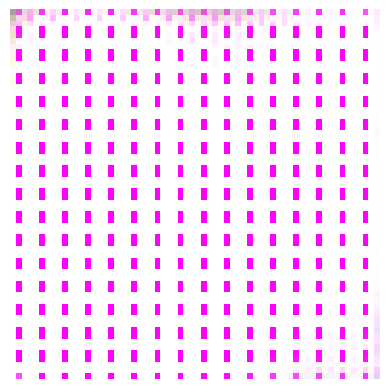

Epoch 2631, Generator Loss: 8.3436, Discriminator Loss: 0.0007
Epoch 2632, Generator Loss: 8.3703, Discriminator Loss: 0.0010
Epoch 2633, Generator Loss: 8.3335, Discriminator Loss: 0.0007
Epoch 2634, Generator Loss: 8.3926, Discriminator Loss: 0.0011
Epoch 2635, Generator Loss: 8.4035, Discriminator Loss: 0.0009
Epoch 2636, Generator Loss: 8.3607, Discriminator Loss: 0.0007
Epoch 2637, Generator Loss: 8.3757, Discriminator Loss: 0.0007
Epoch 2638, Generator Loss: 8.3629, Discriminator Loss: 0.0009
Epoch 2639, Generator Loss: 8.3631, Discriminator Loss: 0.0008
Epoch 2640, Generator Loss: 8.3605, Discriminator Loss: 0.0006


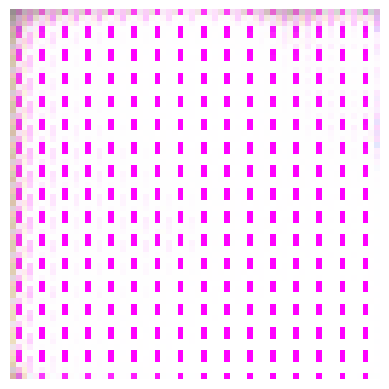

Epoch 2641, Generator Loss: 8.3843, Discriminator Loss: 0.0007
Epoch 2642, Generator Loss: 8.4324, Discriminator Loss: 0.0007
Epoch 2643, Generator Loss: 8.3668, Discriminator Loss: 0.0005
Epoch 2644, Generator Loss: 8.4043, Discriminator Loss: 0.0009
Epoch 2645, Generator Loss: 8.3938, Discriminator Loss: 0.0010
Epoch 2646, Generator Loss: 8.3878, Discriminator Loss: 0.0008
Epoch 2647, Generator Loss: 8.4127, Discriminator Loss: 0.0006
Epoch 2648, Generator Loss: 8.4022, Discriminator Loss: 0.0007
Epoch 2649, Generator Loss: 8.4483, Discriminator Loss: 0.0007
Epoch 2650, Generator Loss: 8.4363, Discriminator Loss: 0.0006


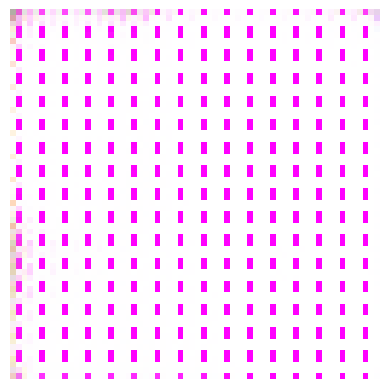

Epoch 2651, Generator Loss: 8.4319, Discriminator Loss: 0.0009
Epoch 2652, Generator Loss: 8.4147, Discriminator Loss: 0.0005
Epoch 2653, Generator Loss: 8.4411, Discriminator Loss: 0.0005
Epoch 2654, Generator Loss: 8.4925, Discriminator Loss: 0.0006
Epoch 2655, Generator Loss: 8.4803, Discriminator Loss: 0.0005
Epoch 2656, Generator Loss: 8.4871, Discriminator Loss: 0.0006
Epoch 2657, Generator Loss: 8.5211, Discriminator Loss: 0.0006
Epoch 2658, Generator Loss: 8.5105, Discriminator Loss: 0.0006
Epoch 2659, Generator Loss: 8.5730, Discriminator Loss: 0.0005
Epoch 2660, Generator Loss: 8.5752, Discriminator Loss: 0.0008


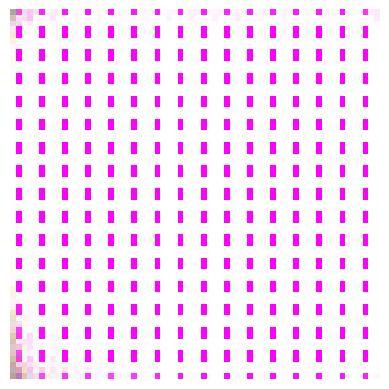

Epoch 2661, Generator Loss: 8.6051, Discriminator Loss: 0.0005
Epoch 2662, Generator Loss: 8.6125, Discriminator Loss: 0.0007
Epoch 2663, Generator Loss: 8.6375, Discriminator Loss: 0.0007
Epoch 2664, Generator Loss: 8.6020, Discriminator Loss: 0.0008
Epoch 2665, Generator Loss: 8.6260, Discriminator Loss: 0.0007
Epoch 2666, Generator Loss: 8.6751, Discriminator Loss: 0.0006
Epoch 2667, Generator Loss: 8.6413, Discriminator Loss: 0.0007
Epoch 2668, Generator Loss: 8.6701, Discriminator Loss: 0.0005
Epoch 2669, Generator Loss: 8.6394, Discriminator Loss: 0.0007
Epoch 2670, Generator Loss: 8.6386, Discriminator Loss: 0.0005


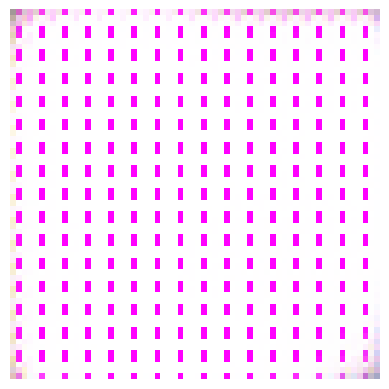

Epoch 2671, Generator Loss: 8.6647, Discriminator Loss: 0.0006
Epoch 2672, Generator Loss: 8.6527, Discriminator Loss: 0.0006
Epoch 2673, Generator Loss: 8.6509, Discriminator Loss: 0.0005
Epoch 2674, Generator Loss: 8.6867, Discriminator Loss: 0.0005
Epoch 2675, Generator Loss: 8.6843, Discriminator Loss: 0.0006
Epoch 2676, Generator Loss: 8.6945, Discriminator Loss: 0.0005
Epoch 2677, Generator Loss: 8.6804, Discriminator Loss: 0.0004
Epoch 2678, Generator Loss: 8.6908, Discriminator Loss: 0.0005
Epoch 2679, Generator Loss: 8.6794, Discriminator Loss: 0.0006
Epoch 2680, Generator Loss: 8.7002, Discriminator Loss: 0.0006


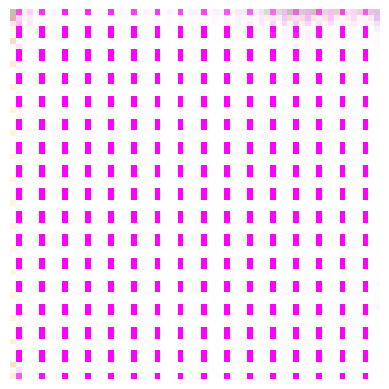

Epoch 2681, Generator Loss: 8.7110, Discriminator Loss: 0.0005
Epoch 2682, Generator Loss: 8.7183, Discriminator Loss: 0.0007
Epoch 2683, Generator Loss: 8.7311, Discriminator Loss: 0.0005
Epoch 2684, Generator Loss: 8.7460, Discriminator Loss: 0.0006
Epoch 2685, Generator Loss: 8.7403, Discriminator Loss: 0.0006
Epoch 2686, Generator Loss: 8.7582, Discriminator Loss: 0.0005
Epoch 2687, Generator Loss: 8.7616, Discriminator Loss: 0.0006
Epoch 2688, Generator Loss: 8.7517, Discriminator Loss: 0.0005
Epoch 2689, Generator Loss: 8.7563, Discriminator Loss: 0.0004
Epoch 2690, Generator Loss: 8.7513, Discriminator Loss: 0.0004


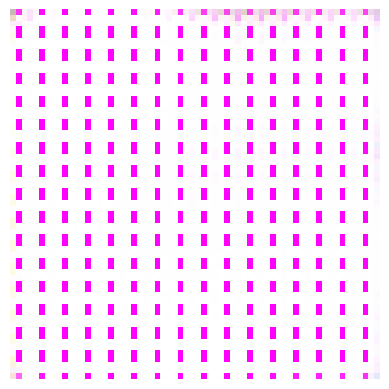

Epoch 2691, Generator Loss: 8.7795, Discriminator Loss: 0.0005
Epoch 2692, Generator Loss: 8.7864, Discriminator Loss: 0.0004
Epoch 2693, Generator Loss: 8.7853, Discriminator Loss: 0.0004
Epoch 2694, Generator Loss: 8.7737, Discriminator Loss: 0.0006
Epoch 2695, Generator Loss: 8.7792, Discriminator Loss: 0.0005
Epoch 2696, Generator Loss: 8.8057, Discriminator Loss: 0.0005
Epoch 2697, Generator Loss: 8.8026, Discriminator Loss: 0.0004
Epoch 2698, Generator Loss: 8.8126, Discriminator Loss: 0.0006
Epoch 2699, Generator Loss: 8.8467, Discriminator Loss: 0.0005
Epoch 2700, Generator Loss: 8.8458, Discriminator Loss: 0.0005


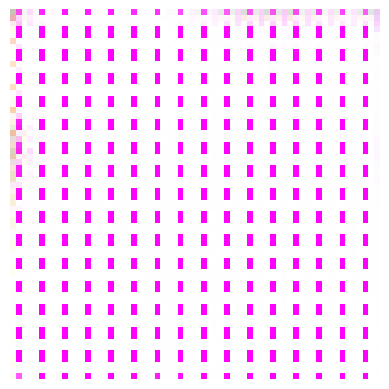

Epoch 2701, Generator Loss: 8.8415, Discriminator Loss: 0.0005
Epoch 2702, Generator Loss: 8.8226, Discriminator Loss: 0.0005
Epoch 2703, Generator Loss: 8.8379, Discriminator Loss: 0.0004
Epoch 2704, Generator Loss: 8.8200, Discriminator Loss: 0.0005
Epoch 2705, Generator Loss: 8.8246, Discriminator Loss: 0.0005
Epoch 2706, Generator Loss: 8.8792, Discriminator Loss: 0.0006
Epoch 2707, Generator Loss: 8.8633, Discriminator Loss: 0.0005
Epoch 2708, Generator Loss: 8.8460, Discriminator Loss: 0.0006
Epoch 2709, Generator Loss: 8.8538, Discriminator Loss: 0.0006
Epoch 2710, Generator Loss: 8.8571, Discriminator Loss: 0.0004


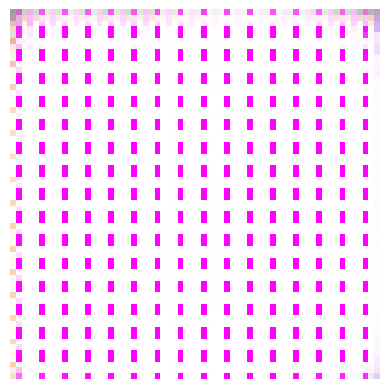

Epoch 2711, Generator Loss: 8.8635, Discriminator Loss: 0.0006
Epoch 2712, Generator Loss: 8.8558, Discriminator Loss: 0.0005
Epoch 2713, Generator Loss: 8.8638, Discriminator Loss: 0.0004
Epoch 2714, Generator Loss: 8.8499, Discriminator Loss: 0.0004
Epoch 2715, Generator Loss: 8.8333, Discriminator Loss: 0.0004
Epoch 2716, Generator Loss: 8.8838, Discriminator Loss: 0.0006
Epoch 2717, Generator Loss: 8.8599, Discriminator Loss: 0.0004
Epoch 2718, Generator Loss: 8.8511, Discriminator Loss: 0.0005
Epoch 2719, Generator Loss: 8.8646, Discriminator Loss: 0.0004
Epoch 2720, Generator Loss: 8.8619, Discriminator Loss: 0.0005


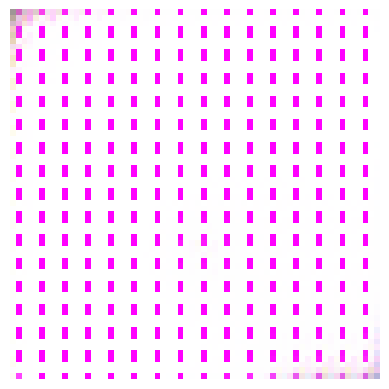

Epoch 2721, Generator Loss: 8.8842, Discriminator Loss: 0.0004
Epoch 2722, Generator Loss: 8.9083, Discriminator Loss: 0.0005
Epoch 2723, Generator Loss: 8.8806, Discriminator Loss: 0.0004
Epoch 2724, Generator Loss: 8.9003, Discriminator Loss: 0.0006
Epoch 2725, Generator Loss: 8.8924, Discriminator Loss: 0.0006
Epoch 2726, Generator Loss: 8.8801, Discriminator Loss: 0.0006
Epoch 2727, Generator Loss: 8.8916, Discriminator Loss: 0.0005
Epoch 2728, Generator Loss: 8.8883, Discriminator Loss: 0.0005
Epoch 2729, Generator Loss: 8.8983, Discriminator Loss: 0.0004
Epoch 2730, Generator Loss: 8.8846, Discriminator Loss: 0.0005


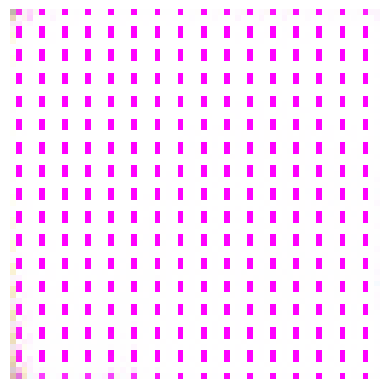

Epoch 2731, Generator Loss: 8.9179, Discriminator Loss: 0.0005
Epoch 2732, Generator Loss: 8.8765, Discriminator Loss: 0.0004
Epoch 2733, Generator Loss: 8.8663, Discriminator Loss: 0.0005
Epoch 2734, Generator Loss: 8.8820, Discriminator Loss: 0.0004
Epoch 2735, Generator Loss: 8.9044, Discriminator Loss: 0.0004
Epoch 2736, Generator Loss: 8.9102, Discriminator Loss: 0.0004
Epoch 2737, Generator Loss: 8.9071, Discriminator Loss: 0.0004
Epoch 2738, Generator Loss: 8.9180, Discriminator Loss: 0.0004
Epoch 2739, Generator Loss: 8.9499, Discriminator Loss: 0.0004
Epoch 2740, Generator Loss: 8.9432, Discriminator Loss: 0.0004


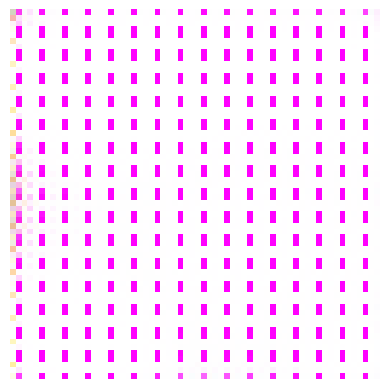

Epoch 2741, Generator Loss: 8.9429, Discriminator Loss: 0.0006
Epoch 2742, Generator Loss: 8.9273, Discriminator Loss: 0.0005
Epoch 2743, Generator Loss: 8.9599, Discriminator Loss: 0.0005
Epoch 2744, Generator Loss: 8.9772, Discriminator Loss: 0.0005
Epoch 2745, Generator Loss: 8.9291, Discriminator Loss: 0.0005
Epoch 2746, Generator Loss: 8.9649, Discriminator Loss: 0.0004
Epoch 2747, Generator Loss: 8.9395, Discriminator Loss: 0.0005
Epoch 2748, Generator Loss: 8.9295, Discriminator Loss: 0.0005
Epoch 2749, Generator Loss: 8.9433, Discriminator Loss: 0.0004
Epoch 2750, Generator Loss: 8.9381, Discriminator Loss: 0.0004


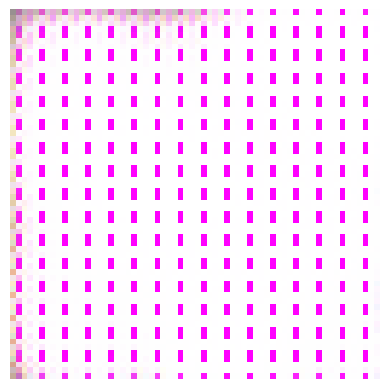

Epoch 2751, Generator Loss: 8.9254, Discriminator Loss: 0.0004
Epoch 2752, Generator Loss: 8.9518, Discriminator Loss: 0.0003
Epoch 2753, Generator Loss: 8.9816, Discriminator Loss: 0.0003
Epoch 2754, Generator Loss: 8.9908, Discriminator Loss: 0.0004
Epoch 2755, Generator Loss: 8.9774, Discriminator Loss: 0.0005
Epoch 2756, Generator Loss: 8.9633, Discriminator Loss: 0.0005
Epoch 2757, Generator Loss: 8.9830, Discriminator Loss: 0.0004
Epoch 2758, Generator Loss: 8.9842, Discriminator Loss: 0.0004
Epoch 2759, Generator Loss: 9.0037, Discriminator Loss: 0.0004
Epoch 2760, Generator Loss: 8.9536, Discriminator Loss: 0.0005


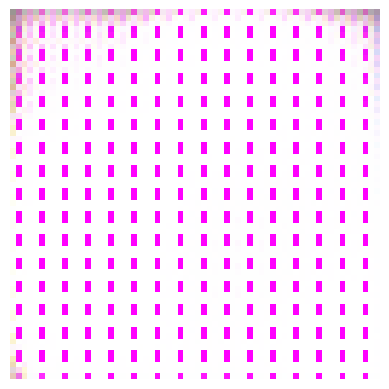

Epoch 2761, Generator Loss: 8.9983, Discriminator Loss: 0.0004
Epoch 2762, Generator Loss: 8.9999, Discriminator Loss: 0.0004
Epoch 2763, Generator Loss: 9.0184, Discriminator Loss: 0.0004
Epoch 2764, Generator Loss: 9.0086, Discriminator Loss: 0.0004
Epoch 2765, Generator Loss: 9.0143, Discriminator Loss: 0.0004
Epoch 2766, Generator Loss: 9.0240, Discriminator Loss: 0.0004
Epoch 2767, Generator Loss: 9.0185, Discriminator Loss: 0.0004
Epoch 2768, Generator Loss: 9.0464, Discriminator Loss: 0.0004
Epoch 2769, Generator Loss: 9.0428, Discriminator Loss: 0.0004
Epoch 2770, Generator Loss: 9.0485, Discriminator Loss: 0.0003


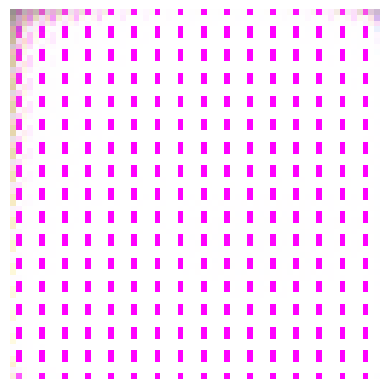

Epoch 2771, Generator Loss: 9.0775, Discriminator Loss: 0.0003
Epoch 2772, Generator Loss: 9.0716, Discriminator Loss: 0.0004
Epoch 2773, Generator Loss: 9.0779, Discriminator Loss: 0.0004
Epoch 2774, Generator Loss: 9.0985, Discriminator Loss: 0.0005
Epoch 2775, Generator Loss: 9.0743, Discriminator Loss: 0.0004
Epoch 2776, Generator Loss: 9.0984, Discriminator Loss: 0.0004
Epoch 2777, Generator Loss: 9.1050, Discriminator Loss: 0.0004
Epoch 2778, Generator Loss: 9.0882, Discriminator Loss: 0.0003
Epoch 2779, Generator Loss: 9.1049, Discriminator Loss: 0.0004
Epoch 2780, Generator Loss: 9.0961, Discriminator Loss: 0.0004


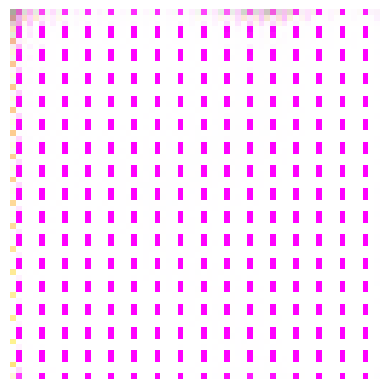

Epoch 2781, Generator Loss: 9.1237, Discriminator Loss: 0.0004
Epoch 2782, Generator Loss: 9.1222, Discriminator Loss: 0.0005
Epoch 2783, Generator Loss: 9.1261, Discriminator Loss: 0.0003
Epoch 2784, Generator Loss: 9.1344, Discriminator Loss: 0.0003
Epoch 2785, Generator Loss: 9.1231, Discriminator Loss: 0.0005
Epoch 2786, Generator Loss: 9.0928, Discriminator Loss: 0.0004
Epoch 2787, Generator Loss: 9.0980, Discriminator Loss: 0.0003
Epoch 2788, Generator Loss: 9.0977, Discriminator Loss: 0.0004
Epoch 2789, Generator Loss: 9.1243, Discriminator Loss: 0.0004
Epoch 2790, Generator Loss: 9.1163, Discriminator Loss: 0.0003


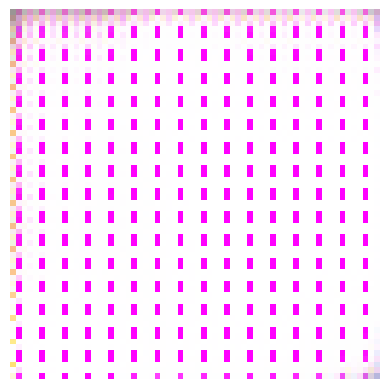

Epoch 2791, Generator Loss: 9.1272, Discriminator Loss: 0.0003
Epoch 2792, Generator Loss: 9.1094, Discriminator Loss: 0.0004
Epoch 2793, Generator Loss: 9.1149, Discriminator Loss: 0.0004
Epoch 2794, Generator Loss: 9.1136, Discriminator Loss: 0.0003
Epoch 2795, Generator Loss: 9.1253, Discriminator Loss: 0.0003
Epoch 2796, Generator Loss: 9.1464, Discriminator Loss: 0.0003
Epoch 2797, Generator Loss: 9.1336, Discriminator Loss: 0.0003
Epoch 2798, Generator Loss: 9.1298, Discriminator Loss: 0.0004
Epoch 2799, Generator Loss: 9.1457, Discriminator Loss: 0.0003
Epoch 2800, Generator Loss: 9.1502, Discriminator Loss: 0.0004


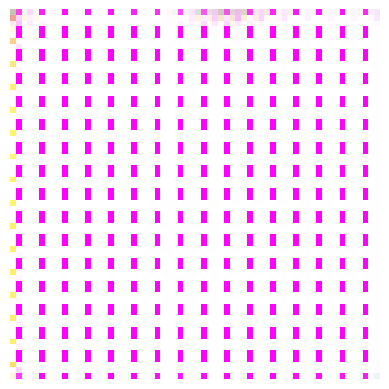

Epoch 2801, Generator Loss: 9.1316, Discriminator Loss: 0.0004
Epoch 2802, Generator Loss: 9.1439, Discriminator Loss: 0.0003
Epoch 2803, Generator Loss: 9.1675, Discriminator Loss: 0.0003
Epoch 2804, Generator Loss: 9.1693, Discriminator Loss: 0.0004
Epoch 2805, Generator Loss: 9.1580, Discriminator Loss: 0.0003
Epoch 2806, Generator Loss: 9.1507, Discriminator Loss: 0.0003
Epoch 2807, Generator Loss: 9.1654, Discriminator Loss: 0.0003
Epoch 2808, Generator Loss: 9.1620, Discriminator Loss: 0.0004
Epoch 2809, Generator Loss: 9.1759, Discriminator Loss: 0.0003
Epoch 2810, Generator Loss: 9.1719, Discriminator Loss: 0.0003


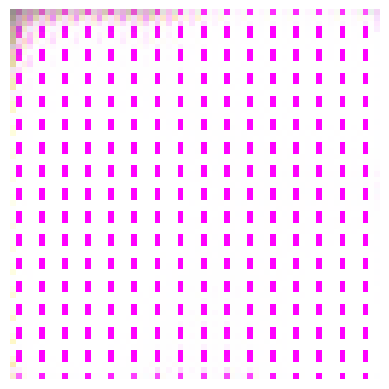

Epoch 2811, Generator Loss: 9.1619, Discriminator Loss: 0.0003
Epoch 2812, Generator Loss: 9.1974, Discriminator Loss: 0.0004
Epoch 2813, Generator Loss: 9.1726, Discriminator Loss: 0.0003
Epoch 2814, Generator Loss: 9.1868, Discriminator Loss: 0.0003
Epoch 2815, Generator Loss: 9.1996, Discriminator Loss: 0.0004
Epoch 2816, Generator Loss: 9.2076, Discriminator Loss: 0.0003
Epoch 2817, Generator Loss: 9.1930, Discriminator Loss: 0.0003
Epoch 2818, Generator Loss: 9.2107, Discriminator Loss: 0.0003
Epoch 2819, Generator Loss: 9.2040, Discriminator Loss: 0.0003
Epoch 2820, Generator Loss: 9.2194, Discriminator Loss: 0.0004


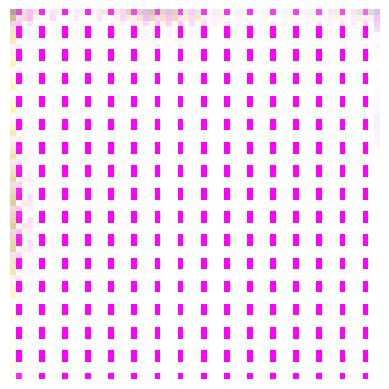

Epoch 2821, Generator Loss: 9.2085, Discriminator Loss: 0.0003
Epoch 2822, Generator Loss: 9.2204, Discriminator Loss: 0.0004
Epoch 2823, Generator Loss: 9.2176, Discriminator Loss: 0.0003
Epoch 2824, Generator Loss: 9.2270, Discriminator Loss: 0.0004
Epoch 2825, Generator Loss: 9.2319, Discriminator Loss: 0.0003
Epoch 2826, Generator Loss: 9.2450, Discriminator Loss: 0.0004
Epoch 2827, Generator Loss: 9.2314, Discriminator Loss: 0.0003
Epoch 2828, Generator Loss: 9.2383, Discriminator Loss: 0.0003
Epoch 2829, Generator Loss: 9.2549, Discriminator Loss: 0.0003
Epoch 2830, Generator Loss: 9.2452, Discriminator Loss: 0.0003


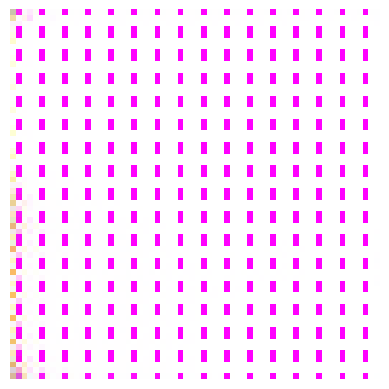

Epoch 2831, Generator Loss: 9.2186, Discriminator Loss: 0.0003
Epoch 2832, Generator Loss: 9.2501, Discriminator Loss: 0.0003
Epoch 2833, Generator Loss: 9.2466, Discriminator Loss: 0.0003
Epoch 2834, Generator Loss: 9.2618, Discriminator Loss: 0.0003
Epoch 2835, Generator Loss: 9.2575, Discriminator Loss: 0.0003
Epoch 2836, Generator Loss: 9.2556, Discriminator Loss: 0.0003
Epoch 2837, Generator Loss: 9.2593, Discriminator Loss: 0.0003
Epoch 2838, Generator Loss: 9.2513, Discriminator Loss: 0.0003
Epoch 2839, Generator Loss: 9.2845, Discriminator Loss: 0.0003
Epoch 2840, Generator Loss: 9.2860, Discriminator Loss: 0.0003


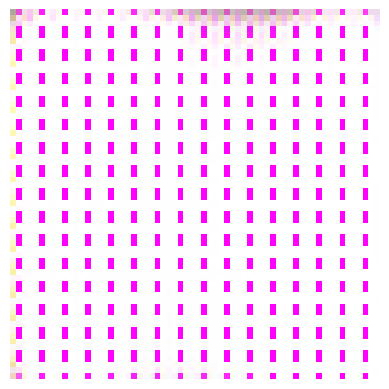

Epoch 2841, Generator Loss: 9.2627, Discriminator Loss: 0.0003
Epoch 2842, Generator Loss: 9.2773, Discriminator Loss: 0.0003
Epoch 2843, Generator Loss: 9.1949, Discriminator Loss: 0.0003
Epoch 2844, Generator Loss: 9.2639, Discriminator Loss: 0.0003
Epoch 2845, Generator Loss: 9.2689, Discriminator Loss: 0.0003
Epoch 2846, Generator Loss: 9.2737, Discriminator Loss: 0.0005
Epoch 2847, Generator Loss: 9.2515, Discriminator Loss: 0.0003
Epoch 2848, Generator Loss: 9.2657, Discriminator Loss: 0.0004
Epoch 2849, Generator Loss: 9.2489, Discriminator Loss: 0.0003
Epoch 2850, Generator Loss: 9.2326, Discriminator Loss: 0.0003


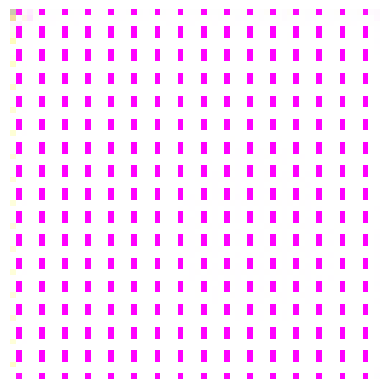

Epoch 2851, Generator Loss: 9.2028, Discriminator Loss: 0.0004
Epoch 2852, Generator Loss: 9.2337, Discriminator Loss: 0.0005
Epoch 2853, Generator Loss: 9.2369, Discriminator Loss: 0.0003
Epoch 2854, Generator Loss: 9.1735, Discriminator Loss: 0.0003
Epoch 2855, Generator Loss: 9.2586, Discriminator Loss: 0.0003
Epoch 2856, Generator Loss: 9.2308, Discriminator Loss: 0.0003
Epoch 2857, Generator Loss: 9.1940, Discriminator Loss: 0.0003
Epoch 2858, Generator Loss: 9.2191, Discriminator Loss: 0.0003
Epoch 2859, Generator Loss: 9.1190, Discriminator Loss: 0.0003
Epoch 2860, Generator Loss: 9.1364, Discriminator Loss: 0.0004


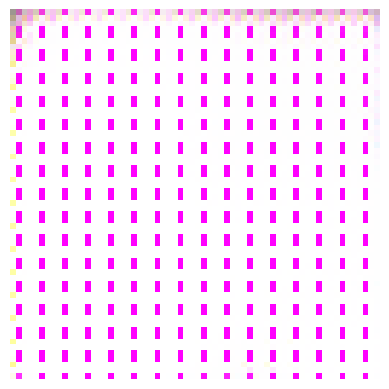

Epoch 2861, Generator Loss: 9.1736, Discriminator Loss: 0.0003
Epoch 2862, Generator Loss: 9.1748, Discriminator Loss: 0.0003
Epoch 2863, Generator Loss: 9.1132, Discriminator Loss: 0.0004
Epoch 2864, Generator Loss: 9.1769, Discriminator Loss: 0.0004
Epoch 2865, Generator Loss: 9.0449, Discriminator Loss: 0.0003
Epoch 2866, Generator Loss: 9.0811, Discriminator Loss: 0.0003
Epoch 2867, Generator Loss: 9.0571, Discriminator Loss: 0.0003
Epoch 2868, Generator Loss: 8.9934, Discriminator Loss: 0.0003
Epoch 2869, Generator Loss: 9.0677, Discriminator Loss: 0.0004
Epoch 2870, Generator Loss: 9.0002, Discriminator Loss: 0.0004


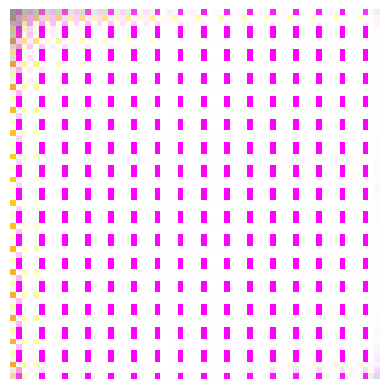

Epoch 2871, Generator Loss: 8.8564, Discriminator Loss: 0.0004
Epoch 2872, Generator Loss: 8.9015, Discriminator Loss: 0.0003
Epoch 2873, Generator Loss: 8.8183, Discriminator Loss: 0.0004
Epoch 2874, Generator Loss: 8.7594, Discriminator Loss: 0.0003
Epoch 2875, Generator Loss: 8.9227, Discriminator Loss: 0.0004
Epoch 2876, Generator Loss: 8.4807, Discriminator Loss: 0.0005
Epoch 2877, Generator Loss: 8.4002, Discriminator Loss: 0.0004
Epoch 2878, Generator Loss: 7.9916, Discriminator Loss: 0.0008
Epoch 2879, Generator Loss: 7.8051, Discriminator Loss: 0.0012
Epoch 2880, Generator Loss: 7.2744, Discriminator Loss: 0.0026


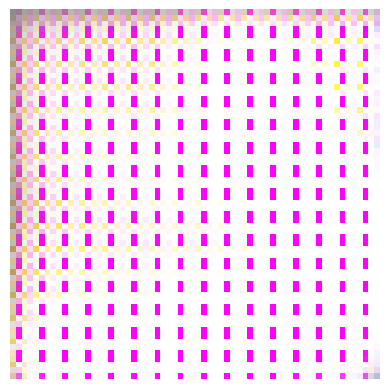

Epoch 2881, Generator Loss: 7.2288, Discriminator Loss: 0.0043
Epoch 2882, Generator Loss: 6.5787, Discriminator Loss: 0.0179
Epoch 2883, Generator Loss: 7.2866, Discriminator Loss: 0.0087
Epoch 2884, Generator Loss: 7.0225, Discriminator Loss: 0.0350
Epoch 2885, Generator Loss: 9.5302, Discriminator Loss: 0.0129
Epoch 2886, Generator Loss: 9.5860, Discriminator Loss: 0.0125
Epoch 2887, Generator Loss: 13.0527, Discriminator Loss: 0.0262
Epoch 2888, Generator Loss: 13.3451, Discriminator Loss: 0.0392
Epoch 2889, Generator Loss: 11.0129, Discriminator Loss: 0.0543
Epoch 2890, Generator Loss: 9.9507, Discriminator Loss: 0.0900


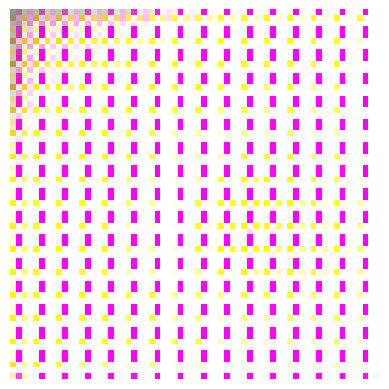

Epoch 2891, Generator Loss: 5.7555, Discriminator Loss: 0.1825
Epoch 2892, Generator Loss: 6.1517, Discriminator Loss: 0.2021
Epoch 2893, Generator Loss: 10.9257, Discriminator Loss: 0.6587
Epoch 2894, Generator Loss: 5.8052, Discriminator Loss: 0.1167
Epoch 2895, Generator Loss: 2.7297, Discriminator Loss: 0.3078
Epoch 2896, Generator Loss: 6.8659, Discriminator Loss: 0.0360
Epoch 2897, Generator Loss: 10.4239, Discriminator Loss: 0.0701
Epoch 2898, Generator Loss: 12.9377, Discriminator Loss: 0.1334
Epoch 2899, Generator Loss: 13.5562, Discriminator Loss: 0.0675
Epoch 2900, Generator Loss: 13.8831, Discriminator Loss: 0.0226


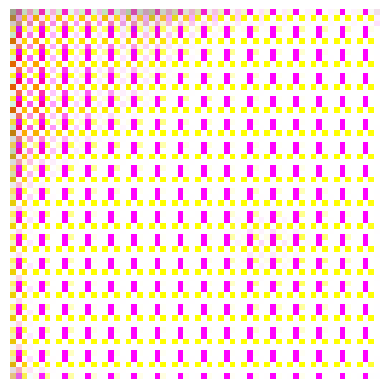

Epoch 2901, Generator Loss: 12.8290, Discriminator Loss: 0.0093
Epoch 2902, Generator Loss: 11.8007, Discriminator Loss: 0.0034
Epoch 2903, Generator Loss: 11.6393, Discriminator Loss: 0.0014
Epoch 2904, Generator Loss: 10.5308, Discriminator Loss: 0.0007
Epoch 2905, Generator Loss: 9.9421, Discriminator Loss: 0.0005
Epoch 2906, Generator Loss: 9.3063, Discriminator Loss: 0.0005
Epoch 2907, Generator Loss: 9.1228, Discriminator Loss: 0.0007
Epoch 2908, Generator Loss: 8.5178, Discriminator Loss: 0.0009
Epoch 2909, Generator Loss: 6.5182, Discriminator Loss: 0.0303
Epoch 2910, Generator Loss: 7.1893, Discriminator Loss: 0.0415


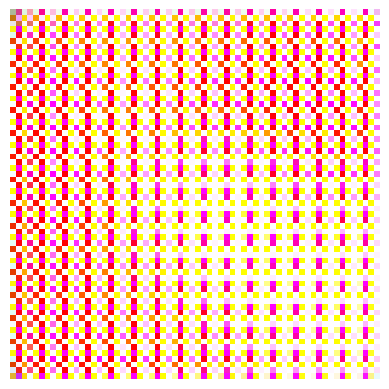

Epoch 2911, Generator Loss: 8.5063, Discriminator Loss: 0.0052
Epoch 2912, Generator Loss: 9.8706, Discriminator Loss: 0.0016
Epoch 2913, Generator Loss: 11.5777, Discriminator Loss: 0.0004
Epoch 2914, Generator Loss: 11.9050, Discriminator Loss: 0.0003
Epoch 2915, Generator Loss: 12.9982, Discriminator Loss: 0.0004
Epoch 2916, Generator Loss: 12.7563, Discriminator Loss: 0.0006
Epoch 2917, Generator Loss: 13.2634, Discriminator Loss: 0.0011
Epoch 2918, Generator Loss: 13.3599, Discriminator Loss: 0.0009
Epoch 2919, Generator Loss: 13.5441, Discriminator Loss: 0.0018
Epoch 2920, Generator Loss: 13.4358, Discriminator Loss: 0.0018


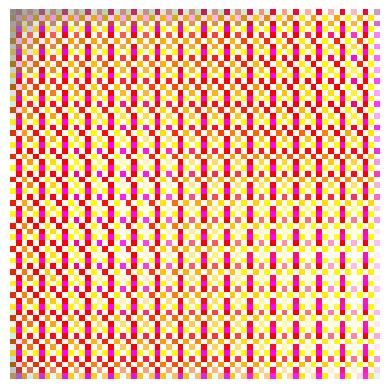

Epoch 2921, Generator Loss: 13.7879, Discriminator Loss: 0.0020
Epoch 2922, Generator Loss: 13.4518, Discriminator Loss: 0.0025
Epoch 2923, Generator Loss: 13.4112, Discriminator Loss: 0.0031
Epoch 2924, Generator Loss: 13.1069, Discriminator Loss: 0.0028
Epoch 2925, Generator Loss: 12.8283, Discriminator Loss: 0.0034
Epoch 2926, Generator Loss: 12.4656, Discriminator Loss: 0.0038
Epoch 2927, Generator Loss: 12.2385, Discriminator Loss: 0.0035
Epoch 2928, Generator Loss: 12.2003, Discriminator Loss: 0.0028
Epoch 2929, Generator Loss: 12.0943, Discriminator Loss: 0.0028
Epoch 2930, Generator Loss: 11.7533, Discriminator Loss: 0.0026


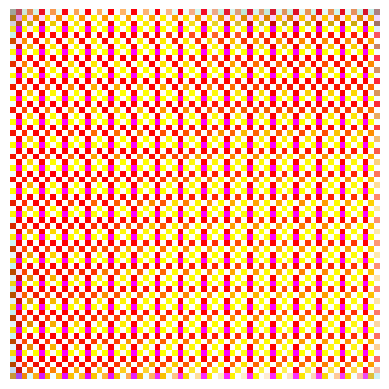

Epoch 2931, Generator Loss: 11.6312, Discriminator Loss: 0.0035
Epoch 2932, Generator Loss: 11.2243, Discriminator Loss: 0.0023
Epoch 2933, Generator Loss: 10.8215, Discriminator Loss: 0.0022
Epoch 2934, Generator Loss: 10.4233, Discriminator Loss: 0.0018
Epoch 2935, Generator Loss: 9.8945, Discriminator Loss: 0.0021
Epoch 2936, Generator Loss: 9.4655, Discriminator Loss: 0.0015
Epoch 2937, Generator Loss: 9.3343, Discriminator Loss: 0.0014
Epoch 2938, Generator Loss: 9.0810, Discriminator Loss: 0.0015
Epoch 2939, Generator Loss: 8.8255, Discriminator Loss: 0.0013
Epoch 2940, Generator Loss: 8.5896, Discriminator Loss: 0.0012


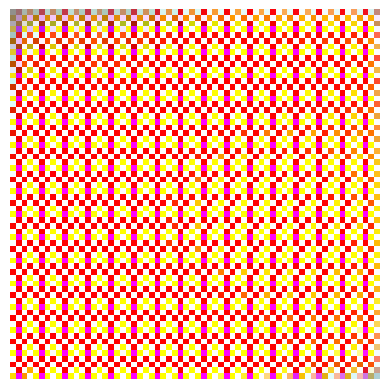

Epoch 2941, Generator Loss: 8.5008, Discriminator Loss: 0.0014
Epoch 2942, Generator Loss: 8.4149, Discriminator Loss: 0.0013
Epoch 2943, Generator Loss: 8.3924, Discriminator Loss: 0.0010
Epoch 2944, Generator Loss: 8.0329, Discriminator Loss: 0.0012
Epoch 2945, Generator Loss: 8.0399, Discriminator Loss: 0.0010
Epoch 2946, Generator Loss: 7.8159, Discriminator Loss: 0.0011
Epoch 2947, Generator Loss: 7.5821, Discriminator Loss: 0.0012
Epoch 2948, Generator Loss: 7.4513, Discriminator Loss: 0.0012
Epoch 2949, Generator Loss: 7.0096, Discriminator Loss: 0.0018
Epoch 2950, Generator Loss: 6.9005, Discriminator Loss: 0.0023


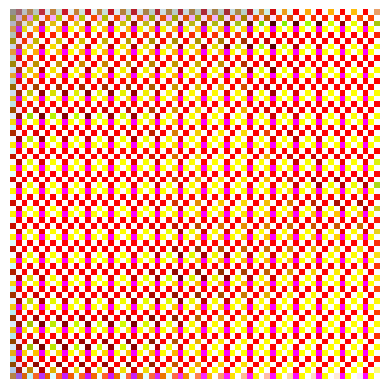

Epoch 2951, Generator Loss: 6.9142, Discriminator Loss: 0.0023
Epoch 2952, Generator Loss: 6.5969, Discriminator Loss: 0.0029
Epoch 2953, Generator Loss: 5.9101, Discriminator Loss: 0.0083
Epoch 2954, Generator Loss: 6.0288, Discriminator Loss: 0.0245
Epoch 2955, Generator Loss: 6.6787, Discriminator Loss: 0.0076
Epoch 2956, Generator Loss: 7.2818, Discriminator Loss: 0.0075
Epoch 2957, Generator Loss: 5.7312, Discriminator Loss: 0.2105
Epoch 2958, Generator Loss: 7.1373, Discriminator Loss: 0.2437
Epoch 2959, Generator Loss: 11.0396, Discriminator Loss: 0.0615
Epoch 2960, Generator Loss: 12.9346, Discriminator Loss: 0.2531


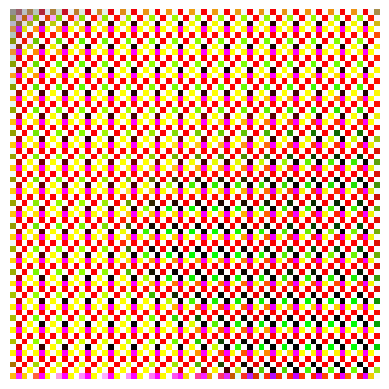

Epoch 2961, Generator Loss: 12.3418, Discriminator Loss: 0.1723
Epoch 2962, Generator Loss: 10.3955, Discriminator Loss: 0.0490
Epoch 2963, Generator Loss: 8.6613, Discriminator Loss: 0.0109
Epoch 2964, Generator Loss: 7.1997, Discriminator Loss: 0.0051
Epoch 2965, Generator Loss: 5.4393, Discriminator Loss: 0.0114
Epoch 2966, Generator Loss: 4.9824, Discriminator Loss: 0.0179
Epoch 2967, Generator Loss: 3.9053, Discriminator Loss: 0.0301
Epoch 2968, Generator Loss: 4.5321, Discriminator Loss: 0.0163
Epoch 2969, Generator Loss: 6.0798, Discriminator Loss: 0.0037
Epoch 2970, Generator Loss: 8.1018, Discriminator Loss: 0.0006


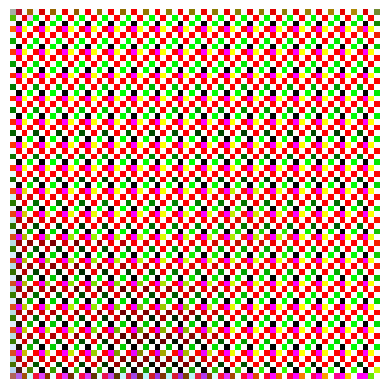

Epoch 2971, Generator Loss: 9.7199, Discriminator Loss: 0.0002
Epoch 2972, Generator Loss: 11.0488, Discriminator Loss: 0.0001
Epoch 2973, Generator Loss: 11.8257, Discriminator Loss: 0.0001
Epoch 2974, Generator Loss: 12.2994, Discriminator Loss: 0.0001
Epoch 2975, Generator Loss: 13.1037, Discriminator Loss: 0.0000
Epoch 2976, Generator Loss: 13.3942, Discriminator Loss: 0.0000
Epoch 2977, Generator Loss: 12.5883, Discriminator Loss: 0.0001
Epoch 2978, Generator Loss: 12.3729, Discriminator Loss: 0.0000
Epoch 2979, Generator Loss: 11.9478, Discriminator Loss: 0.0001
Epoch 2980, Generator Loss: 11.5866, Discriminator Loss: 0.0001


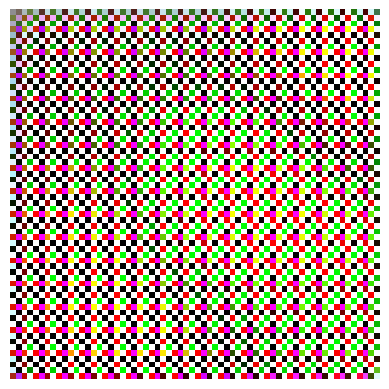

Epoch 2981, Generator Loss: 11.4460, Discriminator Loss: 0.0000
Epoch 2982, Generator Loss: 11.6882, Discriminator Loss: 0.0000
Epoch 2983, Generator Loss: 11.9239, Discriminator Loss: 0.0000
Epoch 2984, Generator Loss: 11.9615, Discriminator Loss: 0.0000
Epoch 2985, Generator Loss: 12.0194, Discriminator Loss: 0.0000
Epoch 2986, Generator Loss: 12.5058, Discriminator Loss: 0.0000
Epoch 2987, Generator Loss: 12.4359, Discriminator Loss: 0.0000
Epoch 2988, Generator Loss: 12.5587, Discriminator Loss: 0.0000
Epoch 2989, Generator Loss: 12.6595, Discriminator Loss: 0.0000
Epoch 2990, Generator Loss: 12.5118, Discriminator Loss: 0.0000


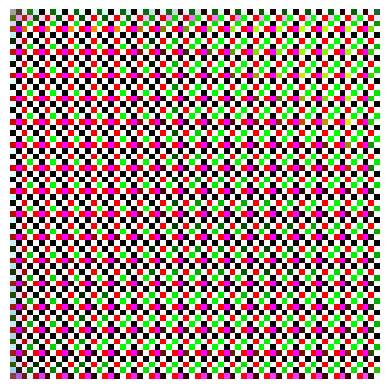

Epoch 2991, Generator Loss: 12.1397, Discriminator Loss: 0.0000
Epoch 2992, Generator Loss: 12.4865, Discriminator Loss: 0.0000
Epoch 2993, Generator Loss: 12.1067, Discriminator Loss: 0.0000
Epoch 2994, Generator Loss: 11.8976, Discriminator Loss: 0.0000
Epoch 2995, Generator Loss: 11.7988, Discriminator Loss: 0.0000
Epoch 2996, Generator Loss: 11.7680, Discriminator Loss: 0.0000
Epoch 2997, Generator Loss: 11.8382, Discriminator Loss: 0.0000
Epoch 2998, Generator Loss: 11.7717, Discriminator Loss: 0.0000
Epoch 2999, Generator Loss: 11.9148, Discriminator Loss: 0.0000
Epoch 3000, Generator Loss: 11.6338, Discriminator Loss: 0.0000


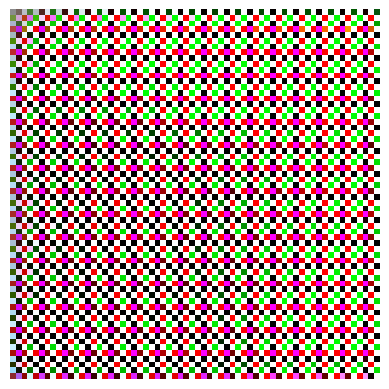

Epoch 3001, Generator Loss: 11.6139, Discriminator Loss: 0.0000
Epoch 3002, Generator Loss: 11.4664, Discriminator Loss: 0.0000
Epoch 3003, Generator Loss: 11.3813, Discriminator Loss: 0.0000
Epoch 3004, Generator Loss: 11.2718, Discriminator Loss: 0.0000
Epoch 3005, Generator Loss: 11.2132, Discriminator Loss: 0.0000
Epoch 3006, Generator Loss: 11.2233, Discriminator Loss: 0.0000
Epoch 3007, Generator Loss: 11.1762, Discriminator Loss: 0.0001
Epoch 3008, Generator Loss: 11.0021, Discriminator Loss: 0.0000
Epoch 3009, Generator Loss: 10.9623, Discriminator Loss: 0.0000
Epoch 3010, Generator Loss: 10.9793, Discriminator Loss: 0.0000


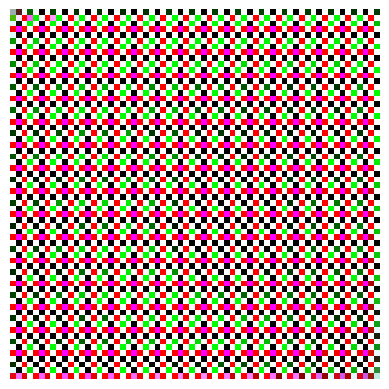

Epoch 3011, Generator Loss: 10.8379, Discriminator Loss: 0.0000
Epoch 3012, Generator Loss: 10.7572, Discriminator Loss: 0.0000
Epoch 3013, Generator Loss: 10.7499, Discriminator Loss: 0.0000
Epoch 3014, Generator Loss: 10.6831, Discriminator Loss: 0.0001
Epoch 3015, Generator Loss: 10.6729, Discriminator Loss: 0.0001
Epoch 3016, Generator Loss: 10.6882, Discriminator Loss: 0.0000
Epoch 3017, Generator Loss: 10.7256, Discriminator Loss: 0.0001
Epoch 3018, Generator Loss: 10.6879, Discriminator Loss: 0.0001
Epoch 3019, Generator Loss: 10.6984, Discriminator Loss: 0.0000
Epoch 3020, Generator Loss: 10.6654, Discriminator Loss: 0.0000


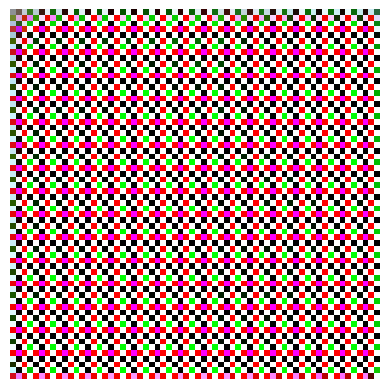

Epoch 3021, Generator Loss: 10.6577, Discriminator Loss: 0.0001
Epoch 3022, Generator Loss: 10.7300, Discriminator Loss: 0.0000
Epoch 3023, Generator Loss: 10.6928, Discriminator Loss: 0.0001
Epoch 3024, Generator Loss: 10.7305, Discriminator Loss: 0.0000
Epoch 3025, Generator Loss: 10.7419, Discriminator Loss: 0.0001
Epoch 3026, Generator Loss: 10.6379, Discriminator Loss: 0.0001
Epoch 3027, Generator Loss: 10.6888, Discriminator Loss: 0.0001
Epoch 3028, Generator Loss: 10.7353, Discriminator Loss: 0.0000
Epoch 3029, Generator Loss: 10.6859, Discriminator Loss: 0.0000
Epoch 3030, Generator Loss: 10.7142, Discriminator Loss: 0.0001


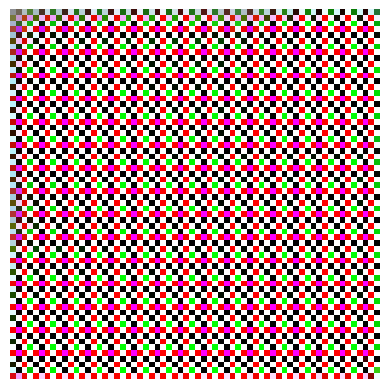

Epoch 3031, Generator Loss: 10.7626, Discriminator Loss: 0.0001
Epoch 3032, Generator Loss: 10.7074, Discriminator Loss: 0.0000
Epoch 3033, Generator Loss: 10.7153, Discriminator Loss: 0.0001
Epoch 3034, Generator Loss: 10.7288, Discriminator Loss: 0.0001
Epoch 3035, Generator Loss: 10.7558, Discriminator Loss: 0.0001
Epoch 3036, Generator Loss: 10.7385, Discriminator Loss: 0.0001
Epoch 3037, Generator Loss: 10.7578, Discriminator Loss: 0.0001
Epoch 3038, Generator Loss: 10.7262, Discriminator Loss: 0.0001
Epoch 3039, Generator Loss: 10.7251, Discriminator Loss: 0.0001
Epoch 3040, Generator Loss: 10.7010, Discriminator Loss: 0.0000


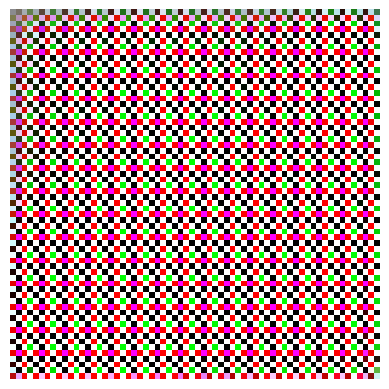

Epoch 3041, Generator Loss: 10.7109, Discriminator Loss: 0.0000
Epoch 3042, Generator Loss: 10.7547, Discriminator Loss: 0.0000
Epoch 3043, Generator Loss: 10.7380, Discriminator Loss: 0.0000
Epoch 3044, Generator Loss: 10.7310, Discriminator Loss: 0.0000
Epoch 3045, Generator Loss: 10.7186, Discriminator Loss: 0.0001
Epoch 3046, Generator Loss: 10.7130, Discriminator Loss: 0.0000
Epoch 3047, Generator Loss: 10.7652, Discriminator Loss: 0.0000
Epoch 3048, Generator Loss: 10.7462, Discriminator Loss: 0.0001
Epoch 3049, Generator Loss: 10.7719, Discriminator Loss: 0.0001
Epoch 3050, Generator Loss: 10.7129, Discriminator Loss: 0.0001


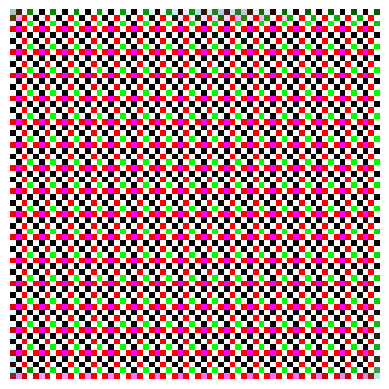

Epoch 3051, Generator Loss: 10.7747, Discriminator Loss: 0.0000
Epoch 3052, Generator Loss: 10.7502, Discriminator Loss: 0.0001
Epoch 3053, Generator Loss: 10.7162, Discriminator Loss: 0.0000
Epoch 3054, Generator Loss: 10.7437, Discriminator Loss: 0.0001
Epoch 3055, Generator Loss: 10.7526, Discriminator Loss: 0.0001
Epoch 3056, Generator Loss: 10.7633, Discriminator Loss: 0.0001
Epoch 3057, Generator Loss: 10.7399, Discriminator Loss: 0.0000
Epoch 3058, Generator Loss: 10.7395, Discriminator Loss: 0.0001
Epoch 3059, Generator Loss: 10.7176, Discriminator Loss: 0.0001
Epoch 3060, Generator Loss: 10.7395, Discriminator Loss: 0.0001


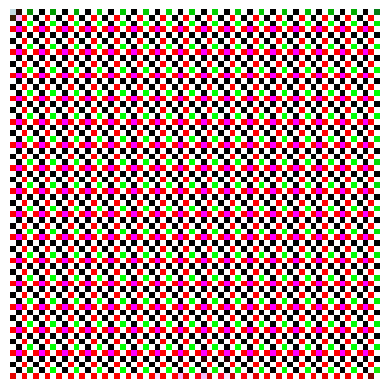

Epoch 3061, Generator Loss: 10.7613, Discriminator Loss: 0.0000
Epoch 3062, Generator Loss: 10.7203, Discriminator Loss: 0.0001
Epoch 3063, Generator Loss: 10.7445, Discriminator Loss: 0.0001
Epoch 3064, Generator Loss: 10.7500, Discriminator Loss: 0.0001
Epoch 3065, Generator Loss: 10.7505, Discriminator Loss: 0.0000
Epoch 3066, Generator Loss: 10.7144, Discriminator Loss: 0.0000
Epoch 3067, Generator Loss: 10.7552, Discriminator Loss: 0.0001
Epoch 3068, Generator Loss: 10.7399, Discriminator Loss: 0.0000
Epoch 3069, Generator Loss: 10.7324, Discriminator Loss: 0.0001
Epoch 3070, Generator Loss: 10.7222, Discriminator Loss: 0.0000


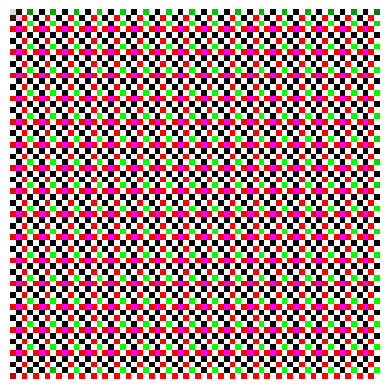

Epoch 3071, Generator Loss: 10.7331, Discriminator Loss: 0.0000
Epoch 3072, Generator Loss: 10.7096, Discriminator Loss: 0.0000
Epoch 3073, Generator Loss: 10.7379, Discriminator Loss: 0.0001
Epoch 3074, Generator Loss: 10.7224, Discriminator Loss: 0.0001
Epoch 3075, Generator Loss: 10.7227, Discriminator Loss: 0.0001
Epoch 3076, Generator Loss: 10.7181, Discriminator Loss: 0.0000
Epoch 3077, Generator Loss: 10.7121, Discriminator Loss: 0.0000
Epoch 3078, Generator Loss: 10.6765, Discriminator Loss: 0.0001
Epoch 3079, Generator Loss: 10.7017, Discriminator Loss: 0.0001
Epoch 3080, Generator Loss: 10.7296, Discriminator Loss: 0.0001


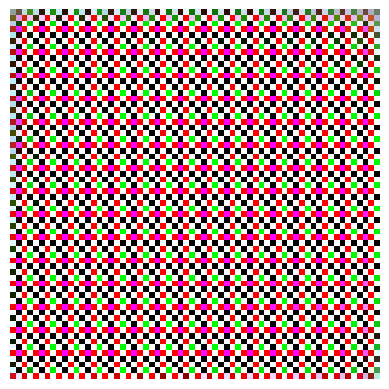

Epoch 3081, Generator Loss: 10.6849, Discriminator Loss: 0.0001
Epoch 3082, Generator Loss: 10.6633, Discriminator Loss: 0.0001
Epoch 3083, Generator Loss: 10.6541, Discriminator Loss: 0.0001
Epoch 3084, Generator Loss: 10.6867, Discriminator Loss: 0.0001
Epoch 3085, Generator Loss: 10.5947, Discriminator Loss: 0.0001
Epoch 3086, Generator Loss: 10.5719, Discriminator Loss: 0.0001
Epoch 3087, Generator Loss: 10.6119, Discriminator Loss: 0.0001
Epoch 3088, Generator Loss: 10.5372, Discriminator Loss: 0.0001
Epoch 3089, Generator Loss: 10.4305, Discriminator Loss: 0.0001
Epoch 3090, Generator Loss: 10.4271, Discriminator Loss: 0.0001


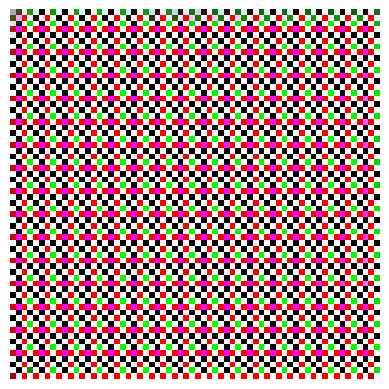

Epoch 3091, Generator Loss: 10.2117, Discriminator Loss: 0.0001
Epoch 3092, Generator Loss: 10.0069, Discriminator Loss: 0.0001
Epoch 3093, Generator Loss: 9.8606, Discriminator Loss: 0.0001
Epoch 3094, Generator Loss: 9.6858, Discriminator Loss: 0.0001
Epoch 3095, Generator Loss: 8.9052, Discriminator Loss: 0.0002
Epoch 3096, Generator Loss: 8.5775, Discriminator Loss: 0.0003
Epoch 3097, Generator Loss: 8.2260, Discriminator Loss: 0.0004
Epoch 3098, Generator Loss: 7.4947, Discriminator Loss: 0.0007
Epoch 3099, Generator Loss: 6.9329, Discriminator Loss: 0.0011
Epoch 3100, Generator Loss: 6.6334, Discriminator Loss: 0.0015


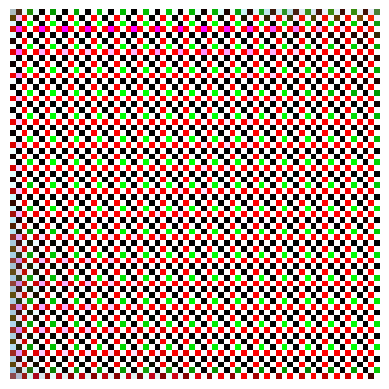

Epoch 3101, Generator Loss: 6.4291, Discriminator Loss: 0.0017
Epoch 3102, Generator Loss: 6.4202, Discriminator Loss: 0.0017
Epoch 3103, Generator Loss: 6.5753, Discriminator Loss: 0.0014
Epoch 3104, Generator Loss: 6.8514, Discriminator Loss: 0.0011
Epoch 3105, Generator Loss: 7.1407, Discriminator Loss: 0.0008
Epoch 3106, Generator Loss: 7.4144, Discriminator Loss: 0.0007
Epoch 3107, Generator Loss: 7.7414, Discriminator Loss: 0.0005
Epoch 3108, Generator Loss: 7.9864, Discriminator Loss: 0.0004
Epoch 3109, Generator Loss: 8.2283, Discriminator Loss: 0.0003
Epoch 3110, Generator Loss: 8.4784, Discriminator Loss: 0.0003


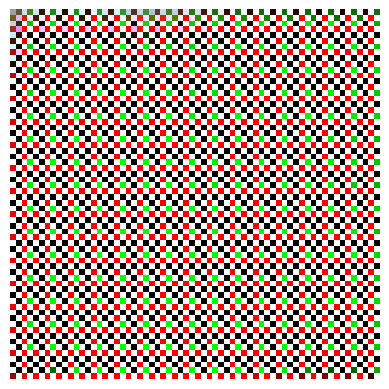

Epoch 3111, Generator Loss: 8.7040, Discriminator Loss: 0.0002
Epoch 3112, Generator Loss: 8.8832, Discriminator Loss: 0.0002
Epoch 3113, Generator Loss: 9.0891, Discriminator Loss: 0.0002
Epoch 3114, Generator Loss: 9.2358, Discriminator Loss: 0.0002
Epoch 3115, Generator Loss: 9.3984, Discriminator Loss: 0.0001
Epoch 3116, Generator Loss: 9.5404, Discriminator Loss: 0.0001
Epoch 3117, Generator Loss: 9.6337, Discriminator Loss: 0.0001
Epoch 3118, Generator Loss: 9.7322, Discriminator Loss: 0.0001
Epoch 3119, Generator Loss: 9.8411, Discriminator Loss: 0.0001
Epoch 3120, Generator Loss: 9.9265, Discriminator Loss: 0.0001


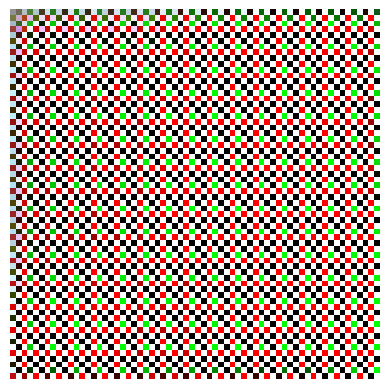

Epoch 3121, Generator Loss: 9.9596, Discriminator Loss: 0.0001
Epoch 3122, Generator Loss: 9.9489, Discriminator Loss: 0.0001
Epoch 3123, Generator Loss: 10.0051, Discriminator Loss: 0.0001
Epoch 3124, Generator Loss: 9.9710, Discriminator Loss: 0.0001
Epoch 3125, Generator Loss: 9.8143, Discriminator Loss: 0.0001
Epoch 3126, Generator Loss: 9.6475, Discriminator Loss: 0.0001
Epoch 3127, Generator Loss: 9.5380, Discriminator Loss: 0.0002
Epoch 3128, Generator Loss: 9.3024, Discriminator Loss: 0.0002
Epoch 3129, Generator Loss: 9.0140, Discriminator Loss: 0.0002
Epoch 3130, Generator Loss: 8.7562, Discriminator Loss: 0.0003


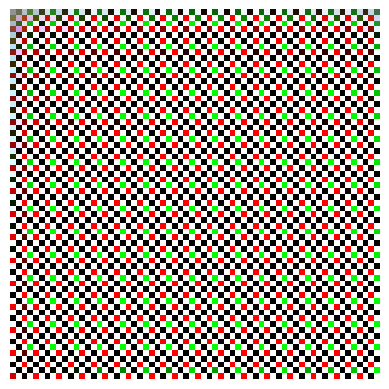

Epoch 3131, Generator Loss: 8.3715, Discriminator Loss: 0.0004
Epoch 3132, Generator Loss: 8.5177, Discriminator Loss: 0.0003
Epoch 3133, Generator Loss: 8.4372, Discriminator Loss: 0.0003
Epoch 3134, Generator Loss: 8.2151, Discriminator Loss: 0.0004
Epoch 3135, Generator Loss: 8.5370, Discriminator Loss: 0.0003
Epoch 3136, Generator Loss: 8.1856, Discriminator Loss: 0.0004
Epoch 3137, Generator Loss: 8.1821, Discriminator Loss: 0.0004
Epoch 3138, Generator Loss: 8.3256, Discriminator Loss: 0.0003
Epoch 3139, Generator Loss: 8.4324, Discriminator Loss: 0.0003
Epoch 3140, Generator Loss: 8.2368, Discriminator Loss: 0.0003


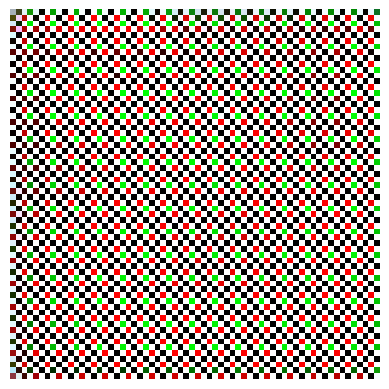

Epoch 3141, Generator Loss: 8.2649, Discriminator Loss: 0.0003
Epoch 3142, Generator Loss: 8.2903, Discriminator Loss: 0.0003
Epoch 3143, Generator Loss: 8.3321, Discriminator Loss: 0.0004
Epoch 3144, Generator Loss: 8.3751, Discriminator Loss: 0.0003
Epoch 3145, Generator Loss: 8.4729, Discriminator Loss: 0.0003
Epoch 3146, Generator Loss: 8.6428, Discriminator Loss: 0.0003
Epoch 3147, Generator Loss: 8.6651, Discriminator Loss: 0.0003
Epoch 3148, Generator Loss: 8.6779, Discriminator Loss: 0.0003
Epoch 3149, Generator Loss: 8.7303, Discriminator Loss: 0.0003
Epoch 3150, Generator Loss: 8.8220, Discriminator Loss: 0.0003


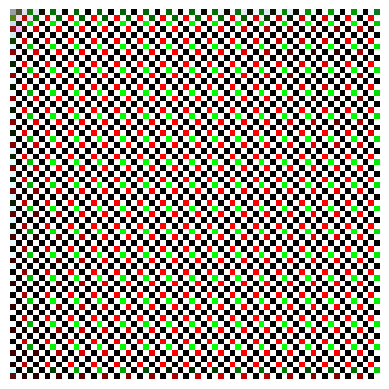

Epoch 3151, Generator Loss: 8.8155, Discriminator Loss: 0.0002
Epoch 3152, Generator Loss: 9.0380, Discriminator Loss: 0.0002
Epoch 3153, Generator Loss: 9.0724, Discriminator Loss: 0.0002
Epoch 3154, Generator Loss: 9.0950, Discriminator Loss: 0.0002
Epoch 3155, Generator Loss: 9.1082, Discriminator Loss: 0.0002
Epoch 3156, Generator Loss: 9.1877, Discriminator Loss: 0.0002
Epoch 3157, Generator Loss: 9.2206, Discriminator Loss: 0.0002
Epoch 3158, Generator Loss: 9.1854, Discriminator Loss: 0.0002
Epoch 3159, Generator Loss: 9.2870, Discriminator Loss: 0.0002
Epoch 3160, Generator Loss: 9.3433, Discriminator Loss: 0.0002


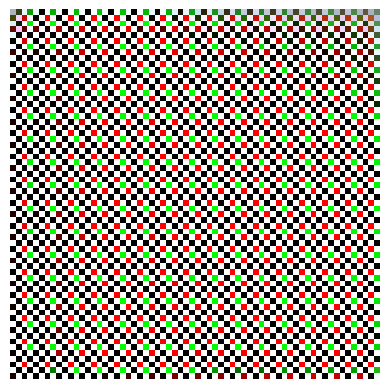

Epoch 3161, Generator Loss: 9.3328, Discriminator Loss: 0.0002
Epoch 3162, Generator Loss: 9.4346, Discriminator Loss: 0.0002
Epoch 3163, Generator Loss: 9.4748, Discriminator Loss: 0.0002
Epoch 3164, Generator Loss: 9.4541, Discriminator Loss: 0.0002
Epoch 3165, Generator Loss: 9.4797, Discriminator Loss: 0.0002
Epoch 3166, Generator Loss: 9.6454, Discriminator Loss: 0.0002
Epoch 3167, Generator Loss: 9.6390, Discriminator Loss: 0.0002
Epoch 3168, Generator Loss: 9.6230, Discriminator Loss: 0.0002
Epoch 3169, Generator Loss: 9.6475, Discriminator Loss: 0.0002
Epoch 3170, Generator Loss: 9.6376, Discriminator Loss: 0.0002


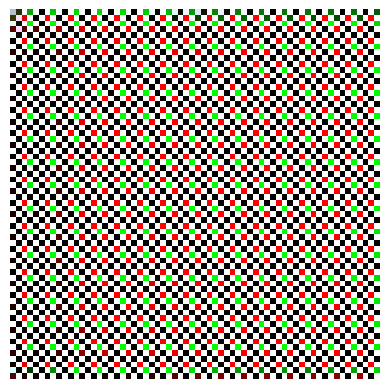

Epoch 3171, Generator Loss: 9.7495, Discriminator Loss: 0.0002
Epoch 3172, Generator Loss: 9.7724, Discriminator Loss: 0.0002
Epoch 3173, Generator Loss: 9.8123, Discriminator Loss: 0.0002
Epoch 3174, Generator Loss: 9.8262, Discriminator Loss: 0.0002
Epoch 3175, Generator Loss: 9.7274, Discriminator Loss: 0.0002
Epoch 3176, Generator Loss: 9.8687, Discriminator Loss: 0.0001
Epoch 3177, Generator Loss: 9.7610, Discriminator Loss: 0.0002
Epoch 3178, Generator Loss: 9.8766, Discriminator Loss: 0.0002
Epoch 3179, Generator Loss: 9.8122, Discriminator Loss: 0.0002
Epoch 3180, Generator Loss: 9.7906, Discriminator Loss: 0.0002


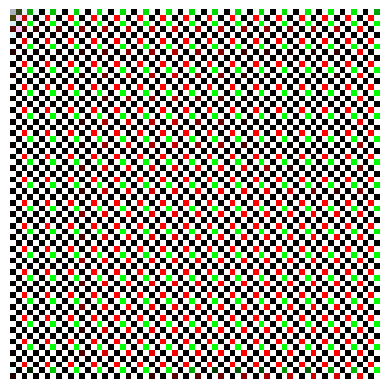

Epoch 3181, Generator Loss: 9.9645, Discriminator Loss: 0.0002
Epoch 3182, Generator Loss: 9.9331, Discriminator Loss: 0.0002
Epoch 3183, Generator Loss: 10.0055, Discriminator Loss: 0.0002
Epoch 3184, Generator Loss: 9.9434, Discriminator Loss: 0.0001
Epoch 3185, Generator Loss: 9.9174, Discriminator Loss: 0.0001
Epoch 3186, Generator Loss: 9.9351, Discriminator Loss: 0.0002
Epoch 3187, Generator Loss: 9.9406, Discriminator Loss: 0.0002
Epoch 3188, Generator Loss: 9.9846, Discriminator Loss: 0.0002
Epoch 3189, Generator Loss: 10.0052, Discriminator Loss: 0.0001
Epoch 3190, Generator Loss: 9.9757, Discriminator Loss: 0.0002


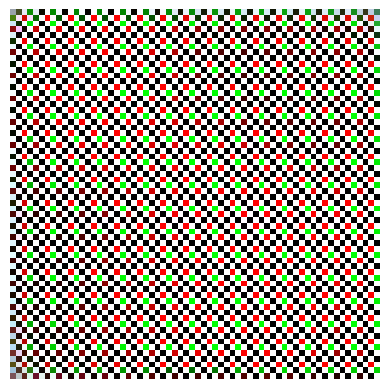

Epoch 3191, Generator Loss: 10.0810, Discriminator Loss: 0.0001
Epoch 3192, Generator Loss: 10.0856, Discriminator Loss: 0.0001
Epoch 3193, Generator Loss: 10.0510, Discriminator Loss: 0.0001
Epoch 3194, Generator Loss: 10.0673, Discriminator Loss: 0.0001
Epoch 3195, Generator Loss: 10.0364, Discriminator Loss: 0.0002
Epoch 3196, Generator Loss: 10.1017, Discriminator Loss: 0.0002
Epoch 3197, Generator Loss: 10.0799, Discriminator Loss: 0.0001
Epoch 3198, Generator Loss: 10.1024, Discriminator Loss: 0.0002
Epoch 3199, Generator Loss: 10.1410, Discriminator Loss: 0.0001
Epoch 3200, Generator Loss: 10.0991, Discriminator Loss: 0.0001


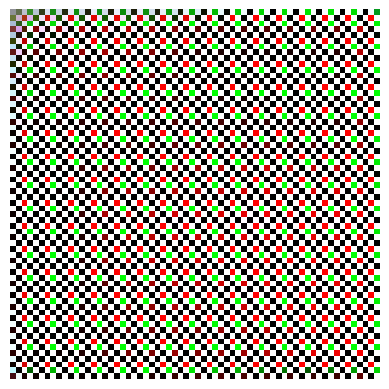

Epoch 3201, Generator Loss: 10.1350, Discriminator Loss: 0.0002
Epoch 3202, Generator Loss: 10.1599, Discriminator Loss: 0.0001
Epoch 3203, Generator Loss: 10.0495, Discriminator Loss: 0.0001
Epoch 3204, Generator Loss: 10.1035, Discriminator Loss: 0.0001
Epoch 3205, Generator Loss: 10.1196, Discriminator Loss: 0.0001
Epoch 3206, Generator Loss: 10.1725, Discriminator Loss: 0.0001
Epoch 3207, Generator Loss: 10.1151, Discriminator Loss: 0.0001
Epoch 3208, Generator Loss: 10.1541, Discriminator Loss: 0.0001
Epoch 3209, Generator Loss: 10.0918, Discriminator Loss: 0.0001
Epoch 3210, Generator Loss: 10.1182, Discriminator Loss: 0.0001


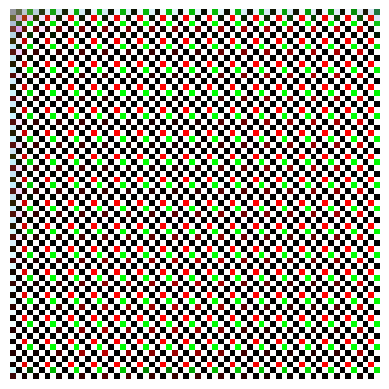

Epoch 3211, Generator Loss: 10.1024, Discriminator Loss: 0.0001
Epoch 3212, Generator Loss: 10.1392, Discriminator Loss: 0.0001
Epoch 3213, Generator Loss: 10.2554, Discriminator Loss: 0.0001
Epoch 3214, Generator Loss: 10.2237, Discriminator Loss: 0.0002
Epoch 3215, Generator Loss: 10.2362, Discriminator Loss: 0.0001
Epoch 3216, Generator Loss: 10.1156, Discriminator Loss: 0.0002
Epoch 3217, Generator Loss: 10.2249, Discriminator Loss: 0.0001
Epoch 3218, Generator Loss: 10.2391, Discriminator Loss: 0.0001
Epoch 3219, Generator Loss: 10.2780, Discriminator Loss: 0.0001
Epoch 3220, Generator Loss: 10.2030, Discriminator Loss: 0.0001


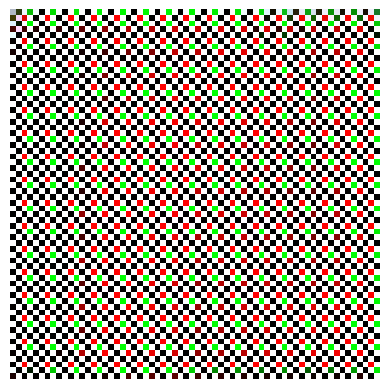

Epoch 3221, Generator Loss: 10.2281, Discriminator Loss: 0.0002
Epoch 3222, Generator Loss: 10.2718, Discriminator Loss: 0.0001
Epoch 3223, Generator Loss: 10.1698, Discriminator Loss: 0.0001
Epoch 3224, Generator Loss: 10.2839, Discriminator Loss: 0.0001
Epoch 3225, Generator Loss: 10.2670, Discriminator Loss: 0.0001
Epoch 3226, Generator Loss: 10.2534, Discriminator Loss: 0.0001
Epoch 3227, Generator Loss: 10.2465, Discriminator Loss: 0.0001
Epoch 3228, Generator Loss: 10.2091, Discriminator Loss: 0.0001
Epoch 3229, Generator Loss: 10.2373, Discriminator Loss: 0.0001
Epoch 3230, Generator Loss: 10.3183, Discriminator Loss: 0.0001


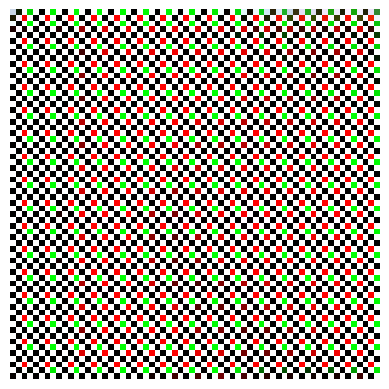

Epoch 3231, Generator Loss: 10.2744, Discriminator Loss: 0.0001
Epoch 3232, Generator Loss: 10.3245, Discriminator Loss: 0.0001
Epoch 3233, Generator Loss: 10.2990, Discriminator Loss: 0.0001
Epoch 3234, Generator Loss: 10.2352, Discriminator Loss: 0.0001
Epoch 3235, Generator Loss: 10.3347, Discriminator Loss: 0.0001
Epoch 3236, Generator Loss: 10.2506, Discriminator Loss: 0.0001
Epoch 3237, Generator Loss: 10.3837, Discriminator Loss: 0.0001
Epoch 3238, Generator Loss: 10.3142, Discriminator Loss: 0.0001
Epoch 3239, Generator Loss: 10.3837, Discriminator Loss: 0.0001
Epoch 3240, Generator Loss: 10.3351, Discriminator Loss: 0.0001


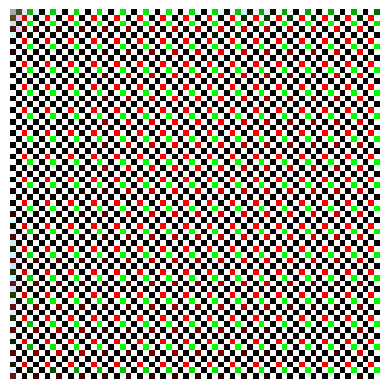

Epoch 3241, Generator Loss: 10.3049, Discriminator Loss: 0.0001
Epoch 3242, Generator Loss: 10.4164, Discriminator Loss: 0.0001
Epoch 3243, Generator Loss: 10.3568, Discriminator Loss: 0.0001
Epoch 3244, Generator Loss: 10.3434, Discriminator Loss: 0.0001
Epoch 3245, Generator Loss: 10.3881, Discriminator Loss: 0.0001
Epoch 3246, Generator Loss: 10.3733, Discriminator Loss: 0.0001
Epoch 3247, Generator Loss: 10.3603, Discriminator Loss: 0.0001
Epoch 3248, Generator Loss: 10.3203, Discriminator Loss: 0.0001
Epoch 3249, Generator Loss: 10.3622, Discriminator Loss: 0.0001
Epoch 3250, Generator Loss: 10.3455, Discriminator Loss: 0.0001


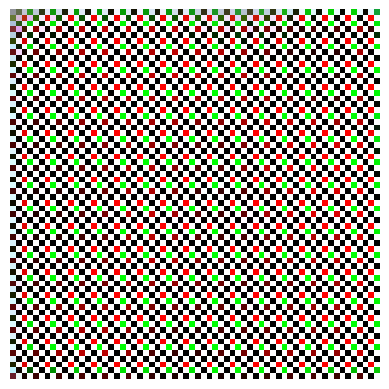

Epoch 3251, Generator Loss: 10.3488, Discriminator Loss: 0.0001
Epoch 3252, Generator Loss: 10.3317, Discriminator Loss: 0.0001
Epoch 3253, Generator Loss: 10.3784, Discriminator Loss: 0.0001
Epoch 3254, Generator Loss: 10.4400, Discriminator Loss: 0.0001
Epoch 3255, Generator Loss: 10.3290, Discriminator Loss: 0.0001
Epoch 3256, Generator Loss: 10.4048, Discriminator Loss: 0.0001
Epoch 3257, Generator Loss: 10.3864, Discriminator Loss: 0.0001
Epoch 3258, Generator Loss: 10.4025, Discriminator Loss: 0.0001
Epoch 3259, Generator Loss: 10.5023, Discriminator Loss: 0.0001
Epoch 3260, Generator Loss: 10.4333, Discriminator Loss: 0.0001


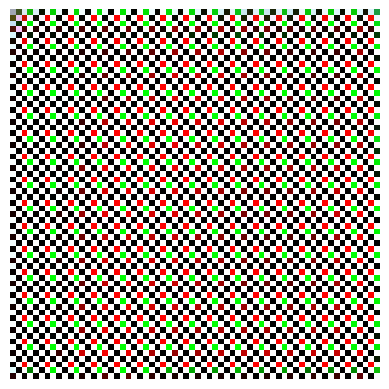

Epoch 3261, Generator Loss: 10.4225, Discriminator Loss: 0.0001
Epoch 3262, Generator Loss: 10.3763, Discriminator Loss: 0.0001
Epoch 3263, Generator Loss: 10.4450, Discriminator Loss: 0.0001
Epoch 3264, Generator Loss: 10.4983, Discriminator Loss: 0.0001
Epoch 3265, Generator Loss: 10.4003, Discriminator Loss: 0.0001
Epoch 3266, Generator Loss: 10.4171, Discriminator Loss: 0.0001
Epoch 3267, Generator Loss: 10.4268, Discriminator Loss: 0.0001
Epoch 3268, Generator Loss: 10.4045, Discriminator Loss: 0.0001
Epoch 3269, Generator Loss: 10.4570, Discriminator Loss: 0.0001
Epoch 3270, Generator Loss: 10.4476, Discriminator Loss: 0.0001


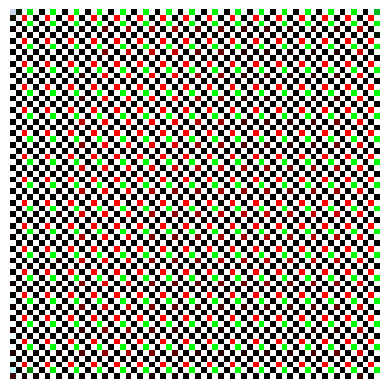

Epoch 3271, Generator Loss: 10.4993, Discriminator Loss: 0.0001
Epoch 3272, Generator Loss: 10.4571, Discriminator Loss: 0.0001
Epoch 3273, Generator Loss: 10.4153, Discriminator Loss: 0.0001
Epoch 3274, Generator Loss: 10.4719, Discriminator Loss: 0.0001
Epoch 3275, Generator Loss: 10.4823, Discriminator Loss: 0.0001
Epoch 3276, Generator Loss: 10.4834, Discriminator Loss: 0.0001
Epoch 3277, Generator Loss: 10.4714, Discriminator Loss: 0.0001
Epoch 3278, Generator Loss: 10.4577, Discriminator Loss: 0.0001
Epoch 3279, Generator Loss: 10.4805, Discriminator Loss: 0.0001
Epoch 3280, Generator Loss: 10.4161, Discriminator Loss: 0.0001


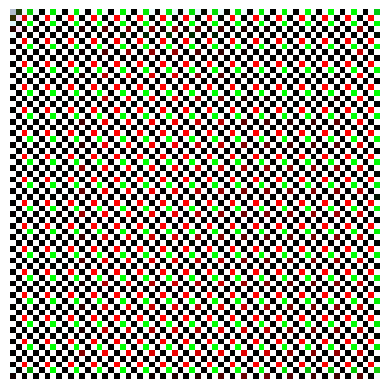

Epoch 3281, Generator Loss: 10.5027, Discriminator Loss: 0.0001
Epoch 3282, Generator Loss: 10.4609, Discriminator Loss: 0.0001
Epoch 3283, Generator Loss: 10.4874, Discriminator Loss: 0.0001
Epoch 3284, Generator Loss: 10.5326, Discriminator Loss: 0.0001
Epoch 3285, Generator Loss: 10.4231, Discriminator Loss: 0.0001
Epoch 3286, Generator Loss: 10.5021, Discriminator Loss: 0.0001
Epoch 3287, Generator Loss: 10.4711, Discriminator Loss: 0.0001
Epoch 3288, Generator Loss: 10.4462, Discriminator Loss: 0.0001
Epoch 3289, Generator Loss: 10.5439, Discriminator Loss: 0.0001
Epoch 3290, Generator Loss: 10.4772, Discriminator Loss: 0.0001


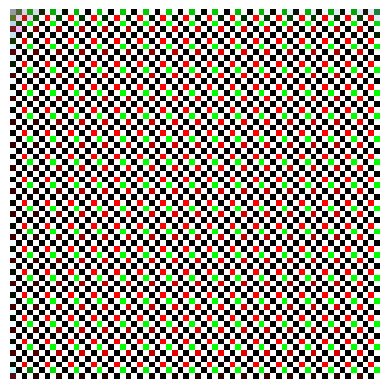

Epoch 3291, Generator Loss: 10.4992, Discriminator Loss: 0.0001
Epoch 3292, Generator Loss: 10.4987, Discriminator Loss: 0.0001
Epoch 3293, Generator Loss: 10.4984, Discriminator Loss: 0.0001
Epoch 3294, Generator Loss: 10.5586, Discriminator Loss: 0.0001
Epoch 3295, Generator Loss: 10.4866, Discriminator Loss: 0.0001
Epoch 3296, Generator Loss: 10.5815, Discriminator Loss: 0.0001
Epoch 3297, Generator Loss: 10.4901, Discriminator Loss: 0.0001
Epoch 3298, Generator Loss: 10.5378, Discriminator Loss: 0.0001
Epoch 3299, Generator Loss: 10.5682, Discriminator Loss: 0.0001
Epoch 3300, Generator Loss: 10.4875, Discriminator Loss: 0.0001


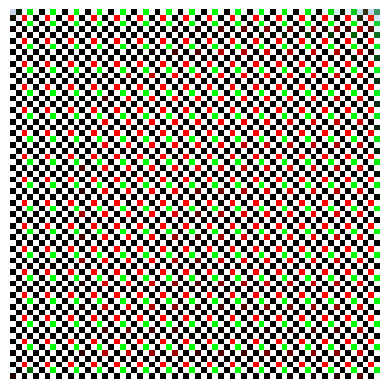

Epoch 3301, Generator Loss: 10.5156, Discriminator Loss: 0.0001
Epoch 3302, Generator Loss: 10.5246, Discriminator Loss: 0.0001
Epoch 3303, Generator Loss: 10.6120, Discriminator Loss: 0.0001
Epoch 3304, Generator Loss: 10.5449, Discriminator Loss: 0.0001
Epoch 3305, Generator Loss: 10.5369, Discriminator Loss: 0.0001
Epoch 3306, Generator Loss: 10.5635, Discriminator Loss: 0.0001
Epoch 3307, Generator Loss: 10.6281, Discriminator Loss: 0.0001
Epoch 3308, Generator Loss: 10.5873, Discriminator Loss: 0.0001
Epoch 3309, Generator Loss: 10.5655, Discriminator Loss: 0.0001
Epoch 3310, Generator Loss: 10.5786, Discriminator Loss: 0.0001


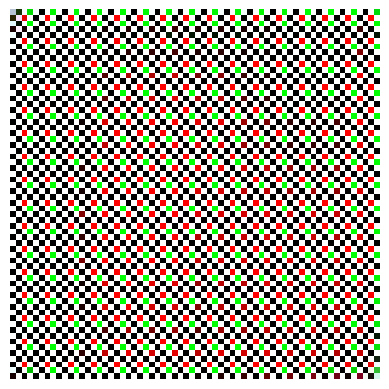

Epoch 3311, Generator Loss: 10.5862, Discriminator Loss: 0.0001
Epoch 3312, Generator Loss: 10.5947, Discriminator Loss: 0.0001
Epoch 3313, Generator Loss: 10.6056, Discriminator Loss: 0.0001
Epoch 3314, Generator Loss: 10.5952, Discriminator Loss: 0.0001
Epoch 3315, Generator Loss: 10.5342, Discriminator Loss: 0.0001
Epoch 3316, Generator Loss: 10.5823, Discriminator Loss: 0.0001
Epoch 3317, Generator Loss: 10.6305, Discriminator Loss: 0.0001
Epoch 3318, Generator Loss: 10.6147, Discriminator Loss: 0.0001
Epoch 3319, Generator Loss: 10.5908, Discriminator Loss: 0.0001
Epoch 3320, Generator Loss: 10.6243, Discriminator Loss: 0.0001


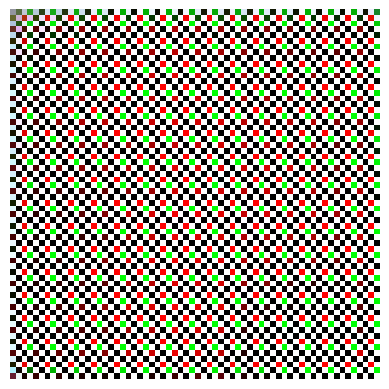

Epoch 3321, Generator Loss: 10.6054, Discriminator Loss: 0.0001
Epoch 3322, Generator Loss: 10.6080, Discriminator Loss: 0.0001
Epoch 3323, Generator Loss: 10.5701, Discriminator Loss: 0.0001
Epoch 3324, Generator Loss: 10.6112, Discriminator Loss: 0.0001
Epoch 3325, Generator Loss: 10.6167, Discriminator Loss: 0.0001
Epoch 3326, Generator Loss: 10.6825, Discriminator Loss: 0.0001
Epoch 3327, Generator Loss: 10.6219, Discriminator Loss: 0.0001
Epoch 3328, Generator Loss: 10.6232, Discriminator Loss: 0.0001
Epoch 3329, Generator Loss: 10.6596, Discriminator Loss: 0.0001
Epoch 3330, Generator Loss: 10.5846, Discriminator Loss: 0.0001


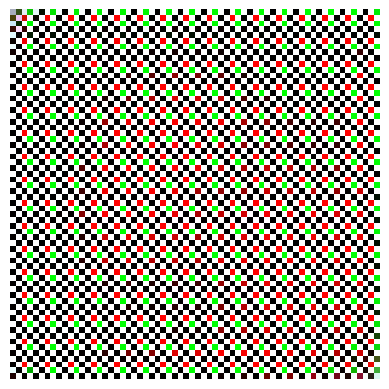

Epoch 3331, Generator Loss: 10.6335, Discriminator Loss: 0.0001
Epoch 3332, Generator Loss: 10.6234, Discriminator Loss: 0.0001
Epoch 3333, Generator Loss: 10.6109, Discriminator Loss: 0.0001
Epoch 3334, Generator Loss: 10.6180, Discriminator Loss: 0.0001
Epoch 3335, Generator Loss: 10.5714, Discriminator Loss: 0.0001
Epoch 3336, Generator Loss: 10.6580, Discriminator Loss: 0.0001
Epoch 3337, Generator Loss: 10.5542, Discriminator Loss: 0.0001
Epoch 3338, Generator Loss: 10.6919, Discriminator Loss: 0.0001
Epoch 3339, Generator Loss: 10.6177, Discriminator Loss: 0.0001
Epoch 3340, Generator Loss: 10.6441, Discriminator Loss: 0.0001


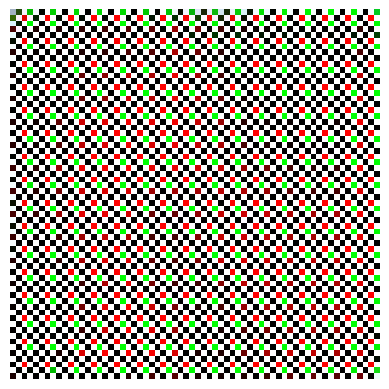

Epoch 3341, Generator Loss: 10.6294, Discriminator Loss: 0.0001
Epoch 3342, Generator Loss: 10.6327, Discriminator Loss: 0.0001
Epoch 3343, Generator Loss: 10.6575, Discriminator Loss: 0.0001
Epoch 3344, Generator Loss: 10.6857, Discriminator Loss: 0.0001
Epoch 3345, Generator Loss: 10.7278, Discriminator Loss: 0.0001
Epoch 3346, Generator Loss: 10.6641, Discriminator Loss: 0.0001
Epoch 3347, Generator Loss: 10.6530, Discriminator Loss: 0.0001
Epoch 3348, Generator Loss: 10.7467, Discriminator Loss: 0.0001
Epoch 3349, Generator Loss: 10.6413, Discriminator Loss: 0.0001
Epoch 3350, Generator Loss: 10.7274, Discriminator Loss: 0.0001


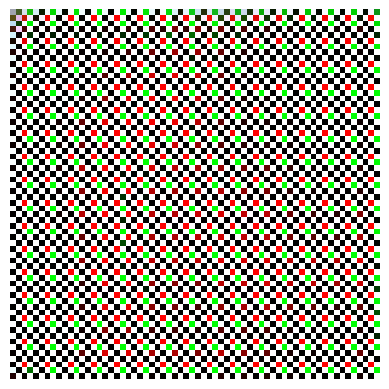

Epoch 3351, Generator Loss: 10.6976, Discriminator Loss: 0.0001
Epoch 3352, Generator Loss: 10.7306, Discriminator Loss: 0.0001
Epoch 3353, Generator Loss: 10.6524, Discriminator Loss: 0.0001
Epoch 3354, Generator Loss: 10.7828, Discriminator Loss: 0.0001
Epoch 3355, Generator Loss: 10.7326, Discriminator Loss: 0.0001
Epoch 3356, Generator Loss: 10.7299, Discriminator Loss: 0.0001
Epoch 3357, Generator Loss: 10.7448, Discriminator Loss: 0.0001
Epoch 3358, Generator Loss: 10.7374, Discriminator Loss: 0.0001
Epoch 3359, Generator Loss: 10.7267, Discriminator Loss: 0.0001
Epoch 3360, Generator Loss: 10.7001, Discriminator Loss: 0.0001


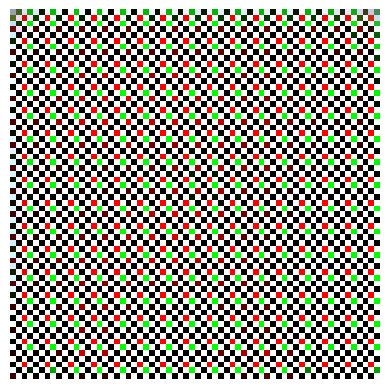

Epoch 3361, Generator Loss: 10.7440, Discriminator Loss: 0.0001
Epoch 3362, Generator Loss: 10.7413, Discriminator Loss: 0.0001
Epoch 3363, Generator Loss: 10.7033, Discriminator Loss: 0.0001
Epoch 3364, Generator Loss: 10.7182, Discriminator Loss: 0.0001
Epoch 3365, Generator Loss: 10.6860, Discriminator Loss: 0.0001
Epoch 3366, Generator Loss: 10.7017, Discriminator Loss: 0.0001
Epoch 3367, Generator Loss: 10.7495, Discriminator Loss: 0.0001
Epoch 3368, Generator Loss: 10.7425, Discriminator Loss: 0.0001
Epoch 3369, Generator Loss: 10.7516, Discriminator Loss: 0.0001
Epoch 3370, Generator Loss: 10.7749, Discriminator Loss: 0.0001


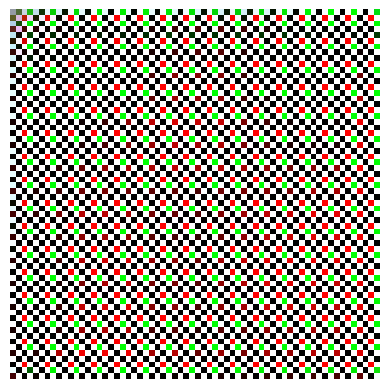

Epoch 3371, Generator Loss: 10.7514, Discriminator Loss: 0.0001
Epoch 3372, Generator Loss: 10.7524, Discriminator Loss: 0.0001
Epoch 3373, Generator Loss: 10.7111, Discriminator Loss: 0.0001
Epoch 3374, Generator Loss: 10.7221, Discriminator Loss: 0.0001
Epoch 3375, Generator Loss: 10.8073, Discriminator Loss: 0.0001
Epoch 3376, Generator Loss: 10.7412, Discriminator Loss: 0.0001
Epoch 3377, Generator Loss: 10.7777, Discriminator Loss: 0.0001
Epoch 3378, Generator Loss: 10.7573, Discriminator Loss: 0.0001
Epoch 3379, Generator Loss: 10.7675, Discriminator Loss: 0.0001
Epoch 3380, Generator Loss: 10.7602, Discriminator Loss: 0.0001


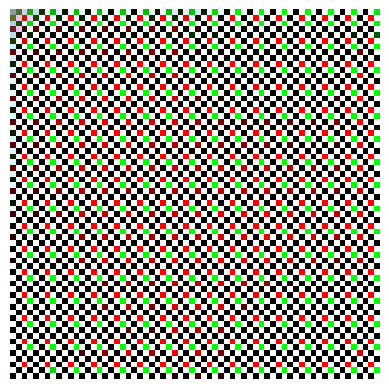

Epoch 3381, Generator Loss: 10.7998, Discriminator Loss: 0.0001
Epoch 3382, Generator Loss: 10.7536, Discriminator Loss: 0.0001
Epoch 3383, Generator Loss: 10.7575, Discriminator Loss: 0.0001
Epoch 3384, Generator Loss: 10.7727, Discriminator Loss: 0.0001
Epoch 3385, Generator Loss: 10.7894, Discriminator Loss: 0.0001
Epoch 3386, Generator Loss: 10.7574, Discriminator Loss: 0.0001
Epoch 3387, Generator Loss: 10.7495, Discriminator Loss: 0.0001
Epoch 3388, Generator Loss: 10.8641, Discriminator Loss: 0.0001
Epoch 3389, Generator Loss: 10.8009, Discriminator Loss: 0.0001
Epoch 3390, Generator Loss: 10.7872, Discriminator Loss: 0.0001


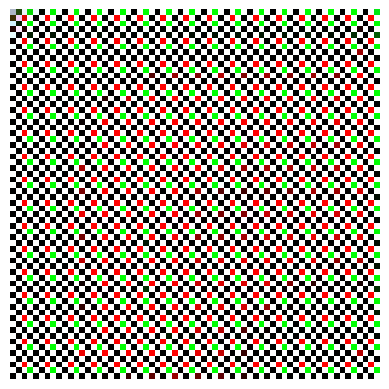

Epoch 3391, Generator Loss: 10.7586, Discriminator Loss: 0.0001
Epoch 3392, Generator Loss: 10.8045, Discriminator Loss: 0.0001
Epoch 3393, Generator Loss: 10.8371, Discriminator Loss: 0.0001
Epoch 3394, Generator Loss: 10.7741, Discriminator Loss: 0.0001
Epoch 3395, Generator Loss: 10.8431, Discriminator Loss: 0.0001
Epoch 3396, Generator Loss: 10.8276, Discriminator Loss: 0.0001
Epoch 3397, Generator Loss: 10.8221, Discriminator Loss: 0.0001
Epoch 3398, Generator Loss: 10.7811, Discriminator Loss: 0.0001
Epoch 3399, Generator Loss: 10.7877, Discriminator Loss: 0.0001
Epoch 3400, Generator Loss: 10.7749, Discriminator Loss: 0.0001


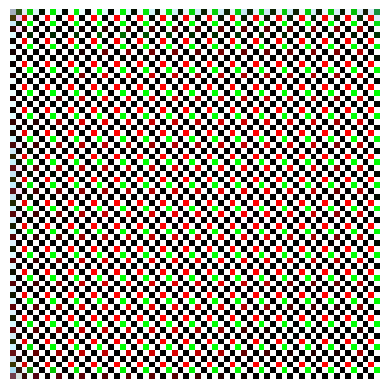

Epoch 3401, Generator Loss: 10.8374, Discriminator Loss: 0.0001
Epoch 3402, Generator Loss: 10.8487, Discriminator Loss: 0.0001
Epoch 3403, Generator Loss: 10.8768, Discriminator Loss: 0.0001
Epoch 3404, Generator Loss: 10.8437, Discriminator Loss: 0.0001
Epoch 3405, Generator Loss: 10.8508, Discriminator Loss: 0.0001
Epoch 3406, Generator Loss: 10.8606, Discriminator Loss: 0.0001
Epoch 3407, Generator Loss: 10.8610, Discriminator Loss: 0.0001
Epoch 3408, Generator Loss: 10.8749, Discriminator Loss: 0.0001
Epoch 3409, Generator Loss: 10.8719, Discriminator Loss: 0.0001
Epoch 3410, Generator Loss: 10.8438, Discriminator Loss: 0.0001


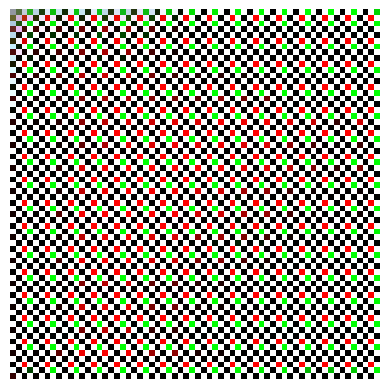

Epoch 3411, Generator Loss: 10.9098, Discriminator Loss: 0.0001
Epoch 3412, Generator Loss: 10.8456, Discriminator Loss: 0.0001
Epoch 3413, Generator Loss: 10.9205, Discriminator Loss: 0.0001
Epoch 3414, Generator Loss: 10.8436, Discriminator Loss: 0.0001
Epoch 3415, Generator Loss: 10.8813, Discriminator Loss: 0.0001
Epoch 3416, Generator Loss: 10.9263, Discriminator Loss: 0.0001
Epoch 3417, Generator Loss: 10.8225, Discriminator Loss: 0.0001
Epoch 3418, Generator Loss: 10.9015, Discriminator Loss: 0.0001
Epoch 3419, Generator Loss: 10.8440, Discriminator Loss: 0.0001
Epoch 3420, Generator Loss: 10.8946, Discriminator Loss: 0.0001


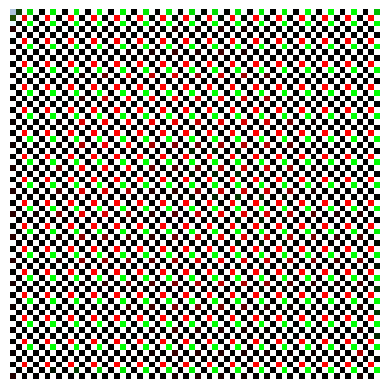

Epoch 3421, Generator Loss: 10.9203, Discriminator Loss: 0.0001
Epoch 3422, Generator Loss: 10.9275, Discriminator Loss: 0.0001
Epoch 3423, Generator Loss: 10.8869, Discriminator Loss: 0.0001
Epoch 3424, Generator Loss: 10.8996, Discriminator Loss: 0.0001
Epoch 3425, Generator Loss: 10.9439, Discriminator Loss: 0.0001
Epoch 3426, Generator Loss: 10.8616, Discriminator Loss: 0.0001
Epoch 3427, Generator Loss: 10.8405, Discriminator Loss: 0.0001
Epoch 3428, Generator Loss: 10.8585, Discriminator Loss: 0.0001
Epoch 3429, Generator Loss: 10.9040, Discriminator Loss: 0.0001
Epoch 3430, Generator Loss: 10.8777, Discriminator Loss: 0.0001


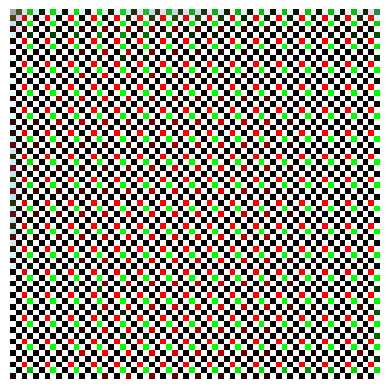

Epoch 3431, Generator Loss: 10.8788, Discriminator Loss: 0.0001
Epoch 3432, Generator Loss: 10.8857, Discriminator Loss: 0.0001
Epoch 3433, Generator Loss: 10.9548, Discriminator Loss: 0.0001
Epoch 3434, Generator Loss: 10.9387, Discriminator Loss: 0.0001
Epoch 3435, Generator Loss: 10.9801, Discriminator Loss: 0.0001
Epoch 3436, Generator Loss: 10.9399, Discriminator Loss: 0.0001
Epoch 3437, Generator Loss: 10.9485, Discriminator Loss: 0.0001
Epoch 3438, Generator Loss: 10.9106, Discriminator Loss: 0.0001
Epoch 3439, Generator Loss: 10.9508, Discriminator Loss: 0.0001
Epoch 3440, Generator Loss: 10.8537, Discriminator Loss: 0.0001


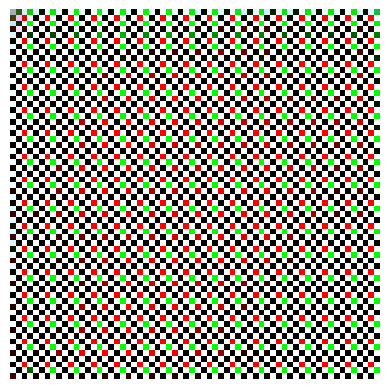

Epoch 3441, Generator Loss: 10.9014, Discriminator Loss: 0.0001
Epoch 3442, Generator Loss: 10.8872, Discriminator Loss: 0.0001
Epoch 3443, Generator Loss: 10.9163, Discriminator Loss: 0.0001
Epoch 3444, Generator Loss: 10.8913, Discriminator Loss: 0.0001
Epoch 3445, Generator Loss: 10.9167, Discriminator Loss: 0.0001
Epoch 3446, Generator Loss: 10.9447, Discriminator Loss: 0.0001
Epoch 3447, Generator Loss: 10.9227, Discriminator Loss: 0.0001
Epoch 3448, Generator Loss: 10.9518, Discriminator Loss: 0.0001
Epoch 3449, Generator Loss: 10.9444, Discriminator Loss: 0.0001
Epoch 3450, Generator Loss: 10.9405, Discriminator Loss: 0.0001


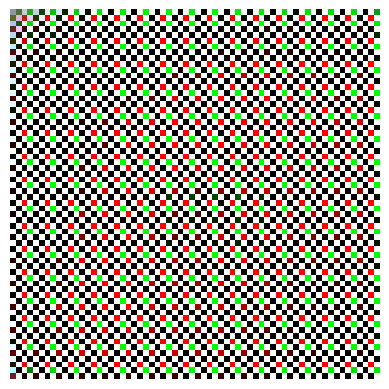

Epoch 3451, Generator Loss: 10.9435, Discriminator Loss: 0.0001
Epoch 3452, Generator Loss: 10.8928, Discriminator Loss: 0.0001
Epoch 3453, Generator Loss: 10.9460, Discriminator Loss: 0.0001
Epoch 3454, Generator Loss: 10.9662, Discriminator Loss: 0.0001
Epoch 3455, Generator Loss: 10.9644, Discriminator Loss: 0.0001
Epoch 3456, Generator Loss: 10.8965, Discriminator Loss: 0.0001
Epoch 3457, Generator Loss: 10.9451, Discriminator Loss: 0.0001
Epoch 3458, Generator Loss: 11.0184, Discriminator Loss: 0.0001
Epoch 3459, Generator Loss: 10.9748, Discriminator Loss: 0.0001
Epoch 3460, Generator Loss: 10.9145, Discriminator Loss: 0.0001


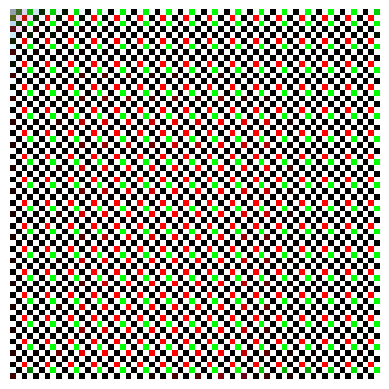

Epoch 3461, Generator Loss: 11.0146, Discriminator Loss: 0.0001
Epoch 3462, Generator Loss: 10.9385, Discriminator Loss: 0.0001
Epoch 3463, Generator Loss: 11.0135, Discriminator Loss: 0.0001
Epoch 3464, Generator Loss: 10.9056, Discriminator Loss: 0.0001
Epoch 3465, Generator Loss: 10.9869, Discriminator Loss: 0.0001
Epoch 3466, Generator Loss: 11.0017, Discriminator Loss: 0.0001
Epoch 3467, Generator Loss: 10.9888, Discriminator Loss: 0.0001
Epoch 3468, Generator Loss: 10.9555, Discriminator Loss: 0.0001
Epoch 3469, Generator Loss: 10.9288, Discriminator Loss: 0.0001
Epoch 3470, Generator Loss: 10.9805, Discriminator Loss: 0.0001


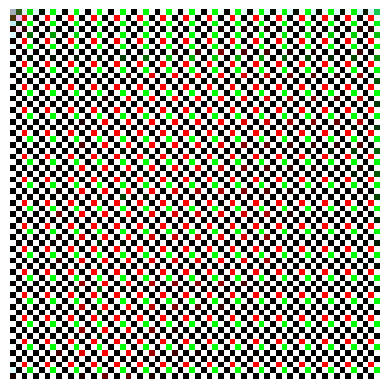

Epoch 3471, Generator Loss: 10.9738, Discriminator Loss: 0.0001
Epoch 3472, Generator Loss: 10.9408, Discriminator Loss: 0.0001
Epoch 3473, Generator Loss: 10.9939, Discriminator Loss: 0.0001
Epoch 3474, Generator Loss: 10.9236, Discriminator Loss: 0.0001
Epoch 3475, Generator Loss: 10.9810, Discriminator Loss: 0.0001
Epoch 3476, Generator Loss: 10.9266, Discriminator Loss: 0.0001
Epoch 3477, Generator Loss: 10.9569, Discriminator Loss: 0.0001
Epoch 3478, Generator Loss: 10.9216, Discriminator Loss: 0.0001
Epoch 3479, Generator Loss: 10.8945, Discriminator Loss: 0.0001
Epoch 3480, Generator Loss: 11.0095, Discriminator Loss: 0.0001


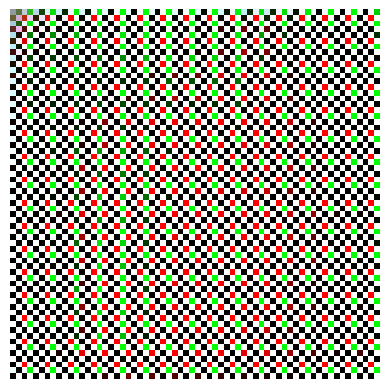

Epoch 3481, Generator Loss: 10.9187, Discriminator Loss: 0.0001
Epoch 3482, Generator Loss: 10.9569, Discriminator Loss: 0.0001
Epoch 3483, Generator Loss: 10.9666, Discriminator Loss: 0.0001
Epoch 3484, Generator Loss: 10.8577, Discriminator Loss: 0.0001
Epoch 3485, Generator Loss: 11.0024, Discriminator Loss: 0.0001
Epoch 3486, Generator Loss: 10.9030, Discriminator Loss: 0.0001
Epoch 3487, Generator Loss: 10.8419, Discriminator Loss: 0.0001
Epoch 3488, Generator Loss: 10.9093, Discriminator Loss: 0.0001
Epoch 3489, Generator Loss: 10.9949, Discriminator Loss: 0.0001
Epoch 3490, Generator Loss: 10.9790, Discriminator Loss: 0.0001


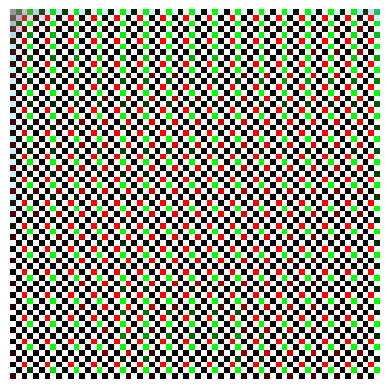

Epoch 3491, Generator Loss: 10.8845, Discriminator Loss: 0.0001
Epoch 3492, Generator Loss: 10.8896, Discriminator Loss: 0.0001
Epoch 3493, Generator Loss: 10.8348, Discriminator Loss: 0.0001
Epoch 3494, Generator Loss: 10.8682, Discriminator Loss: 0.0001
Epoch 3495, Generator Loss: 10.9592, Discriminator Loss: 0.0001
Epoch 3496, Generator Loss: 10.8880, Discriminator Loss: 0.0001
Epoch 3497, Generator Loss: 10.8929, Discriminator Loss: 0.0001
Epoch 3498, Generator Loss: 10.9459, Discriminator Loss: 0.0001
Epoch 3499, Generator Loss: 10.9451, Discriminator Loss: 0.0001
Epoch 3500, Generator Loss: 10.9064, Discriminator Loss: 0.0001


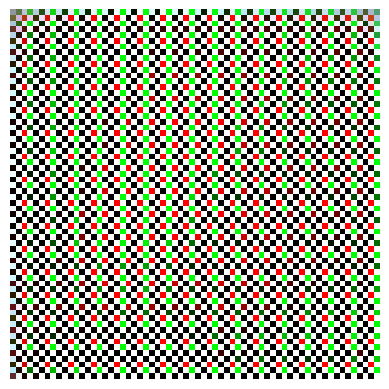

Epoch 3501, Generator Loss: 10.8894, Discriminator Loss: 0.0001
Epoch 3502, Generator Loss: 10.9069, Discriminator Loss: 0.0001
Epoch 3503, Generator Loss: 10.9011, Discriminator Loss: 0.0001
Epoch 3504, Generator Loss: 10.8823, Discriminator Loss: 0.0001
Epoch 3505, Generator Loss: 10.8401, Discriminator Loss: 0.0001
Epoch 3506, Generator Loss: 10.8244, Discriminator Loss: 0.0001
Epoch 3507, Generator Loss: 10.7544, Discriminator Loss: 0.0001
Epoch 3508, Generator Loss: 10.8445, Discriminator Loss: 0.0001
Epoch 3509, Generator Loss: 10.7894, Discriminator Loss: 0.0001
Epoch 3510, Generator Loss: 10.8124, Discriminator Loss: 0.0001


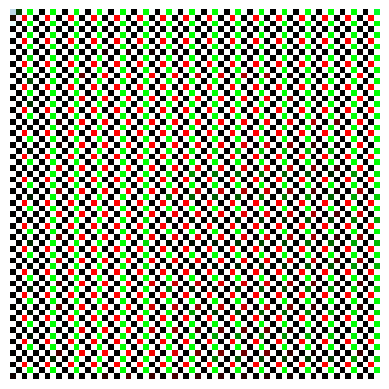

Epoch 3511, Generator Loss: 10.7735, Discriminator Loss: 0.0001
Epoch 3512, Generator Loss: 10.7775, Discriminator Loss: 0.0001
Epoch 3513, Generator Loss: 10.7736, Discriminator Loss: 0.0001
Epoch 3514, Generator Loss: 10.7269, Discriminator Loss: 0.0001
Epoch 3515, Generator Loss: 10.6139, Discriminator Loss: 0.0001
Epoch 3516, Generator Loss: 10.6275, Discriminator Loss: 0.0001
Epoch 3517, Generator Loss: 10.5227, Discriminator Loss: 0.0001
Epoch 3518, Generator Loss: 10.4794, Discriminator Loss: 0.0001
Epoch 3519, Generator Loss: 10.5240, Discriminator Loss: 0.0001
Epoch 3520, Generator Loss: 10.4630, Discriminator Loss: 0.0001


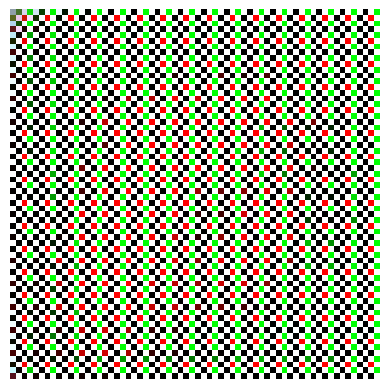

Epoch 3521, Generator Loss: 10.4321, Discriminator Loss: 0.0001
Epoch 3522, Generator Loss: 10.4160, Discriminator Loss: 0.0001
Epoch 3523, Generator Loss: 10.4233, Discriminator Loss: 0.0001
Epoch 3524, Generator Loss: 10.3930, Discriminator Loss: 0.0001
Epoch 3525, Generator Loss: 10.4031, Discriminator Loss: 0.0001
Epoch 3526, Generator Loss: 10.4105, Discriminator Loss: 0.0001
Epoch 3527, Generator Loss: 10.4312, Discriminator Loss: 0.0001
Epoch 3528, Generator Loss: 10.4546, Discriminator Loss: 0.0001
Epoch 3529, Generator Loss: 10.4563, Discriminator Loss: 0.0001
Epoch 3530, Generator Loss: 10.4658, Discriminator Loss: 0.0001


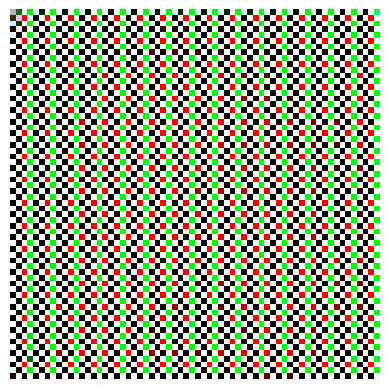

Epoch 3531, Generator Loss: 10.4759, Discriminator Loss: 0.0001
Epoch 3532, Generator Loss: 10.4976, Discriminator Loss: 0.0001
Epoch 3533, Generator Loss: 10.4801, Discriminator Loss: 0.0001
Epoch 3534, Generator Loss: 10.5238, Discriminator Loss: 0.0001
Epoch 3535, Generator Loss: 10.5145, Discriminator Loss: 0.0001
Epoch 3536, Generator Loss: 10.5322, Discriminator Loss: 0.0001
Epoch 3537, Generator Loss: 10.5572, Discriminator Loss: 0.0001
Epoch 3538, Generator Loss: 10.5427, Discriminator Loss: 0.0001
Epoch 3539, Generator Loss: 10.5827, Discriminator Loss: 0.0001
Epoch 3540, Generator Loss: 10.6227, Discriminator Loss: 0.0001


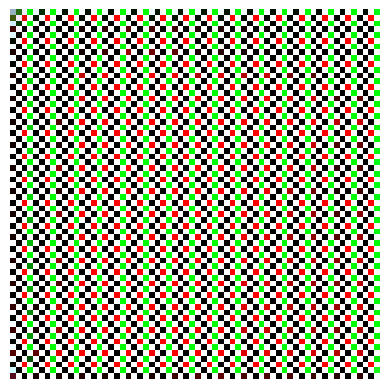

Epoch 3541, Generator Loss: 10.5972, Discriminator Loss: 0.0001
Epoch 3542, Generator Loss: 10.5849, Discriminator Loss: 0.0001
Epoch 3543, Generator Loss: 10.5830, Discriminator Loss: 0.0001
Epoch 3544, Generator Loss: 10.6008, Discriminator Loss: 0.0001
Epoch 3545, Generator Loss: 10.6169, Discriminator Loss: 0.0001
Epoch 3546, Generator Loss: 10.6685, Discriminator Loss: 0.0001
Epoch 3547, Generator Loss: 10.6530, Discriminator Loss: 0.0001
Epoch 3548, Generator Loss: 10.6218, Discriminator Loss: 0.0001
Epoch 3549, Generator Loss: 10.6550, Discriminator Loss: 0.0001
Epoch 3550, Generator Loss: 10.6617, Discriminator Loss: 0.0001


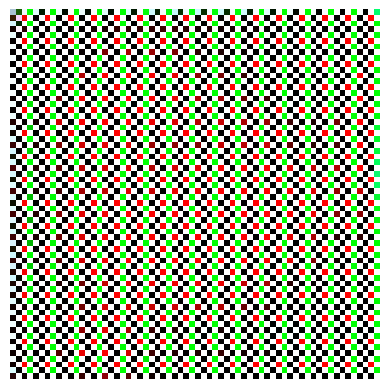

Epoch 3551, Generator Loss: 10.6544, Discriminator Loss: 0.0001
Epoch 3552, Generator Loss: 10.6834, Discriminator Loss: 0.0001
Epoch 3553, Generator Loss: 10.6754, Discriminator Loss: 0.0001
Epoch 3554, Generator Loss: 10.7009, Discriminator Loss: 0.0001
Epoch 3555, Generator Loss: 10.7291, Discriminator Loss: 0.0001
Epoch 3556, Generator Loss: 10.7085, Discriminator Loss: 0.0001
Epoch 3557, Generator Loss: 10.6719, Discriminator Loss: 0.0001
Epoch 3558, Generator Loss: 10.7223, Discriminator Loss: 0.0001
Epoch 3559, Generator Loss: 10.7356, Discriminator Loss: 0.0001
Epoch 3560, Generator Loss: 10.7362, Discriminator Loss: 0.0001


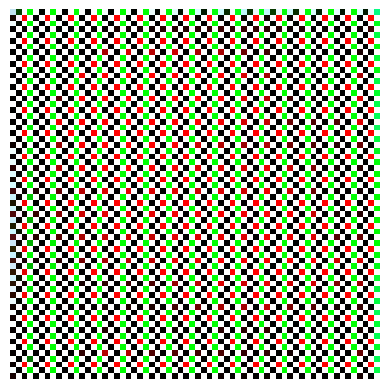

Epoch 3561, Generator Loss: 10.7625, Discriminator Loss: 0.0001
Epoch 3562, Generator Loss: 10.7601, Discriminator Loss: 0.0001
Epoch 3563, Generator Loss: 10.7516, Discriminator Loss: 0.0001
Epoch 3564, Generator Loss: 10.7391, Discriminator Loss: 0.0001
Epoch 3565, Generator Loss: 10.7330, Discriminator Loss: 0.0001
Epoch 3566, Generator Loss: 10.7367, Discriminator Loss: 0.0001
Epoch 3567, Generator Loss: 10.7557, Discriminator Loss: 0.0001
Epoch 3568, Generator Loss: 10.7648, Discriminator Loss: 0.0001
Epoch 3569, Generator Loss: 10.7675, Discriminator Loss: 0.0001
Epoch 3570, Generator Loss: 10.7948, Discriminator Loss: 0.0001


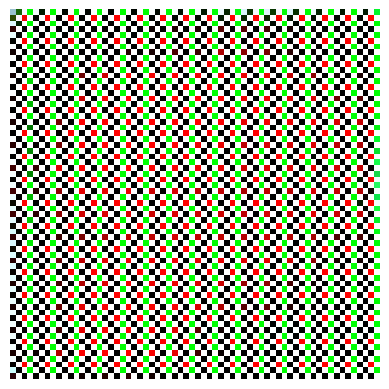

Epoch 3571, Generator Loss: 10.7253, Discriminator Loss: 0.0001
Epoch 3572, Generator Loss: 10.7804, Discriminator Loss: 0.0001
Epoch 3573, Generator Loss: 10.7538, Discriminator Loss: 0.0001
Epoch 3574, Generator Loss: 10.7379, Discriminator Loss: 0.0001
Epoch 3575, Generator Loss: 10.7582, Discriminator Loss: 0.0001
Epoch 3576, Generator Loss: 10.7661, Discriminator Loss: 0.0001
Epoch 3577, Generator Loss: 10.6932, Discriminator Loss: 0.0001
Epoch 3578, Generator Loss: 10.7583, Discriminator Loss: 0.0001
Epoch 3579, Generator Loss: 10.7529, Discriminator Loss: 0.0001
Epoch 3580, Generator Loss: 10.7260, Discriminator Loss: 0.0001


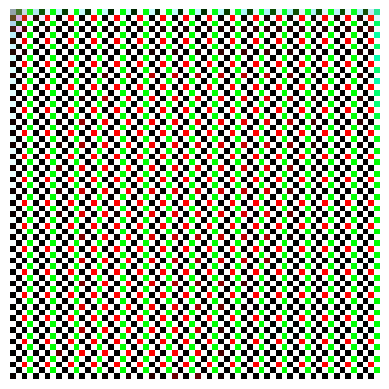

Epoch 3581, Generator Loss: 10.7849, Discriminator Loss: 0.0001
Epoch 3582, Generator Loss: 10.7751, Discriminator Loss: 0.0001
Epoch 3583, Generator Loss: 10.7855, Discriminator Loss: 0.0001
Epoch 3584, Generator Loss: 10.7654, Discriminator Loss: 0.0001
Epoch 3585, Generator Loss: 10.7880, Discriminator Loss: 0.0001
Epoch 3586, Generator Loss: 10.7591, Discriminator Loss: 0.0001
Epoch 3587, Generator Loss: 10.7223, Discriminator Loss: 0.0001
Epoch 3588, Generator Loss: 10.7984, Discriminator Loss: 0.0001
Epoch 3589, Generator Loss: 10.7420, Discriminator Loss: 0.0001
Epoch 3590, Generator Loss: 10.7595, Discriminator Loss: 0.0001


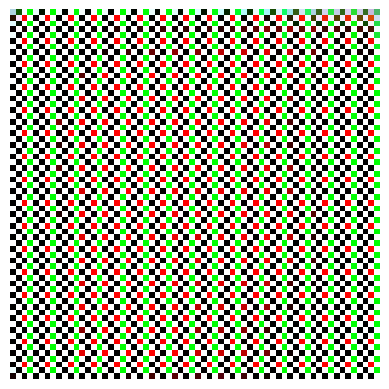

Epoch 3591, Generator Loss: 10.7383, Discriminator Loss: 0.0001
Epoch 3592, Generator Loss: 10.7567, Discriminator Loss: 0.0001
Epoch 3593, Generator Loss: 10.7288, Discriminator Loss: 0.0001
Epoch 3594, Generator Loss: 10.7884, Discriminator Loss: 0.0001
Epoch 3595, Generator Loss: 10.8101, Discriminator Loss: 0.0001
Epoch 3596, Generator Loss: 10.8297, Discriminator Loss: 0.0001
Epoch 3597, Generator Loss: 10.8081, Discriminator Loss: 0.0001
Epoch 3598, Generator Loss: 10.7682, Discriminator Loss: 0.0001
Epoch 3599, Generator Loss: 10.7664, Discriminator Loss: 0.0001
Epoch 3600, Generator Loss: 10.7460, Discriminator Loss: 0.0001


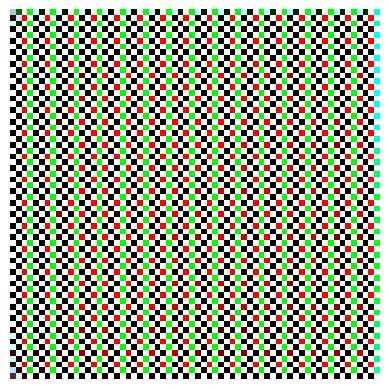

Epoch 3601, Generator Loss: 10.7458, Discriminator Loss: 0.0001
Epoch 3602, Generator Loss: 10.7021, Discriminator Loss: 0.0001
Epoch 3603, Generator Loss: 10.8053, Discriminator Loss: 0.0001
Epoch 3604, Generator Loss: 10.6579, Discriminator Loss: 0.0001
Epoch 3605, Generator Loss: 10.6768, Discriminator Loss: 0.0001
Epoch 3606, Generator Loss: 10.6255, Discriminator Loss: 0.0001
Epoch 3607, Generator Loss: 10.6799, Discriminator Loss: 0.0001
Epoch 3608, Generator Loss: 10.5903, Discriminator Loss: 0.0001
Epoch 3609, Generator Loss: 10.3780, Discriminator Loss: 0.0001
Epoch 3610, Generator Loss: 10.4116, Discriminator Loss: 0.0001


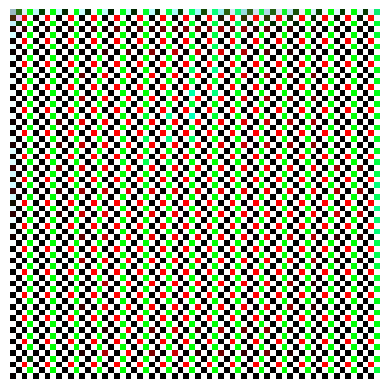

Epoch 3611, Generator Loss: 10.3708, Discriminator Loss: 0.0001
Epoch 3612, Generator Loss: 9.9559, Discriminator Loss: 0.0001
Epoch 3613, Generator Loss: 9.5256, Discriminator Loss: 0.0002
Epoch 3614, Generator Loss: 9.6486, Discriminator Loss: 0.0002
Epoch 3615, Generator Loss: 8.9809, Discriminator Loss: 0.0004
Epoch 3616, Generator Loss: 8.3138, Discriminator Loss: 0.0027
Epoch 3617, Generator Loss: 7.8302, Discriminator Loss: 0.0025
Epoch 3618, Generator Loss: 6.7625, Discriminator Loss: 0.0296
Epoch 3619, Generator Loss: 8.1833, Discriminator Loss: 0.0205
Epoch 3620, Generator Loss: 7.9276, Discriminator Loss: 0.0115


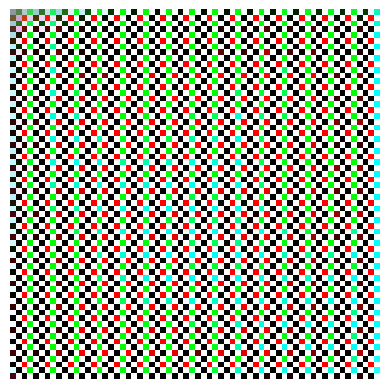

Epoch 3621, Generator Loss: 9.2914, Discriminator Loss: 0.0042
Epoch 3622, Generator Loss: 10.5557, Discriminator Loss: 0.0013
Epoch 3623, Generator Loss: 11.3307, Discriminator Loss: 0.0009
Epoch 3624, Generator Loss: 13.0240, Discriminator Loss: 0.0015
Epoch 3625, Generator Loss: 13.1593, Discriminator Loss: 0.0023
Epoch 3626, Generator Loss: 14.8234, Discriminator Loss: 0.0040
Epoch 3627, Generator Loss: 15.1493, Discriminator Loss: 0.0070
Epoch 3628, Generator Loss: 16.2300, Discriminator Loss: 0.0068
Epoch 3629, Generator Loss: 17.0084, Discriminator Loss: 0.0091
Epoch 3630, Generator Loss: 17.7933, Discriminator Loss: 0.0089


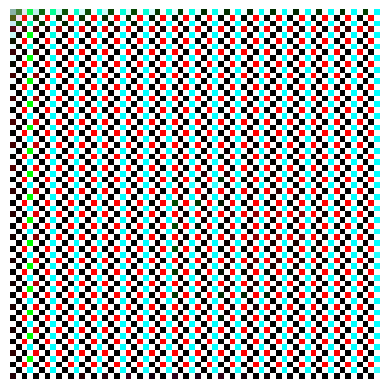

Epoch 3631, Generator Loss: 18.3631, Discriminator Loss: 0.0101
Epoch 3632, Generator Loss: 18.8399, Discriminator Loss: 0.0087
Epoch 3633, Generator Loss: 19.0767, Discriminator Loss: 0.0084
Epoch 3634, Generator Loss: 19.0870, Discriminator Loss: 0.0045
Epoch 3635, Generator Loss: 18.9700, Discriminator Loss: 0.0041
Epoch 3636, Generator Loss: 18.8038, Discriminator Loss: 0.0036
Epoch 3637, Generator Loss: 18.4177, Discriminator Loss: 0.0035
Epoch 3638, Generator Loss: 17.8905, Discriminator Loss: 0.0019
Epoch 3639, Generator Loss: 17.4299, Discriminator Loss: 0.0015
Epoch 3640, Generator Loss: 16.6039, Discriminator Loss: 0.0011


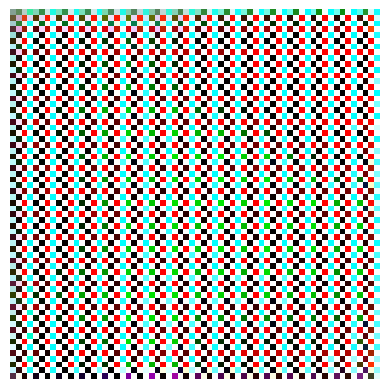

Epoch 3641, Generator Loss: 16.0943, Discriminator Loss: 0.0007
Epoch 3642, Generator Loss: 15.2472, Discriminator Loss: 0.0005
Epoch 3643, Generator Loss: 14.3780, Discriminator Loss: 0.0004
Epoch 3644, Generator Loss: 14.2949, Discriminator Loss: 0.0003
Epoch 3645, Generator Loss: 13.1896, Discriminator Loss: 0.0003
Epoch 3646, Generator Loss: 12.9702, Discriminator Loss: 0.0003
Epoch 3647, Generator Loss: 12.2964, Discriminator Loss: 0.0002
Epoch 3648, Generator Loss: 11.3749, Discriminator Loss: 0.0003
Epoch 3649, Generator Loss: 10.5654, Discriminator Loss: 0.0002
Epoch 3650, Generator Loss: 9.9452, Discriminator Loss: 0.0003


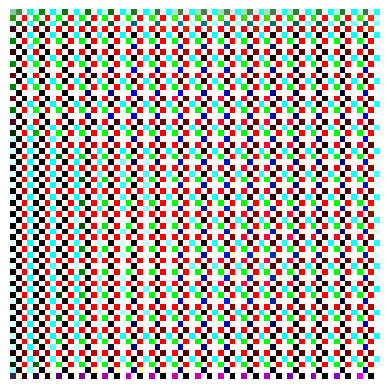

Epoch 3651, Generator Loss: 8.7755, Discriminator Loss: 0.0004
Epoch 3652, Generator Loss: 7.9751, Discriminator Loss: 0.0005
Epoch 3653, Generator Loss: 6.7680, Discriminator Loss: 0.0014
Epoch 3654, Generator Loss: 5.9192, Discriminator Loss: 0.0030
Epoch 3655, Generator Loss: 5.3451, Discriminator Loss: 0.0053
Epoch 3656, Generator Loss: 5.0643, Discriminator Loss: 0.0069
Epoch 3657, Generator Loss: 5.0238, Discriminator Loss: 0.0072
Epoch 3658, Generator Loss: 5.5722, Discriminator Loss: 0.0045
Epoch 3659, Generator Loss: 6.1301, Discriminator Loss: 0.0027
Epoch 3660, Generator Loss: 6.7636, Discriminator Loss: 0.0016


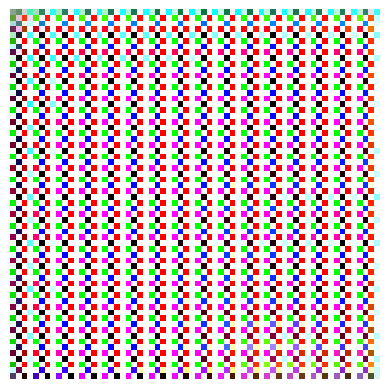

Epoch 3661, Generator Loss: 7.5698, Discriminator Loss: 0.0011
Epoch 3662, Generator Loss: 8.1953, Discriminator Loss: 0.0009
Epoch 3663, Generator Loss: 8.8012, Discriminator Loss: 0.0009
Epoch 3664, Generator Loss: 9.4377, Discriminator Loss: 0.0014
Epoch 3665, Generator Loss: 10.0570, Discriminator Loss: 0.0015
Epoch 3666, Generator Loss: 10.4735, Discriminator Loss: 0.0022
Epoch 3667, Generator Loss: 10.7511, Discriminator Loss: 0.0019
Epoch 3668, Generator Loss: 11.1048, Discriminator Loss: 0.0020
Epoch 3669, Generator Loss: 11.2000, Discriminator Loss: 0.0020
Epoch 3670, Generator Loss: 11.4634, Discriminator Loss: 0.0019


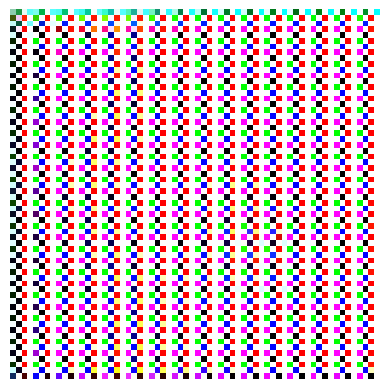

Epoch 3671, Generator Loss: 11.5953, Discriminator Loss: 0.0030
Epoch 3672, Generator Loss: 11.6487, Discriminator Loss: 0.0020
Epoch 3673, Generator Loss: 11.6819, Discriminator Loss: 0.0025
Epoch 3674, Generator Loss: 11.5877, Discriminator Loss: 0.0018
Epoch 3675, Generator Loss: 11.4814, Discriminator Loss: 0.0022
Epoch 3676, Generator Loss: 11.3395, Discriminator Loss: 0.0019
Epoch 3677, Generator Loss: 11.0708, Discriminator Loss: 0.0015
Epoch 3678, Generator Loss: 10.8019, Discriminator Loss: 0.0014
Epoch 3679, Generator Loss: 10.5112, Discriminator Loss: 0.0017
Epoch 3680, Generator Loss: 10.1060, Discriminator Loss: 0.0011


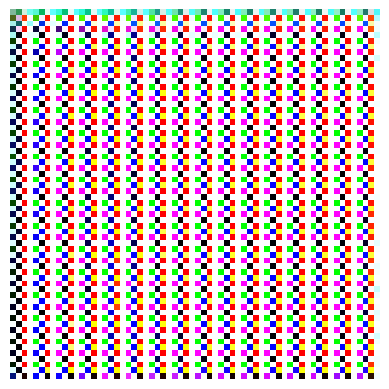

Epoch 3681, Generator Loss: 9.8792, Discriminator Loss: 0.0011
Epoch 3682, Generator Loss: 9.5240, Discriminator Loss: 0.0010
Epoch 3683, Generator Loss: 9.2242, Discriminator Loss: 0.0009
Epoch 3684, Generator Loss: 8.9233, Discriminator Loss: 0.0009
Epoch 3685, Generator Loss: 8.7889, Discriminator Loss: 0.0009
Epoch 3686, Generator Loss: 8.4958, Discriminator Loss: 0.0008
Epoch 3687, Generator Loss: 8.3573, Discriminator Loss: 0.0012
Epoch 3688, Generator Loss: 8.2715, Discriminator Loss: 0.0007
Epoch 3689, Generator Loss: 8.1977, Discriminator Loss: 0.0008
Epoch 3690, Generator Loss: 7.9283, Discriminator Loss: 0.0009


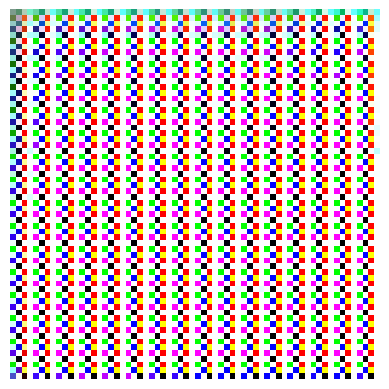

Epoch 3691, Generator Loss: 7.8749, Discriminator Loss: 0.0009
Epoch 3692, Generator Loss: 7.8588, Discriminator Loss: 0.0008
Epoch 3693, Generator Loss: 7.8164, Discriminator Loss: 0.0009
Epoch 3694, Generator Loss: 7.7917, Discriminator Loss: 0.0008
Epoch 3695, Generator Loss: 7.6332, Discriminator Loss: 0.0010
Epoch 3696, Generator Loss: 7.7460, Discriminator Loss: 0.0008
Epoch 3697, Generator Loss: 7.8834, Discriminator Loss: 0.0009
Epoch 3698, Generator Loss: 7.8621, Discriminator Loss: 0.0007
Epoch 3699, Generator Loss: 7.7601, Discriminator Loss: 0.0009
Epoch 3700, Generator Loss: 7.9265, Discriminator Loss: 0.0009


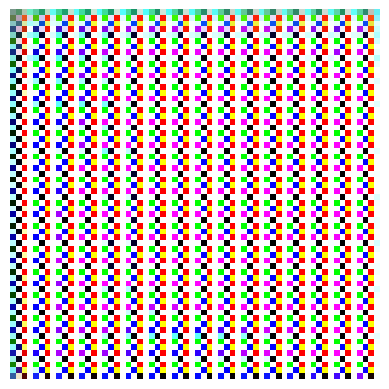

Epoch 3701, Generator Loss: 7.8455, Discriminator Loss: 0.0007
Epoch 3702, Generator Loss: 7.7712, Discriminator Loss: 0.0008
Epoch 3703, Generator Loss: 7.8003, Discriminator Loss: 0.0009
Epoch 3704, Generator Loss: 7.7606, Discriminator Loss: 0.0008
Epoch 3705, Generator Loss: 7.7287, Discriminator Loss: 0.0009
Epoch 3706, Generator Loss: 7.6547, Discriminator Loss: 0.0010
Epoch 3707, Generator Loss: 7.5772, Discriminator Loss: 0.0011
Epoch 3708, Generator Loss: 7.5581, Discriminator Loss: 0.0014
Epoch 3709, Generator Loss: 7.3616, Discriminator Loss: 0.0014
Epoch 3710, Generator Loss: 7.4127, Discriminator Loss: 0.0015


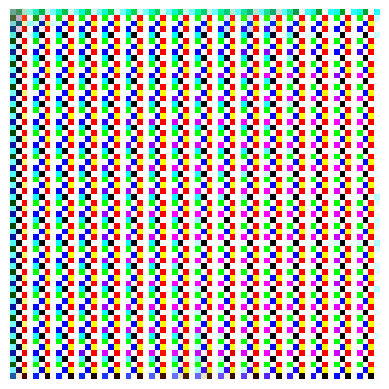

Epoch 3711, Generator Loss: 7.1752, Discriminator Loss: 0.0016
Epoch 3712, Generator Loss: 7.5265, Discriminator Loss: 0.0016
Epoch 3713, Generator Loss: 7.3925, Discriminator Loss: 0.0018
Epoch 3714, Generator Loss: 7.8807, Discriminator Loss: 0.0010
Epoch 3715, Generator Loss: 7.3529, Discriminator Loss: 0.0013
Epoch 3716, Generator Loss: 7.3946, Discriminator Loss: 0.0014
Epoch 3717, Generator Loss: 7.3686, Discriminator Loss: 0.0015
Epoch 3718, Generator Loss: 7.3287, Discriminator Loss: 0.0016
Epoch 3719, Generator Loss: 7.1708, Discriminator Loss: 0.0018
Epoch 3720, Generator Loss: 7.2488, Discriminator Loss: 0.0019


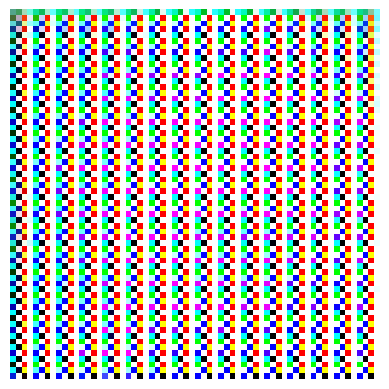

Epoch 3721, Generator Loss: 7.3085, Discriminator Loss: 0.0019
Epoch 3722, Generator Loss: 7.3033, Discriminator Loss: 0.0018
Epoch 3723, Generator Loss: 7.3568, Discriminator Loss: 0.0019
Epoch 3724, Generator Loss: 7.4510, Discriminator Loss: 0.0018
Epoch 3725, Generator Loss: 7.3951, Discriminator Loss: 0.0018
Epoch 3726, Generator Loss: 7.4159, Discriminator Loss: 0.0023
Epoch 3727, Generator Loss: 7.1155, Discriminator Loss: 0.0017
Epoch 3728, Generator Loss: 7.1012, Discriminator Loss: 0.0022
Epoch 3729, Generator Loss: 6.7211, Discriminator Loss: 0.0028
Epoch 3730, Generator Loss: 6.4301, Discriminator Loss: 0.0039


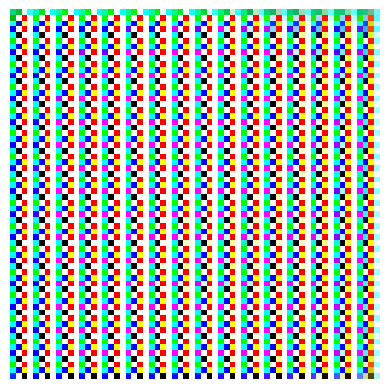

Epoch 3731, Generator Loss: 6.3011, Discriminator Loss: 0.0047
Epoch 3732, Generator Loss: 6.5220, Discriminator Loss: 0.0049
Epoch 3733, Generator Loss: 6.7878, Discriminator Loss: 0.0048
Epoch 3734, Generator Loss: 6.4699, Discriminator Loss: 0.0051
Epoch 3735, Generator Loss: 6.4518, Discriminator Loss: 0.0051
Epoch 3736, Generator Loss: 6.2055, Discriminator Loss: 0.0055
Epoch 3737, Generator Loss: 6.8679, Discriminator Loss: 0.0050
Epoch 3738, Generator Loss: 7.0992, Discriminator Loss: 0.0070
Epoch 3739, Generator Loss: 7.5025, Discriminator Loss: 0.0083
Epoch 3740, Generator Loss: 7.8415, Discriminator Loss: 0.0069


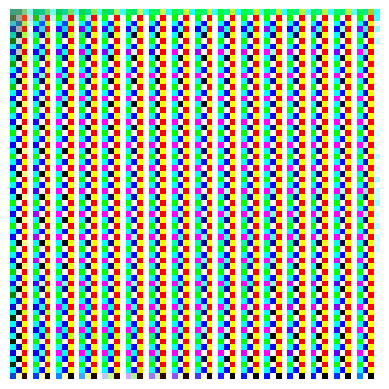

Epoch 3741, Generator Loss: 7.6819, Discriminator Loss: 0.0059
Epoch 3742, Generator Loss: 7.4912, Discriminator Loss: 0.0046
Epoch 3743, Generator Loss: 7.6850, Discriminator Loss: 0.0054
Epoch 3744, Generator Loss: 7.3493, Discriminator Loss: 0.0054
Epoch 3745, Generator Loss: 7.3597, Discriminator Loss: 0.0047
Epoch 3746, Generator Loss: 6.9668, Discriminator Loss: 0.0049
Epoch 3747, Generator Loss: 6.8027, Discriminator Loss: 0.0029
Epoch 3748, Generator Loss: 6.6660, Discriminator Loss: 0.0034
Epoch 3749, Generator Loss: 6.5131, Discriminator Loss: 0.0039
Epoch 3750, Generator Loss: 6.4773, Discriminator Loss: 0.0039


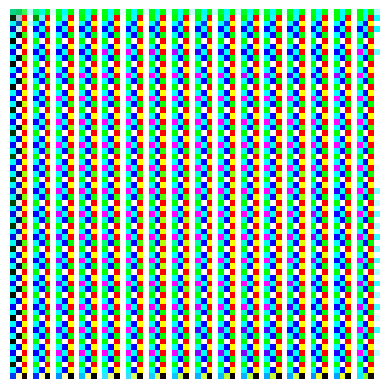

Epoch 3751, Generator Loss: 6.2729, Discriminator Loss: 0.0051
Epoch 3752, Generator Loss: 6.6191, Discriminator Loss: 0.0035
Epoch 3753, Generator Loss: 6.3395, Discriminator Loss: 0.0049
Epoch 3754, Generator Loss: 6.6226, Discriminator Loss: 0.0035
Epoch 3755, Generator Loss: 6.9019, Discriminator Loss: 0.0026
Epoch 3756, Generator Loss: 7.1430, Discriminator Loss: 0.0031
Epoch 3757, Generator Loss: 7.1844, Discriminator Loss: 0.0028
Epoch 3758, Generator Loss: 7.0051, Discriminator Loss: 0.0027
Epoch 3759, Generator Loss: 7.0069, Discriminator Loss: 0.0030
Epoch 3760, Generator Loss: 7.0342, Discriminator Loss: 0.0034


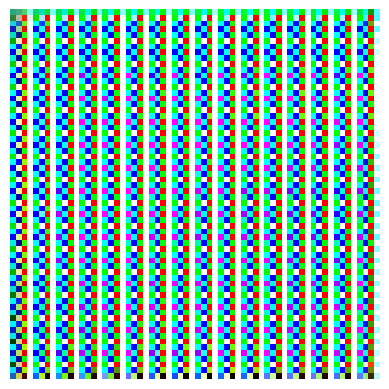

Epoch 3761, Generator Loss: 6.1897, Discriminator Loss: 0.0045
Epoch 3762, Generator Loss: 3.8289, Discriminator Loss: 0.1418
Epoch 3763, Generator Loss: 5.1819, Discriminator Loss: 0.5765
Epoch 3764, Generator Loss: 10.1406, Discriminator Loss: 0.8429
Epoch 3765, Generator Loss: 4.4704, Discriminator Loss: 0.2915
Epoch 3766, Generator Loss: 1.2760, Discriminator Loss: 0.6034
Epoch 3767, Generator Loss: 9.4336, Discriminator Loss: 0.0525
Epoch 3768, Generator Loss: 12.9587, Discriminator Loss: 0.1721
Epoch 3769, Generator Loss: 14.3104, Discriminator Loss: 0.1683
Epoch 3770, Generator Loss: 10.0871, Discriminator Loss: 0.0279


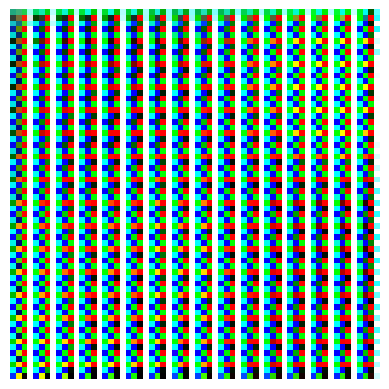

Epoch 3771, Generator Loss: 6.6265, Discriminator Loss: 0.0188
Epoch 3772, Generator Loss: 4.7928, Discriminator Loss: 0.0149
Epoch 3773, Generator Loss: 6.3114, Discriminator Loss: 0.0028
Epoch 3774, Generator Loss: 8.0219, Discriminator Loss: 0.0007
Epoch 3775, Generator Loss: 8.4498, Discriminator Loss: 0.0004
Epoch 3776, Generator Loss: 8.4532, Discriminator Loss: 0.0004
Epoch 3777, Generator Loss: 7.9298, Discriminator Loss: 0.0007
Epoch 3778, Generator Loss: 7.3378, Discriminator Loss: 0.0010
Epoch 3779, Generator Loss: 7.1965, Discriminator Loss: 0.0009
Epoch 3780, Generator Loss: 7.7490, Discriminator Loss: 0.0005


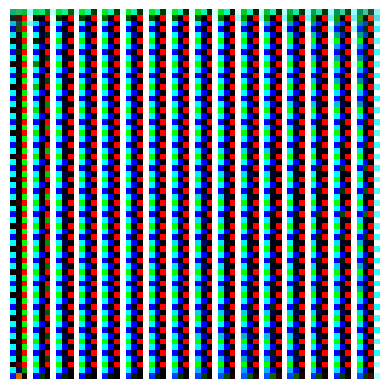

Epoch 3781, Generator Loss: 7.8504, Discriminator Loss: 0.0005
Epoch 3782, Generator Loss: 7.8293, Discriminator Loss: 0.0004
Epoch 3783, Generator Loss: 7.9715, Discriminator Loss: 0.0004
Epoch 3784, Generator Loss: 8.1293, Discriminator Loss: 0.0003
Epoch 3785, Generator Loss: 8.4822, Discriminator Loss: 0.0002
Epoch 3786, Generator Loss: 8.8855, Discriminator Loss: 0.0001
Epoch 3787, Generator Loss: 9.1426, Discriminator Loss: 0.0001
Epoch 3788, Generator Loss: 9.3049, Discriminator Loss: 0.0001
Epoch 3789, Generator Loss: 9.3347, Discriminator Loss: 0.0001
Epoch 3790, Generator Loss: 9.1651, Discriminator Loss: 0.0001


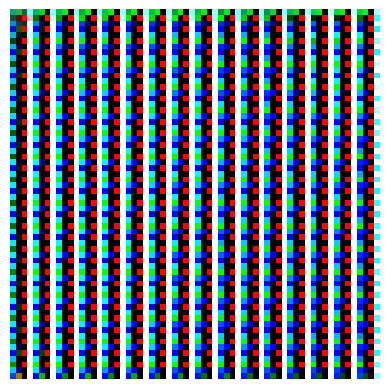

Epoch 3791, Generator Loss: 8.6167, Discriminator Loss: 0.0002
Epoch 3792, Generator Loss: 7.6316, Discriminator Loss: 0.0005
Epoch 3793, Generator Loss: 6.8505, Discriminator Loss: 0.0011
Epoch 3794, Generator Loss: 6.4496, Discriminator Loss: 0.0016
Epoch 3795, Generator Loss: 6.3852, Discriminator Loss: 0.0017
Epoch 3796, Generator Loss: 6.4598, Discriminator Loss: 0.0016
Epoch 3797, Generator Loss: 6.5453, Discriminator Loss: 0.0015
Epoch 3798, Generator Loss: 6.6588, Discriminator Loss: 0.0013
Epoch 3799, Generator Loss: 6.8869, Discriminator Loss: 0.0010
Epoch 3800, Generator Loss: 6.9450, Discriminator Loss: 0.0010


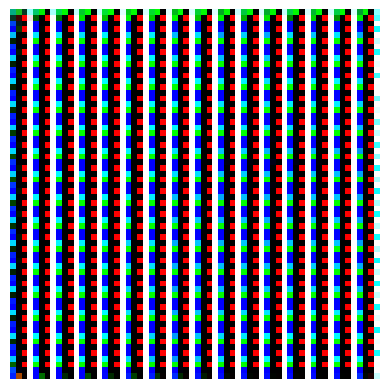

Epoch 3801, Generator Loss: 7.0808, Discriminator Loss: 0.0009
Epoch 3802, Generator Loss: 7.1976, Discriminator Loss: 0.0008
Epoch 3803, Generator Loss: 7.3363, Discriminator Loss: 0.0007
Epoch 3804, Generator Loss: 7.4707, Discriminator Loss: 0.0006
Epoch 3805, Generator Loss: 7.6189, Discriminator Loss: 0.0005
Epoch 3806, Generator Loss: 7.7911, Discriminator Loss: 0.0004
Epoch 3807, Generator Loss: 7.9430, Discriminator Loss: 0.0004
Epoch 3808, Generator Loss: 8.0824, Discriminator Loss: 0.0003
Epoch 3809, Generator Loss: 8.2307, Discriminator Loss: 0.0003
Epoch 3810, Generator Loss: 8.3510, Discriminator Loss: 0.0002


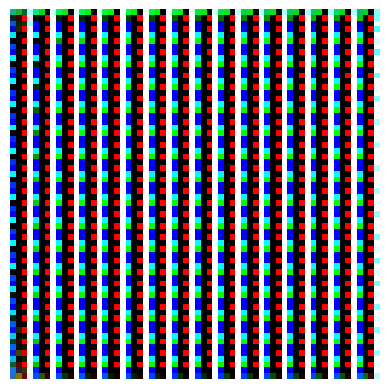

Epoch 3811, Generator Loss: 8.4604, Discriminator Loss: 0.0002
Epoch 3812, Generator Loss: 8.5997, Discriminator Loss: 0.0002
Epoch 3813, Generator Loss: 8.7098, Discriminator Loss: 0.0002
Epoch 3814, Generator Loss: 8.8009, Discriminator Loss: 0.0002
Epoch 3815, Generator Loss: 8.9001, Discriminator Loss: 0.0001
Epoch 3816, Generator Loss: 8.9840, Discriminator Loss: 0.0001
Epoch 3817, Generator Loss: 9.0705, Discriminator Loss: 0.0001
Epoch 3818, Generator Loss: 9.1219, Discriminator Loss: 0.0001
Epoch 3819, Generator Loss: 9.2063, Discriminator Loss: 0.0001
Epoch 3820, Generator Loss: 9.2552, Discriminator Loss: 0.0001


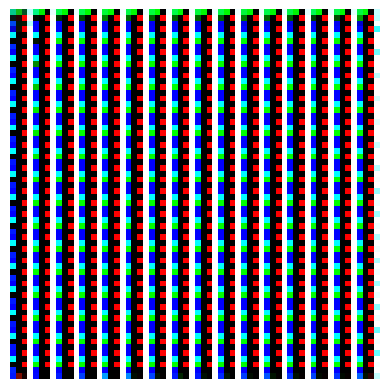

Epoch 3821, Generator Loss: 9.3209, Discriminator Loss: 0.0001
Epoch 3822, Generator Loss: 9.3720, Discriminator Loss: 0.0001
Epoch 3823, Generator Loss: 9.3996, Discriminator Loss: 0.0001
Epoch 3824, Generator Loss: 9.4388, Discriminator Loss: 0.0001
Epoch 3825, Generator Loss: 9.4822, Discriminator Loss: 0.0001
Epoch 3826, Generator Loss: 9.5051, Discriminator Loss: 0.0001
Epoch 3827, Generator Loss: 9.5507, Discriminator Loss: 0.0001
Epoch 3828, Generator Loss: 9.5597, Discriminator Loss: 0.0001
Epoch 3829, Generator Loss: 9.5975, Discriminator Loss: 0.0001
Epoch 3830, Generator Loss: 9.6095, Discriminator Loss: 0.0001


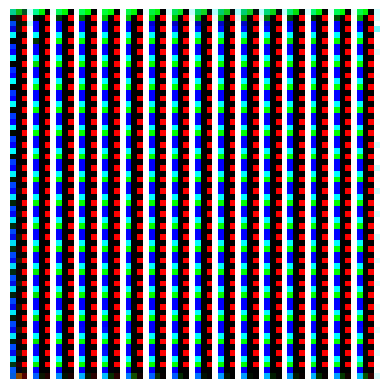

Epoch 3831, Generator Loss: 9.6232, Discriminator Loss: 0.0001
Epoch 3832, Generator Loss: 9.6435, Discriminator Loss: 0.0001
Epoch 3833, Generator Loss: 9.6534, Discriminator Loss: 0.0001
Epoch 3834, Generator Loss: 9.6664, Discriminator Loss: 0.0001
Epoch 3835, Generator Loss: 9.6724, Discriminator Loss: 0.0001
Epoch 3836, Generator Loss: 9.6803, Discriminator Loss: 0.0001
Epoch 3837, Generator Loss: 9.6782, Discriminator Loss: 0.0001
Epoch 3838, Generator Loss: 9.7048, Discriminator Loss: 0.0001
Epoch 3839, Generator Loss: 9.6831, Discriminator Loss: 0.0001
Epoch 3840, Generator Loss: 9.6897, Discriminator Loss: 0.0001


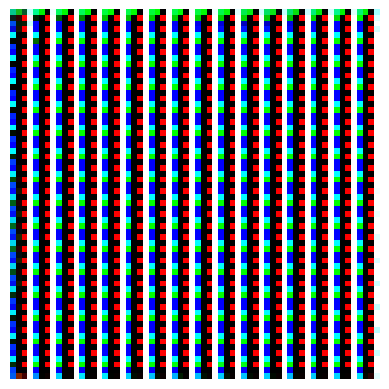

Epoch 3841, Generator Loss: 9.6999, Discriminator Loss: 0.0001
Epoch 3842, Generator Loss: 9.6745, Discriminator Loss: 0.0001
Epoch 3843, Generator Loss: 9.6617, Discriminator Loss: 0.0001
Epoch 3844, Generator Loss: 9.6499, Discriminator Loss: 0.0001
Epoch 3845, Generator Loss: 9.5549, Discriminator Loss: 0.0001
Epoch 3846, Generator Loss: 9.4946, Discriminator Loss: 0.0001
Epoch 3847, Generator Loss: 9.2913, Discriminator Loss: 0.0001
Epoch 3848, Generator Loss: 9.0695, Discriminator Loss: 0.0001
Epoch 3849, Generator Loss: 8.4485, Discriminator Loss: 0.0003
Epoch 3850, Generator Loss: 6.9898, Discriminator Loss: 0.0025


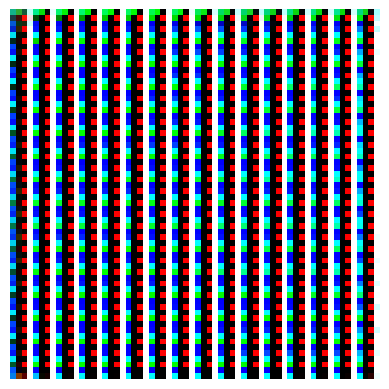

Epoch 3851, Generator Loss: 4.8788, Discriminator Loss: 0.1473
Epoch 3852, Generator Loss: 3.2121, Discriminator Loss: 0.7903
Epoch 3853, Generator Loss: 8.2938, Discriminator Loss: 0.0043
Epoch 3854, Generator Loss: 9.3083, Discriminator Loss: 0.0286
Epoch 3855, Generator Loss: 12.5610, Discriminator Loss: 0.3335
Epoch 3856, Generator Loss: 13.0753, Discriminator Loss: 0.2667
Epoch 3857, Generator Loss: 12.6874, Discriminator Loss: 0.0075
Epoch 3858, Generator Loss: 12.7138, Discriminator Loss: 0.0004
Epoch 3859, Generator Loss: 12.8150, Discriminator Loss: 0.0000
Epoch 3860, Generator Loss: 12.9938, Discriminator Loss: 0.0000


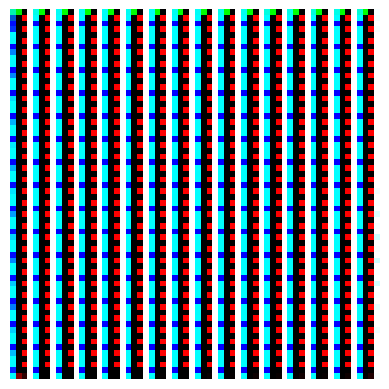

Epoch 3861, Generator Loss: 13.1914, Discriminator Loss: 0.0000
Epoch 3862, Generator Loss: 13.3831, Discriminator Loss: 0.0000
Epoch 3863, Generator Loss: 13.5896, Discriminator Loss: 0.0000
Epoch 3864, Generator Loss: 13.7932, Discriminator Loss: 0.0000
Epoch 3865, Generator Loss: 13.9709, Discriminator Loss: 0.0000
Epoch 3866, Generator Loss: 14.1453, Discriminator Loss: 0.0000
Epoch 3867, Generator Loss: 14.3092, Discriminator Loss: 0.0000
Epoch 3868, Generator Loss: 14.4583, Discriminator Loss: 0.0000
Epoch 3869, Generator Loss: 14.5903, Discriminator Loss: 0.0000
Epoch 3870, Generator Loss: 14.7102, Discriminator Loss: 0.0000


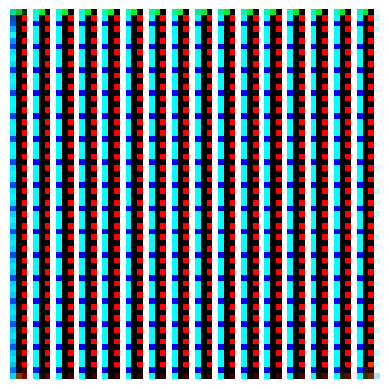

Epoch 3871, Generator Loss: 14.8173, Discriminator Loss: 0.0000
Epoch 3872, Generator Loss: 14.9206, Discriminator Loss: 0.0000
Epoch 3873, Generator Loss: 15.0055, Discriminator Loss: 0.0000
Epoch 3874, Generator Loss: 15.0837, Discriminator Loss: 0.0000
Epoch 3875, Generator Loss: 15.1586, Discriminator Loss: 0.0000
Epoch 3876, Generator Loss: 15.2172, Discriminator Loss: 0.0000
Epoch 3877, Generator Loss: 15.2768, Discriminator Loss: 0.0000
Epoch 3878, Generator Loss: 15.3233, Discriminator Loss: 0.0000
Epoch 3879, Generator Loss: 15.3690, Discriminator Loss: 0.0000
Epoch 3880, Generator Loss: 15.4072, Discriminator Loss: 0.0000


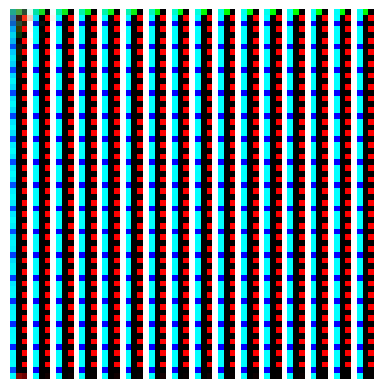

Epoch 3881, Generator Loss: 15.4426, Discriminator Loss: 0.0000
Epoch 3882, Generator Loss: 15.4768, Discriminator Loss: 0.0000
Epoch 3883, Generator Loss: 15.4944, Discriminator Loss: 0.0000
Epoch 3884, Generator Loss: 15.5144, Discriminator Loss: 0.0000
Epoch 3885, Generator Loss: 15.5487, Discriminator Loss: 0.0000
Epoch 3886, Generator Loss: 15.5634, Discriminator Loss: 0.0000
Epoch 3887, Generator Loss: 15.5863, Discriminator Loss: 0.0000
Epoch 3888, Generator Loss: 15.6008, Discriminator Loss: 0.0000
Epoch 3889, Generator Loss: 15.6232, Discriminator Loss: 0.0000
Epoch 3890, Generator Loss: 15.6291, Discriminator Loss: 0.0000


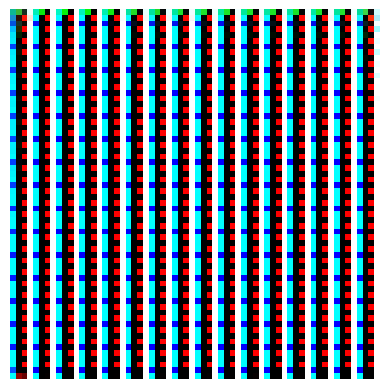

Epoch 3891, Generator Loss: 15.6468, Discriminator Loss: 0.0000
Epoch 3892, Generator Loss: 15.6483, Discriminator Loss: 0.0000
Epoch 3893, Generator Loss: 15.6635, Discriminator Loss: 0.0000
Epoch 3894, Generator Loss: 15.6717, Discriminator Loss: 0.0000
Epoch 3895, Generator Loss: 15.6746, Discriminator Loss: 0.0000
Epoch 3896, Generator Loss: 15.6870, Discriminator Loss: 0.0000
Epoch 3897, Generator Loss: 15.6910, Discriminator Loss: 0.0000
Epoch 3898, Generator Loss: 15.6945, Discriminator Loss: 0.0000
Epoch 3899, Generator Loss: 15.6878, Discriminator Loss: 0.0000
Epoch 3900, Generator Loss: 15.6980, Discriminator Loss: 0.0000


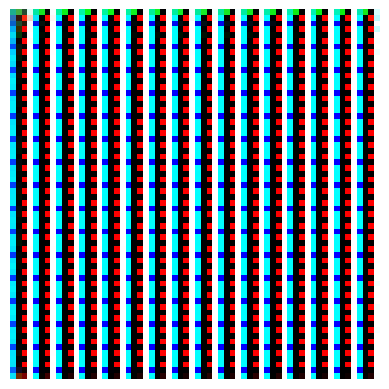

Epoch 3901, Generator Loss: 15.7122, Discriminator Loss: 0.0000
Epoch 3902, Generator Loss: 15.7122, Discriminator Loss: 0.0000
Epoch 3903, Generator Loss: 15.7109, Discriminator Loss: 0.0000
Epoch 3904, Generator Loss: 15.7140, Discriminator Loss: 0.0000
Epoch 3905, Generator Loss: 15.7127, Discriminator Loss: 0.0000
Epoch 3906, Generator Loss: 15.7144, Discriminator Loss: 0.0000
Epoch 3907, Generator Loss: 15.7168, Discriminator Loss: 0.0000
Epoch 3908, Generator Loss: 15.7164, Discriminator Loss: 0.0000
Epoch 3909, Generator Loss: 15.7275, Discriminator Loss: 0.0000
Epoch 3910, Generator Loss: 15.7301, Discriminator Loss: 0.0000


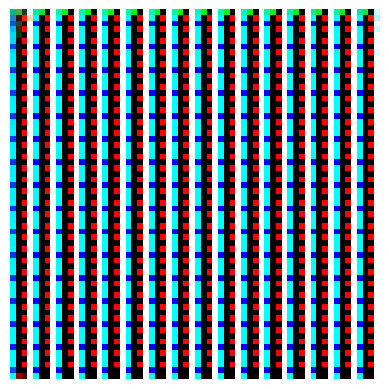

Epoch 3911, Generator Loss: 15.7183, Discriminator Loss: 0.0000
Epoch 3912, Generator Loss: 15.7202, Discriminator Loss: 0.0000
Epoch 3913, Generator Loss: 15.7231, Discriminator Loss: 0.0000
Epoch 3914, Generator Loss: 15.7172, Discriminator Loss: 0.0000
Epoch 3915, Generator Loss: 15.7208, Discriminator Loss: 0.0000
Epoch 3916, Generator Loss: 15.7217, Discriminator Loss: 0.0000
Epoch 3917, Generator Loss: 15.7218, Discriminator Loss: 0.0000
Epoch 3918, Generator Loss: 15.7129, Discriminator Loss: 0.0000
Epoch 3919, Generator Loss: 15.7062, Discriminator Loss: 0.0000
Epoch 3920, Generator Loss: 15.7127, Discriminator Loss: 0.0000


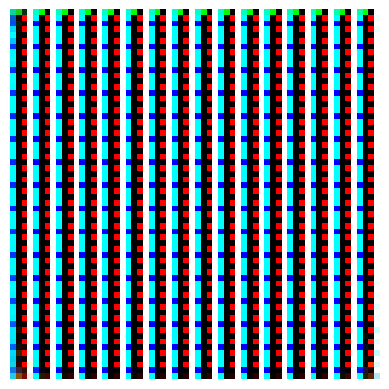

Epoch 3921, Generator Loss: 15.7119, Discriminator Loss: 0.0000
Epoch 3922, Generator Loss: 15.7212, Discriminator Loss: 0.0000
Epoch 3923, Generator Loss: 15.7132, Discriminator Loss: 0.0000
Epoch 3924, Generator Loss: 15.6996, Discriminator Loss: 0.0000
Epoch 3925, Generator Loss: 15.7048, Discriminator Loss: 0.0000
Epoch 3926, Generator Loss: 15.6996, Discriminator Loss: 0.0000
Epoch 3927, Generator Loss: 15.7034, Discriminator Loss: 0.0000
Epoch 3928, Generator Loss: 15.7006, Discriminator Loss: 0.0000
Epoch 3929, Generator Loss: 15.6897, Discriminator Loss: 0.0000
Epoch 3930, Generator Loss: 15.6930, Discriminator Loss: 0.0000


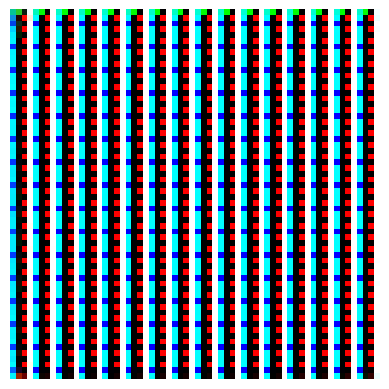

Epoch 3931, Generator Loss: 15.6893, Discriminator Loss: 0.0000
Epoch 3932, Generator Loss: 15.6817, Discriminator Loss: 0.0000
Epoch 3933, Generator Loss: 15.6749, Discriminator Loss: 0.0000
Epoch 3934, Generator Loss: 15.6884, Discriminator Loss: 0.0000
Epoch 3935, Generator Loss: 15.6795, Discriminator Loss: 0.0000
Epoch 3936, Generator Loss: 15.6718, Discriminator Loss: 0.0000
Epoch 3937, Generator Loss: 15.6762, Discriminator Loss: 0.0000
Epoch 3938, Generator Loss: 15.6842, Discriminator Loss: 0.0000
Epoch 3939, Generator Loss: 15.6556, Discriminator Loss: 0.0000
Epoch 3940, Generator Loss: 15.6616, Discriminator Loss: 0.0000


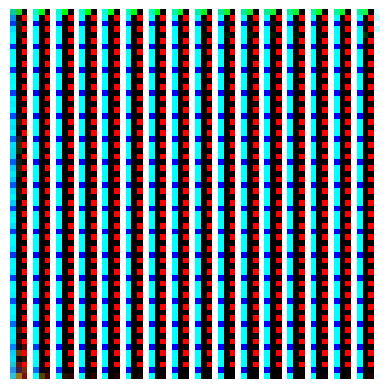

Epoch 3941, Generator Loss: 15.6523, Discriminator Loss: 0.0000
Epoch 3942, Generator Loss: 15.6463, Discriminator Loss: 0.0000
Epoch 3943, Generator Loss: 15.6515, Discriminator Loss: 0.0000
Epoch 3944, Generator Loss: 15.6455, Discriminator Loss: 0.0000
Epoch 3945, Generator Loss: 15.6458, Discriminator Loss: 0.0000
Epoch 3946, Generator Loss: 15.6521, Discriminator Loss: 0.0000
Epoch 3947, Generator Loss: 15.6386, Discriminator Loss: 0.0000
Epoch 3948, Generator Loss: 15.6161, Discriminator Loss: 0.0000
Epoch 3949, Generator Loss: 15.5955, Discriminator Loss: 0.0000
Epoch 3950, Generator Loss: 15.6401, Discriminator Loss: 0.0000


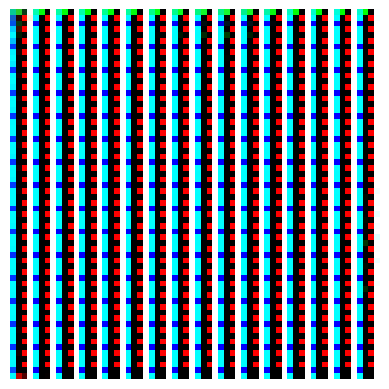

Epoch 3951, Generator Loss: 15.6105, Discriminator Loss: 0.0000
Epoch 3952, Generator Loss: 15.5929, Discriminator Loss: 0.0000
Epoch 3953, Generator Loss: 15.5781, Discriminator Loss: 0.0000
Epoch 3954, Generator Loss: 15.5756, Discriminator Loss: 0.0000
Epoch 3955, Generator Loss: 15.5650, Discriminator Loss: 0.0000
Epoch 3956, Generator Loss: 15.5821, Discriminator Loss: 0.0000
Epoch 3957, Generator Loss: 15.5531, Discriminator Loss: 0.0000
Epoch 3958, Generator Loss: 15.5697, Discriminator Loss: 0.0000
Epoch 3959, Generator Loss: 15.5265, Discriminator Loss: 0.0000
Epoch 3960, Generator Loss: 15.5206, Discriminator Loss: 0.0000


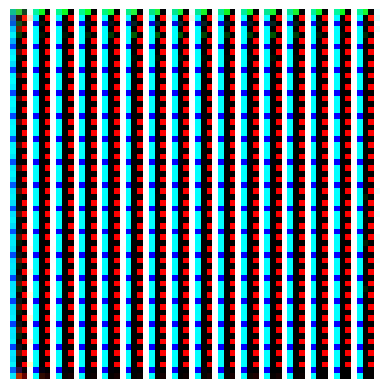

Epoch 3961, Generator Loss: 15.4936, Discriminator Loss: 0.0000
Epoch 3962, Generator Loss: 15.4389, Discriminator Loss: 0.0000
Epoch 3963, Generator Loss: 15.4554, Discriminator Loss: 0.0000
Epoch 3964, Generator Loss: 15.4189, Discriminator Loss: 0.0000
Epoch 3965, Generator Loss: 15.3645, Discriminator Loss: 0.0000
Epoch 3966, Generator Loss: 15.3401, Discriminator Loss: 0.0000
Epoch 3967, Generator Loss: 15.3381, Discriminator Loss: 0.0000
Epoch 3968, Generator Loss: 15.2896, Discriminator Loss: 0.0000
Epoch 3969, Generator Loss: 15.2294, Discriminator Loss: 0.0000
Epoch 3970, Generator Loss: 15.0977, Discriminator Loss: 0.0000


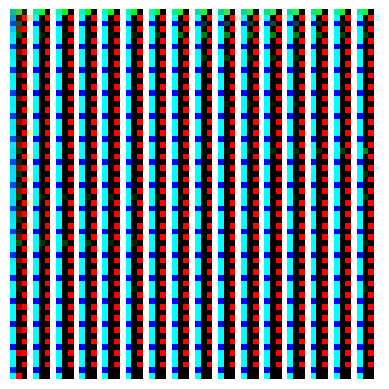

Epoch 3971, Generator Loss: 15.1196, Discriminator Loss: 0.0000
Epoch 3972, Generator Loss: 15.0372, Discriminator Loss: 0.0000
Epoch 3973, Generator Loss: 14.9000, Discriminator Loss: 0.0000
Epoch 3974, Generator Loss: 14.8402, Discriminator Loss: 0.0000
Epoch 3975, Generator Loss: 14.6808, Discriminator Loss: 0.0000
Epoch 3976, Generator Loss: 14.4592, Discriminator Loss: 0.0000
Epoch 3977, Generator Loss: 14.2049, Discriminator Loss: 0.0000
Epoch 3978, Generator Loss: 13.6528, Discriminator Loss: 0.0000
Epoch 3979, Generator Loss: 12.9286, Discriminator Loss: 0.0000
Epoch 3980, Generator Loss: 11.5163, Discriminator Loss: 0.0000


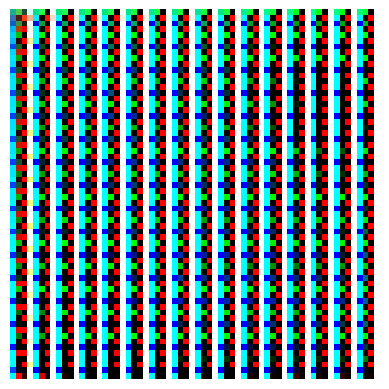

Epoch 3981, Generator Loss: 9.6494, Discriminator Loss: 0.0001
Epoch 3982, Generator Loss: 7.9164, Discriminator Loss: 0.0005
Epoch 3983, Generator Loss: 4.6803, Discriminator Loss: 0.0117
Epoch 3984, Generator Loss: 3.0584, Discriminator Loss: 0.0543
Epoch 3985, Generator Loss: 3.9420, Discriminator Loss: 0.0209
Epoch 3986, Generator Loss: 5.5719, Discriminator Loss: 0.0041
Epoch 3987, Generator Loss: 6.8277, Discriminator Loss: 0.0012
Epoch 3988, Generator Loss: 7.5357, Discriminator Loss: 0.0007
Epoch 3989, Generator Loss: 7.3921, Discriminator Loss: 0.0016
Epoch 3990, Generator Loss: 4.5062, Discriminator Loss: 0.0905


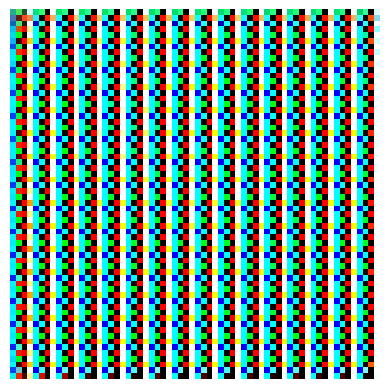

Epoch 3991, Generator Loss: 2.9573, Discriminator Loss: 0.2588
Epoch 3992, Generator Loss: 7.9882, Discriminator Loss: 0.0007
Epoch 3993, Generator Loss: 12.8090, Discriminator Loss: 0.0000
Epoch 3994, Generator Loss: 17.5892, Discriminator Loss: 0.0000
Epoch 3995, Generator Loss: 18.2190, Discriminator Loss: 0.0000
Epoch 3996, Generator Loss: 13.7124, Discriminator Loss: 0.0000
Epoch 3997, Generator Loss: 13.6615, Discriminator Loss: 0.0001
Epoch 3998, Generator Loss: 14.8455, Discriminator Loss: 0.0003
Epoch 3999, Generator Loss: 16.0729, Discriminator Loss: 0.0025
Epoch 4000, Generator Loss: 17.1359, Discriminator Loss: 0.0077


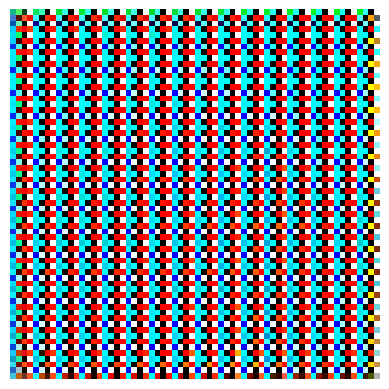

Epoch 4001, Generator Loss: 18.5714, Discriminator Loss: 0.0346
Epoch 4002, Generator Loss: 19.2372, Discriminator Loss: 0.0785
Epoch 4003, Generator Loss: 17.7757, Discriminator Loss: 0.0355
Epoch 4004, Generator Loss: 15.0182, Discriminator Loss: 0.0147
Epoch 4005, Generator Loss: 10.9004, Discriminator Loss: 0.0169
Epoch 4006, Generator Loss: 6.7994, Discriminator Loss: 0.0077
Epoch 4007, Generator Loss: 3.9656, Discriminator Loss: 0.0331
Epoch 4008, Generator Loss: 2.9882, Discriminator Loss: 0.0621
Epoch 4009, Generator Loss: 4.2550, Discriminator Loss: 0.0173
Epoch 4010, Generator Loss: 6.3963, Discriminator Loss: 0.0040


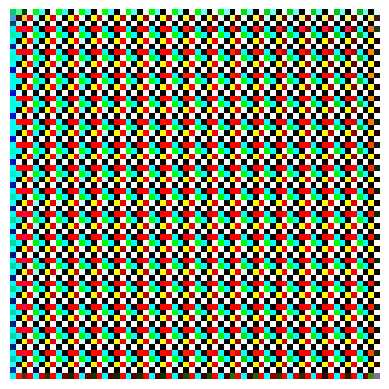

Epoch 4011, Generator Loss: 8.6530, Discriminator Loss: 0.0032
Epoch 4012, Generator Loss: 10.3433, Discriminator Loss: 0.0056
Epoch 4013, Generator Loss: 11.9054, Discriminator Loss: 0.0038
Epoch 4014, Generator Loss: 13.2744, Discriminator Loss: 0.0028
Epoch 4015, Generator Loss: 14.3471, Discriminator Loss: 0.0027
Epoch 4016, Generator Loss: 15.3799, Discriminator Loss: 0.0024
Epoch 4017, Generator Loss: 15.6213, Discriminator Loss: 0.0036
Epoch 4018, Generator Loss: 14.7018, Discriminator Loss: 0.0022
Epoch 4019, Generator Loss: 12.6928, Discriminator Loss: 0.0024
Epoch 4020, Generator Loss: 10.8792, Discriminator Loss: 0.0025


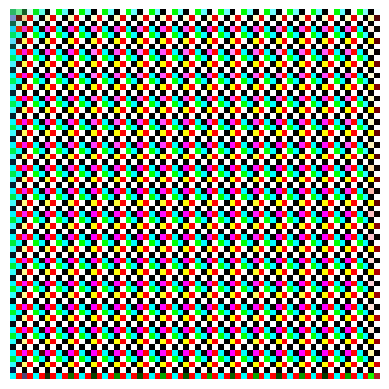

Epoch 4021, Generator Loss: 10.3703, Discriminator Loss: 0.0021
Epoch 4022, Generator Loss: 9.8679, Discriminator Loss: 0.0013
Epoch 4023, Generator Loss: 8.2100, Discriminator Loss: 0.0015
Epoch 4024, Generator Loss: 7.2916, Discriminator Loss: 0.0025
Epoch 4025, Generator Loss: 5.7523, Discriminator Loss: 0.0051
Epoch 4026, Generator Loss: 5.6105, Discriminator Loss: 0.0050
Epoch 4027, Generator Loss: 5.7005, Discriminator Loss: 0.0046
Epoch 4028, Generator Loss: 6.0533, Discriminator Loss: 0.0034
Epoch 4029, Generator Loss: 6.4052, Discriminator Loss: 0.0025
Epoch 4030, Generator Loss: 6.9218, Discriminator Loss: 0.0018


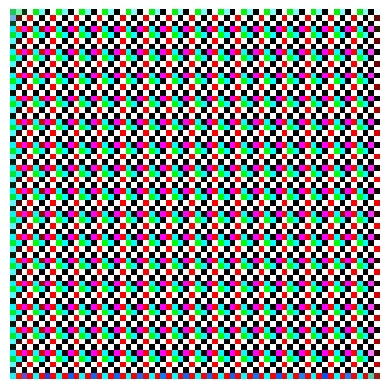

Epoch 4031, Generator Loss: 7.1734, Discriminator Loss: 0.0016
Epoch 4032, Generator Loss: 7.5534, Discriminator Loss: 0.0013
Epoch 4033, Generator Loss: 7.6134, Discriminator Loss: 0.0019
Epoch 4034, Generator Loss: 7.6052, Discriminator Loss: 0.0014
Epoch 4035, Generator Loss: 6.9016, Discriminator Loss: 0.0026
Epoch 4036, Generator Loss: 5.8402, Discriminator Loss: 0.0072
Epoch 4037, Generator Loss: 4.4868, Discriminator Loss: 0.0319
Epoch 4038, Generator Loss: 3.9963, Discriminator Loss: 0.0365
Epoch 4039, Generator Loss: 4.3496, Discriminator Loss: 0.0170
Epoch 4040, Generator Loss: 6.2152, Discriminator Loss: 0.0056


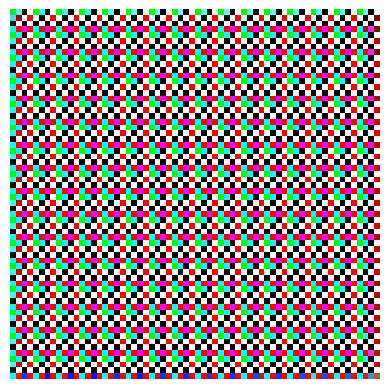

Epoch 4041, Generator Loss: 8.1697, Discriminator Loss: 0.0064
Epoch 4042, Generator Loss: 10.0534, Discriminator Loss: 0.0083
Epoch 4043, Generator Loss: 11.7359, Discriminator Loss: 0.0070
Epoch 4044, Generator Loss: 13.1953, Discriminator Loss: 0.0160
Epoch 4045, Generator Loss: 14.3879, Discriminator Loss: 0.0121
Epoch 4046, Generator Loss: 15.3534, Discriminator Loss: 0.0130
Epoch 4047, Generator Loss: 16.1050, Discriminator Loss: 0.0063
Epoch 4048, Generator Loss: 16.7471, Discriminator Loss: 0.0062
Epoch 4049, Generator Loss: 17.2848, Discriminator Loss: 0.0045
Epoch 4050, Generator Loss: 17.7079, Discriminator Loss: 0.0035


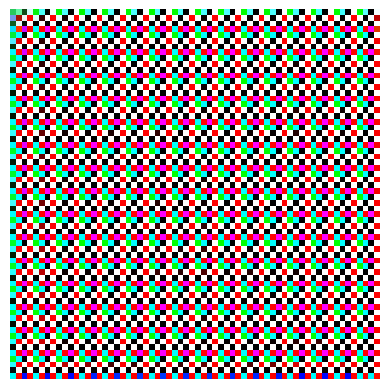

Epoch 4051, Generator Loss: 18.0500, Discriminator Loss: 0.0027
Epoch 4052, Generator Loss: 18.3796, Discriminator Loss: 0.0020
Epoch 4053, Generator Loss: 18.6195, Discriminator Loss: 0.0018
Epoch 4054, Generator Loss: 18.7918, Discriminator Loss: 0.0011
Epoch 4055, Generator Loss: 18.9644, Discriminator Loss: 0.0012
Epoch 4056, Generator Loss: 19.0853, Discriminator Loss: 0.0006
Epoch 4057, Generator Loss: 19.1845, Discriminator Loss: 0.0005
Epoch 4058, Generator Loss: 19.1963, Discriminator Loss: 0.0005
Epoch 4059, Generator Loss: 19.1185, Discriminator Loss: 0.0005
Epoch 4060, Generator Loss: 18.8061, Discriminator Loss: 0.0004


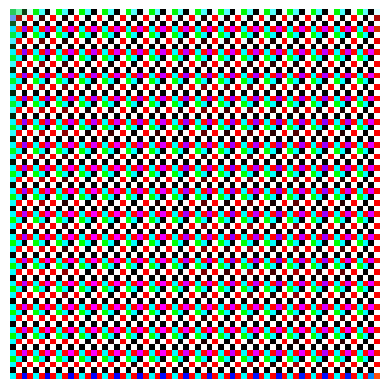

Epoch 4061, Generator Loss: 17.4327, Discriminator Loss: 0.0002
Epoch 4062, Generator Loss: 13.6282, Discriminator Loss: 0.0002
Epoch 4063, Generator Loss: 8.7744, Discriminator Loss: 0.0005
Epoch 4064, Generator Loss: 8.2116, Discriminator Loss: 0.0005
Epoch 4065, Generator Loss: 8.3542, Discriminator Loss: 0.0004
Epoch 4066, Generator Loss: 8.4675, Discriminator Loss: 0.0004
Epoch 4067, Generator Loss: 8.1256, Discriminator Loss: 0.0005
Epoch 4068, Generator Loss: 8.0536, Discriminator Loss: 0.0005
Epoch 4069, Generator Loss: 7.7882, Discriminator Loss: 0.0006
Epoch 4070, Generator Loss: 7.6476, Discriminator Loss: 0.0006


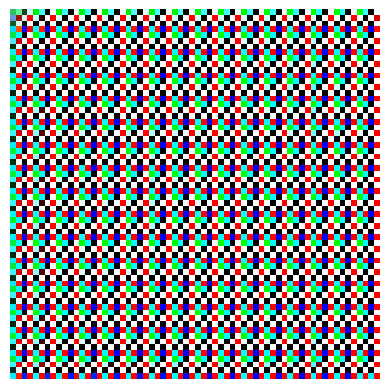

Epoch 4071, Generator Loss: 7.6885, Discriminator Loss: 0.0006
Epoch 4072, Generator Loss: 7.6471, Discriminator Loss: 0.0006
Epoch 4073, Generator Loss: 7.6940, Discriminator Loss: 0.0006
Epoch 4074, Generator Loss: 7.7750, Discriminator Loss: 0.0005
Epoch 4075, Generator Loss: 7.8467, Discriminator Loss: 0.0005
Epoch 4076, Generator Loss: 7.9243, Discriminator Loss: 0.0005
Epoch 4077, Generator Loss: 8.0139, Discriminator Loss: 0.0005
Epoch 4078, Generator Loss: 8.1096, Discriminator Loss: 0.0004
Epoch 4079, Generator Loss: 8.2042, Discriminator Loss: 0.0004
Epoch 4080, Generator Loss: 8.2984, Discriminator Loss: 0.0003


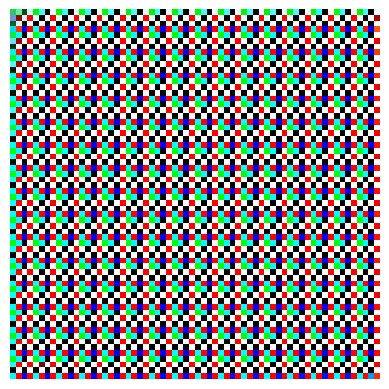

Epoch 4081, Generator Loss: 8.3755, Discriminator Loss: 0.0003
Epoch 4082, Generator Loss: 8.4652, Discriminator Loss: 0.0003
Epoch 4083, Generator Loss: 8.5513, Discriminator Loss: 0.0003
Epoch 4084, Generator Loss: 8.6289, Discriminator Loss: 0.0003
Epoch 4085, Generator Loss: 8.7051, Discriminator Loss: 0.0003
Epoch 4086, Generator Loss: 8.7839, Discriminator Loss: 0.0003
Epoch 4087, Generator Loss: 8.8412, Discriminator Loss: 0.0002
Epoch 4088, Generator Loss: 8.9153, Discriminator Loss: 0.0003
Epoch 4089, Generator Loss: 8.9666, Discriminator Loss: 0.0002
Epoch 4090, Generator Loss: 9.0304, Discriminator Loss: 0.0002


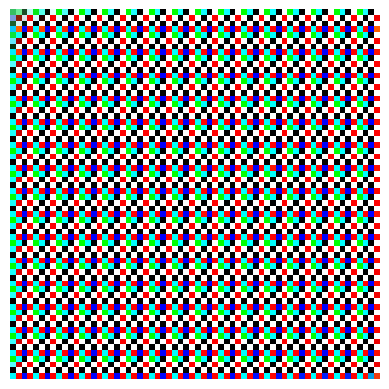

Epoch 4091, Generator Loss: 9.0942, Discriminator Loss: 0.0002
Epoch 4092, Generator Loss: 9.1394, Discriminator Loss: 0.0002
Epoch 4093, Generator Loss: 9.1787, Discriminator Loss: 0.0002
Epoch 4094, Generator Loss: 9.2246, Discriminator Loss: 0.0002
Epoch 4095, Generator Loss: 9.2714, Discriminator Loss: 0.0002
Epoch 4096, Generator Loss: 9.3027, Discriminator Loss: 0.0002
Epoch 4097, Generator Loss: 9.3174, Discriminator Loss: 0.0002
Epoch 4098, Generator Loss: 9.3666, Discriminator Loss: 0.0002
Epoch 4099, Generator Loss: 9.3749, Discriminator Loss: 0.0002
Epoch 4100, Generator Loss: 9.3702, Discriminator Loss: 0.0002


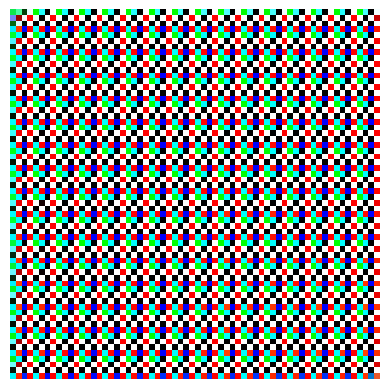

Epoch 4101, Generator Loss: 9.3517, Discriminator Loss: 0.0002
Epoch 4102, Generator Loss: 9.3563, Discriminator Loss: 0.0002
Epoch 4103, Generator Loss: 9.1957, Discriminator Loss: 0.0002
Epoch 4104, Generator Loss: 8.9811, Discriminator Loss: 0.0002
Epoch 4105, Generator Loss: 8.3646, Discriminator Loss: 0.0004
Epoch 4106, Generator Loss: 7.6724, Discriminator Loss: 0.0008
Epoch 4107, Generator Loss: 7.0365, Discriminator Loss: 0.0014
Epoch 4108, Generator Loss: 6.4801, Discriminator Loss: 0.0021
Epoch 4109, Generator Loss: 6.0388, Discriminator Loss: 0.0026
Epoch 4110, Generator Loss: 5.8799, Discriminator Loss: 0.0029


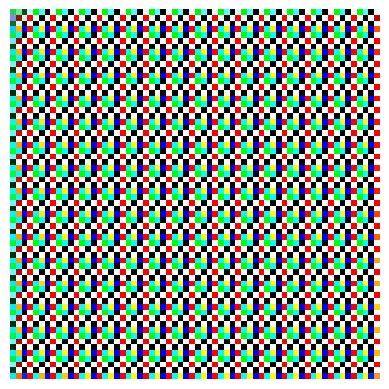

Epoch 4111, Generator Loss: 6.1002, Discriminator Loss: 0.0024
Epoch 4112, Generator Loss: 6.3671, Discriminator Loss: 0.0019
Epoch 4113, Generator Loss: 6.7371, Discriminator Loss: 0.0014
Epoch 4114, Generator Loss: 7.1149, Discriminator Loss: 0.0010
Epoch 4115, Generator Loss: 7.4553, Discriminator Loss: 0.0007
Epoch 4116, Generator Loss: 7.7912, Discriminator Loss: 0.0006
Epoch 4117, Generator Loss: 8.1389, Discriminator Loss: 0.0006
Epoch 4118, Generator Loss: 8.4277, Discriminator Loss: 0.0005
Epoch 4119, Generator Loss: 8.7007, Discriminator Loss: 0.0004
Epoch 4120, Generator Loss: 8.9296, Discriminator Loss: 0.0004


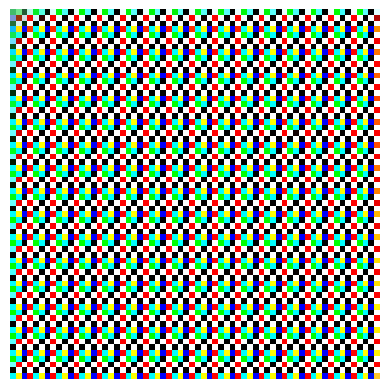

Epoch 4121, Generator Loss: 9.1482, Discriminator Loss: 0.0003
Epoch 4122, Generator Loss: 9.3653, Discriminator Loss: 0.0004
Epoch 4123, Generator Loss: 9.5548, Discriminator Loss: 0.0003
Epoch 4124, Generator Loss: 9.7045, Discriminator Loss: 0.0004
Epoch 4125, Generator Loss: 9.8672, Discriminator Loss: 0.0004
Epoch 4126, Generator Loss: 9.9813, Discriminator Loss: 0.0003
Epoch 4127, Generator Loss: 10.0986, Discriminator Loss: 0.0003
Epoch 4128, Generator Loss: 10.1669, Discriminator Loss: 0.0003
Epoch 4129, Generator Loss: 10.3066, Discriminator Loss: 0.0004
Epoch 4130, Generator Loss: 10.3456, Discriminator Loss: 0.0004


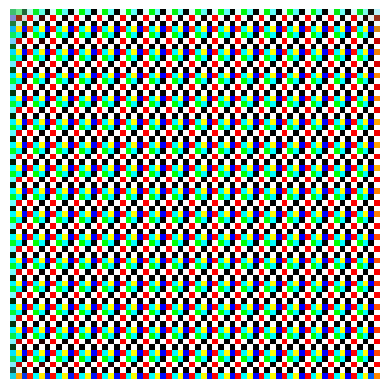

Epoch 4131, Generator Loss: 10.4366, Discriminator Loss: 0.0003
Epoch 4132, Generator Loss: 10.4777, Discriminator Loss: 0.0004
Epoch 4133, Generator Loss: 10.5142, Discriminator Loss: 0.0003
Epoch 4134, Generator Loss: 10.5783, Discriminator Loss: 0.0004
Epoch 4135, Generator Loss: 10.6206, Discriminator Loss: 0.0003
Epoch 4136, Generator Loss: 10.6290, Discriminator Loss: 0.0003
Epoch 4137, Generator Loss: 10.6342, Discriminator Loss: 0.0003
Epoch 4138, Generator Loss: 10.6137, Discriminator Loss: 0.0003
Epoch 4139, Generator Loss: 10.6607, Discriminator Loss: 0.0003
Epoch 4140, Generator Loss: 10.6283, Discriminator Loss: 0.0004


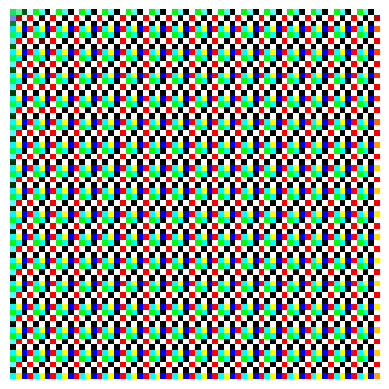

Epoch 4141, Generator Loss: 10.6771, Discriminator Loss: 0.0003
Epoch 4142, Generator Loss: 10.6849, Discriminator Loss: 0.0003
Epoch 4143, Generator Loss: 10.6594, Discriminator Loss: 0.0004
Epoch 4144, Generator Loss: 10.6411, Discriminator Loss: 0.0003
Epoch 4145, Generator Loss: 10.6515, Discriminator Loss: 0.0003
Epoch 4146, Generator Loss: 10.5738, Discriminator Loss: 0.0005
Epoch 4147, Generator Loss: 10.5922, Discriminator Loss: 0.0003
Epoch 4148, Generator Loss: 10.5728, Discriminator Loss: 0.0002
Epoch 4149, Generator Loss: 10.5041, Discriminator Loss: 0.0003
Epoch 4150, Generator Loss: 10.4760, Discriminator Loss: 0.0002


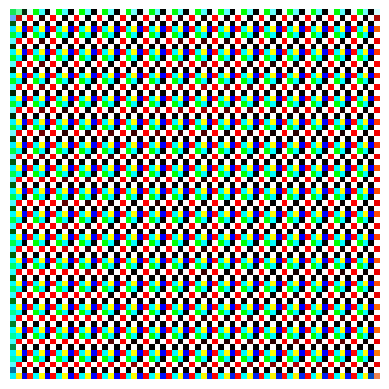

Epoch 4151, Generator Loss: 10.4395, Discriminator Loss: 0.0002
Epoch 4152, Generator Loss: 10.3262, Discriminator Loss: 0.0003
Epoch 4153, Generator Loss: 10.2082, Discriminator Loss: 0.0003
Epoch 4154, Generator Loss: 10.0966, Discriminator Loss: 0.0002
Epoch 4155, Generator Loss: 9.8540, Discriminator Loss: 0.0003
Epoch 4156, Generator Loss: 9.6265, Discriminator Loss: 0.0003
Epoch 4157, Generator Loss: 9.3691, Discriminator Loss: 0.0003
Epoch 4158, Generator Loss: 8.9682, Discriminator Loss: 0.0003
Epoch 4159, Generator Loss: 8.6343, Discriminator Loss: 0.0004
Epoch 4160, Generator Loss: 8.4779, Discriminator Loss: 0.0004


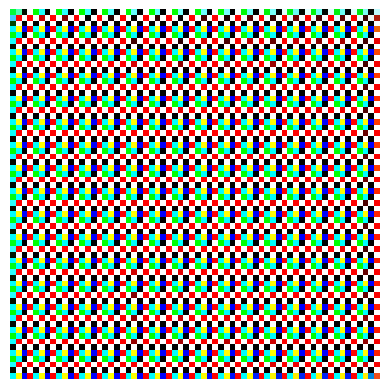

Epoch 4161, Generator Loss: 8.3566, Discriminator Loss: 0.0004
Epoch 4162, Generator Loss: 8.2586, Discriminator Loss: 0.0005
Epoch 4163, Generator Loss: 8.2533, Discriminator Loss: 0.0005
Epoch 4164, Generator Loss: 8.2490, Discriminator Loss: 0.0005
Epoch 4165, Generator Loss: 8.2800, Discriminator Loss: 0.0004
Epoch 4166, Generator Loss: 8.3041, Discriminator Loss: 0.0005
Epoch 4167, Generator Loss: 8.3196, Discriminator Loss: 0.0005
Epoch 4168, Generator Loss: 8.3711, Discriminator Loss: 0.0004
Epoch 4169, Generator Loss: 8.4122, Discriminator Loss: 0.0004
Epoch 4170, Generator Loss: 8.4728, Discriminator Loss: 0.0003


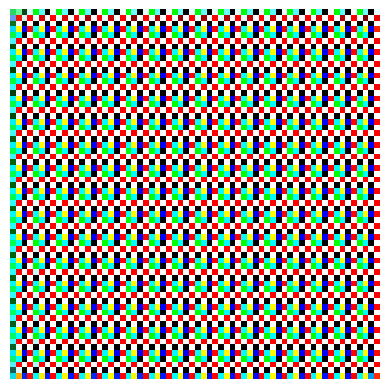

Epoch 4171, Generator Loss: 8.4966, Discriminator Loss: 0.0003
Epoch 4172, Generator Loss: 8.5351, Discriminator Loss: 0.0004
Epoch 4173, Generator Loss: 8.5890, Discriminator Loss: 0.0004
Epoch 4174, Generator Loss: 8.6463, Discriminator Loss: 0.0004
Epoch 4175, Generator Loss: 8.6896, Discriminator Loss: 0.0004
Epoch 4176, Generator Loss: 8.7347, Discriminator Loss: 0.0003
Epoch 4177, Generator Loss: 8.7868, Discriminator Loss: 0.0004
Epoch 4178, Generator Loss: 8.8286, Discriminator Loss: 0.0003
Epoch 4179, Generator Loss: 8.8720, Discriminator Loss: 0.0003
Epoch 4180, Generator Loss: 8.9177, Discriminator Loss: 0.0003


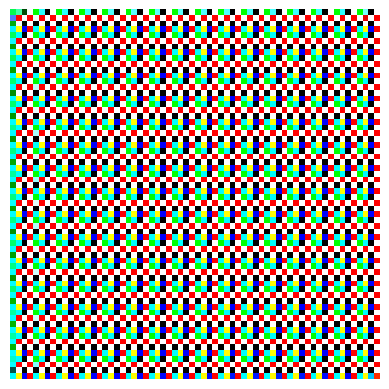

Epoch 4181, Generator Loss: 8.9524, Discriminator Loss: 0.0003
Epoch 4182, Generator Loss: 9.0053, Discriminator Loss: 0.0003
Epoch 4183, Generator Loss: 9.0322, Discriminator Loss: 0.0004
Epoch 4184, Generator Loss: 9.0663, Discriminator Loss: 0.0003
Epoch 4185, Generator Loss: 9.1165, Discriminator Loss: 0.0003
Epoch 4186, Generator Loss: 9.1417, Discriminator Loss: 0.0002
Epoch 4187, Generator Loss: 9.1666, Discriminator Loss: 0.0003
Epoch 4188, Generator Loss: 9.2173, Discriminator Loss: 0.0003
Epoch 4189, Generator Loss: 9.2480, Discriminator Loss: 0.0003
Epoch 4190, Generator Loss: 9.2895, Discriminator Loss: 0.0003


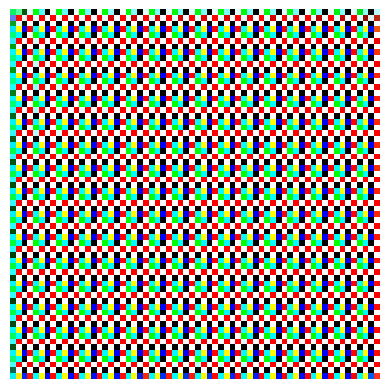

Epoch 4191, Generator Loss: 9.2995, Discriminator Loss: 0.0003
Epoch 4192, Generator Loss: 9.3286, Discriminator Loss: 0.0003
Epoch 4193, Generator Loss: 9.3519, Discriminator Loss: 0.0003
Epoch 4194, Generator Loss: 9.3852, Discriminator Loss: 0.0003
Epoch 4195, Generator Loss: 9.4305, Discriminator Loss: 0.0003
Epoch 4196, Generator Loss: 9.4268, Discriminator Loss: 0.0003
Epoch 4197, Generator Loss: 9.4458, Discriminator Loss: 0.0002
Epoch 4198, Generator Loss: 9.4760, Discriminator Loss: 0.0003
Epoch 4199, Generator Loss: 9.4880, Discriminator Loss: 0.0003
Epoch 4200, Generator Loss: 9.4947, Discriminator Loss: 0.0003


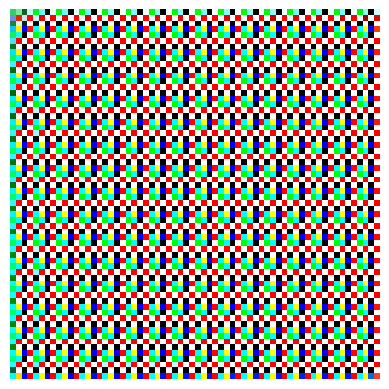

Epoch 4201, Generator Loss: 9.5263, Discriminator Loss: 0.0003
Epoch 4202, Generator Loss: 9.5447, Discriminator Loss: 0.0002
Epoch 4203, Generator Loss: 9.5616, Discriminator Loss: 0.0002
Epoch 4204, Generator Loss: 9.5581, Discriminator Loss: 0.0003
Epoch 4205, Generator Loss: 9.5919, Discriminator Loss: 0.0002
Epoch 4206, Generator Loss: 9.6135, Discriminator Loss: 0.0003
Epoch 4207, Generator Loss: 9.6104, Discriminator Loss: 0.0002
Epoch 4208, Generator Loss: 9.6206, Discriminator Loss: 0.0003
Epoch 4209, Generator Loss: 9.6517, Discriminator Loss: 0.0002
Epoch 4210, Generator Loss: 9.6599, Discriminator Loss: 0.0002


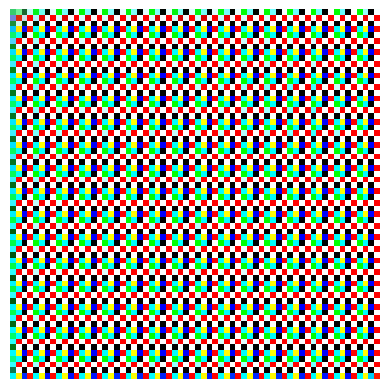

Epoch 4211, Generator Loss: 9.6473, Discriminator Loss: 0.0003
Epoch 4212, Generator Loss: 9.6650, Discriminator Loss: 0.0002
Epoch 4213, Generator Loss: 9.6794, Discriminator Loss: 0.0002
Epoch 4214, Generator Loss: 9.6846, Discriminator Loss: 0.0002
Epoch 4215, Generator Loss: 9.7036, Discriminator Loss: 0.0002
Epoch 4216, Generator Loss: 9.7088, Discriminator Loss: 0.0002
Epoch 4217, Generator Loss: 9.7212, Discriminator Loss: 0.0002
Epoch 4218, Generator Loss: 9.7326, Discriminator Loss: 0.0002
Epoch 4219, Generator Loss: 9.7501, Discriminator Loss: 0.0002
Epoch 4220, Generator Loss: 9.7544, Discriminator Loss: 0.0002


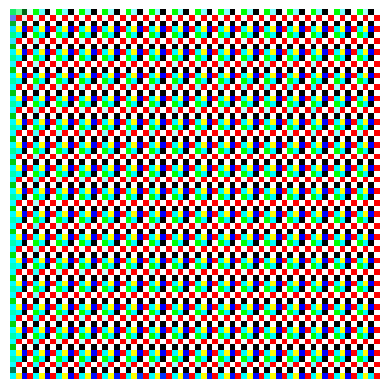

Epoch 4221, Generator Loss: 9.7490, Discriminator Loss: 0.0002
Epoch 4222, Generator Loss: 9.7396, Discriminator Loss: 0.0002
Epoch 4223, Generator Loss: 9.7689, Discriminator Loss: 0.0002
Epoch 4224, Generator Loss: 9.7643, Discriminator Loss: 0.0002
Epoch 4225, Generator Loss: 9.7736, Discriminator Loss: 0.0002
Epoch 4226, Generator Loss: 9.7731, Discriminator Loss: 0.0002
Epoch 4227, Generator Loss: 9.7831, Discriminator Loss: 0.0002
Epoch 4228, Generator Loss: 9.7956, Discriminator Loss: 0.0002
Epoch 4229, Generator Loss: 9.8001, Discriminator Loss: 0.0002
Epoch 4230, Generator Loss: 9.7844, Discriminator Loss: 0.0002


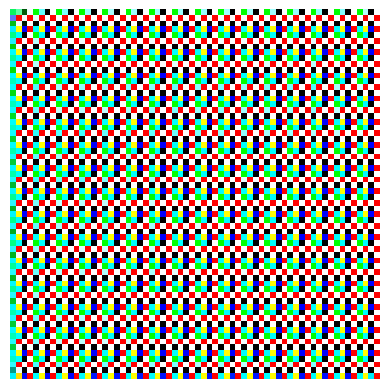

Epoch 4231, Generator Loss: 9.8240, Discriminator Loss: 0.0002
Epoch 4232, Generator Loss: 9.8154, Discriminator Loss: 0.0002
Epoch 4233, Generator Loss: 9.8275, Discriminator Loss: 0.0002
Epoch 4234, Generator Loss: 9.8427, Discriminator Loss: 0.0002
Epoch 4235, Generator Loss: 9.8233, Discriminator Loss: 0.0002
Epoch 4236, Generator Loss: 9.8500, Discriminator Loss: 0.0002
Epoch 4237, Generator Loss: 9.8172, Discriminator Loss: 0.0002
Epoch 4238, Generator Loss: 9.8681, Discriminator Loss: 0.0002
Epoch 4239, Generator Loss: 9.8351, Discriminator Loss: 0.0002
Epoch 4240, Generator Loss: 9.8502, Discriminator Loss: 0.0002


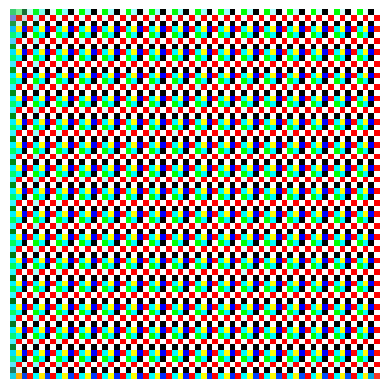

Epoch 4241, Generator Loss: 9.8499, Discriminator Loss: 0.0002
Epoch 4242, Generator Loss: 9.8517, Discriminator Loss: 0.0002
Epoch 4243, Generator Loss: 9.8681, Discriminator Loss: 0.0002
Epoch 4244, Generator Loss: 9.8539, Discriminator Loss: 0.0002
Epoch 4245, Generator Loss: 9.8807, Discriminator Loss: 0.0002
Epoch 4246, Generator Loss: 9.8882, Discriminator Loss: 0.0002
Epoch 4247, Generator Loss: 9.8806, Discriminator Loss: 0.0002
Epoch 4248, Generator Loss: 9.8776, Discriminator Loss: 0.0002
Epoch 4249, Generator Loss: 9.8959, Discriminator Loss: 0.0002
Epoch 4250, Generator Loss: 9.9126, Discriminator Loss: 0.0002


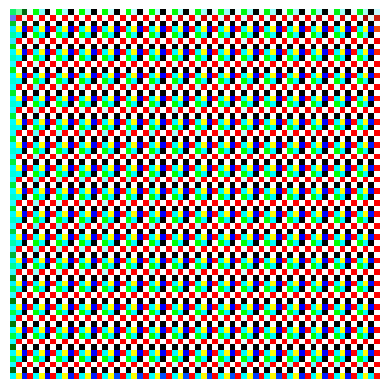

Epoch 4251, Generator Loss: 9.9222, Discriminator Loss: 0.0002
Epoch 4252, Generator Loss: 9.8990, Discriminator Loss: 0.0001
Epoch 4253, Generator Loss: 9.9110, Discriminator Loss: 0.0002
Epoch 4254, Generator Loss: 9.9293, Discriminator Loss: 0.0002
Epoch 4255, Generator Loss: 9.9337, Discriminator Loss: 0.0002
Epoch 4256, Generator Loss: 9.9310, Discriminator Loss: 0.0002
Epoch 4257, Generator Loss: 9.9318, Discriminator Loss: 0.0002
Epoch 4258, Generator Loss: 9.9398, Discriminator Loss: 0.0002
Epoch 4259, Generator Loss: 9.9500, Discriminator Loss: 0.0002
Epoch 4260, Generator Loss: 9.9409, Discriminator Loss: 0.0002


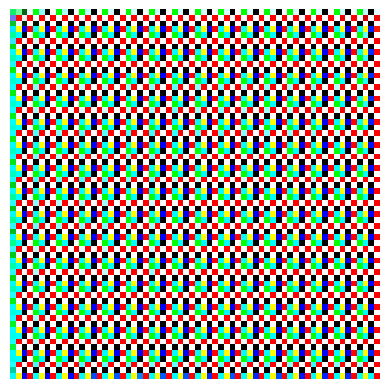

Epoch 4261, Generator Loss: 9.9167, Discriminator Loss: 0.0002
Epoch 4262, Generator Loss: 9.9561, Discriminator Loss: 0.0002
Epoch 4263, Generator Loss: 9.9148, Discriminator Loss: 0.0002
Epoch 4264, Generator Loss: 9.9370, Discriminator Loss: 0.0002
Epoch 4265, Generator Loss: 9.9215, Discriminator Loss: 0.0002
Epoch 4266, Generator Loss: 9.9338, Discriminator Loss: 0.0002
Epoch 4267, Generator Loss: 9.9279, Discriminator Loss: 0.0002
Epoch 4268, Generator Loss: 9.9282, Discriminator Loss: 0.0002
Epoch 4269, Generator Loss: 9.9089, Discriminator Loss: 0.0002
Epoch 4270, Generator Loss: 9.8854, Discriminator Loss: 0.0002


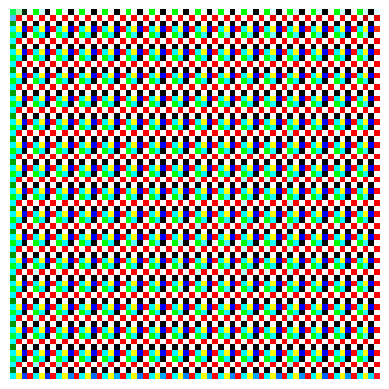

Epoch 4271, Generator Loss: 9.8740, Discriminator Loss: 0.0001
Epoch 4272, Generator Loss: 9.8544, Discriminator Loss: 0.0002
Epoch 4273, Generator Loss: 9.8028, Discriminator Loss: 0.0001
Epoch 4274, Generator Loss: 9.7046, Discriminator Loss: 0.0002
Epoch 4275, Generator Loss: 9.6573, Discriminator Loss: 0.0002
Epoch 4276, Generator Loss: 9.4961, Discriminator Loss: 0.0002
Epoch 4277, Generator Loss: 9.1308, Discriminator Loss: 0.0002
Epoch 4278, Generator Loss: 8.4867, Discriminator Loss: 0.0003
Epoch 4279, Generator Loss: 7.6751, Discriminator Loss: 0.0006
Epoch 4280, Generator Loss: 6.9750, Discriminator Loss: 0.0010


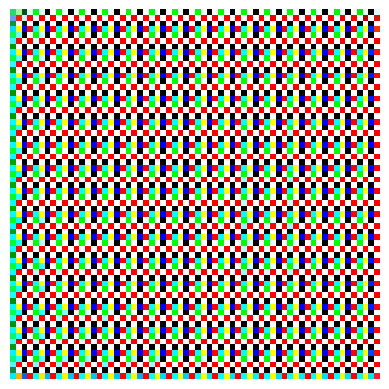

Epoch 4281, Generator Loss: 6.4972, Discriminator Loss: 0.0016
Epoch 4282, Generator Loss: 6.4403, Discriminator Loss: 0.0017
Epoch 4283, Generator Loss: 6.5393, Discriminator Loss: 0.0016
Epoch 4284, Generator Loss: 6.7303, Discriminator Loss: 0.0013
Epoch 4285, Generator Loss: 6.9591, Discriminator Loss: 0.0011
Epoch 4286, Generator Loss: 7.2227, Discriminator Loss: 0.0009
Epoch 4287, Generator Loss: 7.5107, Discriminator Loss: 0.0007
Epoch 4288, Generator Loss: 7.7553, Discriminator Loss: 0.0006
Epoch 4289, Generator Loss: 8.0192, Discriminator Loss: 0.0005
Epoch 4290, Generator Loss: 8.2495, Discriminator Loss: 0.0004


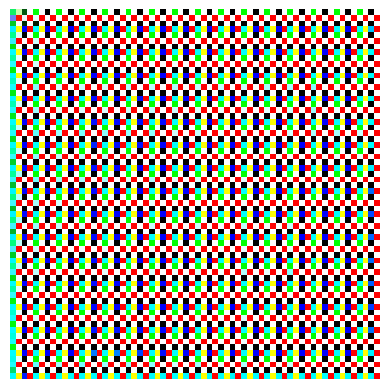

Epoch 4291, Generator Loss: 8.4718, Discriminator Loss: 0.0004
Epoch 4292, Generator Loss: 8.6732, Discriminator Loss: 0.0004
Epoch 4293, Generator Loss: 8.8803, Discriminator Loss: 0.0003
Epoch 4294, Generator Loss: 9.0424, Discriminator Loss: 0.0003
Epoch 4295, Generator Loss: 9.1870, Discriminator Loss: 0.0004
Epoch 4296, Generator Loss: 9.3331, Discriminator Loss: 0.0003
Epoch 4297, Generator Loss: 9.4414, Discriminator Loss: 0.0003
Epoch 4298, Generator Loss: 9.5520, Discriminator Loss: 0.0002
Epoch 4299, Generator Loss: 9.6659, Discriminator Loss: 0.0003
Epoch 4300, Generator Loss: 9.6983, Discriminator Loss: 0.0003


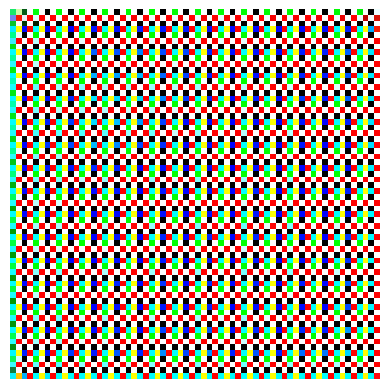

Epoch 4301, Generator Loss: 9.7552, Discriminator Loss: 0.0003
Epoch 4302, Generator Loss: 9.7394, Discriminator Loss: 0.0003
Epoch 4303, Generator Loss: 9.7012, Discriminator Loss: 0.0003
Epoch 4304, Generator Loss: 9.6486, Discriminator Loss: 0.0003
Epoch 4305, Generator Loss: 9.5575, Discriminator Loss: 0.0003
Epoch 4306, Generator Loss: 9.4721, Discriminator Loss: 0.0003
Epoch 4307, Generator Loss: 9.4462, Discriminator Loss: 0.0003
Epoch 4308, Generator Loss: 9.4339, Discriminator Loss: 0.0004
Epoch 4309, Generator Loss: 9.4635, Discriminator Loss: 0.0003
Epoch 4310, Generator Loss: 9.4499, Discriminator Loss: 0.0003


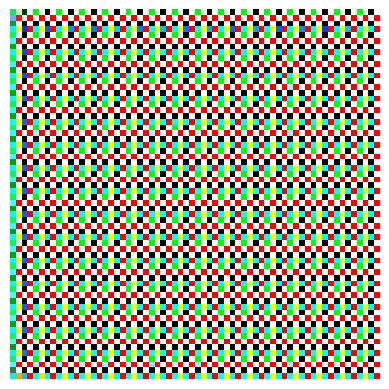

Epoch 4311, Generator Loss: 9.4944, Discriminator Loss: 0.0003
Epoch 4312, Generator Loss: 9.5094, Discriminator Loss: 0.0004
Epoch 4313, Generator Loss: 9.5284, Discriminator Loss: 0.0004
Epoch 4314, Generator Loss: 9.5382, Discriminator Loss: 0.0003
Epoch 4315, Generator Loss: 9.5642, Discriminator Loss: 0.0003
Epoch 4316, Generator Loss: 9.5744, Discriminator Loss: 0.0002
Epoch 4317, Generator Loss: 9.5937, Discriminator Loss: 0.0003
Epoch 4318, Generator Loss: 9.6099, Discriminator Loss: 0.0003
Epoch 4319, Generator Loss: 9.6262, Discriminator Loss: 0.0003
Epoch 4320, Generator Loss: 9.6324, Discriminator Loss: 0.0003


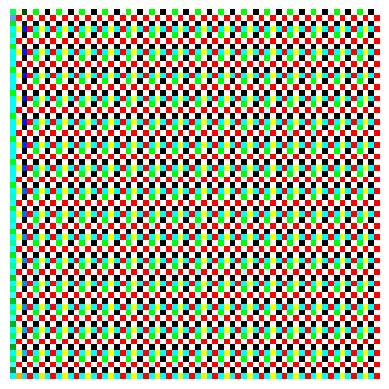

Epoch 4321, Generator Loss: 9.6500, Discriminator Loss: 0.0003
Epoch 4322, Generator Loss: 9.6586, Discriminator Loss: 0.0003
Epoch 4323, Generator Loss: 9.6682, Discriminator Loss: 0.0003
Epoch 4324, Generator Loss: 9.6797, Discriminator Loss: 0.0003
Epoch 4325, Generator Loss: 9.6791, Discriminator Loss: 0.0003
Epoch 4326, Generator Loss: 9.7002, Discriminator Loss: 0.0003
Epoch 4327, Generator Loss: 9.7112, Discriminator Loss: 0.0003
Epoch 4328, Generator Loss: 9.7044, Discriminator Loss: 0.0002
Epoch 4329, Generator Loss: 9.7135, Discriminator Loss: 0.0003
Epoch 4330, Generator Loss: 9.7180, Discriminator Loss: 0.0003


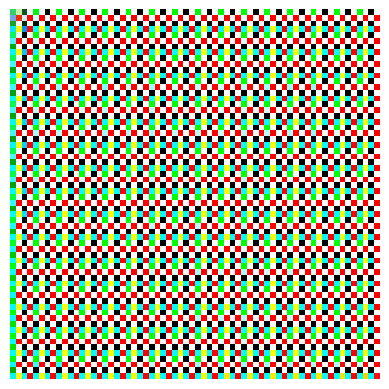

Epoch 4331, Generator Loss: 9.7277, Discriminator Loss: 0.0003
Epoch 4332, Generator Loss: 9.7329, Discriminator Loss: 0.0002
Epoch 4333, Generator Loss: 9.7348, Discriminator Loss: 0.0002
Epoch 4334, Generator Loss: 9.7437, Discriminator Loss: 0.0003
Epoch 4335, Generator Loss: 9.7427, Discriminator Loss: 0.0002
Epoch 4336, Generator Loss: 9.7436, Discriminator Loss: 0.0003
Epoch 4337, Generator Loss: 9.7579, Discriminator Loss: 0.0003
Epoch 4338, Generator Loss: 9.7559, Discriminator Loss: 0.0002
Epoch 4339, Generator Loss: 9.7555, Discriminator Loss: 0.0003
Epoch 4340, Generator Loss: 9.7615, Discriminator Loss: 0.0003


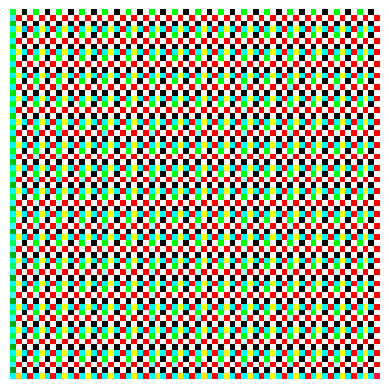

Epoch 4341, Generator Loss: 9.7728, Discriminator Loss: 0.0002
Epoch 4342, Generator Loss: 9.7769, Discriminator Loss: 0.0003
Epoch 4343, Generator Loss: 9.7768, Discriminator Loss: 0.0002
Epoch 4344, Generator Loss: 9.7878, Discriminator Loss: 0.0002
Epoch 4345, Generator Loss: 9.7839, Discriminator Loss: 0.0002
Epoch 4346, Generator Loss: 9.7947, Discriminator Loss: 0.0002
Epoch 4347, Generator Loss: 9.8070, Discriminator Loss: 0.0002
Epoch 4348, Generator Loss: 9.7997, Discriminator Loss: 0.0002
Epoch 4349, Generator Loss: 9.8116, Discriminator Loss: 0.0003
Epoch 4350, Generator Loss: 9.8090, Discriminator Loss: 0.0002


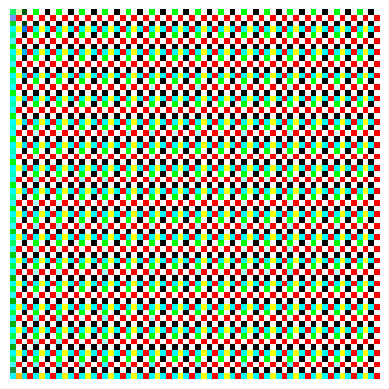

Epoch 4351, Generator Loss: 9.8120, Discriminator Loss: 0.0002
Epoch 4352, Generator Loss: 9.8142, Discriminator Loss: 0.0002
Epoch 4353, Generator Loss: 9.8243, Discriminator Loss: 0.0002
Epoch 4354, Generator Loss: 9.8234, Discriminator Loss: 0.0002
Epoch 4355, Generator Loss: 9.8323, Discriminator Loss: 0.0002
Epoch 4356, Generator Loss: 9.8472, Discriminator Loss: 0.0002
Epoch 4357, Generator Loss: 9.8405, Discriminator Loss: 0.0002
Epoch 4358, Generator Loss: 9.8482, Discriminator Loss: 0.0002
Epoch 4359, Generator Loss: 9.8391, Discriminator Loss: 0.0002
Epoch 4360, Generator Loss: 9.8580, Discriminator Loss: 0.0002


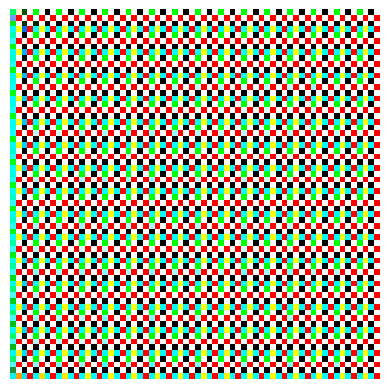

Epoch 4361, Generator Loss: 9.8675, Discriminator Loss: 0.0002
Epoch 4362, Generator Loss: 9.8649, Discriminator Loss: 0.0002
Epoch 4363, Generator Loss: 9.8773, Discriminator Loss: 0.0002
Epoch 4364, Generator Loss: 9.8816, Discriminator Loss: 0.0002
Epoch 4365, Generator Loss: 9.8808, Discriminator Loss: 0.0002
Epoch 4366, Generator Loss: 9.8888, Discriminator Loss: 0.0002
Epoch 4367, Generator Loss: 9.8909, Discriminator Loss: 0.0002
Epoch 4368, Generator Loss: 9.9001, Discriminator Loss: 0.0002
Epoch 4369, Generator Loss: 9.9029, Discriminator Loss: 0.0002
Epoch 4370, Generator Loss: 9.9093, Discriminator Loss: 0.0002


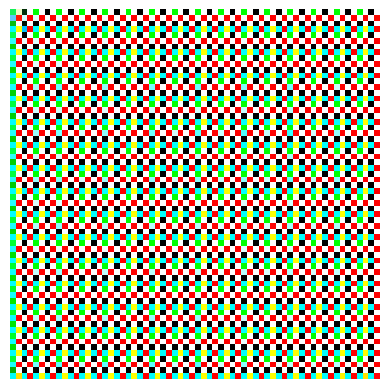

Epoch 4371, Generator Loss: 9.9172, Discriminator Loss: 0.0002
Epoch 4372, Generator Loss: 9.9227, Discriminator Loss: 0.0002
Epoch 4373, Generator Loss: 9.9287, Discriminator Loss: 0.0002
Epoch 4374, Generator Loss: 9.9289, Discriminator Loss: 0.0002
Epoch 4375, Generator Loss: 9.9386, Discriminator Loss: 0.0002
Epoch 4376, Generator Loss: 9.9438, Discriminator Loss: 0.0002
Epoch 4377, Generator Loss: 9.9517, Discriminator Loss: 0.0002
Epoch 4378, Generator Loss: 9.9506, Discriminator Loss: 0.0002
Epoch 4379, Generator Loss: 9.9632, Discriminator Loss: 0.0002
Epoch 4380, Generator Loss: 9.9643, Discriminator Loss: 0.0002


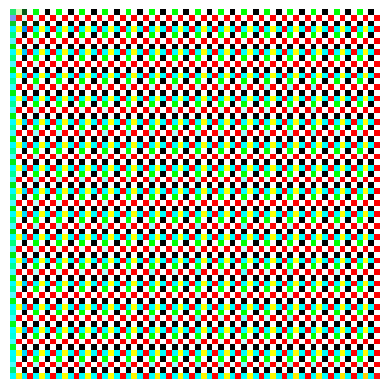

Epoch 4381, Generator Loss: 9.9674, Discriminator Loss: 0.0001
Epoch 4382, Generator Loss: 9.9695, Discriminator Loss: 0.0002
Epoch 4383, Generator Loss: 9.9750, Discriminator Loss: 0.0002
Epoch 4384, Generator Loss: 9.9803, Discriminator Loss: 0.0002
Epoch 4385, Generator Loss: 9.9820, Discriminator Loss: 0.0002
Epoch 4386, Generator Loss: 9.9743, Discriminator Loss: 0.0002
Epoch 4387, Generator Loss: 9.9875, Discriminator Loss: 0.0002
Epoch 4388, Generator Loss: 9.9891, Discriminator Loss: 0.0002
Epoch 4389, Generator Loss: 9.9936, Discriminator Loss: 0.0001
Epoch 4390, Generator Loss: 9.9911, Discriminator Loss: 0.0002


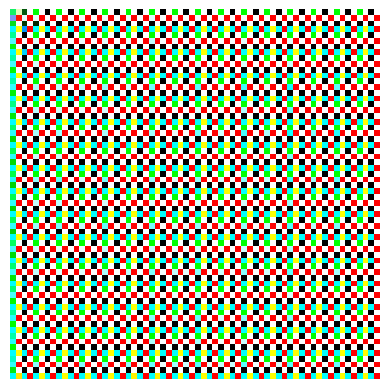

Epoch 4391, Generator Loss: 9.9678, Discriminator Loss: 0.0002
Epoch 4392, Generator Loss: 9.9590, Discriminator Loss: 0.0002
Epoch 4393, Generator Loss: 9.9507, Discriminator Loss: 0.0002
Epoch 4394, Generator Loss: 9.9483, Discriminator Loss: 0.0002
Epoch 4395, Generator Loss: 9.9316, Discriminator Loss: 0.0002
Epoch 4396, Generator Loss: 9.8914, Discriminator Loss: 0.0002
Epoch 4397, Generator Loss: 9.8282, Discriminator Loss: 0.0001
Epoch 4398, Generator Loss: 9.7008, Discriminator Loss: 0.0002
Epoch 4399, Generator Loss: 9.5618, Discriminator Loss: 0.0002
Epoch 4400, Generator Loss: 9.3453, Discriminator Loss: 0.0002


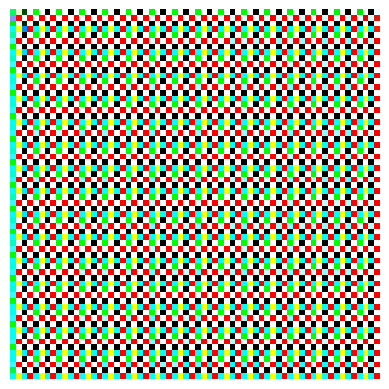

Epoch 4401, Generator Loss: 8.9362, Discriminator Loss: 0.0003
Epoch 4402, Generator Loss: 7.9281, Discriminator Loss: 0.0007
Epoch 4403, Generator Loss: 7.0468, Discriminator Loss: 0.0019
Epoch 4404, Generator Loss: 5.8995, Discriminator Loss: 0.0043
Epoch 4405, Generator Loss: 5.9260, Discriminator Loss: 0.0051
Epoch 4406, Generator Loss: 5.4869, Discriminator Loss: 0.0063
Epoch 4407, Generator Loss: 5.6932, Discriminator Loss: 0.0044
Epoch 4408, Generator Loss: 5.9829, Discriminator Loss: 0.0029
Epoch 4409, Generator Loss: 6.6077, Discriminator Loss: 0.0016
Epoch 4410, Generator Loss: 7.2784, Discriminator Loss: 0.0010


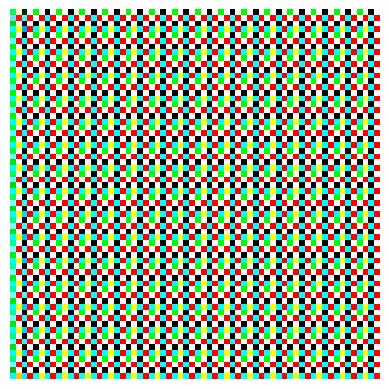

Epoch 4411, Generator Loss: 7.9950, Discriminator Loss: 0.0006
Epoch 4412, Generator Loss: 8.6935, Discriminator Loss: 0.0006
Epoch 4413, Generator Loss: 9.3074, Discriminator Loss: 0.0006
Epoch 4414, Generator Loss: 9.8885, Discriminator Loss: 0.0007
Epoch 4415, Generator Loss: 10.4171, Discriminator Loss: 0.0007
Epoch 4416, Generator Loss: 10.8668, Discriminator Loss: 0.0008
Epoch 4417, Generator Loss: 11.2752, Discriminator Loss: 0.0008
Epoch 4418, Generator Loss: 11.6300, Discriminator Loss: 0.0010
Epoch 4419, Generator Loss: 11.9513, Discriminator Loss: 0.0009
Epoch 4420, Generator Loss: 12.2157, Discriminator Loss: 0.0010


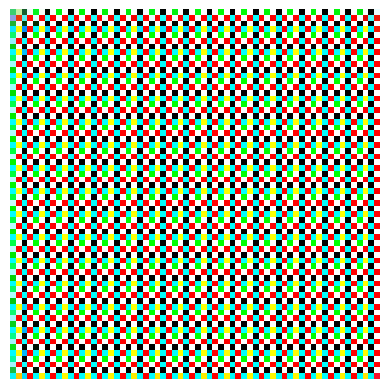

Epoch 4421, Generator Loss: 12.4622, Discriminator Loss: 0.0008
Epoch 4422, Generator Loss: 12.6589, Discriminator Loss: 0.0009
Epoch 4423, Generator Loss: 12.8244, Discriminator Loss: 0.0008
Epoch 4424, Generator Loss: 12.9806, Discriminator Loss: 0.0008
Epoch 4425, Generator Loss: 13.0908, Discriminator Loss: 0.0009
Epoch 4426, Generator Loss: 13.2018, Discriminator Loss: 0.0010
Epoch 4427, Generator Loss: 13.2810, Discriminator Loss: 0.0012
Epoch 4428, Generator Loss: 13.3380, Discriminator Loss: 0.0008
Epoch 4429, Generator Loss: 13.3590, Discriminator Loss: 0.0008
Epoch 4430, Generator Loss: 13.3995, Discriminator Loss: 0.0007


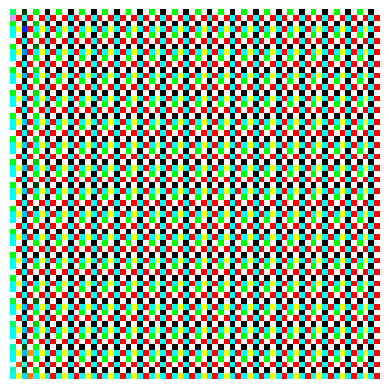

Epoch 4431, Generator Loss: 13.3937, Discriminator Loss: 0.0007
Epoch 4432, Generator Loss: 13.4141, Discriminator Loss: 0.0006
Epoch 4433, Generator Loss: 13.3948, Discriminator Loss: 0.0007
Epoch 4434, Generator Loss: 13.3995, Discriminator Loss: 0.0007
Epoch 4435, Generator Loss: 13.3666, Discriminator Loss: 0.0006
Epoch 4436, Generator Loss: 13.3402, Discriminator Loss: 0.0006
Epoch 4437, Generator Loss: 13.3232, Discriminator Loss: 0.0005
Epoch 4438, Generator Loss: 13.2867, Discriminator Loss: 0.0005
Epoch 4439, Generator Loss: 13.2498, Discriminator Loss: 0.0004
Epoch 4440, Generator Loss: 13.2322, Discriminator Loss: 0.0003


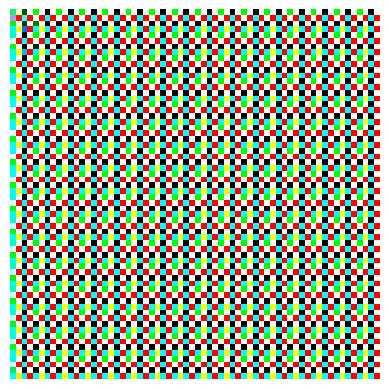

Epoch 4441, Generator Loss: 13.1741, Discriminator Loss: 0.0004
Epoch 4442, Generator Loss: 13.1550, Discriminator Loss: 0.0005
Epoch 4443, Generator Loss: 13.1021, Discriminator Loss: 0.0003
Epoch 4444, Generator Loss: 13.0809, Discriminator Loss: 0.0003
Epoch 4445, Generator Loss: 13.0208, Discriminator Loss: 0.0003
Epoch 4446, Generator Loss: 12.9967, Discriminator Loss: 0.0003
Epoch 4447, Generator Loss: 12.9480, Discriminator Loss: 0.0003
Epoch 4448, Generator Loss: 12.8855, Discriminator Loss: 0.0003
Epoch 4449, Generator Loss: 12.8745, Discriminator Loss: 0.0002
Epoch 4450, Generator Loss: 12.8277, Discriminator Loss: 0.0003


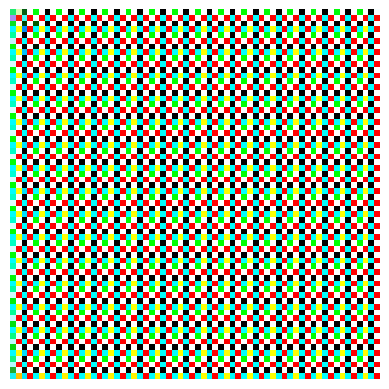

Epoch 4451, Generator Loss: 12.7894, Discriminator Loss: 0.0003
Epoch 4452, Generator Loss: 12.7483, Discriminator Loss: 0.0002
Epoch 4453, Generator Loss: 12.7061, Discriminator Loss: 0.0003
Epoch 4454, Generator Loss: 12.6668, Discriminator Loss: 0.0002
Epoch 4455, Generator Loss: 12.6622, Discriminator Loss: 0.0002
Epoch 4456, Generator Loss: 12.6072, Discriminator Loss: 0.0003
Epoch 4457, Generator Loss: 12.5577, Discriminator Loss: 0.0002
Epoch 4458, Generator Loss: 12.5204, Discriminator Loss: 0.0002
Epoch 4459, Generator Loss: 12.4946, Discriminator Loss: 0.0002
Epoch 4460, Generator Loss: 12.4553, Discriminator Loss: 0.0002


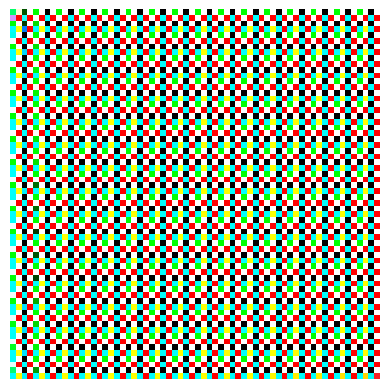

Epoch 4461, Generator Loss: 12.4155, Discriminator Loss: 0.0002
Epoch 4462, Generator Loss: 12.4018, Discriminator Loss: 0.0002
Epoch 4463, Generator Loss: 12.3905, Discriminator Loss: 0.0002
Epoch 4464, Generator Loss: 12.3463, Discriminator Loss: 0.0002
Epoch 4465, Generator Loss: 12.3035, Discriminator Loss: 0.0001
Epoch 4466, Generator Loss: 12.2792, Discriminator Loss: 0.0002
Epoch 4467, Generator Loss: 12.2373, Discriminator Loss: 0.0002
Epoch 4468, Generator Loss: 12.2089, Discriminator Loss: 0.0002
Epoch 4469, Generator Loss: 12.2074, Discriminator Loss: 0.0001
Epoch 4470, Generator Loss: 12.1489, Discriminator Loss: 0.0001


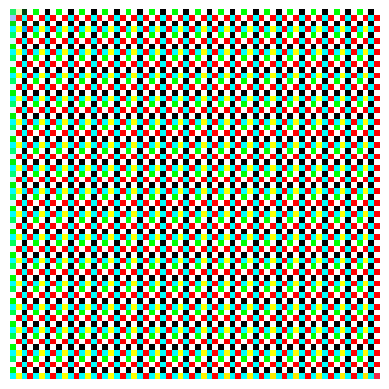

Epoch 4471, Generator Loss: 12.1569, Discriminator Loss: 0.0002
Epoch 4472, Generator Loss: 12.1130, Discriminator Loss: 0.0001
Epoch 4473, Generator Loss: 12.0991, Discriminator Loss: 0.0001
Epoch 4474, Generator Loss: 12.0426, Discriminator Loss: 0.0001
Epoch 4475, Generator Loss: 12.0517, Discriminator Loss: 0.0001
Epoch 4476, Generator Loss: 11.9976, Discriminator Loss: 0.0001
Epoch 4477, Generator Loss: 11.9938, Discriminator Loss: 0.0001
Epoch 4478, Generator Loss: 11.9503, Discriminator Loss: 0.0002
Epoch 4479, Generator Loss: 11.9848, Discriminator Loss: 0.0002
Epoch 4480, Generator Loss: 11.9249, Discriminator Loss: 0.0001


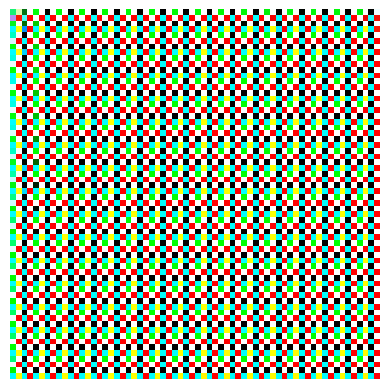

Epoch 4481, Generator Loss: 11.8783, Discriminator Loss: 0.0001
Epoch 4482, Generator Loss: 11.9007, Discriminator Loss: 0.0001
Epoch 4483, Generator Loss: 11.8549, Discriminator Loss: 0.0002
Epoch 4484, Generator Loss: 11.8298, Discriminator Loss: 0.0002
Epoch 4485, Generator Loss: 11.7964, Discriminator Loss: 0.0001
Epoch 4486, Generator Loss: 11.8380, Discriminator Loss: 0.0001
Epoch 4487, Generator Loss: 11.7537, Discriminator Loss: 0.0001
Epoch 4488, Generator Loss: 11.6965, Discriminator Loss: 0.0001
Epoch 4489, Generator Loss: 11.7317, Discriminator Loss: 0.0001
Epoch 4490, Generator Loss: 11.6344, Discriminator Loss: 0.0001


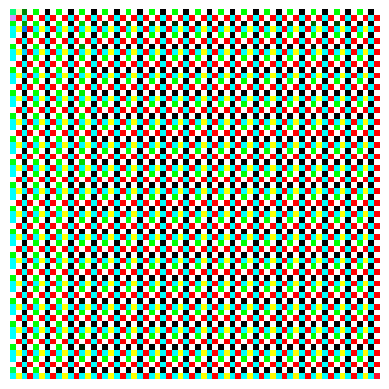

Epoch 4491, Generator Loss: 11.6286, Discriminator Loss: 0.0001
Epoch 4492, Generator Loss: 11.6339, Discriminator Loss: 0.0001
Epoch 4493, Generator Loss: 11.6312, Discriminator Loss: 0.0001
Epoch 4494, Generator Loss: 11.5422, Discriminator Loss: 0.0001
Epoch 4495, Generator Loss: 11.4147, Discriminator Loss: 0.0001
Epoch 4496, Generator Loss: 11.3941, Discriminator Loss: 0.0001
Epoch 4497, Generator Loss: 11.2527, Discriminator Loss: 0.0001
Epoch 4498, Generator Loss: 11.3356, Discriminator Loss: 0.0001
Epoch 4499, Generator Loss: 11.0180, Discriminator Loss: 0.0001
Epoch 4500, Generator Loss: 10.9839, Discriminator Loss: 0.0001


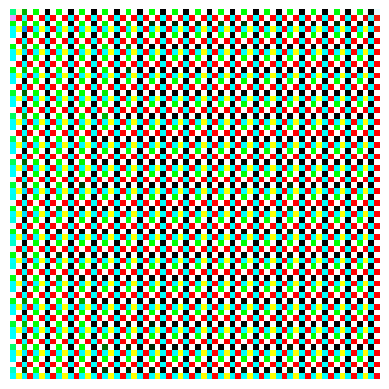

Epoch 4501, Generator Loss: 10.9344, Discriminator Loss: 0.0001
Epoch 4502, Generator Loss: 10.4591, Discriminator Loss: 0.0001
Epoch 4503, Generator Loss: 10.1367, Discriminator Loss: 0.0002
Epoch 4504, Generator Loss: 9.5148, Discriminator Loss: 0.0003
Epoch 4505, Generator Loss: 9.0771, Discriminator Loss: 0.0003
Epoch 4506, Generator Loss: 7.9621, Discriminator Loss: 0.0006
Epoch 4507, Generator Loss: 6.4382, Discriminator Loss: 0.0020
Epoch 4508, Generator Loss: 5.6496, Discriminator Loss: 0.0037
Epoch 4509, Generator Loss: 5.7454, Discriminator Loss: 0.0034
Epoch 4510, Generator Loss: 6.0360, Discriminator Loss: 0.0025


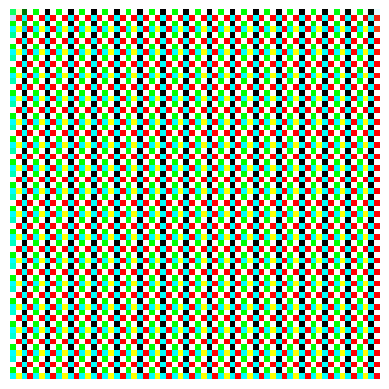

Epoch 4511, Generator Loss: 6.5576, Discriminator Loss: 0.0016
Epoch 4512, Generator Loss: 7.0861, Discriminator Loss: 0.0010
Epoch 4513, Generator Loss: 7.6296, Discriminator Loss: 0.0007
Epoch 4514, Generator Loss: 8.1222, Discriminator Loss: 0.0005
Epoch 4515, Generator Loss: 8.5674, Discriminator Loss: 0.0004
Epoch 4516, Generator Loss: 8.9876, Discriminator Loss: 0.0004
Epoch 4517, Generator Loss: 9.4159, Discriminator Loss: 0.0003
Epoch 4518, Generator Loss: 9.7489, Discriminator Loss: 0.0003
Epoch 4519, Generator Loss: 10.0959, Discriminator Loss: 0.0003
Epoch 4520, Generator Loss: 10.3496, Discriminator Loss: 0.0004


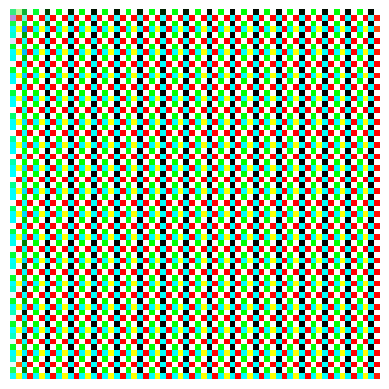

Epoch 4521, Generator Loss: 10.5847, Discriminator Loss: 0.0004
Epoch 4522, Generator Loss: 10.8108, Discriminator Loss: 0.0004
Epoch 4523, Generator Loss: 11.0105, Discriminator Loss: 0.0004
Epoch 4524, Generator Loss: 11.1746, Discriminator Loss: 0.0003
Epoch 4525, Generator Loss: 11.3489, Discriminator Loss: 0.0004
Epoch 4526, Generator Loss: 11.4560, Discriminator Loss: 0.0004
Epoch 4527, Generator Loss: 11.5701, Discriminator Loss: 0.0003
Epoch 4528, Generator Loss: 11.6893, Discriminator Loss: 0.0004
Epoch 4529, Generator Loss: 11.7831, Discriminator Loss: 0.0004
Epoch 4530, Generator Loss: 11.8303, Discriminator Loss: 0.0004


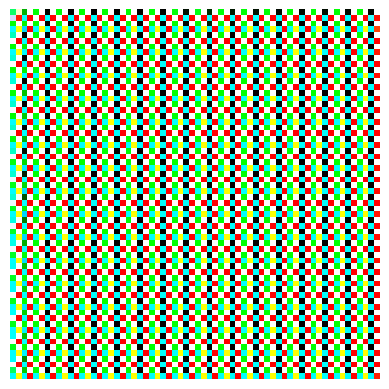

Epoch 4531, Generator Loss: 11.8907, Discriminator Loss: 0.0003
Epoch 4532, Generator Loss: 11.9400, Discriminator Loss: 0.0004
Epoch 4533, Generator Loss: 11.9908, Discriminator Loss: 0.0004
Epoch 4534, Generator Loss: 12.0038, Discriminator Loss: 0.0003
Epoch 4535, Generator Loss: 12.0387, Discriminator Loss: 0.0003
Epoch 4536, Generator Loss: 12.0420, Discriminator Loss: 0.0003
Epoch 4537, Generator Loss: 12.0679, Discriminator Loss: 0.0004
Epoch 4538, Generator Loss: 12.0649, Discriminator Loss: 0.0004
Epoch 4539, Generator Loss: 12.0601, Discriminator Loss: 0.0004
Epoch 4540, Generator Loss: 12.0646, Discriminator Loss: 0.0003


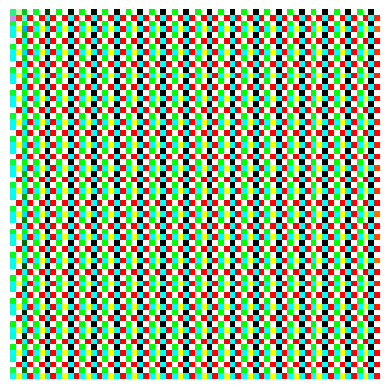

Epoch 4541, Generator Loss: 12.0465, Discriminator Loss: 0.0003
Epoch 4542, Generator Loss: 12.0391, Discriminator Loss: 0.0003
Epoch 4543, Generator Loss: 12.0359, Discriminator Loss: 0.0003
Epoch 4544, Generator Loss: 11.9926, Discriminator Loss: 0.0003
Epoch 4545, Generator Loss: 11.9882, Discriminator Loss: 0.0003
Epoch 4546, Generator Loss: 11.9640, Discriminator Loss: 0.0003
Epoch 4547, Generator Loss: 11.9259, Discriminator Loss: 0.0004
Epoch 4548, Generator Loss: 11.9021, Discriminator Loss: 0.0002
Epoch 4549, Generator Loss: 11.8893, Discriminator Loss: 0.0003
Epoch 4550, Generator Loss: 11.8415, Discriminator Loss: 0.0002


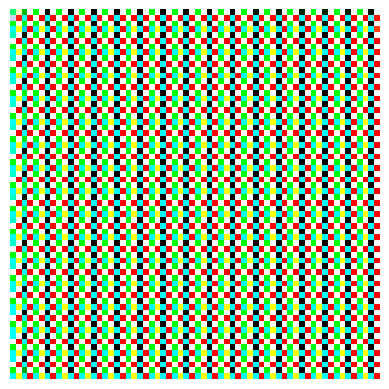

Epoch 4551, Generator Loss: 11.8432, Discriminator Loss: 0.0003
Epoch 4552, Generator Loss: 11.8166, Discriminator Loss: 0.0002
Epoch 4553, Generator Loss: 11.7616, Discriminator Loss: 0.0002
Epoch 4554, Generator Loss: 11.7449, Discriminator Loss: 0.0002
Epoch 4555, Generator Loss: 11.7404, Discriminator Loss: 0.0002
Epoch 4556, Generator Loss: 11.6851, Discriminator Loss: 0.0002
Epoch 4557, Generator Loss: 11.6499, Discriminator Loss: 0.0002
Epoch 4558, Generator Loss: 11.5858, Discriminator Loss: 0.0002
Epoch 4559, Generator Loss: 11.5996, Discriminator Loss: 0.0002
Epoch 4560, Generator Loss: 11.5519, Discriminator Loss: 0.0002


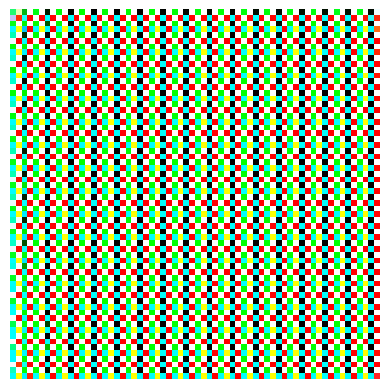

Epoch 4561, Generator Loss: 11.5136, Discriminator Loss: 0.0002
Epoch 4562, Generator Loss: 11.4941, Discriminator Loss: 0.0002
Epoch 4563, Generator Loss: 11.4296, Discriminator Loss: 0.0002
Epoch 4564, Generator Loss: 11.4151, Discriminator Loss: 0.0002
Epoch 4565, Generator Loss: 11.3608, Discriminator Loss: 0.0002
Epoch 4566, Generator Loss: 11.3905, Discriminator Loss: 0.0002
Epoch 4567, Generator Loss: 11.3821, Discriminator Loss: 0.0002
Epoch 4568, Generator Loss: 11.3245, Discriminator Loss: 0.0002
Epoch 4569, Generator Loss: 11.2957, Discriminator Loss: 0.0001
Epoch 4570, Generator Loss: 11.2186, Discriminator Loss: 0.0002


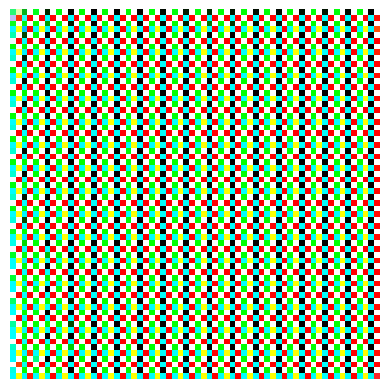

Epoch 4571, Generator Loss: 11.2225, Discriminator Loss: 0.0002
Epoch 4572, Generator Loss: 11.2069, Discriminator Loss: 0.0002
Epoch 4573, Generator Loss: 11.1945, Discriminator Loss: 0.0002
Epoch 4574, Generator Loss: 11.1430, Discriminator Loss: 0.0002
Epoch 4575, Generator Loss: 11.0823, Discriminator Loss: 0.0002
Epoch 4576, Generator Loss: 11.0661, Discriminator Loss: 0.0002
Epoch 4577, Generator Loss: 11.0682, Discriminator Loss: 0.0001
Epoch 4578, Generator Loss: 11.0870, Discriminator Loss: 0.0002
Epoch 4579, Generator Loss: 10.9831, Discriminator Loss: 0.0002
Epoch 4580, Generator Loss: 10.9893, Discriminator Loss: 0.0002


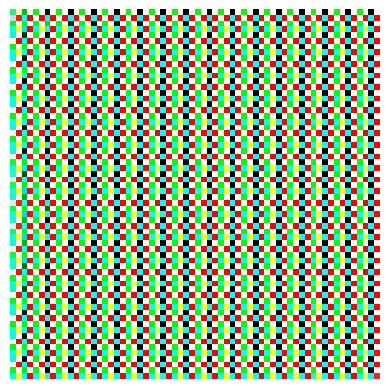

Epoch 4581, Generator Loss: 10.8813, Discriminator Loss: 0.0001
Epoch 4582, Generator Loss: 10.8973, Discriminator Loss: 0.0001
Epoch 4583, Generator Loss: 10.8398, Discriminator Loss: 0.0001
Epoch 4584, Generator Loss: 10.8090, Discriminator Loss: 0.0001
Epoch 4585, Generator Loss: 10.7894, Discriminator Loss: 0.0001
Epoch 4586, Generator Loss: 10.6553, Discriminator Loss: 0.0002
Epoch 4587, Generator Loss: 10.5985, Discriminator Loss: 0.0001
Epoch 4588, Generator Loss: 10.4465, Discriminator Loss: 0.0001
Epoch 4589, Generator Loss: 10.3880, Discriminator Loss: 0.0001
Epoch 4590, Generator Loss: 10.4492, Discriminator Loss: 0.0002


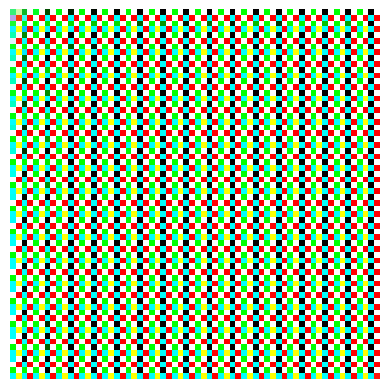

Epoch 4591, Generator Loss: 10.1223, Discriminator Loss: 0.0002
Epoch 4592, Generator Loss: 9.9911, Discriminator Loss: 0.0002
Epoch 4593, Generator Loss: 9.9542, Discriminator Loss: 0.0002
Epoch 4594, Generator Loss: 9.6166, Discriminator Loss: 0.0002
Epoch 4595, Generator Loss: 9.5885, Discriminator Loss: 0.0002
Epoch 4596, Generator Loss: 9.5924, Discriminator Loss: 0.0002
Epoch 4597, Generator Loss: 9.2463, Discriminator Loss: 0.0002
Epoch 4598, Generator Loss: 8.6437, Discriminator Loss: 0.0003
Epoch 4599, Generator Loss: 7.6908, Discriminator Loss: 0.0006
Epoch 4600, Generator Loss: 7.3139, Discriminator Loss: 0.0009


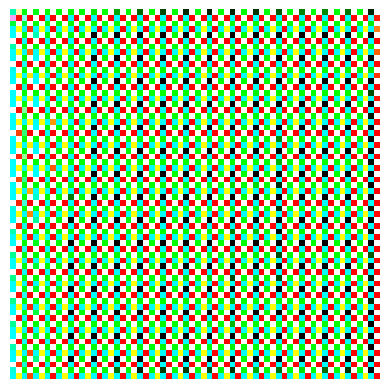

Epoch 4601, Generator Loss: 6.7756, Discriminator Loss: 0.0014
Epoch 4602, Generator Loss: 6.5726, Discriminator Loss: 0.0016
Epoch 4603, Generator Loss: 6.5894, Discriminator Loss: 0.0015
Epoch 4604, Generator Loss: 6.7619, Discriminator Loss: 0.0013
Epoch 4605, Generator Loss: 7.0427, Discriminator Loss: 0.0010
Epoch 4606, Generator Loss: 7.3181, Discriminator Loss: 0.0008
Epoch 4607, Generator Loss: 7.6454, Discriminator Loss: 0.0007
Epoch 4608, Generator Loss: 7.9648, Discriminator Loss: 0.0005
Epoch 4609, Generator Loss: 8.2675, Discriminator Loss: 0.0004
Epoch 4610, Generator Loss: 8.5636, Discriminator Loss: 0.0004


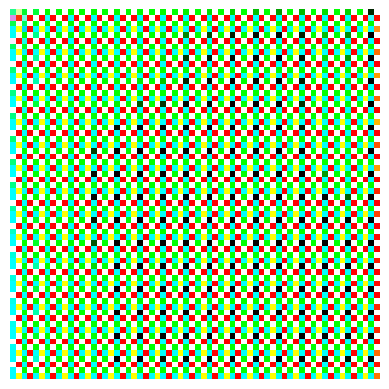

Epoch 4611, Generator Loss: 8.8248, Discriminator Loss: 0.0003
Epoch 4612, Generator Loss: 9.0857, Discriminator Loss: 0.0003
Epoch 4613, Generator Loss: 9.3174, Discriminator Loss: 0.0003
Epoch 4614, Generator Loss: 9.4993, Discriminator Loss: 0.0003
Epoch 4615, Generator Loss: 9.7122, Discriminator Loss: 0.0003
Epoch 4616, Generator Loss: 9.8821, Discriminator Loss: 0.0003
Epoch 4617, Generator Loss: 10.0383, Discriminator Loss: 0.0003
Epoch 4618, Generator Loss: 10.1478, Discriminator Loss: 0.0004
Epoch 4619, Generator Loss: 10.2839, Discriminator Loss: 0.0004
Epoch 4620, Generator Loss: 10.3779, Discriminator Loss: 0.0003


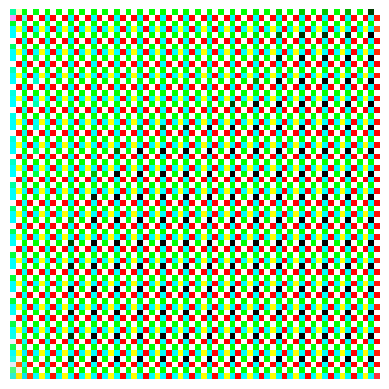

Epoch 4621, Generator Loss: 10.4772, Discriminator Loss: 0.0002
Epoch 4622, Generator Loss: 10.5437, Discriminator Loss: 0.0003
Epoch 4623, Generator Loss: 10.6189, Discriminator Loss: 0.0003
Epoch 4624, Generator Loss: 10.6947, Discriminator Loss: 0.0003
Epoch 4625, Generator Loss: 10.7485, Discriminator Loss: 0.0003
Epoch 4626, Generator Loss: 10.7532, Discriminator Loss: 0.0002
Epoch 4627, Generator Loss: 10.8162, Discriminator Loss: 0.0003
Epoch 4628, Generator Loss: 10.8686, Discriminator Loss: 0.0002
Epoch 4629, Generator Loss: 10.8638, Discriminator Loss: 0.0003
Epoch 4630, Generator Loss: 10.8777, Discriminator Loss: 0.0003


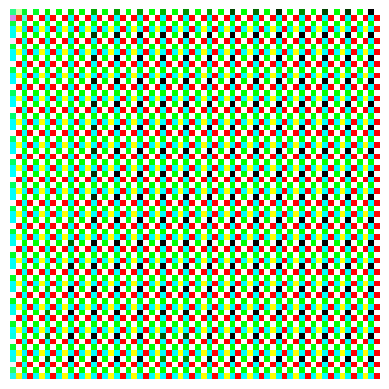

Epoch 4631, Generator Loss: 10.8878, Discriminator Loss: 0.0003
Epoch 4632, Generator Loss: 10.9402, Discriminator Loss: 0.0003
Epoch 4633, Generator Loss: 10.9194, Discriminator Loss: 0.0003
Epoch 4634, Generator Loss: 10.9295, Discriminator Loss: 0.0002
Epoch 4635, Generator Loss: 10.9492, Discriminator Loss: 0.0003
Epoch 4636, Generator Loss: 10.8911, Discriminator Loss: 0.0003
Epoch 4637, Generator Loss: 10.8701, Discriminator Loss: 0.0002
Epoch 4638, Generator Loss: 10.8831, Discriminator Loss: 0.0002
Epoch 4639, Generator Loss: 10.8794, Discriminator Loss: 0.0003
Epoch 4640, Generator Loss: 10.8685, Discriminator Loss: 0.0002


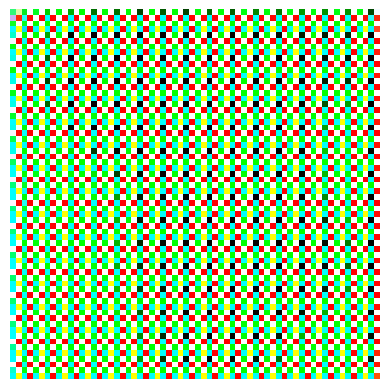

Epoch 4641, Generator Loss: 10.8435, Discriminator Loss: 0.0002
Epoch 4642, Generator Loss: 10.8512, Discriminator Loss: 0.0002
Epoch 4643, Generator Loss: 10.8104, Discriminator Loss: 0.0003
Epoch 4644, Generator Loss: 10.7739, Discriminator Loss: 0.0003
Epoch 4645, Generator Loss: 10.7945, Discriminator Loss: 0.0002
Epoch 4646, Generator Loss: 10.7679, Discriminator Loss: 0.0002
Epoch 4647, Generator Loss: 10.7623, Discriminator Loss: 0.0002
Epoch 4648, Generator Loss: 10.7494, Discriminator Loss: 0.0002
Epoch 4649, Generator Loss: 10.7544, Discriminator Loss: 0.0002
Epoch 4650, Generator Loss: 10.7639, Discriminator Loss: 0.0002


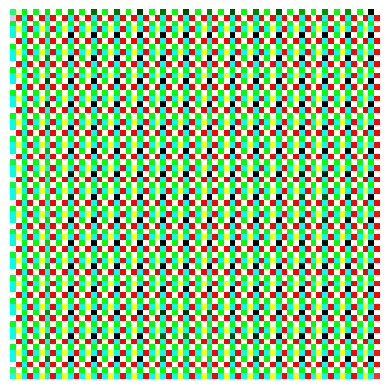

Epoch 4651, Generator Loss: 10.6838, Discriminator Loss: 0.0002
Epoch 4652, Generator Loss: 10.6374, Discriminator Loss: 0.0003
Epoch 4653, Generator Loss: 10.6151, Discriminator Loss: 0.0002
Epoch 4654, Generator Loss: 10.6373, Discriminator Loss: 0.0002
Epoch 4655, Generator Loss: 10.5975, Discriminator Loss: 0.0002
Epoch 4656, Generator Loss: 10.6057, Discriminator Loss: 0.0002
Epoch 4657, Generator Loss: 10.6303, Discriminator Loss: 0.0002
Epoch 4658, Generator Loss: 10.5479, Discriminator Loss: 0.0001
Epoch 4659, Generator Loss: 10.6062, Discriminator Loss: 0.0002
Epoch 4660, Generator Loss: 10.5482, Discriminator Loss: 0.0002


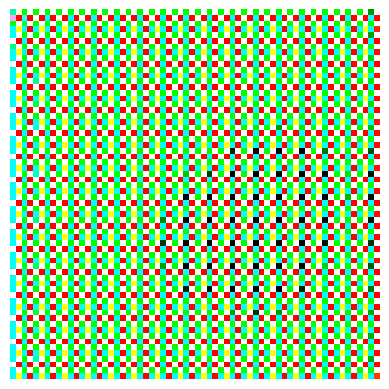

Epoch 4661, Generator Loss: 10.5366, Discriminator Loss: 0.0002
Epoch 4662, Generator Loss: 10.4967, Discriminator Loss: 0.0002
Epoch 4663, Generator Loss: 10.5255, Discriminator Loss: 0.0002
Epoch 4664, Generator Loss: 10.4836, Discriminator Loss: 0.0002
Epoch 4665, Generator Loss: 10.4732, Discriminator Loss: 0.0002
Epoch 4666, Generator Loss: 10.4735, Discriminator Loss: 0.0001
Epoch 4667, Generator Loss: 10.4055, Discriminator Loss: 0.0002
Epoch 4668, Generator Loss: 10.4122, Discriminator Loss: 0.0002
Epoch 4669, Generator Loss: 10.3853, Discriminator Loss: 0.0002
Epoch 4670, Generator Loss: 10.3963, Discriminator Loss: 0.0002


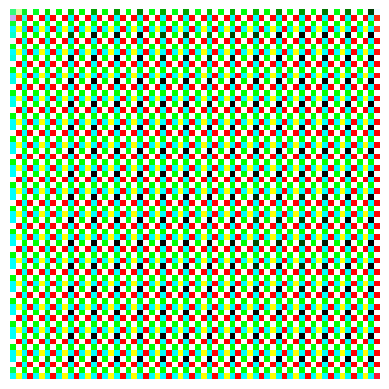

Epoch 4671, Generator Loss: 10.3797, Discriminator Loss: 0.0002
Epoch 4672, Generator Loss: 10.3606, Discriminator Loss: 0.0002
Epoch 4673, Generator Loss: 10.4065, Discriminator Loss: 0.0002
Epoch 4674, Generator Loss: 10.4009, Discriminator Loss: 0.0001
Epoch 4675, Generator Loss: 10.3653, Discriminator Loss: 0.0002
Epoch 4676, Generator Loss: 10.3678, Discriminator Loss: 0.0002
Epoch 4677, Generator Loss: 10.2526, Discriminator Loss: 0.0002
Epoch 4678, Generator Loss: 10.3908, Discriminator Loss: 0.0002
Epoch 4679, Generator Loss: 10.2756, Discriminator Loss: 0.0002
Epoch 4680, Generator Loss: 10.2503, Discriminator Loss: 0.0002


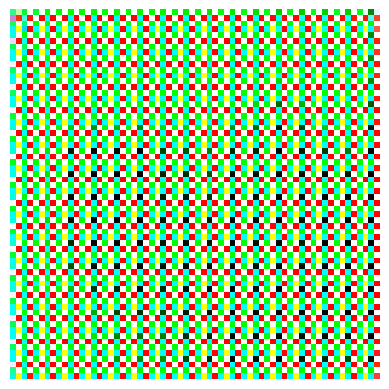

Epoch 4681, Generator Loss: 10.2931, Discriminator Loss: 0.0001
Epoch 4682, Generator Loss: 10.2826, Discriminator Loss: 0.0001
Epoch 4683, Generator Loss: 10.2932, Discriminator Loss: 0.0001
Epoch 4684, Generator Loss: 10.2358, Discriminator Loss: 0.0002
Epoch 4685, Generator Loss: 10.2372, Discriminator Loss: 0.0001
Epoch 4686, Generator Loss: 10.2791, Discriminator Loss: 0.0001
Epoch 4687, Generator Loss: 10.3261, Discriminator Loss: 0.0002
Epoch 4688, Generator Loss: 10.2051, Discriminator Loss: 0.0002
Epoch 4689, Generator Loss: 10.2349, Discriminator Loss: 0.0002
Epoch 4690, Generator Loss: 10.1219, Discriminator Loss: 0.0001


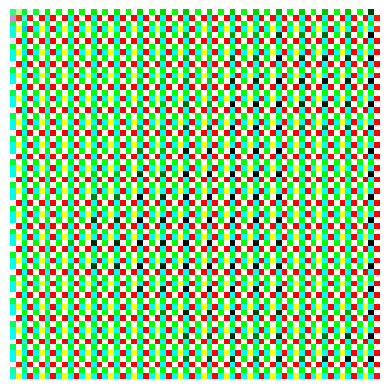

Epoch 4691, Generator Loss: 10.2233, Discriminator Loss: 0.0001
Epoch 4692, Generator Loss: 10.1040, Discriminator Loss: 0.0002
Epoch 4693, Generator Loss: 10.1741, Discriminator Loss: 0.0002
Epoch 4694, Generator Loss: 10.0619, Discriminator Loss: 0.0002
Epoch 4695, Generator Loss: 10.1083, Discriminator Loss: 0.0001
Epoch 4696, Generator Loss: 9.9946, Discriminator Loss: 0.0002
Epoch 4697, Generator Loss: 10.0814, Discriminator Loss: 0.0002
Epoch 4698, Generator Loss: 10.0067, Discriminator Loss: 0.0002
Epoch 4699, Generator Loss: 10.0210, Discriminator Loss: 0.0001
Epoch 4700, Generator Loss: 10.0228, Discriminator Loss: 0.0001


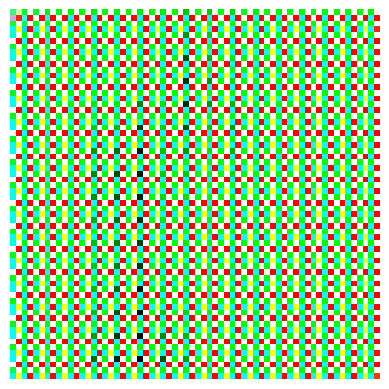

Epoch 4701, Generator Loss: 9.9815, Discriminator Loss: 0.0001
Epoch 4702, Generator Loss: 9.9525, Discriminator Loss: 0.0001
Epoch 4703, Generator Loss: 9.9251, Discriminator Loss: 0.0002
Epoch 4704, Generator Loss: 9.9363, Discriminator Loss: 0.0001
Epoch 4705, Generator Loss: 9.9885, Discriminator Loss: 0.0002
Epoch 4706, Generator Loss: 9.9642, Discriminator Loss: 0.0001
Epoch 4707, Generator Loss: 9.9474, Discriminator Loss: 0.0001
Epoch 4708, Generator Loss: 10.0096, Discriminator Loss: 0.0001
Epoch 4709, Generator Loss: 9.9793, Discriminator Loss: 0.0001
Epoch 4710, Generator Loss: 10.0016, Discriminator Loss: 0.0001


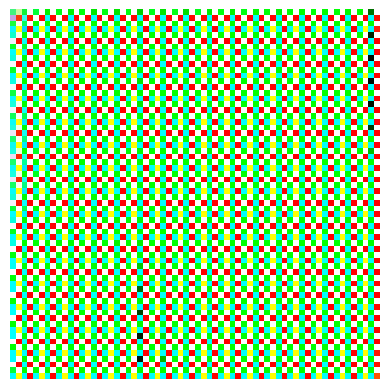

Epoch 4711, Generator Loss: 10.0154, Discriminator Loss: 0.0002
Epoch 4712, Generator Loss: 10.0121, Discriminator Loss: 0.0002
Epoch 4713, Generator Loss: 10.0235, Discriminator Loss: 0.0002
Epoch 4714, Generator Loss: 10.0163, Discriminator Loss: 0.0002
Epoch 4715, Generator Loss: 10.0529, Discriminator Loss: 0.0001
Epoch 4716, Generator Loss: 10.0327, Discriminator Loss: 0.0001
Epoch 4717, Generator Loss: 10.0684, Discriminator Loss: 0.0001
Epoch 4718, Generator Loss: 10.0992, Discriminator Loss: 0.0001
Epoch 4719, Generator Loss: 10.0802, Discriminator Loss: 0.0001
Epoch 4720, Generator Loss: 10.0876, Discriminator Loss: 0.0001


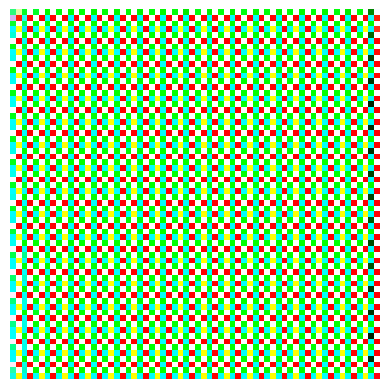

Epoch 4721, Generator Loss: 10.1229, Discriminator Loss: 0.0001
Epoch 4722, Generator Loss: 10.1111, Discriminator Loss: 0.0002
Epoch 4723, Generator Loss: 10.1060, Discriminator Loss: 0.0001
Epoch 4724, Generator Loss: 10.1076, Discriminator Loss: 0.0001
Epoch 4725, Generator Loss: 10.1547, Discriminator Loss: 0.0001
Epoch 4726, Generator Loss: 10.1604, Discriminator Loss: 0.0001
Epoch 4727, Generator Loss: 10.1930, Discriminator Loss: 0.0001
Epoch 4728, Generator Loss: 10.1983, Discriminator Loss: 0.0001
Epoch 4729, Generator Loss: 10.2125, Discriminator Loss: 0.0001
Epoch 4730, Generator Loss: 10.2291, Discriminator Loss: 0.0001


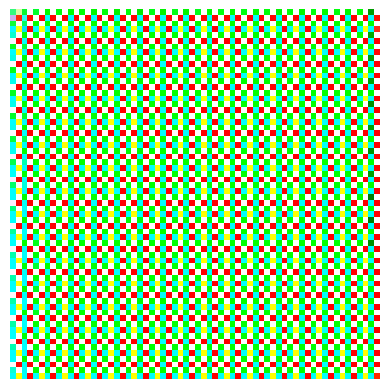

Epoch 4731, Generator Loss: 10.1938, Discriminator Loss: 0.0001
Epoch 4732, Generator Loss: 10.2311, Discriminator Loss: 0.0001
Epoch 4733, Generator Loss: 10.2133, Discriminator Loss: 0.0001
Epoch 4734, Generator Loss: 10.2396, Discriminator Loss: 0.0001
Epoch 4735, Generator Loss: 10.2669, Discriminator Loss: 0.0001
Epoch 4736, Generator Loss: 10.2659, Discriminator Loss: 0.0001
Epoch 4737, Generator Loss: 10.2576, Discriminator Loss: 0.0001
Epoch 4738, Generator Loss: 10.2738, Discriminator Loss: 0.0001
Epoch 4739, Generator Loss: 10.2950, Discriminator Loss: 0.0001
Epoch 4740, Generator Loss: 10.3012, Discriminator Loss: 0.0001


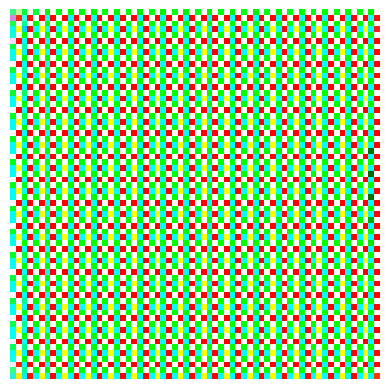

Epoch 4741, Generator Loss: 10.3407, Discriminator Loss: 0.0001
Epoch 4742, Generator Loss: 10.3152, Discriminator Loss: 0.0001
Epoch 4743, Generator Loss: 10.3298, Discriminator Loss: 0.0001
Epoch 4744, Generator Loss: 10.3174, Discriminator Loss: 0.0001
Epoch 4745, Generator Loss: 10.3277, Discriminator Loss: 0.0001
Epoch 4746, Generator Loss: 10.3479, Discriminator Loss: 0.0001
Epoch 4747, Generator Loss: 10.4029, Discriminator Loss: 0.0001
Epoch 4748, Generator Loss: 10.4098, Discriminator Loss: 0.0001
Epoch 4749, Generator Loss: 10.4055, Discriminator Loss: 0.0001
Epoch 4750, Generator Loss: 10.4180, Discriminator Loss: 0.0001


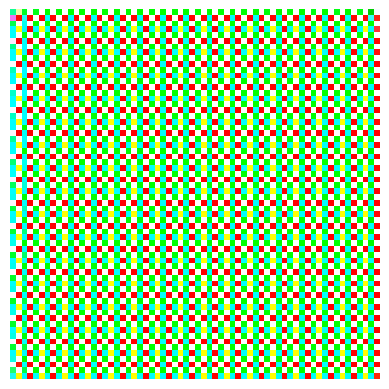

Epoch 4751, Generator Loss: 10.3834, Discriminator Loss: 0.0001
Epoch 4752, Generator Loss: 10.4218, Discriminator Loss: 0.0001
Epoch 4753, Generator Loss: 10.4165, Discriminator Loss: 0.0001
Epoch 4754, Generator Loss: 10.4482, Discriminator Loss: 0.0001
Epoch 4755, Generator Loss: 10.4310, Discriminator Loss: 0.0001
Epoch 4756, Generator Loss: 10.4372, Discriminator Loss: 0.0001
Epoch 4757, Generator Loss: 10.4488, Discriminator Loss: 0.0001
Epoch 4758, Generator Loss: 10.4331, Discriminator Loss: 0.0001
Epoch 4759, Generator Loss: 10.4490, Discriminator Loss: 0.0001
Epoch 4760, Generator Loss: 10.4634, Discriminator Loss: 0.0001


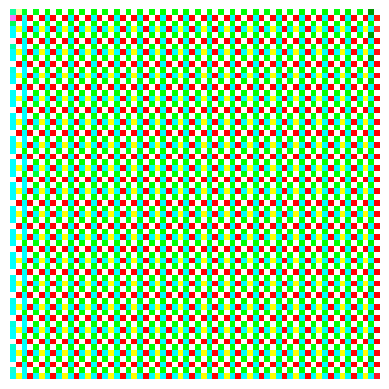

Epoch 4761, Generator Loss: 10.4623, Discriminator Loss: 0.0001
Epoch 4762, Generator Loss: 10.4798, Discriminator Loss: 0.0001
Epoch 4763, Generator Loss: 10.4711, Discriminator Loss: 0.0001
Epoch 4764, Generator Loss: 10.5014, Discriminator Loss: 0.0001
Epoch 4765, Generator Loss: 10.4588, Discriminator Loss: 0.0001
Epoch 4766, Generator Loss: 10.4882, Discriminator Loss: 0.0001
Epoch 4767, Generator Loss: 10.5182, Discriminator Loss: 0.0001
Epoch 4768, Generator Loss: 10.5251, Discriminator Loss: 0.0001
Epoch 4769, Generator Loss: 10.4923, Discriminator Loss: 0.0001
Epoch 4770, Generator Loss: 10.5244, Discriminator Loss: 0.0001


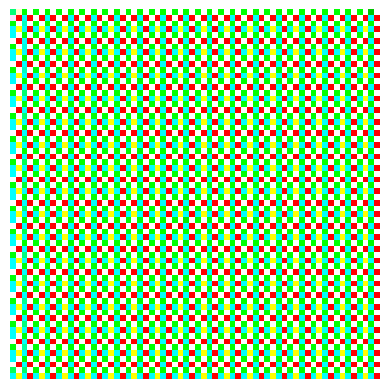

Epoch 4771, Generator Loss: 10.4969, Discriminator Loss: 0.0001
Epoch 4772, Generator Loss: 10.5049, Discriminator Loss: 0.0001
Epoch 4773, Generator Loss: 10.5098, Discriminator Loss: 0.0001
Epoch 4774, Generator Loss: 10.5172, Discriminator Loss: 0.0001
Epoch 4775, Generator Loss: 10.5215, Discriminator Loss: 0.0001
Epoch 4776, Generator Loss: 10.5294, Discriminator Loss: 0.0001
Epoch 4777, Generator Loss: 10.5186, Discriminator Loss: 0.0001
Epoch 4778, Generator Loss: 10.5328, Discriminator Loss: 0.0001
Epoch 4779, Generator Loss: 10.5333, Discriminator Loss: 0.0001
Epoch 4780, Generator Loss: 10.5316, Discriminator Loss: 0.0001


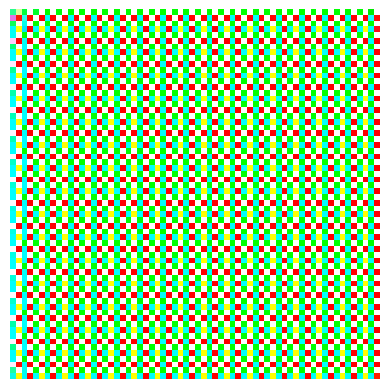

Epoch 4781, Generator Loss: 10.5350, Discriminator Loss: 0.0001
Epoch 4782, Generator Loss: 10.5449, Discriminator Loss: 0.0001
Epoch 4783, Generator Loss: 10.5524, Discriminator Loss: 0.0001
Epoch 4784, Generator Loss: 10.5618, Discriminator Loss: 0.0001
Epoch 4785, Generator Loss: 10.5614, Discriminator Loss: 0.0001
Epoch 4786, Generator Loss: 10.5660, Discriminator Loss: 0.0001
Epoch 4787, Generator Loss: 10.5688, Discriminator Loss: 0.0001
Epoch 4788, Generator Loss: 10.5787, Discriminator Loss: 0.0001
Epoch 4789, Generator Loss: 10.5851, Discriminator Loss: 0.0001
Epoch 4790, Generator Loss: 10.5892, Discriminator Loss: 0.0001


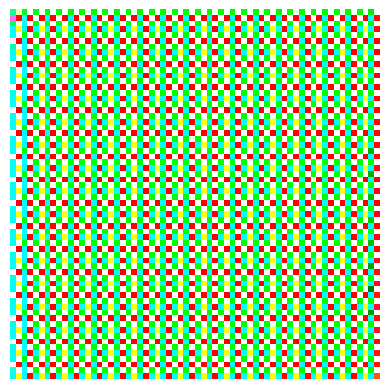

Epoch 4791, Generator Loss: 10.5902, Discriminator Loss: 0.0001
Epoch 4792, Generator Loss: 10.6048, Discriminator Loss: 0.0001
Epoch 4793, Generator Loss: 10.6036, Discriminator Loss: 0.0001
Epoch 4794, Generator Loss: 10.6155, Discriminator Loss: 0.0001
Epoch 4795, Generator Loss: 10.6232, Discriminator Loss: 0.0001
Epoch 4796, Generator Loss: 10.6266, Discriminator Loss: 0.0001
Epoch 4797, Generator Loss: 10.6295, Discriminator Loss: 0.0001
Epoch 4798, Generator Loss: 10.6390, Discriminator Loss: 0.0001
Epoch 4799, Generator Loss: 10.6456, Discriminator Loss: 0.0001
Epoch 4800, Generator Loss: 10.6467, Discriminator Loss: 0.0001


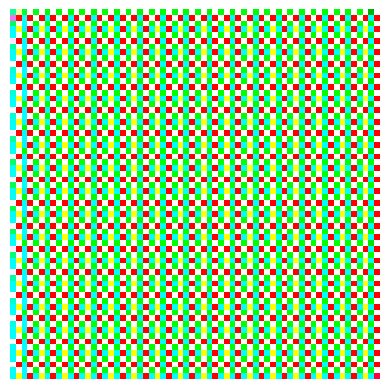

Epoch 4801, Generator Loss: 10.6512, Discriminator Loss: 0.0001
Epoch 4802, Generator Loss: 10.6629, Discriminator Loss: 0.0001
Epoch 4803, Generator Loss: 10.6637, Discriminator Loss: 0.0001
Epoch 4804, Generator Loss: 10.6668, Discriminator Loss: 0.0001
Epoch 4805, Generator Loss: 10.6812, Discriminator Loss: 0.0001
Epoch 4806, Generator Loss: 10.6808, Discriminator Loss: 0.0001
Epoch 4807, Generator Loss: 10.6900, Discriminator Loss: 0.0001
Epoch 4808, Generator Loss: 10.6946, Discriminator Loss: 0.0001
Epoch 4809, Generator Loss: 10.6979, Discriminator Loss: 0.0001
Epoch 4810, Generator Loss: 10.7046, Discriminator Loss: 0.0001


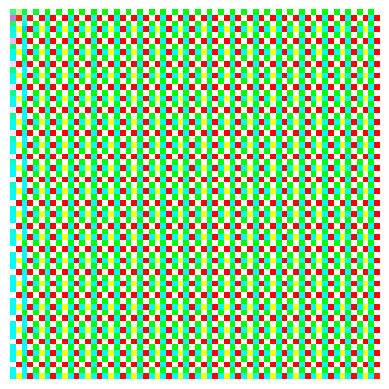

Epoch 4811, Generator Loss: 10.7095, Discriminator Loss: 0.0001
Epoch 4812, Generator Loss: 10.7151, Discriminator Loss: 0.0001
Epoch 4813, Generator Loss: 10.7237, Discriminator Loss: 0.0001
Epoch 4814, Generator Loss: 10.7271, Discriminator Loss: 0.0001
Epoch 4815, Generator Loss: 10.7272, Discriminator Loss: 0.0001
Epoch 4816, Generator Loss: 10.7416, Discriminator Loss: 0.0001
Epoch 4817, Generator Loss: 10.7475, Discriminator Loss: 0.0001
Epoch 4818, Generator Loss: 10.7504, Discriminator Loss: 0.0001
Epoch 4819, Generator Loss: 10.7494, Discriminator Loss: 0.0001
Epoch 4820, Generator Loss: 10.7578, Discriminator Loss: 0.0001


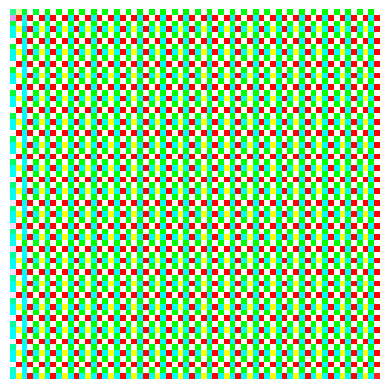

Epoch 4821, Generator Loss: 10.7625, Discriminator Loss: 0.0001
Epoch 4822, Generator Loss: 10.7679, Discriminator Loss: 0.0001
Epoch 4823, Generator Loss: 10.7737, Discriminator Loss: 0.0001
Epoch 4824, Generator Loss: 10.7799, Discriminator Loss: 0.0001
Epoch 4825, Generator Loss: 10.7805, Discriminator Loss: 0.0001
Epoch 4826, Generator Loss: 10.7846, Discriminator Loss: 0.0001
Epoch 4827, Generator Loss: 10.7931, Discriminator Loss: 0.0001
Epoch 4828, Generator Loss: 10.8014, Discriminator Loss: 0.0001
Epoch 4829, Generator Loss: 10.8042, Discriminator Loss: 0.0001
Epoch 4830, Generator Loss: 10.8119, Discriminator Loss: 0.0001


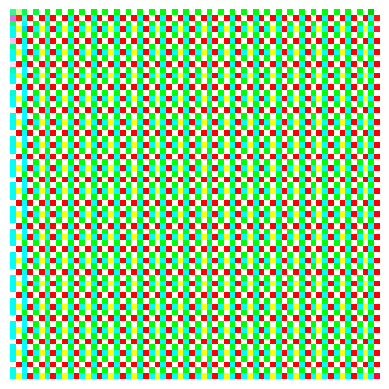

Epoch 4831, Generator Loss: 10.8109, Discriminator Loss: 0.0001
Epoch 4832, Generator Loss: 10.8182, Discriminator Loss: 0.0001
Epoch 4833, Generator Loss: 10.8257, Discriminator Loss: 0.0001
Epoch 4834, Generator Loss: 10.8270, Discriminator Loss: 0.0001
Epoch 4835, Generator Loss: 10.8314, Discriminator Loss: 0.0001
Epoch 4836, Generator Loss: 10.8337, Discriminator Loss: 0.0001
Epoch 4837, Generator Loss: 10.8395, Discriminator Loss: 0.0001
Epoch 4838, Generator Loss: 10.8431, Discriminator Loss: 0.0001
Epoch 4839, Generator Loss: 10.8471, Discriminator Loss: 0.0001
Epoch 4840, Generator Loss: 10.8545, Discriminator Loss: 0.0001


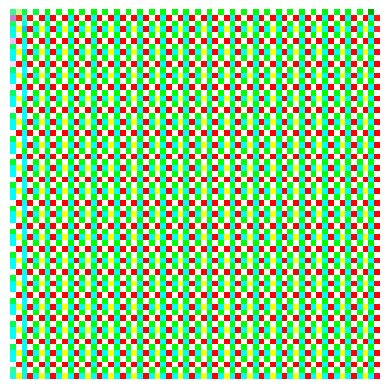

Epoch 4841, Generator Loss: 10.8564, Discriminator Loss: 0.0001
Epoch 4842, Generator Loss: 10.8628, Discriminator Loss: 0.0001
Epoch 4843, Generator Loss: 10.8663, Discriminator Loss: 0.0001
Epoch 4844, Generator Loss: 10.8708, Discriminator Loss: 0.0001
Epoch 4845, Generator Loss: 10.8711, Discriminator Loss: 0.0001
Epoch 4846, Generator Loss: 10.8794, Discriminator Loss: 0.0001
Epoch 4847, Generator Loss: 10.8823, Discriminator Loss: 0.0001
Epoch 4848, Generator Loss: 10.8821, Discriminator Loss: 0.0001
Epoch 4849, Generator Loss: 10.8909, Discriminator Loss: 0.0001
Epoch 4850, Generator Loss: 10.8918, Discriminator Loss: 0.0001


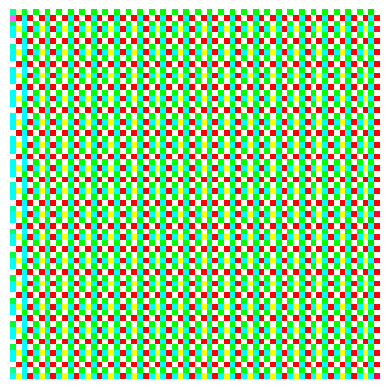

Epoch 4851, Generator Loss: 10.8964, Discriminator Loss: 0.0001
Epoch 4852, Generator Loss: 10.8999, Discriminator Loss: 0.0001
Epoch 4853, Generator Loss: 10.9022, Discriminator Loss: 0.0001
Epoch 4854, Generator Loss: 10.9108, Discriminator Loss: 0.0001
Epoch 4855, Generator Loss: 10.9085, Discriminator Loss: 0.0001
Epoch 4856, Generator Loss: 10.9180, Discriminator Loss: 0.0001
Epoch 4857, Generator Loss: 10.9213, Discriminator Loss: 0.0001
Epoch 4858, Generator Loss: 10.9230, Discriminator Loss: 0.0001
Epoch 4859, Generator Loss: 10.9276, Discriminator Loss: 0.0001
Epoch 4860, Generator Loss: 10.9243, Discriminator Loss: 0.0001


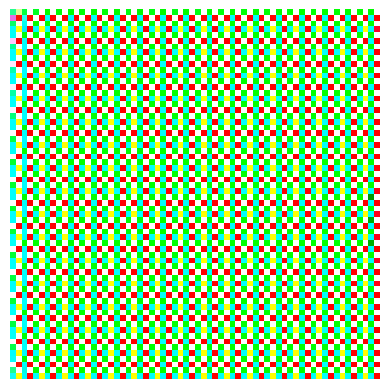

Epoch 4861, Generator Loss: 10.9347, Discriminator Loss: 0.0001
Epoch 4862, Generator Loss: 10.9414, Discriminator Loss: 0.0001
Epoch 4863, Generator Loss: 10.9419, Discriminator Loss: 0.0001
Epoch 4864, Generator Loss: 10.9483, Discriminator Loss: 0.0001
Epoch 4865, Generator Loss: 10.9481, Discriminator Loss: 0.0001
Epoch 4866, Generator Loss: 10.9545, Discriminator Loss: 0.0001
Epoch 4867, Generator Loss: 10.9536, Discriminator Loss: 0.0001
Epoch 4868, Generator Loss: 10.9592, Discriminator Loss: 0.0001
Epoch 4869, Generator Loss: 10.9578, Discriminator Loss: 0.0001
Epoch 4870, Generator Loss: 10.9617, Discriminator Loss: 0.0001


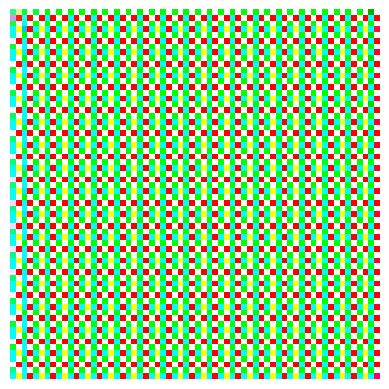

Epoch 4871, Generator Loss: 10.9677, Discriminator Loss: 0.0001
Epoch 4872, Generator Loss: 10.9747, Discriminator Loss: 0.0001
Epoch 4873, Generator Loss: 10.9758, Discriminator Loss: 0.0001
Epoch 4874, Generator Loss: 10.9717, Discriminator Loss: 0.0001
Epoch 4875, Generator Loss: 10.9773, Discriminator Loss: 0.0001
Epoch 4876, Generator Loss: 10.9807, Discriminator Loss: 0.0001
Epoch 4877, Generator Loss: 10.9840, Discriminator Loss: 0.0001
Epoch 4878, Generator Loss: 10.9808, Discriminator Loss: 0.0001
Epoch 4879, Generator Loss: 10.9903, Discriminator Loss: 0.0001
Epoch 4880, Generator Loss: 10.9825, Discriminator Loss: 0.0001


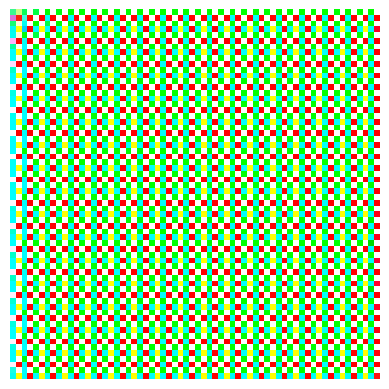

Epoch 4881, Generator Loss: 10.9919, Discriminator Loss: 0.0001
Epoch 4882, Generator Loss: 10.9943, Discriminator Loss: 0.0001
Epoch 4883, Generator Loss: 10.9923, Discriminator Loss: 0.0001
Epoch 4884, Generator Loss: 10.9938, Discriminator Loss: 0.0001
Epoch 4885, Generator Loss: 10.9934, Discriminator Loss: 0.0001
Epoch 4886, Generator Loss: 10.9979, Discriminator Loss: 0.0001
Epoch 4887, Generator Loss: 10.9981, Discriminator Loss: 0.0001
Epoch 4888, Generator Loss: 11.0071, Discriminator Loss: 0.0001
Epoch 4889, Generator Loss: 10.9981, Discriminator Loss: 0.0001
Epoch 4890, Generator Loss: 10.9951, Discriminator Loss: 0.0001


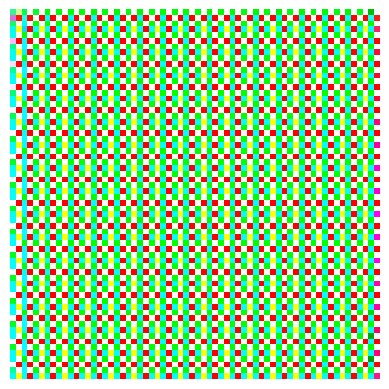

Epoch 4891, Generator Loss: 11.0019, Discriminator Loss: 0.0001
Epoch 4892, Generator Loss: 11.0081, Discriminator Loss: 0.0001
Epoch 4893, Generator Loss: 11.0127, Discriminator Loss: 0.0001
Epoch 4894, Generator Loss: 11.0050, Discriminator Loss: 0.0001
Epoch 4895, Generator Loss: 11.0201, Discriminator Loss: 0.0001
Epoch 4896, Generator Loss: 10.9940, Discriminator Loss: 0.0001
Epoch 4897, Generator Loss: 10.9877, Discriminator Loss: 0.0001
Epoch 4898, Generator Loss: 11.0025, Discriminator Loss: 0.0001
Epoch 4899, Generator Loss: 11.0029, Discriminator Loss: 0.0001
Epoch 4900, Generator Loss: 11.0079, Discriminator Loss: 0.0001


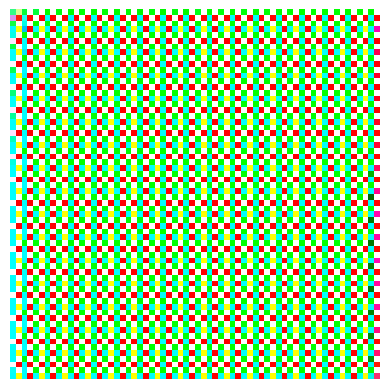

Epoch 4901, Generator Loss: 11.0122, Discriminator Loss: 0.0001
Epoch 4902, Generator Loss: 11.0266, Discriminator Loss: 0.0001
Epoch 4903, Generator Loss: 11.0227, Discriminator Loss: 0.0001
Epoch 4904, Generator Loss: 11.0307, Discriminator Loss: 0.0000
Epoch 4905, Generator Loss: 11.0094, Discriminator Loss: 0.0001
Epoch 4906, Generator Loss: 11.0069, Discriminator Loss: 0.0001
Epoch 4907, Generator Loss: 11.0222, Discriminator Loss: 0.0001
Epoch 4908, Generator Loss: 11.0332, Discriminator Loss: 0.0001
Epoch 4909, Generator Loss: 11.0296, Discriminator Loss: 0.0001
Epoch 4910, Generator Loss: 11.0323, Discriminator Loss: 0.0001


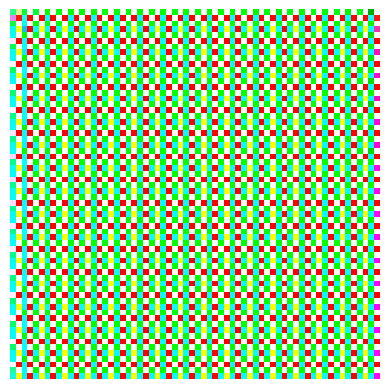

Epoch 4911, Generator Loss: 11.0340, Discriminator Loss: 0.0001
Epoch 4912, Generator Loss: 11.0221, Discriminator Loss: 0.0001
Epoch 4913, Generator Loss: 11.0315, Discriminator Loss: 0.0001
Epoch 4914, Generator Loss: 11.0247, Discriminator Loss: 0.0001
Epoch 4915, Generator Loss: 11.0291, Discriminator Loss: 0.0001
Epoch 4916, Generator Loss: 11.0283, Discriminator Loss: 0.0001
Epoch 4917, Generator Loss: 11.0335, Discriminator Loss: 0.0001
Epoch 4918, Generator Loss: 11.0343, Discriminator Loss: 0.0001
Epoch 4919, Generator Loss: 11.0348, Discriminator Loss: 0.0001
Epoch 4920, Generator Loss: 11.0385, Discriminator Loss: 0.0001


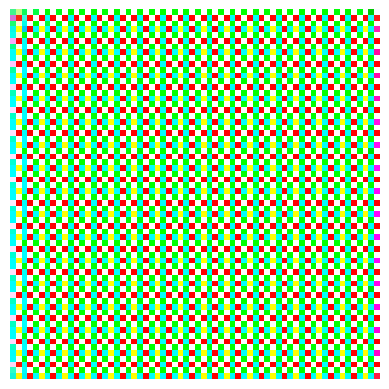

Epoch 4921, Generator Loss: 11.0426, Discriminator Loss: 0.0001
Epoch 4922, Generator Loss: 11.0407, Discriminator Loss: 0.0001
Epoch 4923, Generator Loss: 11.0457, Discriminator Loss: 0.0001
Epoch 4924, Generator Loss: 11.0481, Discriminator Loss: 0.0001
Epoch 4925, Generator Loss: 11.0462, Discriminator Loss: 0.0001
Epoch 4926, Generator Loss: 11.0534, Discriminator Loss: 0.0001
Epoch 4927, Generator Loss: 11.0506, Discriminator Loss: 0.0001
Epoch 4928, Generator Loss: 11.0556, Discriminator Loss: 0.0001
Epoch 4929, Generator Loss: 11.0602, Discriminator Loss: 0.0001
Epoch 4930, Generator Loss: 11.0640, Discriminator Loss: 0.0001


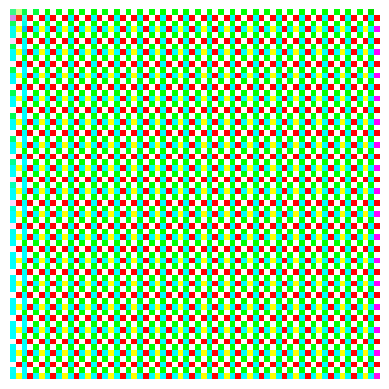

Epoch 4931, Generator Loss: 11.0594, Discriminator Loss: 0.0001
Epoch 4932, Generator Loss: 11.0713, Discriminator Loss: 0.0001
Epoch 4933, Generator Loss: 11.0705, Discriminator Loss: 0.0000
Epoch 4934, Generator Loss: 11.0717, Discriminator Loss: 0.0001
Epoch 4935, Generator Loss: 11.0781, Discriminator Loss: 0.0001
Epoch 4936, Generator Loss: 11.0790, Discriminator Loss: 0.0001
Epoch 4937, Generator Loss: 11.0860, Discriminator Loss: 0.0001
Epoch 4938, Generator Loss: 11.0861, Discriminator Loss: 0.0001
Epoch 4939, Generator Loss: 11.0975, Discriminator Loss: 0.0001
Epoch 4940, Generator Loss: 11.0956, Discriminator Loss: 0.0001


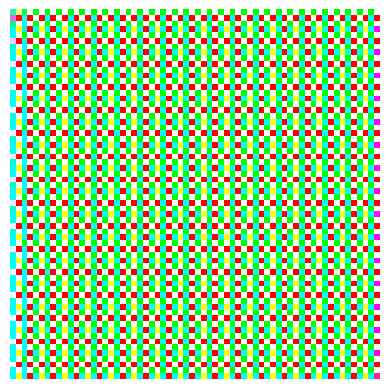

Epoch 4941, Generator Loss: 11.1043, Discriminator Loss: 0.0001
Epoch 4942, Generator Loss: 11.1045, Discriminator Loss: 0.0001
Epoch 4943, Generator Loss: 11.1051, Discriminator Loss: 0.0001
Epoch 4944, Generator Loss: 11.1042, Discriminator Loss: 0.0001
Epoch 4945, Generator Loss: 11.1084, Discriminator Loss: 0.0001
Epoch 4946, Generator Loss: 11.1223, Discriminator Loss: 0.0001
Epoch 4947, Generator Loss: 11.1157, Discriminator Loss: 0.0001
Epoch 4948, Generator Loss: 11.1210, Discriminator Loss: 0.0001
Epoch 4949, Generator Loss: 11.1209, Discriminator Loss: 0.0000
Epoch 4950, Generator Loss: 11.1202, Discriminator Loss: 0.0000


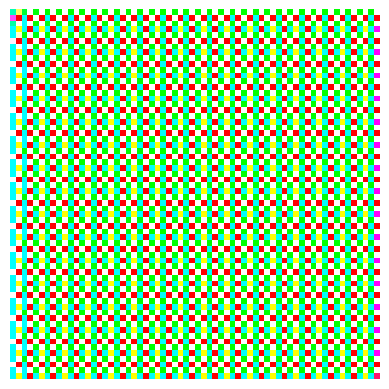

Epoch 4951, Generator Loss: 11.1204, Discriminator Loss: 0.0001
Epoch 4952, Generator Loss: 11.1279, Discriminator Loss: 0.0001
Epoch 4953, Generator Loss: 11.1271, Discriminator Loss: 0.0001
Epoch 4954, Generator Loss: 11.1389, Discriminator Loss: 0.0001
Epoch 4955, Generator Loss: 11.1391, Discriminator Loss: 0.0001
Epoch 4956, Generator Loss: 11.1369, Discriminator Loss: 0.0000
Epoch 4957, Generator Loss: 11.1482, Discriminator Loss: 0.0000
Epoch 4958, Generator Loss: 11.1436, Discriminator Loss: 0.0001
Epoch 4959, Generator Loss: 11.1414, Discriminator Loss: 0.0001
Epoch 4960, Generator Loss: 11.1454, Discriminator Loss: 0.0001


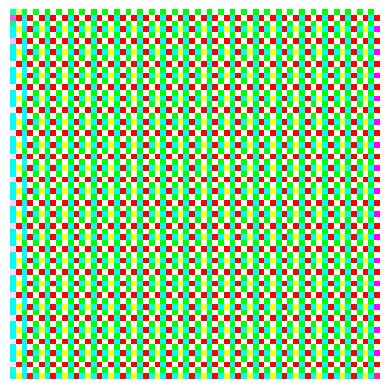

Epoch 4961, Generator Loss: 11.1460, Discriminator Loss: 0.0001
Epoch 4962, Generator Loss: 11.1558, Discriminator Loss: 0.0000
Epoch 4963, Generator Loss: 11.1650, Discriminator Loss: 0.0001
Epoch 4964, Generator Loss: 11.1265, Discriminator Loss: 0.0001
Epoch 4965, Generator Loss: 11.1522, Discriminator Loss: 0.0001
Epoch 4966, Generator Loss: 11.1278, Discriminator Loss: 0.0000
Epoch 4967, Generator Loss: 11.1402, Discriminator Loss: 0.0001
Epoch 4968, Generator Loss: 11.1156, Discriminator Loss: 0.0001
Epoch 4969, Generator Loss: 11.0955, Discriminator Loss: 0.0001
Epoch 4970, Generator Loss: 11.1225, Discriminator Loss: 0.0001


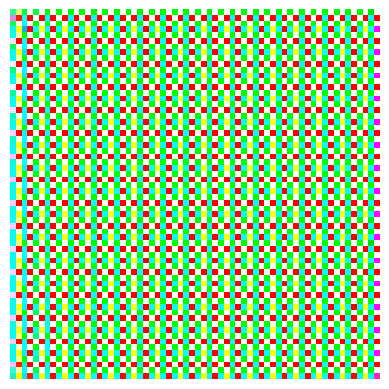

Epoch 4971, Generator Loss: 11.0706, Discriminator Loss: 0.0001
Epoch 4972, Generator Loss: 11.1143, Discriminator Loss: 0.0000
Epoch 4973, Generator Loss: 11.0800, Discriminator Loss: 0.0001
Epoch 4974, Generator Loss: 11.1019, Discriminator Loss: 0.0000
Epoch 4975, Generator Loss: 11.0484, Discriminator Loss: 0.0001
Epoch 4976, Generator Loss: 11.0168, Discriminator Loss: 0.0001
Epoch 4977, Generator Loss: 10.9873, Discriminator Loss: 0.0001
Epoch 4978, Generator Loss: 10.9403, Discriminator Loss: 0.0001
Epoch 4979, Generator Loss: 10.9213, Discriminator Loss: 0.0001
Epoch 4980, Generator Loss: 10.8534, Discriminator Loss: 0.0001


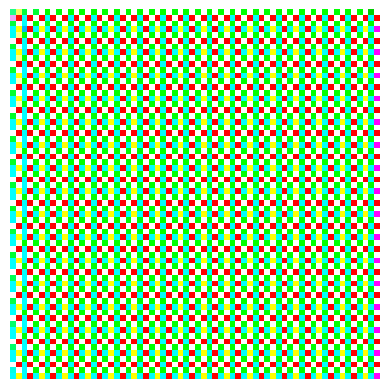

Epoch 4981, Generator Loss: 10.8719, Discriminator Loss: 0.0001
Epoch 4982, Generator Loss: 10.7660, Discriminator Loss: 0.0001
Epoch 4983, Generator Loss: 10.7515, Discriminator Loss: 0.0001
Epoch 4984, Generator Loss: 10.8280, Discriminator Loss: 0.0001
Epoch 4985, Generator Loss: 10.7368, Discriminator Loss: 0.0001
Epoch 4986, Generator Loss: 10.7782, Discriminator Loss: 0.0001
Epoch 4987, Generator Loss: 10.6715, Discriminator Loss: 0.0001
Epoch 4988, Generator Loss: 10.6626, Discriminator Loss: 0.0001
Epoch 4989, Generator Loss: 10.6221, Discriminator Loss: 0.0001
Epoch 4990, Generator Loss: 10.4258, Discriminator Loss: 0.0001


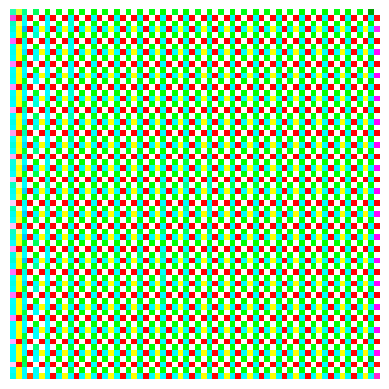

Epoch 4991, Generator Loss: 10.3756, Discriminator Loss: 0.0001
Epoch 4992, Generator Loss: 10.3465, Discriminator Loss: 0.0001
Epoch 4993, Generator Loss: 10.4130, Discriminator Loss: 0.0001
Epoch 4994, Generator Loss: 10.3934, Discriminator Loss: 0.0001
Epoch 4995, Generator Loss: 10.1384, Discriminator Loss: 0.0001
Epoch 4996, Generator Loss: 10.1241, Discriminator Loss: 0.0001
Epoch 4997, Generator Loss: 9.8797, Discriminator Loss: 0.0001
Epoch 4998, Generator Loss: 9.8116, Discriminator Loss: 0.0001
Epoch 4999, Generator Loss: 9.9688, Discriminator Loss: 0.0001
Epoch 5000, Generator Loss: 9.9111, Discriminator Loss: 0.0001


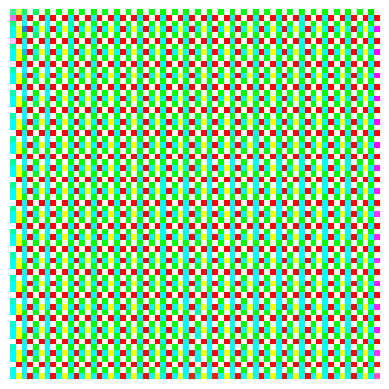

In [104]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
import matplotlib.pyplot as plt

# Reset TensorFlow session to avoid session-related issues
tf.keras.backend.clear_session()

class CustomGAN:
    def __init__(self, batch_size, latent_space, image_shape, kernel_size):
        self.batch_size = batch_size
        self.latent_space = latent_space
        self.image_shape = image_shape
        self.kernel_size = kernel_size
        self.cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    def data(self, images):
        # Store the images for training
        self.images = images

    def build_discriminator(self):
        # Build the discriminator model
        inputs = layers.Input(shape=self.image_shape)
        x = layers.Conv2D(64, kernel_size=self.kernel_size, strides=2, padding='same')(inputs)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Conv2D(128, kernel_size=self.kernel_size, strides=2, padding='same')(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Flatten()(x)
        outputs = layers.Dense(1, activation='sigmoid')(x)

        self.discriminator = models.Model(inputs, outputs)
        return self.discriminator

    def build_generator(self):
        # Build the generator model
        inputs = layers.Input(shape=(self.latent_space,))
        x = layers.Dense(8 * 8 * 128)(inputs)
        x = layers.Reshape((8, 8, 128))(x)
        x = layers.Conv2DTranspose(128, kernel_size=self.kernel_size, strides=2, padding='same')(x)
        x = layers.ReLU()(x)
        x = layers.Conv2DTranspose(64, kernel_size=self.kernel_size, strides=2, padding='same')(x)
        x = layers.ReLU()(x)
        x = layers.Conv2DTranspose(32, kernel_size=self.kernel_size, strides=2, padding='same')(x)
        outputs = layers.Conv2DTranspose(3, kernel_size=self.kernel_size, activation='sigmoid', padding='same')(x)

        self.generator = models.Model(inputs, outputs)
        return self.generator

    def discriminator_loss(self, real_output, fake_output):
        real_loss = self.cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = self.cross_entropy(tf.zeros_like(fake_output), fake_output)
        return real_loss + fake_loss

    def generator_loss(self, fake_output):
        return self.cross_entropy(tf.ones_like(fake_output), fake_output)

    def train_step(self, images, generator, discriminator, generator_optimizer, discriminator_optimizer):
        noise = tf.random.normal([self.batch_size, self.latent_space])

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = generator(noise, training=True)

            real_output = discriminator(images, training=True)
            fake_output = discriminator(generated_images, training=True)

            gen_loss = self.generator_loss(fake_output)
            disc_loss = self.discriminator_loss(real_output, fake_output)

        gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

        generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

        return gen_loss, disc_loss

    def train_gan(self, generator, discriminator, epochs, generator_optimizer, discriminator_optimizer):
        for epoch in range(epochs):
            indices = np.random.randint(0, len(self.images), size=self.batch_size)
            real_images = self.images[indices]

            gen_loss, disc_loss = self.train_step(real_images, generator, discriminator, generator_optimizer, discriminator_optimizer)

            print(f"Epoch {epoch+1}, Generator Loss: {gen_loss:.4f}, Discriminator Loss: {disc_loss:.4f}")
            
            # Visualize one generated image every 10 epochs
            if (epoch + 1) % 10 == 0:
                noise = tf.random.normal([1, self.latent_space])  # Generate only one image
                generated_image = generator(noise, training=False)[0]  # Get the first (and only) image

                plt.imshow(generated_image)
                plt.axis('off')
                plt.show()

# Instantiate the custom GAN class
custom_gan = CustomGAN(batch_size=32, latent_space=100, image_shape=(64, 64, 3), kernel_size=5)

# Load some dummy data for debugging (replace with actual dataset)
images = np.random.rand(1000, 64, 64, 3)

# Pass the data to the GAN class
custom_gan.data(images)

# Build the models
discriminator = custom_gan.build_discriminator()
generator = custom_gan.build_generator()

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Train the GAN for a few epochs (debugging phase)
custom_gan.train_gan(generator, discriminator, epochs=5000, generator_optimizer=generator_optimizer, discriminator_optimizer=discriminator_optimizer)
